In [ ]:
import numpy as np
from math import sqrt
import missingno as msno
from tqdm import tqdm
import os

import warnings # 불필요한 경고문 삭제
warnings.filterwarnings(action='ignore')

from matplotlib import pyplot
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from pandas import to_datetime, to_timedelta, date_range

#tensorflow 2.0
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, LSTM
from tensorflow.keras.optimizers import SGD, Adam, Adamax, Adagrad, RMSprop, Nadam
from keras.layers.advanced_activations import LeakyReLU, PReLU
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler, Normalizer
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from keras.callbacks import EarlyStopping

In [ ]:
df = pd.read_excel('duck.xlsx')

In [ ]:
df

,data:time,C001,C002,C003,C004,C005,C006,C007,C008,강수량,Unnamed: 10
0,2018-11-13 18:00:00,NaN,NaN,29.772457,29.391930,NaN,NaN,29.859067,26.046067,NaN,NaN
1,2018-11-13 18:10:00,NaN,NaN,29.770243,29.377716,NaN,NaN,29.858153,26.043153,NaN,NaN
2,2018-11-13 18:20:00,NaN,NaN,29.770237,29.382110,NaN,NaN,29.855647,26.042447,NaN,NaN
3,2018-11-13 18:30:00,NaN,NaN,29.769605,29.387179,NaN,NaN,29.855415,26.042415,NaN,NaN
4,2018-11-13 18:40:00,NaN,NaN,29.768501,29.390675,NaN,NaN,29.858911,26.044011,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
132326,2021-05-20 16:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
132327,2021-05-20 16:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
132328,2021-05-20 16:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
132329,2021-05-20 16:50:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132331 entries, 0 to 132330
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   data:time    132331 non-null  datetime64[ns]
 1   C001         85203 non-null   float64       
 2   C002         81059 non-null   float64       
 3   C003         110098 non-null  float64       
 4   C004         109277 non-null  float64       
 5   C005         74587 non-null   float64       
 6   C006         76464 non-null   float64       
 7   C007         35236 non-null   float64       
 8   C008         38317 non-null   float64       
 9   강수량          757 non-null     float64       
 10  Unnamed: 10  1 non-null       float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 11.1 MB


<AxesSubplot:>

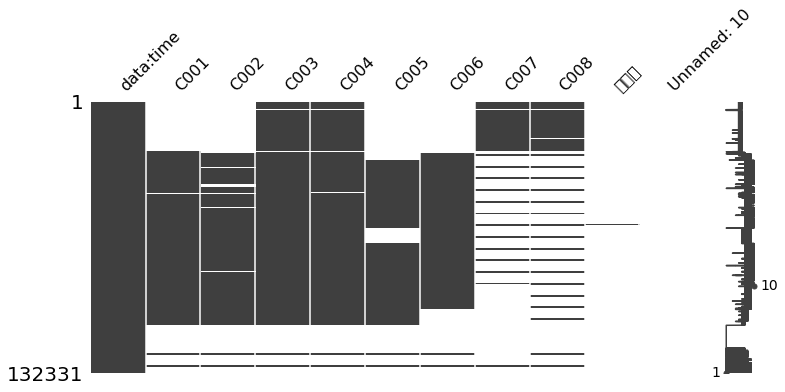

In [ ]:
import missingno as msno

msno.matrix(df, figsize=(12,5))

In [ ]:
_date = df[df.columns[0]]
_range = date_range(start = _date[0], end = _date[len(_date)-1], freq='10min')
df.set_index(df.columns[0],inplace=True)
_df = df.reindex(_range)

In [ ]:
_df = _df.drop([_df.columns[-1]], axis=1)
_df.rename(columns={'강수량':'rain'})

,C001,C002,C003,C004,C005,C006,C007,C008,rain
2018-11-13 18:00:00,NaN,NaN,29.772457,29.391930,NaN,NaN,29.859067,26.046067,NaN
2018-11-13 18:10:00,NaN,NaN,29.770243,29.377716,NaN,NaN,29.858153,26.043153,NaN
2018-11-13 18:20:00,NaN,NaN,29.770237,29.382110,NaN,NaN,29.855647,26.042447,NaN
2018-11-13 18:30:00,NaN,NaN,29.769605,29.387179,NaN,NaN,29.855415,26.042415,NaN
2018-11-13 18:40:00,NaN,NaN,29.768501,29.390675,NaN,NaN,29.858911,26.044011,NaN
...,...,...,...,...,...,...,...,...,...
2021-05-20 16:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-05-20 16:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-05-20 16:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-05-20 16:50:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# 수위가 모두 null값이 아닌 행들
df[df.columns[:-2]][df[df.columns[:-2]].notnull().sum(1) == 8]

,C001,C002,C003,C004,C005,C006,C007,C008
data:time,,,,,,,,
2019-05-31 03:00:00,23.600042,22.653823,27.431042,27.542716,26.467852,26.484808,27.54,23.64
2019-05-31 04:00:00,23.607723,22.859003,27.441623,27.559196,26.503603,26.509389,27.56,23.65
2019-05-31 05:00:00,23.479363,22.631544,27.448463,27.571037,26.536038,26.521729,27.57,23.60
2019-05-31 06:00:00,23.501642,22.448923,27.452542,27.530015,26.555468,26.429808,27.57,23.57
2019-05-31 07:00:00,23.532391,22.489172,27.454691,27.512465,26.548488,26.410757,27.56,23.59
...,...,...,...,...,...,...,...,...
2021-05-20 13:00:00,24.990000,22.710000,29.050000,29.090000,26.420000,27.960000,26.28,24.00
2021-05-20 14:00:00,24.980000,22.600000,29.060000,29.100000,26.440000,27.960000,26.29,24.00
2021-05-20 15:00:00,24.960000,22.580000,29.060000,29.100000,26.450000,27.940000,26.29,23.99


In [ ]:
# 수위가 모두 null값인 행들
_df.iloc[:, :-1][_df[_df.columns[:-1]].isnull().sum(1) == 8]

,C001,C002,C003,C004,C005,C006,C007,C008
2018-12-11 09:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12-11 09:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12-11 09:50:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12-11 10:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12-11 10:10:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2021-05-20 16:10:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-05-20 16:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-05-20 16:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-05-20 16:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
for i in _df.columns:
  print(i, '기록 시작 시각 :', _df[_df[i].notnull()].index[0])

C001 기록 시작 시각 : 2019-05-02 20:50:00
C002 기록 시작 시각 : 2019-05-09 21:20:00
C003 기록 시작 시각 : 2018-11-13 18:00:00
C004 기록 시작 시각 : 2018-11-13 18:00:00
C005 기록 시작 시각 : 2019-05-30 10:20:00
C006 기록 시작 시각 : 2019-05-09 21:20:00
C007 기록 시작 시각 : 2018-11-13 18:00:00
C008 기록 시작 시각 : 2018-11-13 18:00:00
강수량 기록 시작 시각 : 2018-11-14 00:00:00


In [ ]:
# 10분 단위 기록
__df = _df.reset_index()
for i in __df.columns[1:9]:
  __df['index2'] = __df[__df[i].notnull() == True][['index']].shift(-1)
  __df['index3'] = __df[__df[i].notnull() == True][['index']].shift(-2)
  print(f'{i}의 1시간 단위 변환 시작 시각 :', pd.Timestamp(__df[(__df['index2'] - __df['index'] == pd.Timedelta(hours=1)) & (__df['index3'] - __df['index2'] == pd.Timedelta(hours=1))]['index'].values[0]))

C001의 1시간 단위 변환 시작 시각 : 2021-02-24 09:00:00
C002의 1시간 단위 변환 시작 시각 : 2021-02-24 09:00:00
C003의 1시간 단위 변환 시작 시각 : 2021-02-24 10:00:00
C004의 1시간 단위 변환 시작 시각 : 2021-02-24 10:00:00
C005의 1시간 단위 변환 시작 시각 : 2021-02-24 09:00:00
C006의 1시간 단위 변환 시작 시각 : 2021-02-24 09:00:00
C007의 1시간 단위 변환 시작 시각 : 2019-05-04 10:00:00
C008의 1시간 단위 변환 시작 시각 : 2019-05-04 10:00:00


In [ ]:
# 음의 값 변환
for i in __df.columns[1:9]:
    if min(__df[i].values) < 0:
        for j in __df[__df[i] < 0].index:
            __df.loc[j, i] = abs(__df.loc[j, i])

In [ ]:
trans_df_h = pd.DataFrame()
trans_df = pd.DataFrame()

In [ ]:
# 1시간 단위로 변환
__df['강수량'] = __df['강수량'].fillna(0)
for j, i in tqdm(enumerate(__df.groupby(by = [__df['index'].dt.year, __df['index'].dt.month, __df['index'].dt.day, __df['index'].dt.hour]))):
  trans_df_h.loc[j, 'date'] = to_datetime(str(i[0][0]) + '-' + str(i[0][1]) + '-' + str(i[0][2]) + ' ' + str(i[0][3]).zfill(2), format='%Y-%m-%d %H')
  for k in __df.columns[1:9]:
      try:
        trans_df_h.loc[j, k] = sum(i[1][k][i[1][k].notnull()])/len(i[1][k][i[1][k].notnull()])
      except:
        trans_df_h.loc[j, k] = np.nan
  trans_df_h.loc[j, 'rain'] = sum(i[1]['강수량'].values)

22056it [07:41, 47.80it/s]


In [ ]:
# 1일 단위로 변환
for j, i in tqdm(enumerate(trans_df_h.groupby(by = [trans_df_h.date.dt.year, trans_df_h.date.dt.month, trans_df_h.date.dt.day]))):
  trans_df.loc[j, '_date'] = to_datetime(str(i[0][0]) + '-' + str(i[0][1]) + '-' + str(i[0][2]), format='%Y-%m-%d')
  for k in trans_df_h.columns[1:9]:
    try:
      trans_df.loc[j, k] = sum(i[1][k][i[1][k].notnull()])/len(i[1][k][i[1][k].notnull()])
    except:
      trans_df.loc[j, k] = np.nan
  trans_df.loc[j, 'rain'] = sum(i[1]['rain'].values)

920it [00:18, 50.51it/s]


In [ ]:
trans_df

,_date,C001,C002,C003,C004,C005,C006,C007,C008,rain
0,2018-11-13,NaN,NaN,29.762949,29.374598,NaN,NaN,29.857251,26.035976,0.0
1,2018-11-14,NaN,NaN,29.753466,29.450510,NaN,NaN,29.855676,26.032637,0.0
2,2018-11-15,NaN,NaN,29.764339,29.542585,NaN,NaN,29.873859,25.936289,0.0
3,2018-11-16,NaN,NaN,29.853032,29.654344,NaN,NaN,29.973508,25.297936,0.0
4,2018-11-17,NaN,NaN,29.841348,29.599985,NaN,NaN,29.936141,25.352791,0.0
...,...,...,...,...,...,...,...,...,...,...
915,2021-05-16,24.932500,23.162083,29.016667,29.032500,26.361667,27.877500,26.406667,26.200000,0.0
916,2021-05-17,24.946667,23.171250,28.971250,28.995000,26.299167,27.853750,26.380833,NaN,0.0
917,2021-05-18,24.987917,23.204583,28.965000,29.001667,26.289583,27.875417,26.325833,23.910000,0.0
918,2021-05-19,25.013333,23.225000,28.994167,29.024583,26.325000,27.917917,26.277500,23.983750,0.0


In [ ]:
def save(file):
  file.to_csv("/Users/junei/SODA/20210705/result_saved" + ".csv",header=True,index=False)
  print("결과값이 저장되었습니다.")

In [ ]:
save(trans_df)

결과값이 저장되었습니다.


In [ ]:
trans_df = pd.read_csv('result_saved.csv', encoding = 'euc-kr', parse_dates=['_date'])

In [ ]:
# 관측소별 데이터 프레임 생성
for i in trans_df.columns[1:9]:
  globals() [f'df_{i}'] = trans_df[['_date', i, 'rain']].reset_index(drop = True)

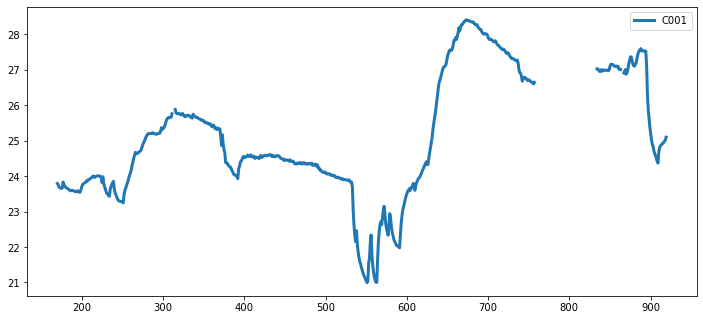

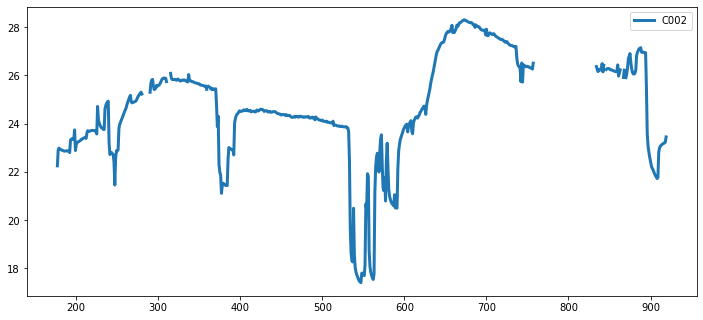

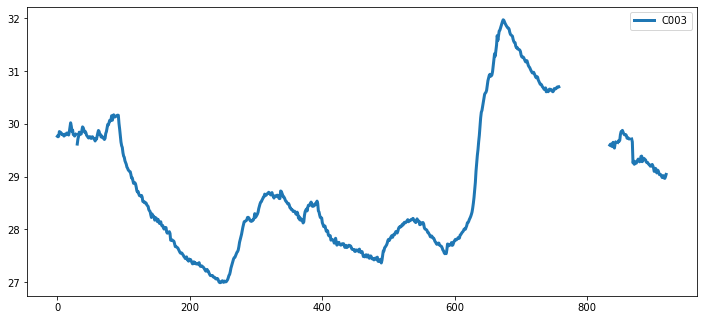

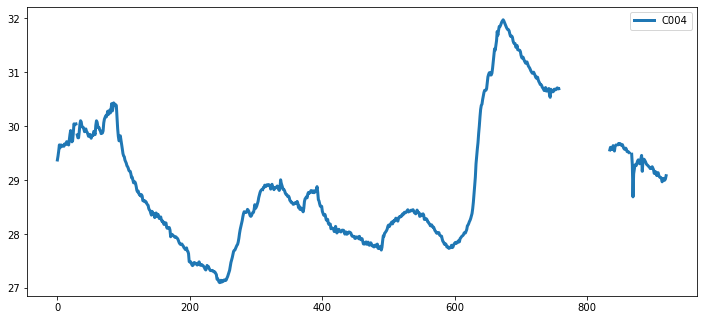

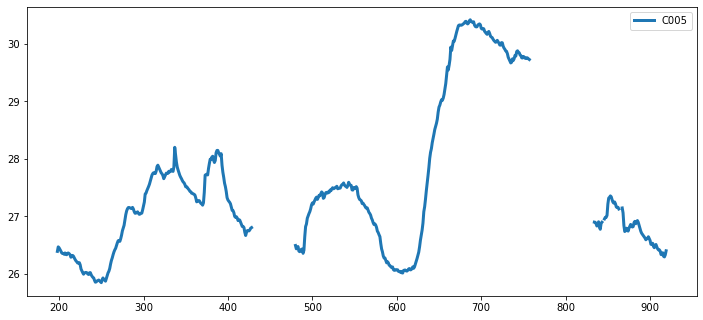

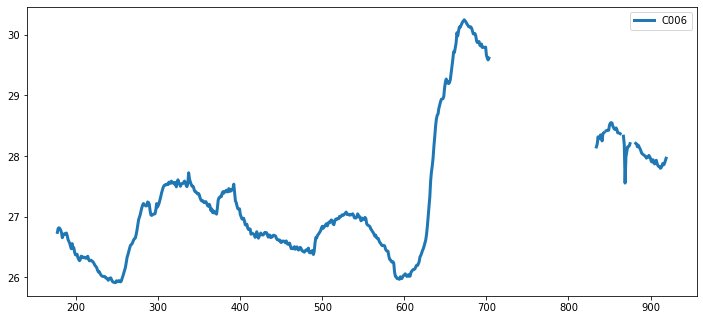

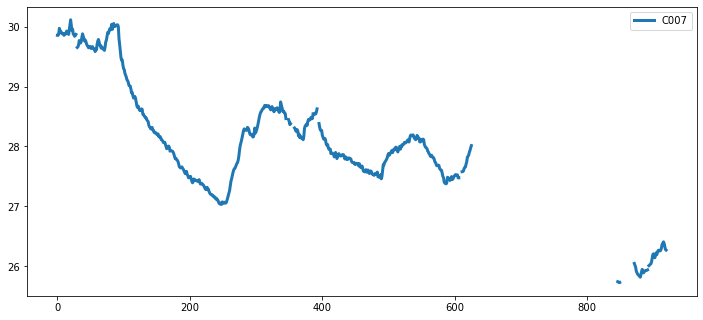

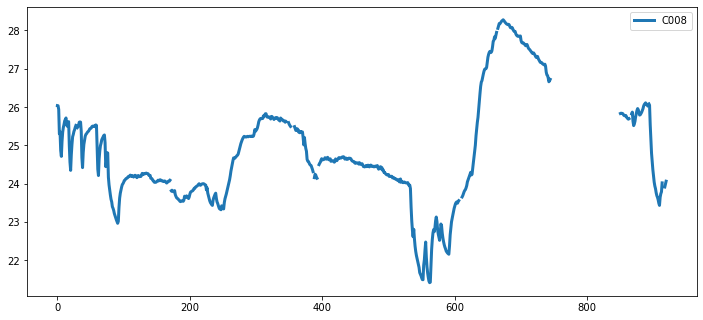

In [ ]:
for i in range(1, 9):
  plt.figure(figsize=[12,50]).add_subplot(8, 1, i)
  plt.plot(trans_df[trans_df.columns[i]], label=f'C00{i}', linewidth=3)
  plt.legend()
  plt.show()

<AxesSubplot:>

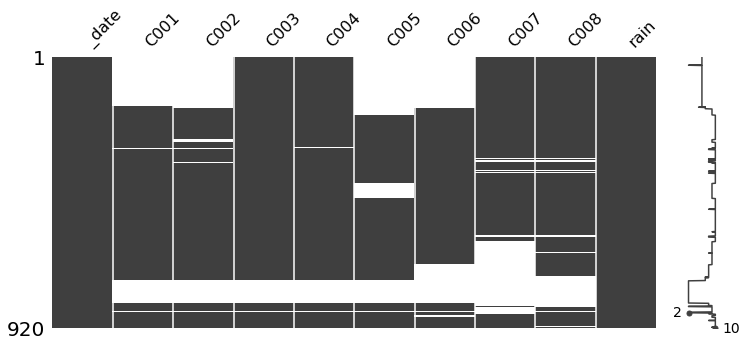

In [ ]:
msno.matrix(trans_df, figsize=(12,5))

In [ ]:
df_C001[df_C001['C001'].isnull()].index

Int64Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
            ...
            829, 830, 831, 832, 833, 844, 845, 864, 865, 866],
           dtype='int64', length=254)

In [ ]:
def data_term(k):
    null_yeah = [j for j in trans_df[trans_df[k].isnull()].index]
    data_yeah = [i for i in trans_df[trans_df[k].notnull()].index]

    print(f"==========\n{k}의 기록 데이터\n==========\n")

    for i in null_yeah:
      if i+1 in data_yeah:
        print("데이터 시작 :", i+1, to_datetime(trans_df.loc[(i + 1), '_date']))
      if i-1 in data_yeah:
        print("데이터 끝 :", i-1, to_datetime(trans_df.loc[(i - 1), '_date']), '\n')

각 관측소 별로 df만들고, 합치기

In [ ]:
# 날짜 기준
def term(k):
  _null = [j for j in trans_df[trans_df[k].isnull()].index]
  _data = [i for i in trans_df[trans_df[k].notnull()].index]  

  _start = [trans_df.loc[_data[0], '_date']]
  _finish = []

  for i in _null:
    if i+1 in _data:
      if trans_df.loc[i + 1, '_date'] == _start[0]:
        pass
      else:
        _start.append(trans_df.loc[i + 1, '_date'])

    if i-1 in _data:
      _finish.append(trans_df.loc[i - 1, '_date'])

  _finish.append(trans_df.loc[_data[-1], '_date'])

  s_df = pd.DataFrame()
  s_df[f'{k}_start'] = _start
  f_df = pd.DataFrame()
  f_df[f'{k}_finish'] = _finish

  a_df = pd.concat([s_df, f_df], axis=1)

  a_df[f'{k}_term'] = a_df[f'{k}_finish'] - a_df[f'{k}_start']

  
  for i in a_df.index:
    try:
      null_term = a_df.loc[i + 1, f'{k}_start'] - a_df.loc[i, f'{k}_finish'] - pd.Timedelta('1 days')
      if null_term == np.datetime64:
        continue
      else:
        a_df.loc[i, f'{k}_null'] = null_term

    except:
      pass

  return a_df

In [ ]:
date_df = pd.DataFrame()

for k in trans_df.columns[1:9]:
  date_df = pd.concat([date_df, term(k)], axis=1)

display(date_df)

,C001_start,C001_finish,C001_term,C001_null,C002_start,C002_finish,C002_term,C002_null,C003_start,C003_finish,...,C006_term,C006_null,C007_start,C007_finish,C007_term,C007_null,C008_start,C008_finish,C008_term,C008_null
0,2019-05-02,2019-09-20,141 days,3 days,2019-05-09,2019-08-20,103 days,9 days,2018-11-13,2018-12-11,...,526 days,130 days,2018-11-13,2018-12-11,28 days,1 days,2018-11-13,2018-12-11,28 days,1 days
1,2019-09-24,2020-12-09,442 days,76 days,2019-08-30,2019-09-19,20 days,4 days,2018-12-13,2020-12-09,...,9 days,2 days,2018-12-13,2019-05-02,140 days,1 days,2018-12-13,2019-05-02,140 days,1 days
2,2021-02-24,2021-03-05,9 days,2 days,2019-09-24,2019-11-07,44 days,1 days,2021-02-24,2021-03-05,...,17 days,3 days,2019-05-04,2019-10-24,173 days,1 days,2019-05-04,2019-10-24,173 days,1 days
3,2021-03-08,2021-03-25,17 days,3 days,2019-11-09,2020-12-09,396 days,76 days,2021-03-08,2021-03-25,...,8 days,6 days,2019-10-26,2019-10-26,0 days,1 days,2019-10-26,2019-10-26,0 days,1 days
4,2021-03-29,2021-05-20,52 days,NaT,2021-02-24,2021-03-05,9 days,2 days,2021-03-29,2021-05-20,...,37 days,NaT,2019-10-28,2019-10-31,3 days,5 days,2019-10-28,2019-10-31,3 days,5 days
5,NaT,NaT,NaT,NaT,2021-03-08,2021-03-25,17 days,3 days,NaT,NaT,...,NaT,NaT,2019-11-06,2019-12-04,28 days,1 days,2019-11-06,2019-12-04,28 days,1 days
6,NaT,NaT,NaT,NaT,2021-03-29,2021-03-30,1 days,1 days,NaT,NaT,...,NaT,NaT,2019-12-06,2019-12-10,4 days,2 days,2019-12-06,2019-12-10,4 days,2 days
7,NaT,NaT,NaT,NaT,2021-04-01,2021-05-20,49 days,NaT,NaT,NaT,...,NaT,NaT,2019-12-13,2020-04-11,120 days,1 days,2019-12-13,2020-04-11,120 days,1 days
8,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,...,NaT,NaT,2020-04-13,2020-06-26,74 days,1 days,2020-04-13,2020-07-11,89 days,4 days
9,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,...,NaT,NaT,2020-06-28,2020-07-11,13 days,4 days,2020-07-16,2020-09-06,52 days,1 days


In [ ]:
# C001 : 2019-05-02 ~ 2020-12-09
# C002 : 2019-05-09 ~ 2020-12-09
# C003 : 2018-11-13 ~ 2020-12-09
# C004 : 2018-11-13 ~ 2020-12-09
# C005 : 2019-05-30 ~ 2020-12-09
# C006 : 2019-05-09	~ 2020-10-16
# C007 : 2018-11-13 ~ 2020-07-30
# C008 : 2018-11-13 ~ 2020-11-29

In [ ]:
def dict_to_frame(metrics_dict):
    # 성능 비교를 위해 metrics를 리스트로 만들고, dataframe의 컬럼명으로 만듦
    column_list = [str(i).split(' ')[1] for i in metrics]

    # 딕셔너리 형태로 저장되어 있는 모델 별 metrics를 리스트로 만듦
    index_list = list(metrics_dict.keys())

    # 설정된 리스트들을 이용해, 데이터 프레임 생성
    metrics_frame = DataFrame(metrics_dict.values(), index = list(metrics_dict.keys()), columns = column_list)

    # 저장 및 출력
    return metrics_frame, display(metrics_frame), display(metrics_frame.sort_values(by=column_list[0])), display(metrics_frame.sort_values(by=column_list[1], ascending = False))

In [ ]:
def cal_metrics(fit_test, zhat, saved_name, metrics_dict, nname=''):
    # 다른 함수에서도 사용해야하기 때문에 global 변수로 설정
    global metrics

    # 기존의 mean_squared_error와 r2_score를 사용하였지만, 다른 metrics들을 사용하거나 추가하여도 됨.                    
    metrics = [mean_squared_error, r2_score]

    # 모델명 및 metrics 출력
    print('='*150 + '\n' + saved_name + ' metrics\n' + '='*150)

    # metrics 딕셔너리 key, list 생성
    metrics_dict[f'{nname} {saved_name}'] = []

    for i in metrics:

        # mean_squared_error는 단순 불러오기가 아닌 한 번 더 계산을 해줘야하기 때문에 따로 설정
        if i is mean_squared_error:
              cald_metric = sqrt(mean_squared_error(fit_test, zhat))
              metrics_dict[f'{nname} {saved_name}'].append(cald_metric)

              # 모델별 계산된 metrics 출력
              print(str(i).split(' ')[1], ':', cald_metric)

        else:
              # metrics 계산
              cald_metric = i(fit_test, zhat)
              metrics_dict[f'{nname} {saved_name}'].append(cald_metric)

              # 모델별 계산된 metrics 출력
              print(str(i).split(' ')[1], ':', cald_metric)

    print('='*150 + '\n' + saved_name + '이 완료되었습니다.\n' + '='*150)

In [ ]:
def model_prediction(test_X, test, model, saved_name, metrics_dict, nname=''): 
    # 예측, 예측값(zhat)
    zhat = model.predict(test_X)

    # 실제값
    fit_test = test[:, -1]

    print("\n", saved_name, "데이터 비교")

    # 그래프 크기 설정
    pyplot.figure(figsize=[12, 6])

    # 실제 데이터 그래프
    pyplot.plot(fit_test.ravel(), 'r-', label='actual')

    # 예측 데이터 그래프
    pyplot.plot(zhat.ravel(), 'b-', label='prediction')

    # 레이블 출력
    pyplot.legend()

    # 그래프 출력
    pyplot.show()

    fit_test = fit_test.reshape((fit_test.shape[0], 1))
    zhat = zhat.reshape((zhat.shape[0], 1))
    print('='*150 + '\n' + saved_name + ' model_prediction이 완료되었습니다.\n' + '='*150)
    cal_metrics(fit_test, zhat, saved_name, metrics_dict, nname)

    # 예측값 반환
    return zhat

In [ ]:
def plot_history(test_X, test, history, model, saved_name, metrics_dict):
  # 그래프 크기
  pyplot.figure(figsize=[12, 6])

  # 훈련 데이터 loss값 곡선 (학습이 진행되면서, 원본값과 예측값이 얼마나 차이를 보이는 가를 표현)
  pyplot.plot(history.history['loss'], label='train')

  pyplot.plot(history.history['val_loss'], label= 'test') # 검증 데이터 loss값 곡선 (val_loss는 'validation loss'로, 검증데이터의 loss값을 말함)
  
  # 그래프 제목
  pyplot.title(saved_name + " LOSS")
  
  # 레이블 출력
  pyplot.legend()

  # 그래프 출력
  pyplot.show()

  return model_prediction(test_X, test, model, saved_name, metrics_dict)

In [ ]:
def fit_model(train_X, train_y, valid_X, valid_y, test_X, test, model, saved_name, metrics_dict):
    # early_stopping 사용 (과적합 방지를 위해 일정 이상 학습이 되었을 경우, 학습을 정지)
    early_stop = EarlyStopping(monitor='loss', patience=1, verbose=1)

    # 훈련데이터와 검증데이터에 모델 적용
    history = model.fit(train_X, train_y, epochs=200, batch_size=15, validation_data=(valid_X, valid_y), verbose=2, shuffle=False) # , callbacks=[early_stop])

    # 모델 저장
    model.save('/content/drive/MyDrive/soda/models/test/{0}/{1}'.format(spot, str(n_shift)) + saved_name + '.h5')
    print('='*150 + '\nmodel ' + saved_name  + "가 저장되었습니다.\n" + '='*150)

    plot_history(test_X, test, history, model, saved_name, metrics_dict)

In [ ]:
def model_settings(scaler_name, metrics_dict, train_X, train_y, valid_X, valid_y, test_X, test):
    # optimizers 설정. 추가 또는 제외 가능
    optimizers = [Nadam, Adamax, Adam, Adagrad, RMSprop, SGD] 

    # 활성함수 설정. 추가 또는 제외 가능
    activations1 = ['relu'] # , 'sigmoid', 'tanh']
    activations2 = ['linear']
    relu_activations = [PReLU(), LeakyReLU()]

    # 손실함수 설정
    losses = ['mse', 'mae'] # , 'mape']

    # 모델 설정
    for j in (activations1 + relu_activations):
    # 사용될 활성함수 출력 및 설정
        if j in activations1: optimizer_name = j
        else: optimizer_name = j.name
        for k in activations2:
            for l in losses:
                for i in optimizers:

                    # 시퀀스 모델
                    model = Sequential()
                    print("LSTM activation :", optimizer_name)
                    # 모델에 설정을 추가 : model.add(사용 알고리즘(한 층당 셀 수, 활성함수, 입력 데이터 모양, 층을 추가할 것인지))
                    model.add(LSTM(60, activation = j,input_shape=(train_X.shape[1], train_X.shape[2]), return_sequences = True))

                    # 과적합 방지를 위해 학습중 일부 데이터를 제외시킴
                    # model.add(Dropout(0.5))

                    # 층을 추가할 경우, 다음 층 (주석을 지우고 사용)
                    # model.add(LSTM(30, activation = j, return_sequences = False))

                    # 출력값의 활성함수 출력 및 설정
                    print("Dense activation :", k)
                    model.add(Dense(train_y.shape[1], activation = k))

                    # 손실함수 출력 및 설정
                    print("loss :", l)
                    print("optimizer :", str(i).split('.')[-2])
                    # clipnorm(그래디언트 클리핑)은 써도 되고 안 써도 됨...(예측값이 좋지 못할 때 기울기를 보정해주는 것)
                    optimizer = i(clipnorm=1.0, clipvalue=0.5)

                    # 모델 설정 취합 및 출력
                    model.compile(loss=l, optimizer=optimizer, metrics=['acc'])
                    model.summary()

                    # 모델이 저장될 이름
                    saved_name = modelname + '_' + str(n_shift) + '_' + scaler_name + '_' + optimizer_name + '_' + str(k) + '_' + str(l) + '_' + str(i).split('.')[-2]

                    fit_model(train_X, train_y, valid_X, valid_y, test_X, test, model, saved_name, metrics_dict)

                    # 딥러닝 모델은 이전의 학습을 기억하고 새로운 층을 쌓기 때문에 초기화 시키고 새로 학습시켜야 함
                    model.reset_states()

In [ ]:
def scaler_data(train, valid, test):
    metrics_dict = {}

    # 사용할 스케일러 설정
    scalers = [MinMaxScaler(), StandardScaler(), MaxAbsScaler(), RobustScaler(), Normalizer()]
    for scaler_name in scalers:
        scaler = scaler_name
        train = scaler.fit_transform(train)
        valid = scaler.transform(valid)
        # test = scaler.transform(test)

        # 훈련데이터(train), 검증데이터(test), 예측데이터(act)로 분리
        train_X, train_y = train[:, :-1], train[:, -1]
        valid_X, valid_y = valid[:, :-1], valid[:, -1]
        test_X = test[:, :-1]

        # 3D 형태로 reshape [samples, timesteps, features]
        train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
        valid_X = valid_X.reshape((valid_X.shape[0], 1, valid_X.shape[1]))
        test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
        train_y = train_y.reshape((train_y.shape[0], 1))
        valid_y = valid_y.reshape((valid_y.shape[0], 1))

        # 학습, 검증, 예측 데이터 형태 출력
        print('train_X.shape :', train_X.shape, '\ntrain_y.shape :', train_y.shape, '\nvalid_X.shape : ', valid_X.shape, '\nvalid_y.shape :', valid_y.shape, '\ntest_X.shape : ', test_X.shape) # , '\ntest_y.shape :', test_y.shape, '\nact_X.shape :', act_X.shape)

        # 스케일러 이름만 추출
        scaler_name = str(scaler_name)[:str(scaler_name).find('(')]

        print('='*150 + '\nscaler_data가 완료되었습니다.\n' + '='*150)
        print('\nScaler :', scaler_name)

        model_settings(scaler_name, metrics_dict, train_X, train_y, valid_X, valid_y, test_X, test)

    dict_to_frame(metrics_dict)

In [ ]:
# 데이터 크기가 작을 경우 s_size를 사용할 것(검증 데이터를 따로 빼지 않는다)
def split_data(train_df, test_df):

  # dataframe 형태에서 값만 추출
    train = train_df.values
    test = test_df.values
    
    split_size = int(len(train) * 0.8)
    
    _train = train[:split_size, :-1]
    _valid = train[split_size:, :-1]
#    _valid = train
#    _test = test[-7:, :-1]
    _test = test[:, :-1]

    print('='*150 + '\nsplit_data가 완료되었습니다.\n' + '='*150)

    return scaler_data(_train, _valid, _test)

In [ ]:
def shift_data(df, df_cols, dropnan=True):
    # dataframe으로 변환
    df = pd.DataFrame(df)

    # 컬럼 및 컬럼명 설정  
    cols, names = list(), list()

    # 데이터 shift
    for i in range(n_shift):
    # 기존 데이터 원본 추가
        if i == 0:
            cols.append(df)
            names += [j for j in df_cols]
        # 이후는 shift해서 추가
        else:
          # shift해서 추가
            cols.append(df.shift(-i))
          # 컬럼명 설정
            names += [j + '_' + str(i) for j in df_cols]

    # shift한 데이터들 합치고, 컬럼명 설정
    agg = pd.concat(cols, axis=1)
    agg.columns = names

    # shift로 생성된 null값 drop
    if dropnan:
        agg.dropna(inplace=True)

    print('='*150 + "\nshift_data가 완료되었습니다.\n" + '='*150)

    display(agg, agg.info())

    # shift 결과 반환
    return agg

In [ ]:
def set_params(df):
  # shift 전 컬럼 추출
  df_cols = df.columns

  # 데이터 값만 추출
  df = df.values

  # 데이터 타입 설정
  df = df.astype('float32')
    
  return shift_data(df, df_cols)

In [ ]:
n_shift = 2
modelname = 'sw'

shift_data가 완료되었습니다.
<class 'pandas.core.frame.DataFrame'>
Int64Index: 587 entries, 0 to 586
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   C001    587 non-null    float32
 1   rain    587 non-null    float32
 2   C001_1  587 non-null    float32
 3   rain_1  587 non-null    float32
dtypes: float32(4)
memory usage: 13.8 KB


,C001,rain,C001_1,rain_1
0,23.791542,0.0,23.755781,0.0
1,23.755781,0.0,23.686699,0.0
2,23.686699,0.0,23.676960,0.0
3,23.676960,0.0,23.661596,0.0
4,23.661596,0.0,23.651531,0.0
...,...,...,...,...
582,26.677942,0.0,26.659512,0.0
583,26.659512,0.0,26.651854,0.0
584,26.651854,0.0,26.629740,0.0
585,26.629740,0.0,26.603418,0.0


None

shift_data가 완료되었습니다.
<class 'pandas.core.frame.DataFrame'>
Int64Index: 85 entries, 0 to 84
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   C001    85 non-null     float32
 1   rain    85 non-null     float32
 2   C001_1  85 non-null     float32
 3   rain_1  85 non-null     float32
dtypes: float32(4)
memory usage: 2.0 KB


,C001,rain,C001_1,rain_1
0,27.030001,0.0,27.032084,0.0
1,27.032084,0.0,26.995218,0.0
2,26.995218,0.0,26.956249,0.0
3,26.956249,0.0,26.959999,0.0
4,26.959999,0.0,27.004999,0.0
...,...,...,...,...
80,24.904583,0.0,24.932501,0.0
81,24.932501,0.0,24.946667,0.0
82,24.946667,0.0,24.987917,0.0
83,24.987917,0.0,25.013334,0.0


None

split_data가 완료되었습니다.
train_X.shape : (469, 1, 2) 
train_y.shape : (469, 1) 
valid_X.shape :  (118, 1, 2) 
valid_y.shape : (118, 1) 
test_X.shape :  (85, 1, 2)
scaler_data가 완료되었습니다.

Scaler : MinMaxScaler
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_512"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_512 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_512 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.3030 - acc: 0.0021 - val_loss: 1.0836 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1975 - acc: 0.0021 - val_loss: 0.7428 - val_acc: 0.0000e+00
Epoch 3/200
32/32 - 0s - loss: 0.0995 - ac

Epoch 69/200
32/32 - 0s - loss: 4.0402e-04 - acc: 0.0043 - val_loss: 3.4863e-04 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 4.0271e-04 - acc: 0.0043 - val_loss: 3.3250e-04 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 4.0099e-04 - acc: 0.0043 - val_loss: 3.2441e-04 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 3.9955e-04 - acc: 0.0043 - val_loss: 3.1720e-04 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 3.9826e-04 - acc: 0.0043 - val_loss: 3.1089e-04 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 3.9714e-04 - acc: 0.0043 - val_loss: 3.0525e-04 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 3.9612e-04 - acc: 0.0043 - val_loss: 3.0055e-04 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 3.9526e-04 - acc: 0.0043 - val_loss: 2.9669e-04 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 3.9454e-04 - acc: 0.0043 - val_loss: 2.9343e-04 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 3.9392e-04 - acc: 0.0043 - val_loss: 2.9065e-04 - 

Epoch 149/200
32/32 - 0s - loss: 3.9212e-04 - acc: 0.0043 - val_loss: 6.2945e-04 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 3.9225e-04 - acc: 0.0043 - val_loss: 6.3494e-04 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 3.9248e-04 - acc: 0.0043 - val_loss: 6.3569e-04 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 3.9255e-04 - acc: 0.0043 - val_loss: 6.3989e-04 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 3.9264e-04 - acc: 0.0043 - val_loss: 6.4645e-04 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 3.9273e-04 - acc: 0.0043 - val_loss: 6.4930e-04 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 3.9273e-04 - acc: 0.0043 - val_loss: 6.5432e-04 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 3.9265e-04 - acc: 0.0043 - val_loss: 6.9321e-04 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 3.9293e-04 - acc: 0.0043 - val_loss: 7.0053e-04 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 3.9277e-04 - acc: 0.0043 - val_loss: 7.0

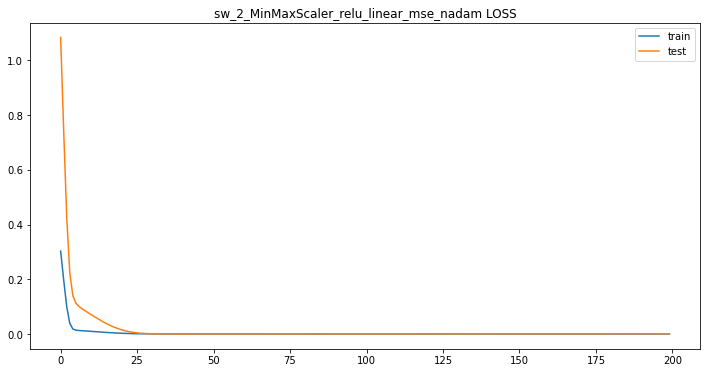


 sw_2_MinMaxScaler_relu_linear_mse_nadam 데이터 비교


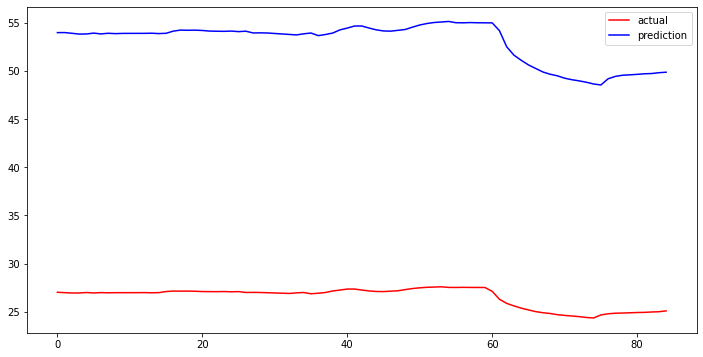

sw_2_MinMaxScaler_relu_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mse_nadam metrics
mean_squared_error : 26.49449014064056
r2_score : -672.4446182521516
sw_2_MinMaxScaler_relu_linear_mse_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_513"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_513 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_513 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.3061 - acc: 0.0021 - val_loss: 1.1408 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2365 - acc: 0.0021 - val_loss: 0.9705 - val_acc: 0.0000e+00
Epoch 3/200

Epoch 69/200
32/32 - 0s - loss: 7.4694e-04 - acc: 0.0043 - val_loss: 4.1924e-04 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 6.9210e-04 - acc: 0.0043 - val_loss: 5.8311e-04 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 6.4692e-04 - acc: 0.0043 - val_loss: 7.8267e-04 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 6.1034e-04 - acc: 0.0043 - val_loss: 0.0010 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 5.8123e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 5.5855e-04 - acc: 0.0043 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 5.4128e-04 - acc: 0.0043 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 5.2848e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 5.1930e-04 - acc: 0.0043 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 5.1298e-04 - acc: 0.0043 - val_loss: 0.0023 - val_acc: 0.0000e+00
Epoch 79

Epoch 152/200
32/32 - 0s - loss: 4.5689e-04 - acc: 0.0043 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 4.5620e-04 - acc: 0.0043 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 4.5562e-04 - acc: 0.0043 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 4.5486e-04 - acc: 0.0043 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 4.5422e-04 - acc: 0.0043 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 4.5370e-04 - acc: 0.0043 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 4.5303e-04 - acc: 0.0043 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 4.5250e-04 - acc: 0.0043 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 4.5182e-04 - acc: 0.0043 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 4.5118e-04 - acc: 0.0043 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 162/

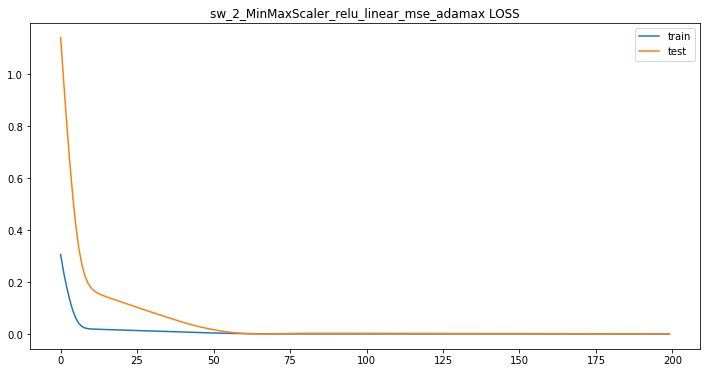


 sw_2_MinMaxScaler_relu_linear_mse_adamax 데이터 비교


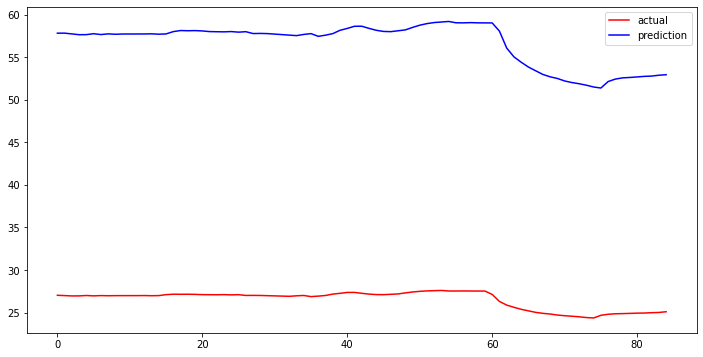

sw_2_MinMaxScaler_relu_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mse_adamax metrics
mean_squared_error : 30.18354698820307
r2_score : -873.0400134858845
sw_2_MinMaxScaler_relu_linear_mse_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_514"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_514 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_514 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.3253 - acc: 0.0021 - val_loss: 1.1842 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2384 - acc: 0.0021 - val_loss: 0.9227 - val_acc: 0.0000e+00
Epoch 3/20

Epoch 67/200
32/32 - 0s - loss: 3.9528e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 3.9547e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 3.9555e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 3.9558e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 3.9556e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 3.9552e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 3.9573e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 3.9612e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 3.9660e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 3.9715e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 77/200
32/32 -

Epoch 149/200
32/32 - 0s - loss: 3.8865e-04 - acc: 0.0043 - val_loss: 3.8607e-04 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 3.8843e-04 - acc: 0.0043 - val_loss: 3.8033e-04 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 3.8785e-04 - acc: 0.0043 - val_loss: 3.7016e-04 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 3.8777e-04 - acc: 0.0043 - val_loss: 3.6092e-04 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 3.8781e-04 - acc: 0.0043 - val_loss: 3.5353e-04 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 3.8777e-04 - acc: 0.0043 - val_loss: 3.4917e-04 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 3.8757e-04 - acc: 0.0043 - val_loss: 3.4315e-04 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 3.8768e-04 - acc: 0.0043 - val_loss: 3.3946e-04 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 3.8766e-04 - acc: 0.0043 - val_loss: 3.3624e-04 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 3.8713e-04 - acc: 0.0043 - val_loss: 3.2

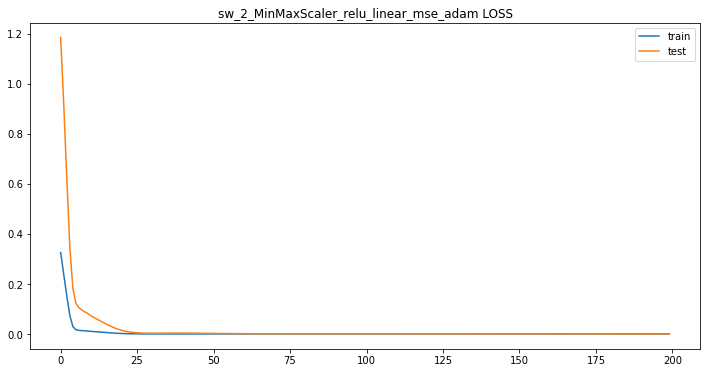


 sw_2_MinMaxScaler_relu_linear_mse_adam 데이터 비교


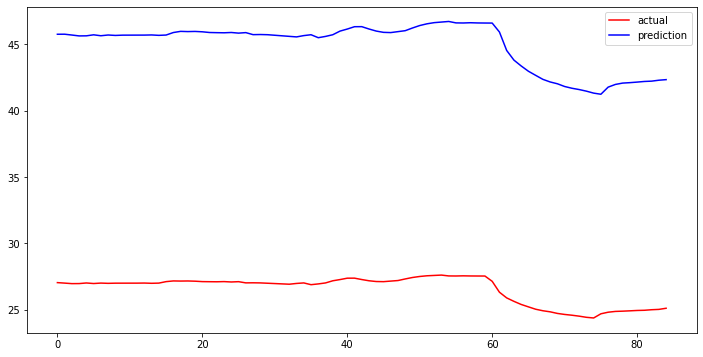

sw_2_MinMaxScaler_relu_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mse_adam metrics
mean_squared_error : 18.436818876454883
r2_score : -325.1089363459747
sw_2_MinMaxScaler_relu_linear_mse_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_515"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_515 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_515 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.3369 - acc: 0.0021 - val_loss: 1.3211 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3206 - acc: 0.0021 - val_loss: 1.2870 - val_acc: 0.0000e+00
Epoch 3/200

Epoch 69/200
32/32 - 0s - loss: 0.1300 - acc: 0.0021 - val_loss: 0.7280 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.1287 - acc: 0.0021 - val_loss: 0.7234 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.1274 - acc: 0.0021 - val_loss: 0.7189 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.1261 - acc: 0.0021 - val_loss: 0.7144 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.1248 - acc: 0.0021 - val_loss: 0.7100 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.1236 - acc: 0.0021 - val_loss: 0.7056 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.1223 - acc: 0.0021 - val_loss: 0.7013 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.1211 - acc: 0.0021 - val_loss: 0.6969 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.1199 - acc: 0.0021 - val_loss: 0.6926 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.1187 - acc: 0.0021 - val_loss: 0.6884 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.1175 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0535 - acc: 0.0021 - val_loss: 0.4285 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0530 - acc: 0.0021 - val_loss: 0.4261 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0525 - acc: 0.0021 - val_loss: 0.4237 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0520 - acc: 0.0021 - val_loss: 0.4213 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0515 - acc: 0.0021 - val_loss: 0.4190 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0510 - acc: 0.0021 - val_loss: 0.4166 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0505 - acc: 0.0021 - val_loss: 0.4143 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0501 - acc: 0.0021 - val_loss: 0.4119 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0496 - acc: 0.0021 - val_loss: 0.4096 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0491 - acc: 0.0021 - val_loss: 0.4073 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0487 - acc: 0.0

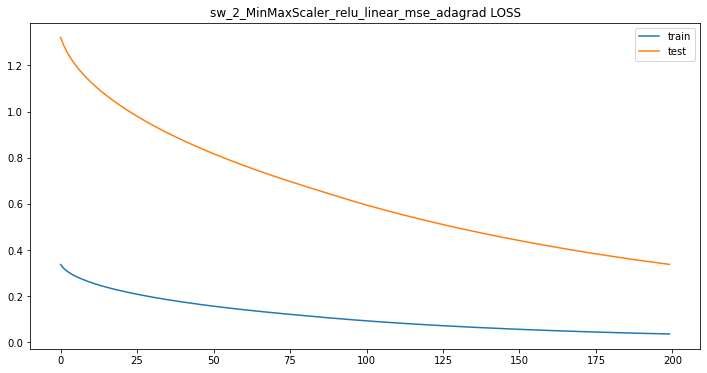


 sw_2_MinMaxScaler_relu_linear_mse_adagrad 데이터 비교


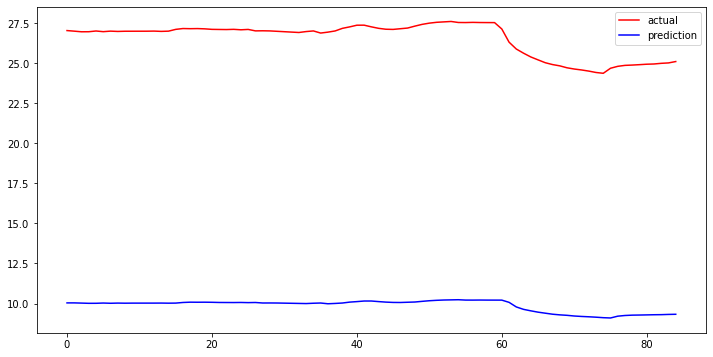

sw_2_MinMaxScaler_relu_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mse_adagrad metrics
mean_squared_error : 16.6774552077657
r2_score : -265.83962308110694
sw_2_MinMaxScaler_relu_linear_mse_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_516"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_516 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_516 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 0.2692 - acc: 0.0021 - val_loss: 0.9642 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1721 - acc: 0.0021 - val_loss: 0.6968 - val_acc: 0.0000e+00
Epo

Epoch 67/200
32/32 - 0s - loss: 4.3638e-04 - acc: 0.0043 - val_loss: 0.0035 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 4.3416e-04 - acc: 0.0043 - val_loss: 0.0035 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 4.3205e-04 - acc: 0.0043 - val_loss: 0.0035 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 4.2991e-04 - acc: 0.0043 - val_loss: 0.0034 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 4.2764e-04 - acc: 0.0043 - val_loss: 0.0034 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 4.2542e-04 - acc: 0.0043 - val_loss: 0.0034 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 4.2342e-04 - acc: 0.0043 - val_loss: 0.0034 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 4.2165e-04 - acc: 0.0043 - val_loss: 0.0034 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 4.1982e-04 - acc: 0.0043 - val_loss: 0.0034 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 4.1816e-04 - acc: 0.0043 - val_loss: 0.0034 - val_acc: 0.0000e+00
Epoch 77/200
32/32 -

32/32 - 0s - loss: 3.9542e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 3.9550e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 3.9535e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 3.9524e-04 - acc: 0.0043 - val_loss: 0.0051 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 3.9523e-04 - acc: 0.0043 - val_loss: 0.0051 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 3.9515e-04 - acc: 0.0043 - val_loss: 0.0051 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 3.9507e-04 - acc: 0.0043 - val_loss: 0.0052 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 3.9500e-04 - acc: 0.0043 - val_loss: 0.0052 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 3.9508e-04 - acc: 0.0043 - val_loss: 0.0052 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 3.9511e-04 - acc: 0.0043 - val_loss: 0.0052 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s

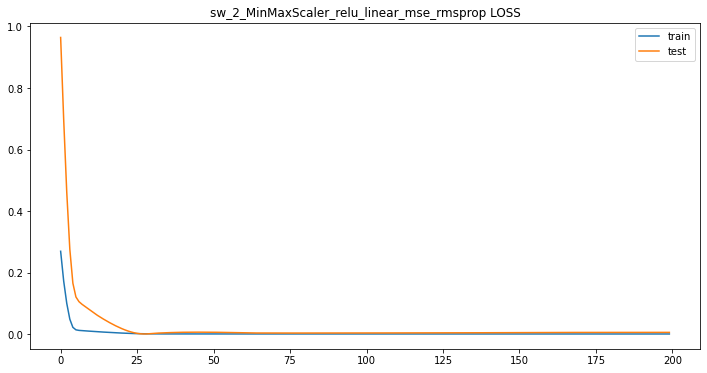


 sw_2_MinMaxScaler_relu_linear_mse_rmsprop 데이터 비교


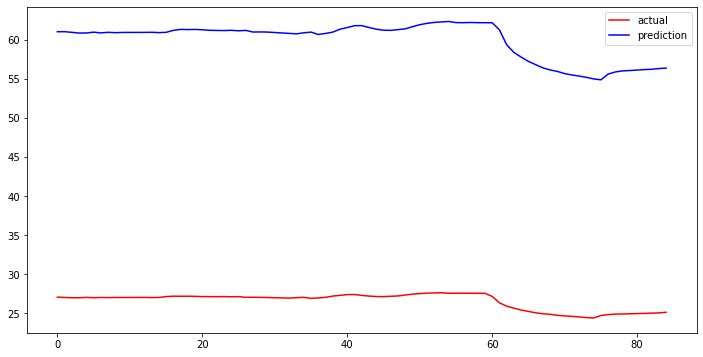

sw_2_MinMaxScaler_relu_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mse_rmsprop metrics
mean_squared_error : 33.445503204023
r2_score : -1072.164248409066
sw_2_MinMaxScaler_relu_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_517"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_517 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_517 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.2782 - acc: 0.0021 - val_loss: 1.0230 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1424 - acc: 0.0021 - val_loss: 0.7337 - val_acc: 0.0000e+

Epoch 69/200
32/32 - 0s - loss: 0.0264 - acc: 0.0043 - val_loss: 0.2646 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0263 - acc: 0.0043 - val_loss: 0.2633 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0261 - acc: 0.0043 - val_loss: 0.2620 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0260 - acc: 0.0043 - val_loss: 0.2606 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0258 - acc: 0.0043 - val_loss: 0.2593 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0257 - acc: 0.0043 - val_loss: 0.2579 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0255 - acc: 0.0043 - val_loss: 0.2566 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0254 - acc: 0.0043 - val_loss: 0.2553 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0253 - acc: 0.0043 - val_loss: 0.2539 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0251 - acc: 0.0043 - val_loss: 0.2526 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0250 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0131 - acc: 0.0043 - val_loss: 0.1342 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.1327 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0128 - acc: 0.0043 - val_loss: 0.1312 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.1296 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.1281 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.1266 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.1251 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.1236 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.1221 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0117 - acc: 0.0043 - val_loss: 0.1206 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0116 - acc: 0.0

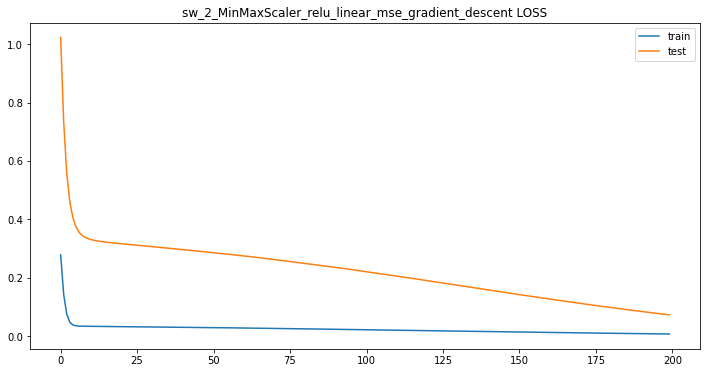


 sw_2_MinMaxScaler_relu_linear_mse_gradient_descent 데이터 비교


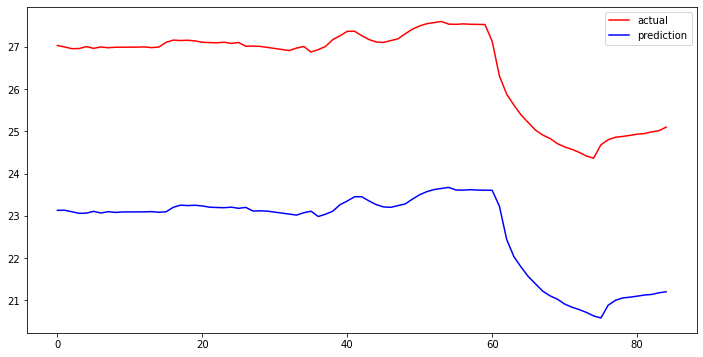

sw_2_MinMaxScaler_relu_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mse_gradient_descent metrics
mean_squared_error : 3.858468756279941
r2_score : -13.283042574702751
sw_2_MinMaxScaler_relu_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_518"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_518 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_518 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.5406 - acc: 0.0021 - val_loss: 1.0883 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4451 - acc: 0.0021 - val_loss: 0.9191 

Epoch 69/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0459 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0379 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0440 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0394 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0479 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0436 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0442 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0523 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0464 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.0471 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0106 - acc: 0.0043 - val_loss: 0.0687 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0521 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0106 - acc: 0.0043 - val_loss: 0.0681 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0516 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0105 - acc: 0.0043 - val_loss: 0.0676 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0112 - acc: 0.0043 - val_loss: 0.0536 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0106 - acc: 0.0043 - val_loss: 0.0669 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0112 - acc: 0.0043 - val_loss: 0.0577 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0105 - acc: 0.0043 - val_loss: 0.0619 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.0508 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0106 - acc: 0.0

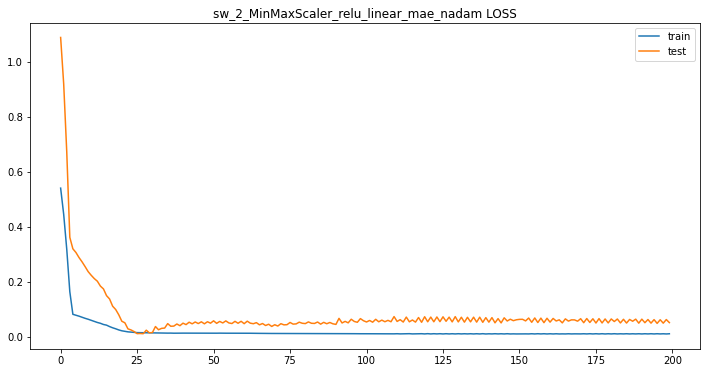


 sw_2_MinMaxScaler_relu_linear_mae_nadam 데이터 비교


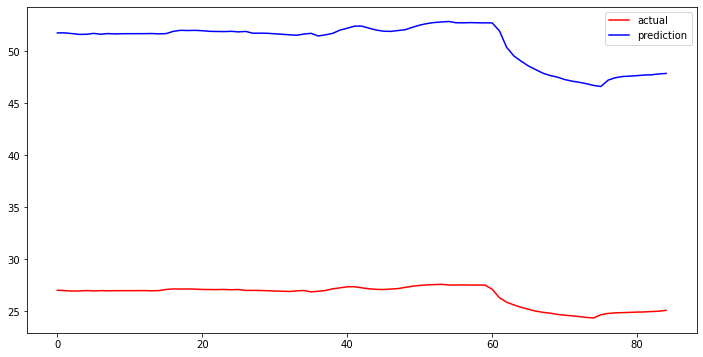

sw_2_MinMaxScaler_relu_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mae_nadam metrics
mean_squared_error : 24.344889505182216
r2_score : -567.59939418058
sw_2_MinMaxScaler_relu_linear_mae_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_519"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_519 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_519 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.5330 - acc: 0.0021 - val_loss: 1.0748 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4474 - acc: 0.0021 - val_loss: 0.9552 - val_acc: 0.0000e+00
Epoch 3/200

Epoch 69/200
32/32 - 0s - loss: 0.0176 - acc: 0.0043 - val_loss: 0.0707 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0177 - acc: 0.0043 - val_loss: 0.0701 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0177 - acc: 0.0043 - val_loss: 0.0698 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0177 - acc: 0.0043 - val_loss: 0.0691 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0175 - acc: 0.0043 - val_loss: 0.0698 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0177 - acc: 0.0043 - val_loss: 0.0689 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0174 - acc: 0.0043 - val_loss: 0.0700 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0177 - acc: 0.0043 - val_loss: 0.0690 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0180 - acc: 0.0043 - val_loss: 0.0676 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0172 - acc: 0.0043 - val_loss: 0.0699 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0176 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0143 - acc: 0.0043 - val_loss: 0.0532 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0128 - acc: 0.0043 - val_loss: 0.0598 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0617 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0139 - acc: 0.0043 - val_loss: 0.0583 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0133 - acc: 0.0043 - val_loss: 0.0607 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0604 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0144 - acc: 0.0043 - val_loss: 0.0570 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0145 - acc: 0.0043 - val_loss: 0.0534 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0131 - acc: 0.0043 - val_loss: 0.0561 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0127 - acc: 0.0043 - val_loss: 0.0598 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0132 - acc: 0.0

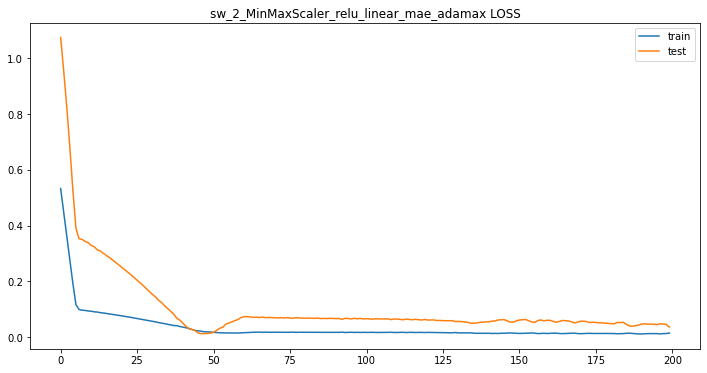


 sw_2_MinMaxScaler_relu_linear_mae_adamax 데이터 비교


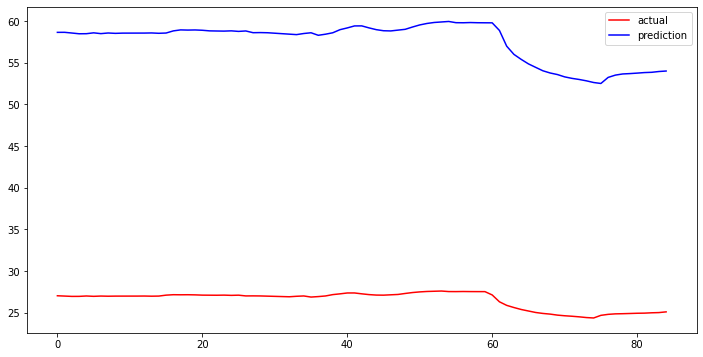

sw_2_MinMaxScaler_relu_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mae_adamax metrics
mean_squared_error : 31.057534264173526
r2_score : -924.3896740558298
sw_2_MinMaxScaler_relu_linear_mae_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_520"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_520 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_520 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.5079 - acc: 0.0021 - val_loss: 1.0030 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3882 - acc: 0.0021 - val_loss: 0.7993 - val_acc: 0.0000e+00
Epoch 3/

Epoch 69/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0377 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0398 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0140 - acc: 0.0043 - val_loss: 0.0440 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0116 - acc: 0.0043 - val_loss: 0.0433 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0170 - acc: 0.0043 - val_loss: 0.0505 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0382 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0145 - acc: 0.0043 - val_loss: 0.0384 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0115 - acc: 0.0043 - val_loss: 0.0383 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0368 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0386 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0132 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0139 - acc: 0.0043 - val_loss: 0.0291 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0113 - acc: 0.0043 - val_loss: 0.0349 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0139 - acc: 0.0043 - val_loss: 0.0278 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0108 - acc: 0.0043 - val_loss: 0.0325 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0136 - acc: 0.0043 - val_loss: 0.0291 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.0353 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0141 - acc: 0.0043 - val_loss: 0.0300 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.0368 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0147 - acc: 0.0043 - val_loss: 0.0297 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0371 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0150 - acc: 0.0

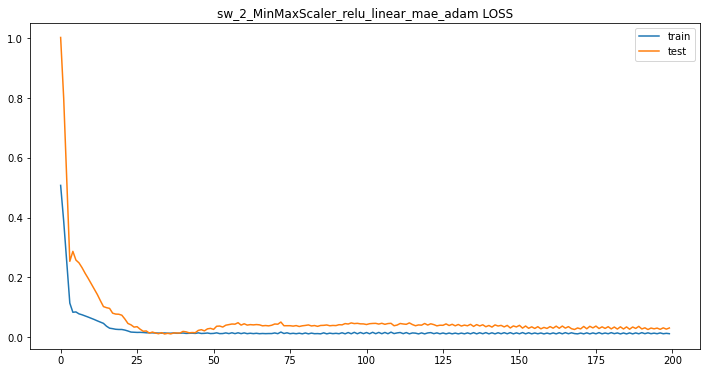


 sw_2_MinMaxScaler_relu_linear_mae_adam 데이터 비교


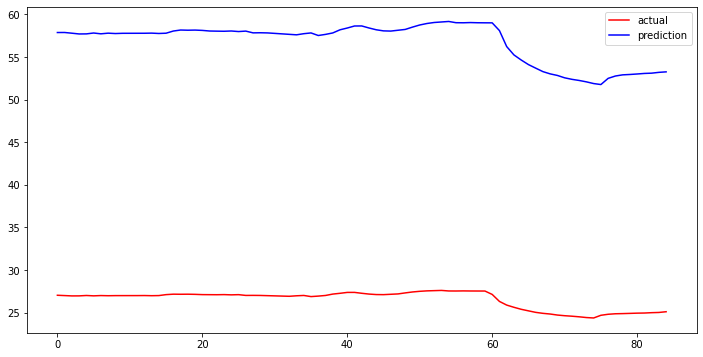

sw_2_MinMaxScaler_relu_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mae_adam metrics
mean_squared_error : 30.28419566909808
r2_score : -878.8788385096434
sw_2_MinMaxScaler_relu_linear_mae_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_521"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_521 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_521 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.5400 - acc: 0.0021 - val_loss: 1.1298 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5289 - acc: 0.0021 - val_loss: 1.1187 - val_acc: 0.0000e+00
Epoch 3/200


Epoch 69/200
32/32 - 0s - loss: 0.3042 - acc: 0.0021 - val_loss: 0.8055 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.3017 - acc: 0.0021 - val_loss: 0.8016 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.2992 - acc: 0.0021 - val_loss: 0.7977 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.2967 - acc: 0.0021 - val_loss: 0.7938 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.2943 - acc: 0.0021 - val_loss: 0.7899 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.2918 - acc: 0.0021 - val_loss: 0.7861 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.2893 - acc: 0.0021 - val_loss: 0.7822 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.2869 - acc: 0.0021 - val_loss: 0.7784 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.2845 - acc: 0.0021 - val_loss: 0.7745 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.2821 - acc: 0.0021 - val_loss: 0.7707 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.2797 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.1230 - acc: 0.0043 - val_loss: 0.4885 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1215 - acc: 0.0043 - val_loss: 0.4854 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1202 - acc: 0.0043 - val_loss: 0.4824 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1189 - acc: 0.0043 - val_loss: 0.4794 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.1177 - acc: 0.0043 - val_loss: 0.4765 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.1165 - acc: 0.0043 - val_loss: 0.4737 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.1153 - acc: 0.0043 - val_loss: 0.4708 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.1142 - acc: 0.0043 - val_loss: 0.4681 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.1132 - acc: 0.0043 - val_loss: 0.4654 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.1122 - acc: 0.0043 - val_loss: 0.4628 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.1113 - acc: 0.0

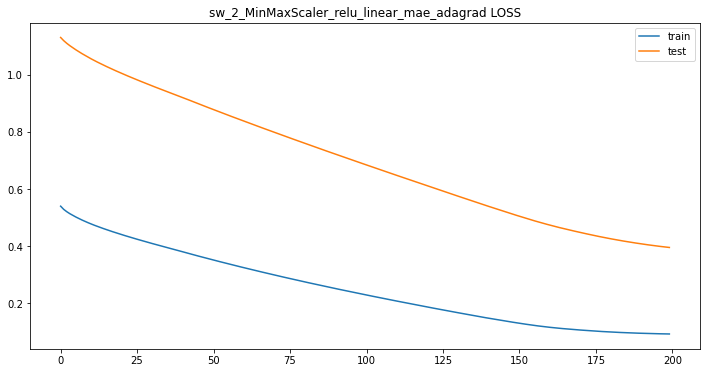


 sw_2_MinMaxScaler_relu_linear_mae_adagrad 데이터 비교


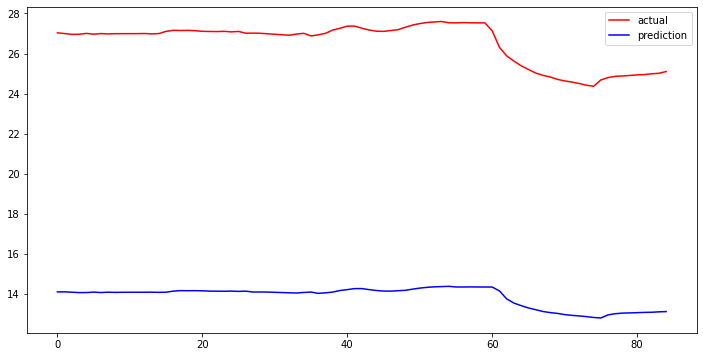

sw_2_MinMaxScaler_relu_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mae_adagrad metrics
mean_squared_error : 12.678638689872045
r2_score : -153.21832078029558
sw_2_MinMaxScaler_relu_linear_mae_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_522"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_522 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_522 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.4837 - acc: 0.0021 - val_loss: 0.9665 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3709 - acc: 0.0021 - val_loss: 0.7913 - val_acc: 0.0000e+00
E

Epoch 69/200
32/32 - 0s - loss: 0.0133 - acc: 0.0043 - val_loss: 0.0463 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0468 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0130 - acc: 0.0043 - val_loss: 0.0458 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0131 - acc: 0.0043 - val_loss: 0.0533 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0545 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0131 - acc: 0.0043 - val_loss: 0.0481 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0128 - acc: 0.0043 - val_loss: 0.0474 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0127 - acc: 0.0043 - val_loss: 0.0509 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.0484 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.0468 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0127 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0277 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0406 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0281 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0269 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0116 - acc: 0.0043 - val_loss: 0.0287 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0115 - acc: 0.0043 - val_loss: 0.0590 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0368 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0117 - acc: 0.0043 - val_loss: 0.0584 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0373 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0288 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0116 - acc: 0.0

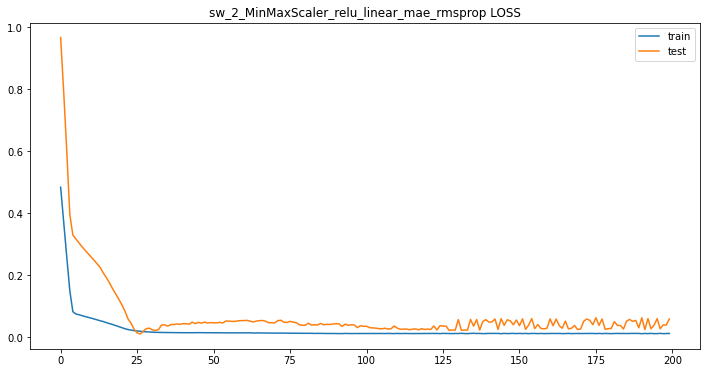


 sw_2_MinMaxScaler_relu_linear_mae_rmsprop 데이터 비교


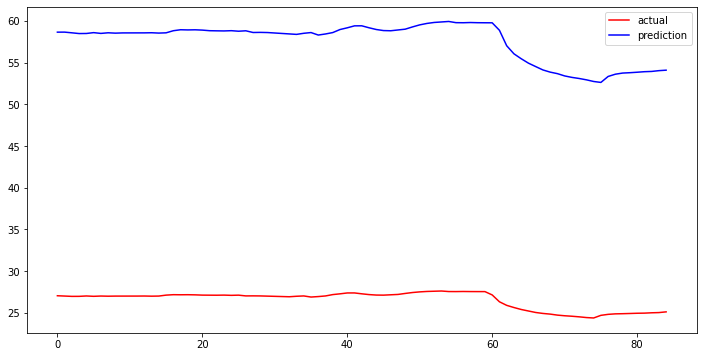

sw_2_MinMaxScaler_relu_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mae_rmsprop metrics
mean_squared_error : 31.071975337387023
r2_score : -925.250542524105
sw_2_MinMaxScaler_relu_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_523"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_523 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_523 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.5119 - acc: 0.0021 - val_loss: 1.0535 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3637 - acc: 0.0021 - val_loss: 0.8984 - val_acc: 0.0000

Epoch 69/200
32/32 - 0s - loss: 0.0842 - acc: 0.0043 - val_loss: 0.3875 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0813 - acc: 0.0043 - val_loss: 0.3810 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0794 - acc: 0.0043 - val_loss: 0.3743 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0780 - acc: 0.0043 - val_loss: 0.3671 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0766 - acc: 0.0043 - val_loss: 0.3600 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0749 - acc: 0.0043 - val_loss: 0.3521 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0732 - acc: 0.0043 - val_loss: 0.3433 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0720 - acc: 0.0043 - val_loss: 0.3368 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0702 - acc: 0.0043 - val_loss: 0.3294 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0687 - acc: 0.0043 - val_loss: 0.3209 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0673 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0138 - acc: 0.0043 - val_loss: 0.0403 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0136 - acc: 0.0043 - val_loss: 0.0657 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0139 - acc: 0.0043 - val_loss: 0.0488 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0136 - acc: 0.0043 - val_loss: 0.0516 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0136 - acc: 0.0043 - val_loss: 0.0523 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0133 - acc: 0.0043 - val_loss: 0.0487 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0136 - acc: 0.0043 - val_loss: 0.0635 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0540 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0135 - acc: 0.0043 - val_loss: 0.0549 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0532 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0133 - acc: 0.0

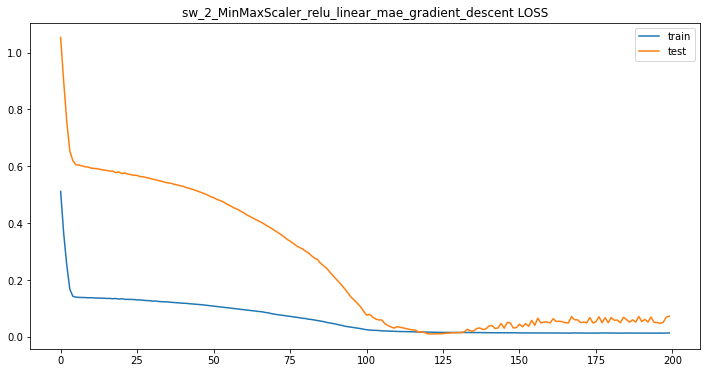


 sw_2_MinMaxScaler_relu_linear_mae_gradient_descent 데이터 비교


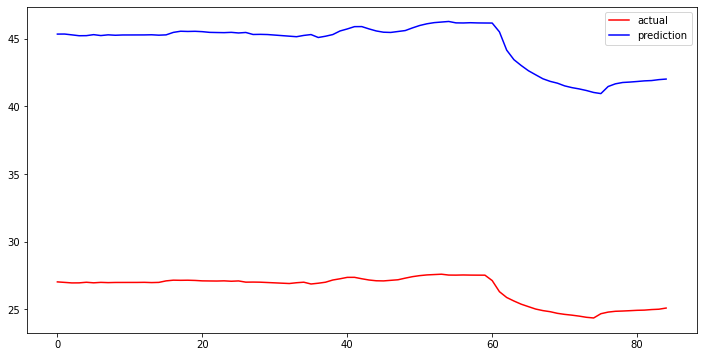

sw_2_MinMaxScaler_relu_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_relu_linear_mae_gradient_descent metrics
mean_squared_error : 18.03929849753596
r2_score : -311.19796454499294
sw_2_MinMaxScaler_relu_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_524"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_524 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_524 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 15s - loss: 0.3250 - acc: 0.0021 - val_loss: 1.1804 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2295 - acc: 0.0021 - val_loss: 0

Epoch 67/200
32/32 - 0s - loss: 4.1123e-04 - acc: 0.0043 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 4.1028e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 4.0950e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 4.0884e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 4.0808e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 4.0734e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 4.0655e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 4.0578e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 4.0462e-04 - acc: 0.0043 - val_loss: 0.0010 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 4.0338e-04 - acc: 0.0043 - val_loss: 9.9593e-04 - val_acc: 0.0000e+00
Epoch 77/200
32/

Epoch 148/200
32/32 - 0s - loss: 3.9152e-04 - acc: 0.0043 - val_loss: 2.4881e-04 - val_acc: 0.0000e+00
Epoch 149/200
32/32 - 0s - loss: 3.9147e-04 - acc: 0.0043 - val_loss: 2.4975e-04 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 3.9181e-04 - acc: 0.0043 - val_loss: 2.4952e-04 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 3.9181e-04 - acc: 0.0043 - val_loss: 2.4983e-04 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 3.9204e-04 - acc: 0.0043 - val_loss: 2.4947e-04 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 3.9227e-04 - acc: 0.0043 - val_loss: 2.4916e-04 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 3.9247e-04 - acc: 0.0043 - val_loss: 2.4973e-04 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 3.9254e-04 - acc: 0.0043 - val_loss: 2.4981e-04 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 3.9254e-04 - acc: 0.0043 - val_loss: 2.4974e-04 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 3.9276e-04 - acc: 0.0043 - val_loss: 2.5

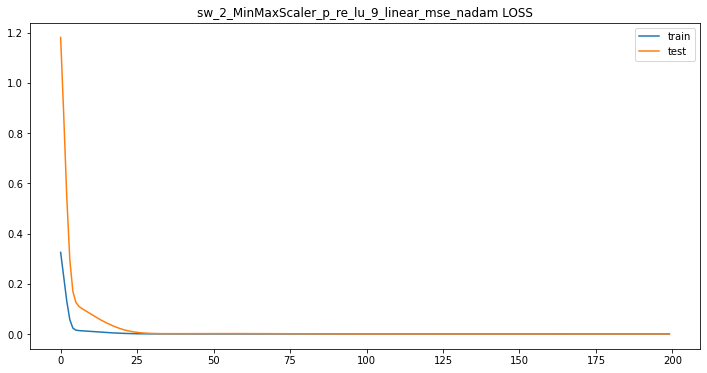


 sw_2_MinMaxScaler_p_re_lu_9_linear_mse_nadam 데이터 비교


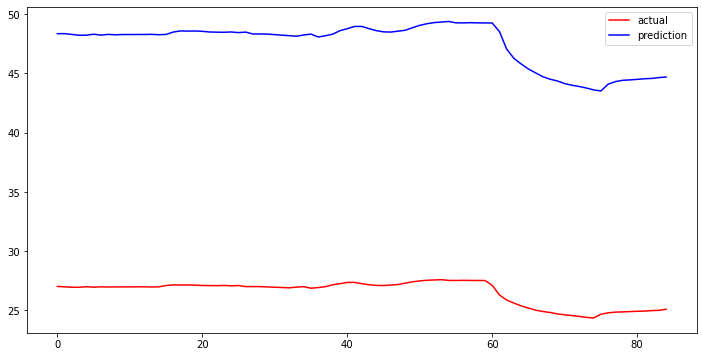

sw_2_MinMaxScaler_p_re_lu_9_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_nadam metrics
mean_squared_error : 20.98547951183858
r2_score : -421.501758385115
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_nadam이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_525"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_525 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_525 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.3118 - acc: 0.0021 - val_loss: 1.1486 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2395 - acc: 0.0021 - val_loss: 0.9728 - val_acc: 0.0

Epoch 69/200
32/32 - 0s - loss: 0.0011 - acc: 0.0043 - val_loss: 3.8271e-04 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 9.9991e-04 - acc: 0.0043 - val_loss: 2.7291e-04 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 9.1199e-04 - acc: 0.0043 - val_loss: 2.4070e-04 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 8.3573e-04 - acc: 0.0043 - val_loss: 2.7495e-04 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 7.7045e-04 - acc: 0.0043 - val_loss: 3.6398e-04 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 7.1532e-04 - acc: 0.0043 - val_loss: 4.9567e-04 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 6.6943e-04 - acc: 0.0043 - val_loss: 6.5825e-04 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 6.3185e-04 - acc: 0.0043 - val_loss: 8.4032e-04 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 6.0160e-04 - acc: 0.0043 - val_loss: 0.0010 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 5.7765e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0

Epoch 152/200
32/32 - 0s - loss: 3.9029e-04 - acc: 0.0043 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 3.9007e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 3.8979e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 3.8960e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 3.8932e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 3.8912e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 3.8890e-04 - acc: 0.0043 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 3.8869e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 3.8840e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 3.8822e-04 - acc: 0.0043 - val_loss: 0.0011 - val_acc: 0.0000e+00
Epoch 162/

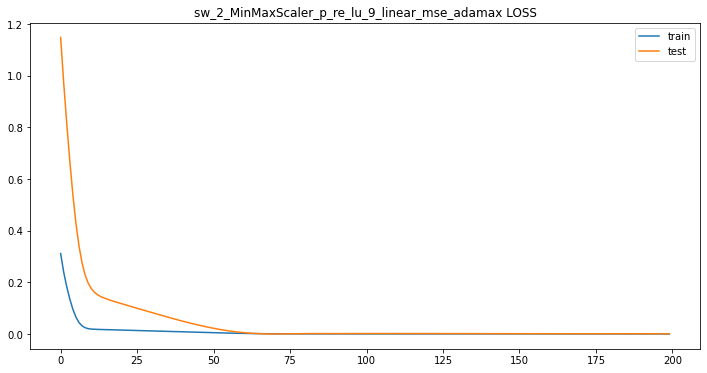


 sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adamax 데이터 비교


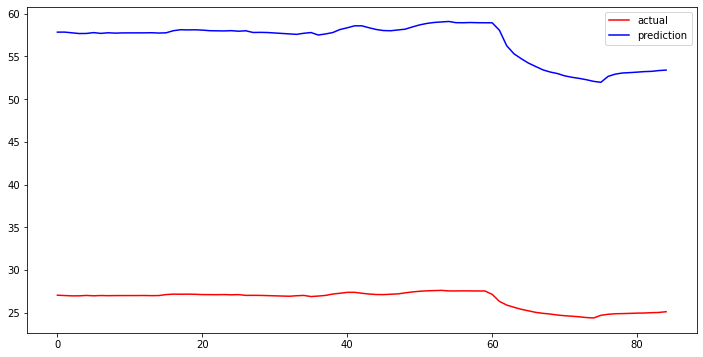

sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adamax metrics
mean_squared_error : 30.2998403009921
r2_score : -879.7880211230208
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adamax이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_526"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_526 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_526 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.3359 - acc: 0.0021 - val_loss: 1.2010 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2314 - acc: 0.0021 - val_loss: 0.8980 - val_acc: 0.

Epoch 66/200
32/32 - 0s - loss: 4.0475e-04 - acc: 0.0043 - val_loss: 5.8353e-04 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 4.0435e-04 - acc: 0.0043 - val_loss: 5.6433e-04 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 4.0421e-04 - acc: 0.0043 - val_loss: 5.4800e-04 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 4.0402e-04 - acc: 0.0043 - val_loss: 5.2990e-04 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 4.0401e-04 - acc: 0.0043 - val_loss: 5.1209e-04 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 4.0396e-04 - acc: 0.0043 - val_loss: 4.9157e-04 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 4.0395e-04 - acc: 0.0043 - val_loss: 4.7325e-04 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 4.0411e-04 - acc: 0.0043 - val_loss: 4.5728e-04 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 4.0437e-04 - acc: 0.0043 - val_loss: 4.4258e-04 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 4.0461e-04 - acc: 0.0043 - val_loss: 4.2832e-04 - 

32/32 - 0s - loss: 4.1376e-04 - acc: 0.0043 - val_loss: 3.4221e-04 - val_acc: 0.0000e+00
Epoch 147/200
32/32 - 0s - loss: 4.1244e-04 - acc: 0.0043 - val_loss: 3.3288e-04 - val_acc: 0.0000e+00
Epoch 148/200
32/32 - 0s - loss: 4.1119e-04 - acc: 0.0043 - val_loss: 3.2349e-04 - val_acc: 0.0000e+00
Epoch 149/200
32/32 - 0s - loss: 4.1001e-04 - acc: 0.0043 - val_loss: 3.1593e-04 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 4.0895e-04 - acc: 0.0043 - val_loss: 3.0877e-04 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 4.0784e-04 - acc: 0.0043 - val_loss: 3.0269e-04 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 4.0679e-04 - acc: 0.0043 - val_loss: 2.9618e-04 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 4.0580e-04 - acc: 0.0043 - val_loss: 2.8559e-04 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 4.0493e-04 - acc: 0.0043 - val_loss: 2.8155e-04 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 4.0404e-04 - acc: 0.0043 - val_loss: 2.7820e-04 - val_

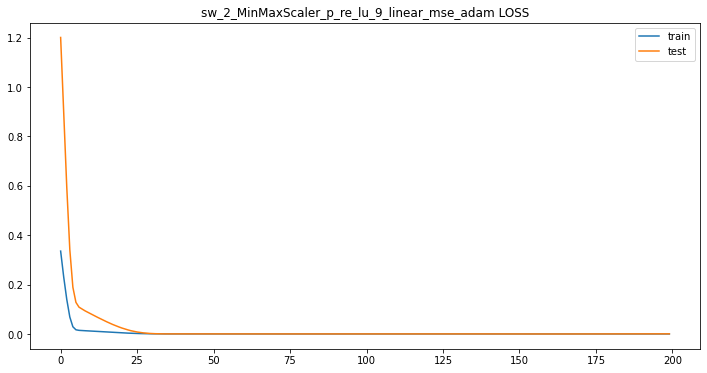


 sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adam 데이터 비교


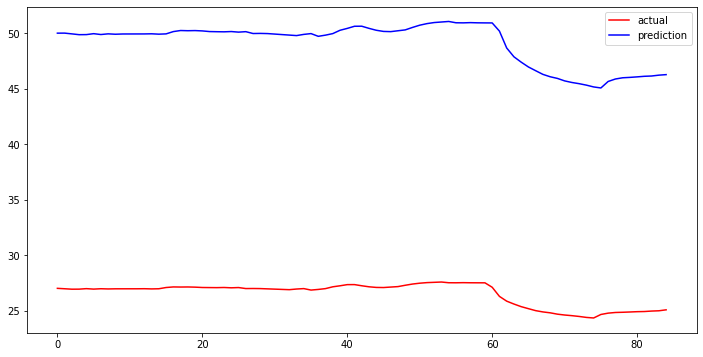

sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adam metrics
mean_squared_error : 22.59999346437613
r2_score : -489.0127243820373
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adam이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_527"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_527 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_527 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 0.3552 - acc: 0.0021 - val_loss: 1.3915 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3379 - acc: 0.0021 - val_loss: 1.3548 - val_acc: 0.0

Epoch 69/200
32/32 - 0s - loss: 0.1279 - acc: 0.0021 - val_loss: 0.7307 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.1265 - acc: 0.0021 - val_loss: 0.7256 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.1251 - acc: 0.0021 - val_loss: 0.7206 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.1237 - acc: 0.0021 - val_loss: 0.7156 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.1223 - acc: 0.0021 - val_loss: 0.7107 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.1209 - acc: 0.0021 - val_loss: 0.7058 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.1195 - acc: 0.0021 - val_loss: 0.7010 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.1181 - acc: 0.0021 - val_loss: 0.6962 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.1168 - acc: 0.0021 - val_loss: 0.6915 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.1154 - acc: 0.0021 - val_loss: 0.6867 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.1141 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0492 - acc: 0.0021 - val_loss: 0.4131 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0487 - acc: 0.0021 - val_loss: 0.4106 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0482 - acc: 0.0043 - val_loss: 0.4082 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0477 - acc: 0.0043 - val_loss: 0.4058 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0472 - acc: 0.0043 - val_loss: 0.4034 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0468 - acc: 0.0043 - val_loss: 0.4010 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0463 - acc: 0.0043 - val_loss: 0.3986 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0459 - acc: 0.0043 - val_loss: 0.3963 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0454 - acc: 0.0043 - val_loss: 0.3940 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0450 - acc: 0.0043 - val_loss: 0.3916 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0446 - acc: 0.0

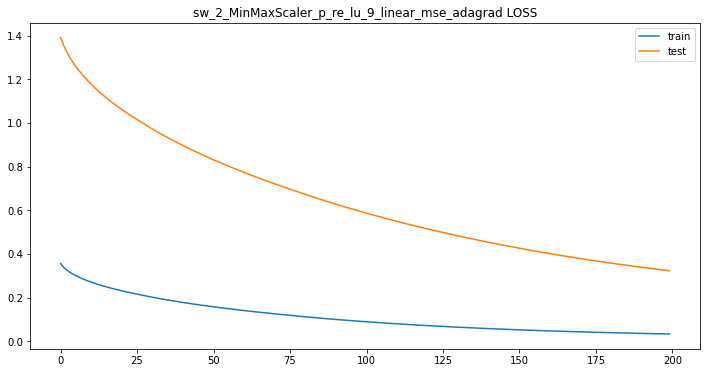


 sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adagrad 데이터 비교


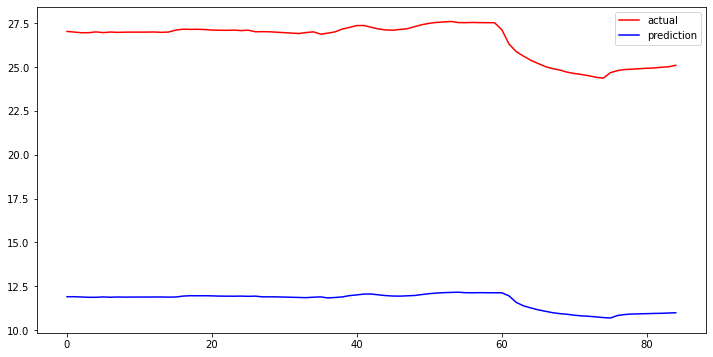

sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adagrad metrics
mean_squared_error : 14.863505049234949
r2_score : -210.94988084242826
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_528"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_528 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_528 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.2854 - acc: 0.0021 - val_loss: 1.0216 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1809 - acc: 0.0021 - val_loss: 0.7341 - v

Epoch 67/200
32/32 - 0s - loss: 4.3643e-04 - acc: 0.0043 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 4.3485e-04 - acc: 0.0043 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 4.3341e-04 - acc: 0.0043 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 4.3197e-04 - acc: 0.0043 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 4.3057e-04 - acc: 0.0043 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 4.2934e-04 - acc: 0.0043 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 4.2812e-04 - acc: 0.0043 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 4.2689e-04 - acc: 0.0043 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 4.2580e-04 - acc: 0.0043 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 4.2476e-04 - acc: 0.0043 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 77/200
32/32 -

32/32 - 0s - loss: 3.9595e-04 - acc: 0.0043 - val_loss: 0.0044 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 3.9634e-04 - acc: 0.0043 - val_loss: 0.0043 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 3.9577e-04 - acc: 0.0043 - val_loss: 0.0044 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 3.9592e-04 - acc: 0.0043 - val_loss: 0.0044 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 3.9599e-04 - acc: 0.0043 - val_loss: 0.0044 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 3.9566e-04 - acc: 0.0043 - val_loss: 0.0045 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 3.9608e-04 - acc: 0.0043 - val_loss: 0.0044 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 3.9564e-04 - acc: 0.0043 - val_loss: 0.0045 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 3.9580e-04 - acc: 0.0043 - val_loss: 0.0045 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 3.9547e-04 - acc: 0.0043 - val_loss: 0.0046 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s

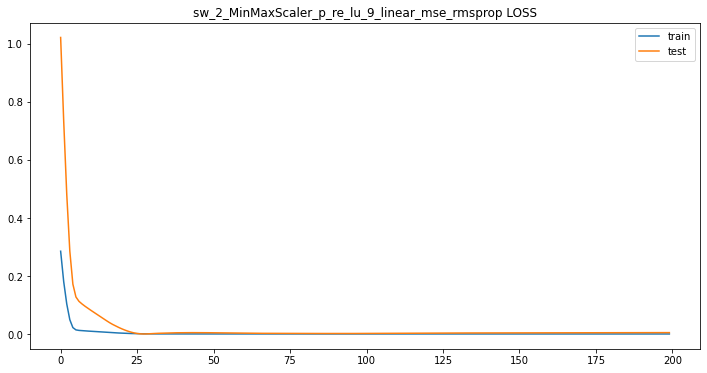


 sw_2_MinMaxScaler_p_re_lu_9_linear_mse_rmsprop 데이터 비교


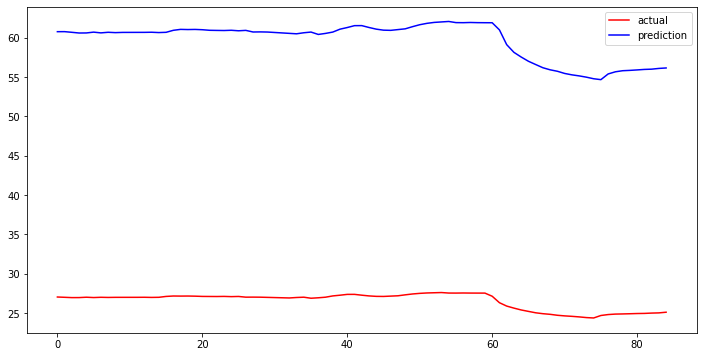

sw_2_MinMaxScaler_p_re_lu_9_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_rmsprop metrics
mean_squared_error : 33.18817310404981
r2_score : -1055.714064239959
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_529"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_529 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_529 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 0.2799 - acc: 0.0021 - val_loss: 1.0286 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1412 - acc: 0.0021 - val_loss: 0.7

Epoch 69/200
32/32 - 0s - loss: 0.0253 - acc: 0.0043 - val_loss: 0.2559 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0252 - acc: 0.0043 - val_loss: 0.2546 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0251 - acc: 0.0043 - val_loss: 0.2532 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0249 - acc: 0.0043 - val_loss: 0.2518 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0247 - acc: 0.0043 - val_loss: 0.2504 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0246 - acc: 0.0043 - val_loss: 0.2490 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0244 - acc: 0.0043 - val_loss: 0.2476 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0243 - acc: 0.0043 - val_loss: 0.2462 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0241 - acc: 0.0043 - val_loss: 0.2448 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0240 - acc: 0.0043 - val_loss: 0.2434 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0238 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0117 - acc: 0.0043 - val_loss: 0.1192 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0116 - acc: 0.0043 - val_loss: 0.1177 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.1161 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0113 - acc: 0.0043 - val_loss: 0.1146 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0112 - acc: 0.0043 - val_loss: 0.1131 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0110 - acc: 0.0043 - val_loss: 0.1116 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.1101 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0107 - acc: 0.0043 - val_loss: 0.1086 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0106 - acc: 0.0043 - val_loss: 0.1071 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0104 - acc: 0.0043 - val_loss: 0.1056 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0103 - acc: 0.0

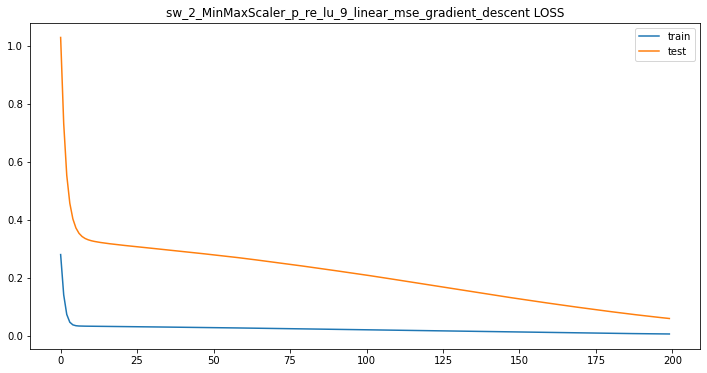


 sw_2_MinMaxScaler_p_re_lu_9_linear_mse_gradient_descent 데이터 비교


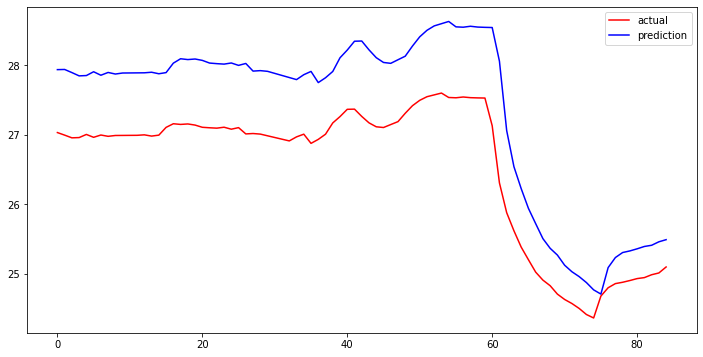

sw_2_MinMaxScaler_p_re_lu_9_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_gradient_descent metrics
mean_squared_error : 0.8671877749330926
r2_score : 0.2785320862201547
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_530"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_530 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_530 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.5573 - acc: 0.0021 - val_loss: 1.1213 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4625 - acc: 0.002

Epoch 69/200
32/32 - 0s - loss: 0.0135 - acc: 0.0043 - val_loss: 0.0759 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0714 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0136 - acc: 0.0043 - val_loss: 0.0775 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0136 - acc: 0.0043 - val_loss: 0.0671 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0751 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0696 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0762 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0133 - acc: 0.0043 - val_loss: 0.0709 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0133 - acc: 0.0043 - val_loss: 0.0775 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0131 - acc: 0.0043 - val_loss: 0.0758 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0768 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0116 - acc: 0.0043 - val_loss: 0.0587 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0727 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0115 - acc: 0.0043 - val_loss: 0.0577 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.0715 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0115 - acc: 0.0043 - val_loss: 0.0581 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.0728 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0116 - acc: 0.0043 - val_loss: 0.0580 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.0709 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0573 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0110 - acc: 0.0

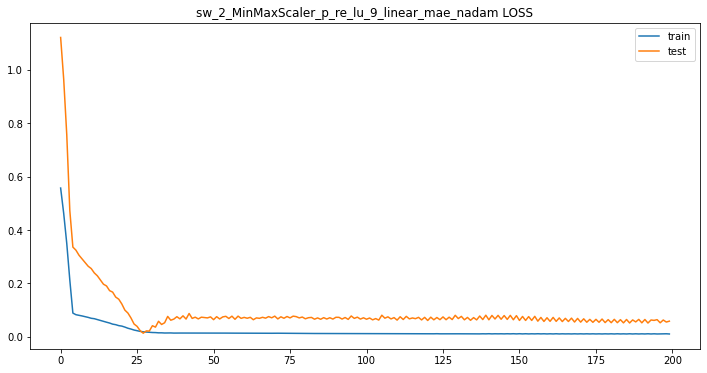


 sw_2_MinMaxScaler_p_re_lu_9_linear_mae_nadam 데이터 비교


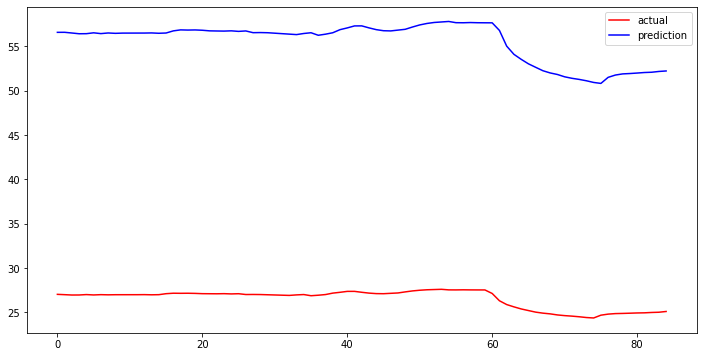

sw_2_MinMaxScaler_p_re_lu_9_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_nadam metrics
mean_squared_error : 29.061722939880475
r2_score : -809.2769243119111
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_nadam이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_531"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_531 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_531 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.5425 - acc: 0.0021 - val_loss: 1.1018 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4662 - acc: 0.0021 - val_loss: 1.0006 - val_acc: 

Epoch 69/200
32/32 - 0s - loss: 0.0176 - acc: 0.0043 - val_loss: 0.0663 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0173 - acc: 0.0043 - val_loss: 0.0670 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0176 - acc: 0.0043 - val_loss: 0.0662 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0173 - acc: 0.0043 - val_loss: 0.0669 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0174 - acc: 0.0043 - val_loss: 0.0669 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0175 - acc: 0.0043 - val_loss: 0.0665 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0175 - acc: 0.0043 - val_loss: 0.0664 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0175 - acc: 0.0043 - val_loss: 0.0657 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0172 - acc: 0.0043 - val_loss: 0.0662 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0174 - acc: 0.0043 - val_loss: 0.0658 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0172 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0132 - acc: 0.0043 - val_loss: 0.0551 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0520 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0135 - acc: 0.0043 - val_loss: 0.0515 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0132 - acc: 0.0043 - val_loss: 0.0523 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.0557 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0127 - acc: 0.0043 - val_loss: 0.0574 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0575 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0589 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0131 - acc: 0.0043 - val_loss: 0.0593 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0138 - acc: 0.0043 - val_loss: 0.0524 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0131 - acc: 0.0

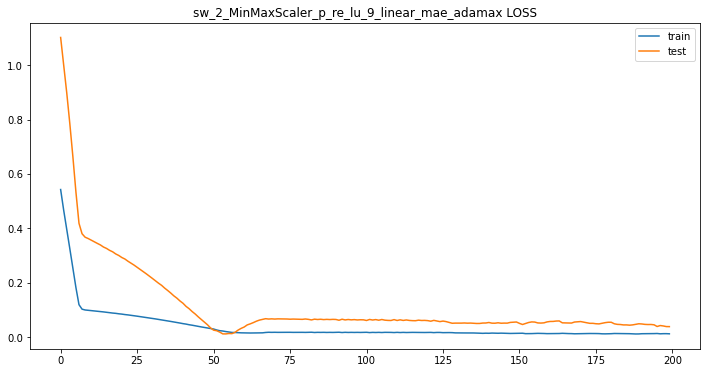


 sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adamax 데이터 비교


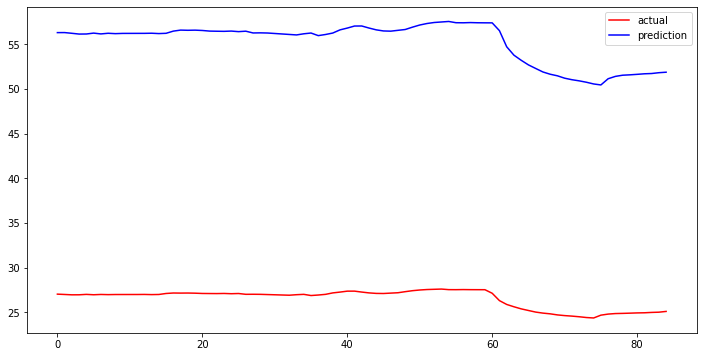

sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adamax metrics
mean_squared_error : 28.74332357091545
r2_score : -791.6193914739464
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adamax이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_532"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_532 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_532 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 12s - loss: 0.5364 - acc: 0.0021 - val_loss: 1.0732 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4290 - acc: 0.0021 - val_loss: 0.8890 - val_acc: 

Epoch 69/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0368 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0396 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0376 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0376 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.0376 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.0388 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0395 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.0391 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0387 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0116 - acc: 0.0043 - val_loss: 0.0385 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0149 - acc: 0.0043 - val_loss: 0.0342 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0112 - acc: 0.0043 - val_loss: 0.0405 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0148 - acc: 0.0043 - val_loss: 0.0346 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0116 - acc: 0.0043 - val_loss: 0.0367 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0309 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0135 - acc: 0.0043 - val_loss: 0.0323 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0130 - acc: 0.0043 - val_loss: 0.0306 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0108 - acc: 0.0043 - val_loss: 0.0377 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0139 - acc: 0.0043 - val_loss: 0.0343 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0112 - acc: 0.0043 - val_loss: 0.0388 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0148 - acc: 0.0

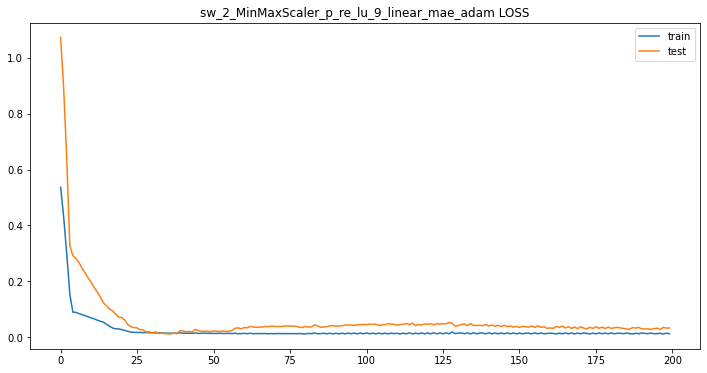


 sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adam 데이터 비교


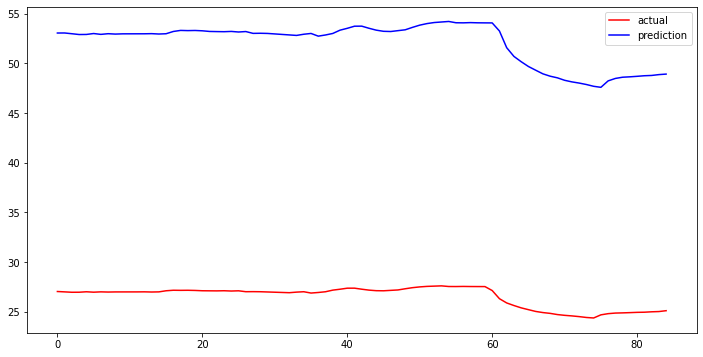

sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adam metrics
mean_squared_error : 25.588210776873765
r2_score : -627.1603968717353
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adam이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_533"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_533 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_533 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.5609 - acc: 0.0021 - val_loss: 1.1717 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5481 - acc: 0.0021 - val_loss: 1.1580 - val_acc: 0.

Epoch 69/200
32/32 - 0s - loss: 0.3027 - acc: 0.0021 - val_loss: 0.8008 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.3001 - acc: 0.0021 - val_loss: 0.7966 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.2976 - acc: 0.0021 - val_loss: 0.7925 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.2950 - acc: 0.0021 - val_loss: 0.7884 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.2925 - acc: 0.0021 - val_loss: 0.7842 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.2899 - acc: 0.0021 - val_loss: 0.7801 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.2874 - acc: 0.0021 - val_loss: 0.7761 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.2849 - acc: 0.0021 - val_loss: 0.7720 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.2824 - acc: 0.0021 - val_loss: 0.7679 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.2799 - acc: 0.0021 - val_loss: 0.7639 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.2775 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.1160 - acc: 0.0043 - val_loss: 0.4671 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1146 - acc: 0.0043 - val_loss: 0.4640 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1133 - acc: 0.0043 - val_loss: 0.4608 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1120 - acc: 0.0043 - val_loss: 0.4578 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.1108 - acc: 0.0043 - val_loss: 0.4547 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.1096 - acc: 0.0043 - val_loss: 0.4518 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.1085 - acc: 0.0043 - val_loss: 0.4489 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.1074 - acc: 0.0043 - val_loss: 0.4461 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.1064 - acc: 0.0043 - val_loss: 0.4434 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.1054 - acc: 0.0043 - val_loss: 0.4406 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.1045 - acc: 0.0

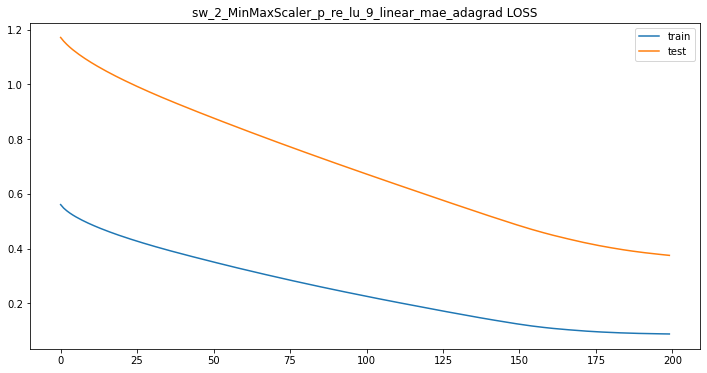


 sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adagrad 데이터 비교


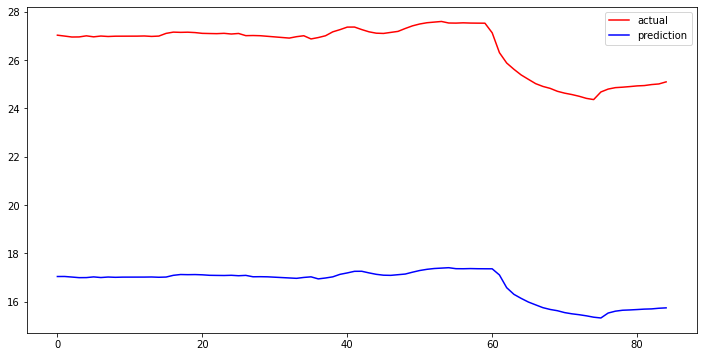

sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adagrad metrics
mean_squared_error : 9.806099328755046
r2_score : -91.25359929752177
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_534"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_534 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_534 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 12s - loss: 0.4986 - acc: 0.0021 - val_loss: 0.9910 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3787 - acc: 0.0021 - val_loss: 0.8008 - val

Epoch 69/200
32/32 - 0s - loss: 0.0138 - acc: 0.0043 - val_loss: 0.0506 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0527 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0139 - acc: 0.0043 - val_loss: 0.0472 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0460 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0470 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0138 - acc: 0.0043 - val_loss: 0.0480 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0494 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0497 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0497 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0132 - acc: 0.0043 - val_loss: 0.0474 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0132 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.0479 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0124 - acc: 0.0043 - val_loss: 0.0341 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0621 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0124 - acc: 0.0043 - val_loss: 0.0480 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.0482 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0325 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0581 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0579 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0687 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0293 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0118 - acc: 0.0

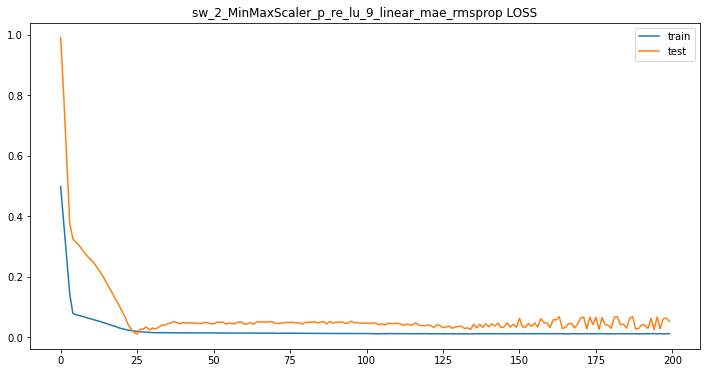


 sw_2_MinMaxScaler_p_re_lu_9_linear_mae_rmsprop 데이터 비교


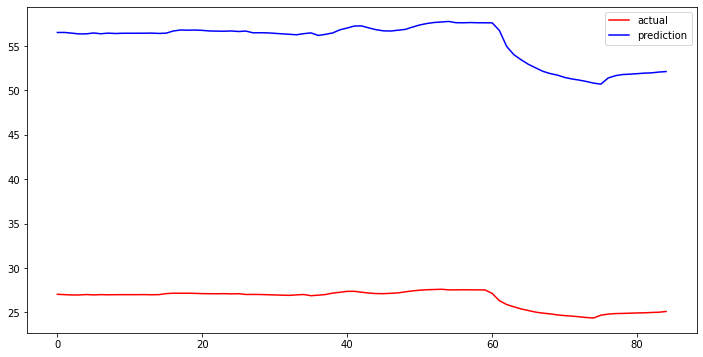

sw_2_MinMaxScaler_p_re_lu_9_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_rmsprop metrics
mean_squared_error : 28.988724193573848
r2_score : -805.2115845022864
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_9
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_535"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_535 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_535 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.5037 - acc: 0.0021 - val_loss: 1.0389 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3621 - acc: 0.0021 - val_loss: 0.

Epoch 69/200
32/32 - 0s - loss: 0.0902 - acc: 0.0043 - val_loss: 0.4311 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0898 - acc: 0.0043 - val_loss: 0.4250 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0878 - acc: 0.0043 - val_loss: 0.4197 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0864 - acc: 0.0043 - val_loss: 0.4135 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0843 - acc: 0.0043 - val_loss: 0.4067 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0827 - acc: 0.0043 - val_loss: 0.3990 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0807 - acc: 0.0043 - val_loss: 0.3936 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0791 - acc: 0.0043 - val_loss: 0.3878 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0778 - acc: 0.0043 - val_loss: 0.3816 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0763 - acc: 0.0043 - val_loss: 0.3743 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0748 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0132 - acc: 0.0043 - val_loss: 0.0205 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0132 - acc: 0.0043 - val_loss: 0.0218 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0130 - acc: 0.0043 - val_loss: 0.0082 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0235 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0130 - acc: 0.0043 - val_loss: 0.0164 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0128 - acc: 0.0043 - val_loss: 0.0169 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0127 - acc: 0.0043 - val_loss: 0.0264 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0130 - acc: 0.0043 - val_loss: 0.0101 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.0275 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0130 - acc: 0.0043 - val_loss: 0.0282 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0130 - acc: 0.0

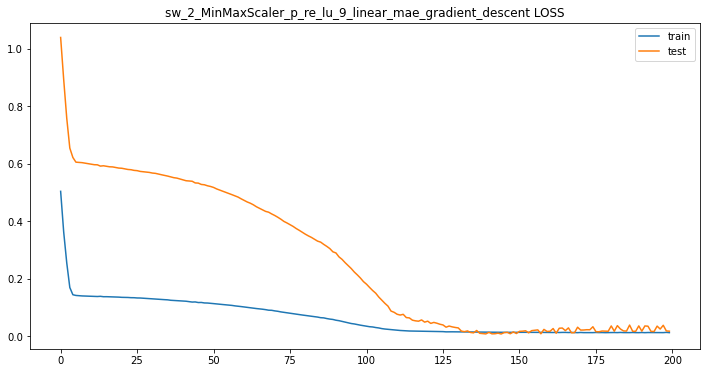


 sw_2_MinMaxScaler_p_re_lu_9_linear_mae_gradient_descent 데이터 비교


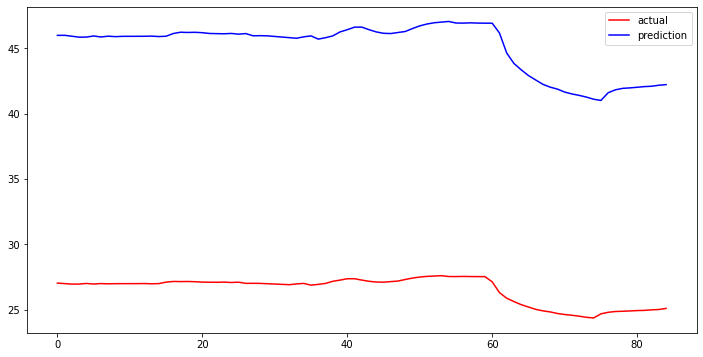

sw_2_MinMaxScaler_p_re_lu_9_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_gradient_descent metrics
mean_squared_error : 18.58387096408511
r2_score : -330.33181715894955
sw_2_MinMaxScaler_p_re_lu_9_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_536"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_536 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_536 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.3210 - acc: 0.0021 - val_loss: 1.1535 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2090 - acc: 0

Epoch 67/200
32/32 - 0s - loss: 3.9613e-04 - acc: 0.0043 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 3.9524e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 3.9448e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 3.9380e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 3.9327e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 3.9275e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 3.9227e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 3.9187e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 3.9151e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 3.9119e-04 - acc: 0.0043 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 77/200
32/32 -

32/32 - 0s - loss: 3.8973e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 3.8987e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 3.8984e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 3.8984e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 3.8986e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 3.8993e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 3.8985e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 3.8994e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 3.8996e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 3.8995e-04 - acc: 0.0043 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s

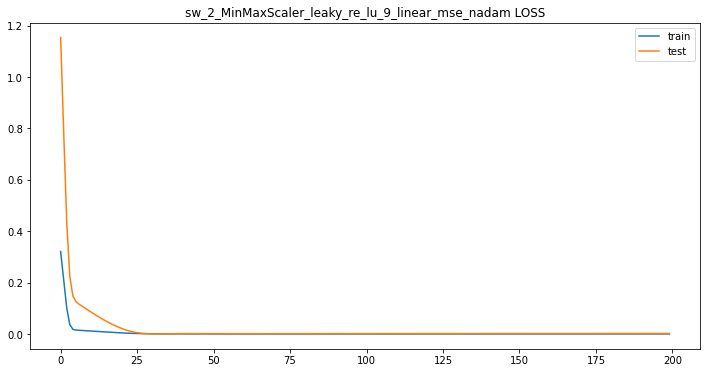


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_nadam 데이터 비교


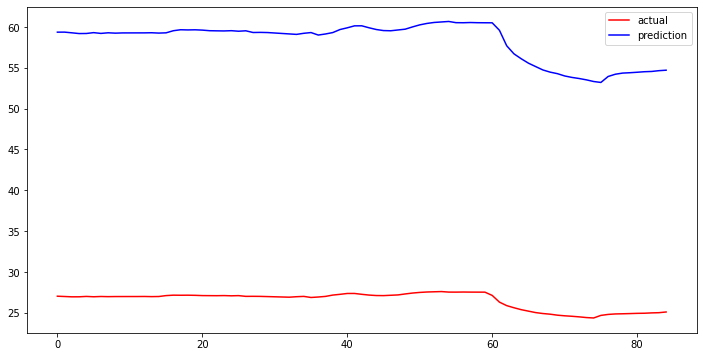

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_nadam metrics
mean_squared_error : 31.77225897586899
r2_score : -967.471707176525
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_537"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_537 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_537 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.2837 - acc: 0.0021 - val_loss: 1.0343 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2023 - acc: 0.0021 - val_loss: 0.829

Epoch 68/200
32/32 - 0s - loss: 6.1369e-04 - acc: 0.0043 - val_loss: 0.0036 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 5.8442e-04 - acc: 0.0043 - val_loss: 0.0040 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 5.6139e-04 - acc: 0.0043 - val_loss: 0.0045 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 5.4366e-04 - acc: 0.0043 - val_loss: 0.0049 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 5.3040e-04 - acc: 0.0043 - val_loss: 0.0053 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 5.2079e-04 - acc: 0.0043 - val_loss: 0.0057 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 5.1401e-04 - acc: 0.0043 - val_loss: 0.0060 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 5.0945e-04 - acc: 0.0043 - val_loss: 0.0062 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 5.0641e-04 - acc: 0.0043 - val_loss: 0.0064 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 5.0462e-04 - acc: 0.0043 - val_loss: 0.0066 - val_acc: 0.0000e+00
Epoch 78/200
32/32 -

32/32 - 0s - loss: 4.2005e-04 - acc: 0.0043 - val_loss: 0.0033 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 4.1897e-04 - acc: 0.0043 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 4.1796e-04 - acc: 0.0043 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 4.1699e-04 - acc: 0.0043 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 4.1606e-04 - acc: 0.0043 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 4.1509e-04 - acc: 0.0043 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 4.1412e-04 - acc: 0.0043 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 4.1314e-04 - acc: 0.0043 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 4.1225e-04 - acc: 0.0043 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 4.1138e-04 - acc: 0.0043 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s

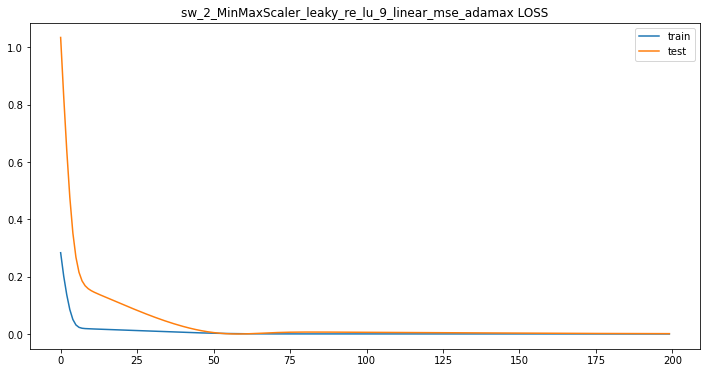


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adamax 데이터 비교


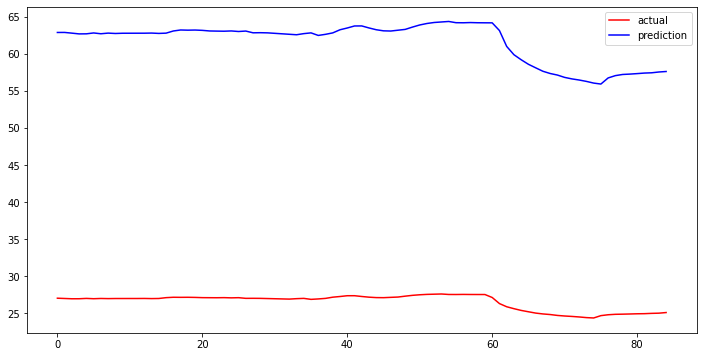

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adamax metrics
mean_squared_error : 35.145001672757466
r2_score : -1183.9988283307891
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_538"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_538 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_538 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.3065 - acc: 0.0021 - val_loss: 1.0771 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1944 - acc: 0.0021 - val_loss: 0

Epoch 67/200
32/32 - 0s - loss: 4.3443e-04 - acc: 0.0043 - val_loss: 0.0064 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 4.3256e-04 - acc: 0.0043 - val_loss: 0.0063 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 4.3082e-04 - acc: 0.0043 - val_loss: 0.0062 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 4.2918e-04 - acc: 0.0043 - val_loss: 0.0061 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 4.2765e-04 - acc: 0.0043 - val_loss: 0.0060 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 4.2622e-04 - acc: 0.0043 - val_loss: 0.0059 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 4.2479e-04 - acc: 0.0043 - val_loss: 0.0058 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 4.2340e-04 - acc: 0.0043 - val_loss: 0.0057 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 4.2205e-04 - acc: 0.0043 - val_loss: 0.0056 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 4.2073e-04 - acc: 0.0043 - val_loss: 0.0054 - val_acc: 0.0000e+00
Epoch 77/200
32/32 -

32/32 - 0s - loss: 4.0465e-04 - acc: 0.0043 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 4.0489e-04 - acc: 0.0043 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 4.0502e-04 - acc: 0.0043 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 4.0509e-04 - acc: 0.0043 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 4.0518e-04 - acc: 0.0043 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 4.0522e-04 - acc: 0.0043 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 4.0506e-04 - acc: 0.0043 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 4.0493e-04 - acc: 0.0043 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 4.0470e-04 - acc: 0.0043 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 4.0439e-04 - acc: 0.0043 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s

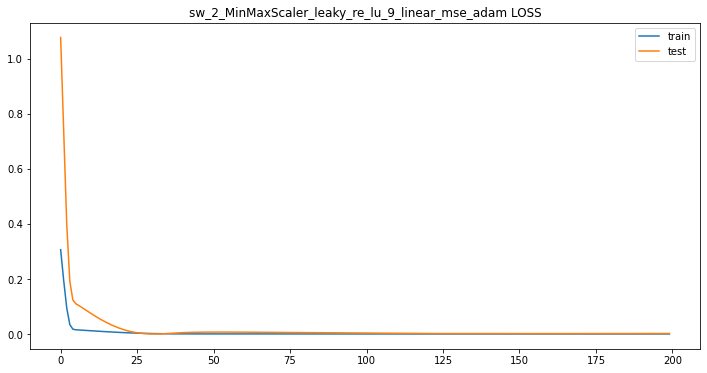


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adam 데이터 비교


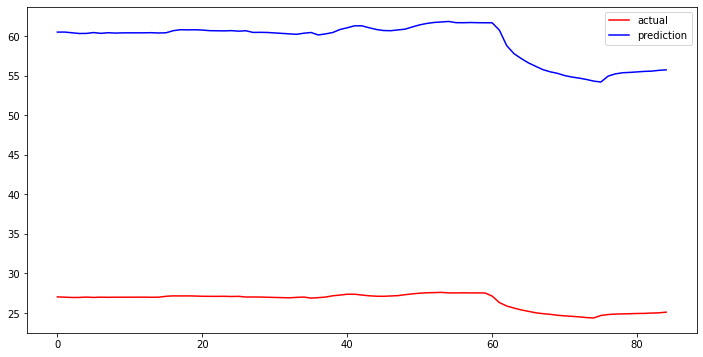

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adam metrics
mean_squared_error : 32.865433494022255
r2_score : -1035.2616442539222
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_539"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_539 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_539 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.3211 - acc: 0.0021 - val_loss: 1.2625 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3083 - acc: 0.0021 - val_loss: 1.23

Epoch 69/200
32/32 - 0s - loss: 0.1107 - acc: 0.0021 - val_loss: 0.6586 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.1092 - acc: 0.0021 - val_loss: 0.6532 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.1077 - acc: 0.0021 - val_loss: 0.6479 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.1063 - acc: 0.0021 - val_loss: 0.6427 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.1048 - acc: 0.0021 - val_loss: 0.6375 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.1034 - acc: 0.0021 - val_loss: 0.6324 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.1020 - acc: 0.0021 - val_loss: 0.6273 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.1007 - acc: 0.0021 - val_loss: 0.6223 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0993 - acc: 0.0021 - val_loss: 0.6173 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0980 - acc: 0.0021 - val_loss: 0.6124 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0967 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0367 - acc: 0.0043 - val_loss: 0.3460 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0364 - acc: 0.0043 - val_loss: 0.3438 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0360 - acc: 0.0043 - val_loss: 0.3416 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0356 - acc: 0.0043 - val_loss: 0.3394 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0352 - acc: 0.0043 - val_loss: 0.3373 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0349 - acc: 0.0043 - val_loss: 0.3352 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0345 - acc: 0.0043 - val_loss: 0.3331 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0342 - acc: 0.0043 - val_loss: 0.3310 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0338 - acc: 0.0043 - val_loss: 0.3289 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0335 - acc: 0.0043 - val_loss: 0.3269 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0332 - acc: 0.0

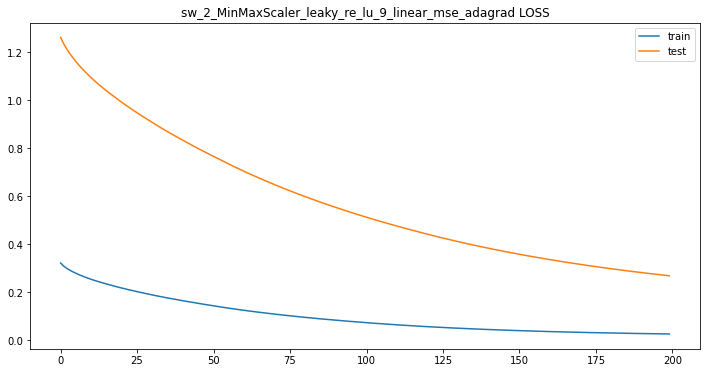


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adagrad 데이터 비교


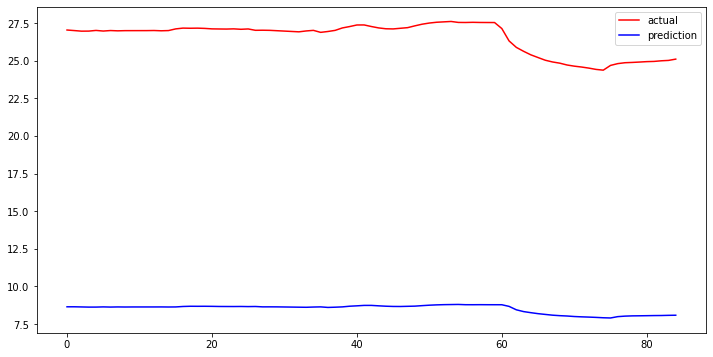

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adagrad metrics
mean_squared_error : 18.032070835411037
r2_score : -310.9478033215789
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_540"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_540 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_540 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 3s - loss: 0.2767 - acc: 0.0021 - val_loss: 0.9995 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1723 - acc: 0.0021 - val_lo

Epoch 67/200
32/32 - 0s - loss: 4.0974e-04 - acc: 0.0043 - val_loss: 0.0053 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 4.0956e-04 - acc: 0.0043 - val_loss: 0.0053 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 4.0923e-04 - acc: 0.0043 - val_loss: 0.0052 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 4.0908e-04 - acc: 0.0043 - val_loss: 0.0052 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 4.0882e-04 - acc: 0.0043 - val_loss: 0.0051 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 4.0877e-04 - acc: 0.0043 - val_loss: 0.0051 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 4.0865e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 4.0853e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 4.0840e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 4.0832e-04 - acc: 0.0043 - val_loss: 0.0049 - val_acc: 0.0000e+00
Epoch 77/200
32/32 -

32/32 - 0s - loss: 4.0690e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 4.0678e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 4.0698e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 4.0696e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 4.0705e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 4.0695e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 4.0676e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 4.0695e-04 - acc: 0.0043 - val_loss: 0.0050 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 4.0687e-04 - acc: 0.0043 - val_loss: 0.0051 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 4.0699e-04 - acc: 0.0043 - val_loss: 0.0051 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s

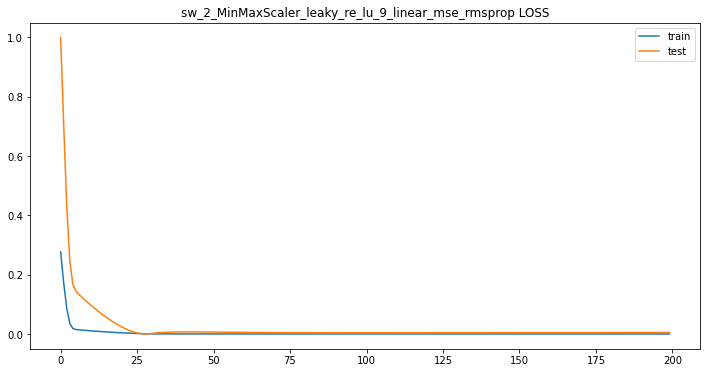


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_rmsprop 데이터 비교


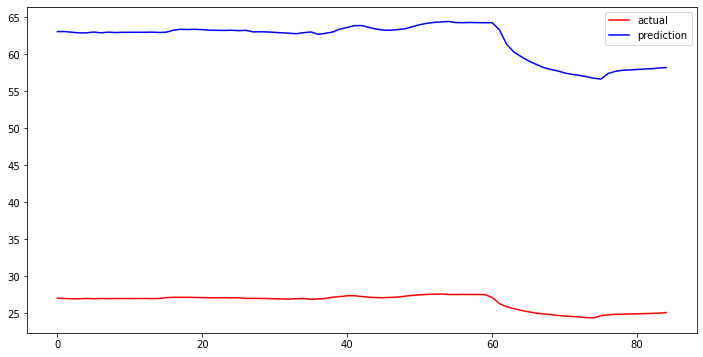

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_rmsprop metrics
mean_squared_error : 35.40070565592584
r2_score : -1201.3048114032904
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_541"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_541 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_541 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.2958 - acc: 0.0021 - val_loss: 1.0895 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1537 - acc: 0.0021

32/32 - 0s - loss: 0.0285 - acc: 0.0021 - val_loss: 0.2792 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0284 - acc: 0.0021 - val_loss: 0.2781 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0283 - acc: 0.0021 - val_loss: 0.2769 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0282 - acc: 0.0021 - val_loss: 0.2757 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0280 - acc: 0.0021 - val_loss: 0.2746 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0279 - acc: 0.0021 - val_loss: 0.2734 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0278 - acc: 0.0021 - val_loss: 0.2722 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0277 - acc: 0.0021 - val_loss: 0.2710 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0276 - acc: 0.0021 - val_loss: 0.2698 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0274 - acc: 0.0021 - val_loss: 0.2686 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0273 - acc: 0.0043 - val_loss: 0.2674 -

Epoch 155/200
32/32 - 0s - loss: 0.0154 - acc: 0.0043 - val_loss: 0.1505 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0152 - acc: 0.0043 - val_loss: 0.1488 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0150 - acc: 0.0043 - val_loss: 0.1472 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0149 - acc: 0.0043 - val_loss: 0.1455 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0147 - acc: 0.0043 - val_loss: 0.1438 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0145 - acc: 0.0043 - val_loss: 0.1421 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0144 - acc: 0.0043 - val_loss: 0.1404 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0142 - acc: 0.0043 - val_loss: 0.1387 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0140 - acc: 0.0043 - val_loss: 0.1370 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0139 - acc: 0.0043 - val_loss: 0.1353 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0137 - acc: 0.0

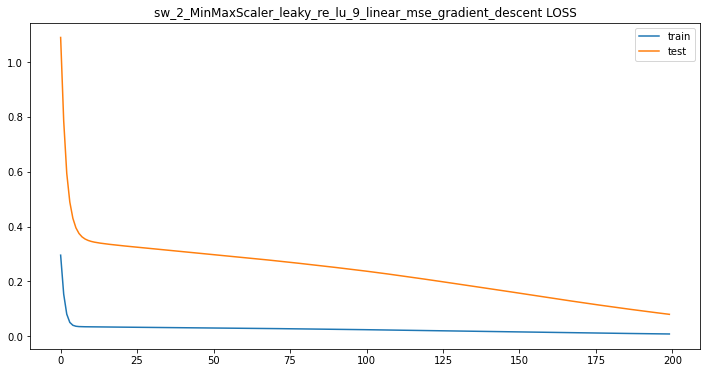


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_gradient_descent 데이터 비교


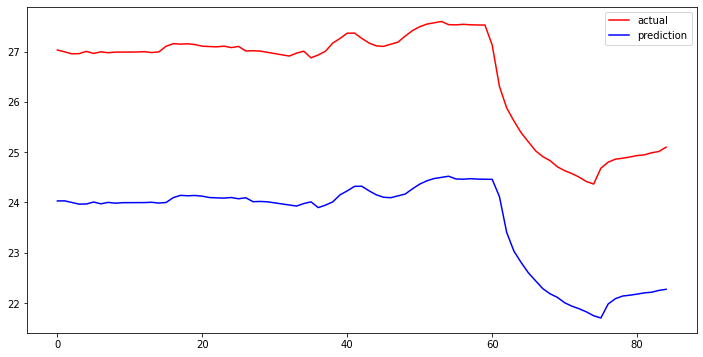

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_gradient_descent metrics
mean_squared_error : 2.9241061744147543
r2_score : -7.203082302795464
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_542"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_542 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_542 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.5101 - acc: 0.0021 - val_loss: 1.0050 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.38

Epoch 68/200
32/32 - 0s - loss: 0.0112 - acc: 0.0043 - val_loss: 0.0741 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0666 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0839 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0113 - acc: 0.0043 - val_loss: 0.0622 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0830 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0652 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.0825 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0115 - acc: 0.0043 - val_loss: 0.0657 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0688 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0692 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0110 - acc: 0.0043 - val_l

Epoch 155/200
32/32 - 0s - loss: 0.0107 - acc: 0.0043 - val_loss: 0.0853 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0117 - acc: 0.0043 - val_loss: 0.0670 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0109 - acc: 0.0043 - val_loss: 0.0830 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0115 - acc: 0.0043 - val_loss: 0.0668 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0108 - acc: 0.0043 - val_loss: 0.0799 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0113 - acc: 0.0043 - val_loss: 0.0658 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0108 - acc: 0.0043 - val_loss: 0.0829 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0114 - acc: 0.0043 - val_loss: 0.0661 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0108 - acc: 0.0043 - val_loss: 0.0834 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0115 - acc: 0.0043 - val_loss: 0.0665 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0109 - acc: 0.0

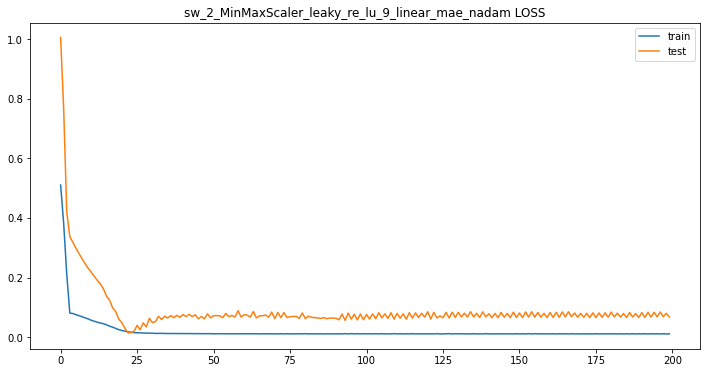


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_nadam 데이터 비교


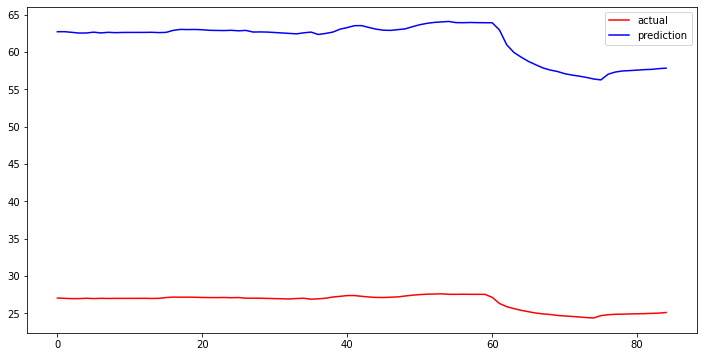

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_nadam metrics
mean_squared_error : 35.04847717024415
r2_score : -1177.4985783687764
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_543"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_543 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_543 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.5062 - acc: 0.0021 - val_loss: 1.0136 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4078 - acc: 0.0021 - val_loss: 0.

Epoch 69/200
32/32 - 0s - loss: 0.0179 - acc: 0.0043 - val_loss: 0.0770 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0175 - acc: 0.0043 - val_loss: 0.0769 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0168 - acc: 0.0043 - val_loss: 0.0788 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0173 - acc: 0.0043 - val_loss: 0.0781 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0177 - acc: 0.0043 - val_loss: 0.0754 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0165 - acc: 0.0043 - val_loss: 0.0778 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0163 - acc: 0.0043 - val_loss: 0.0797 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0175 - acc: 0.0043 - val_loss: 0.0756 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0170 - acc: 0.0043 - val_loss: 0.0764 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0167 - acc: 0.0043 - val_loss: 0.0764 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0168 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0448 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.0464 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0130 - acc: 0.0043 - val_loss: 0.0469 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0496 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0140 - acc: 0.0043 - val_loss: 0.0439 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0137 - acc: 0.0043 - val_loss: 0.0413 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0130 - acc: 0.0043 - val_loss: 0.0431 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0132 - acc: 0.0043 - val_loss: 0.0421 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.0458 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0135 - acc: 0.0043 - val_loss: 0.0430 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0120 - acc: 0.0

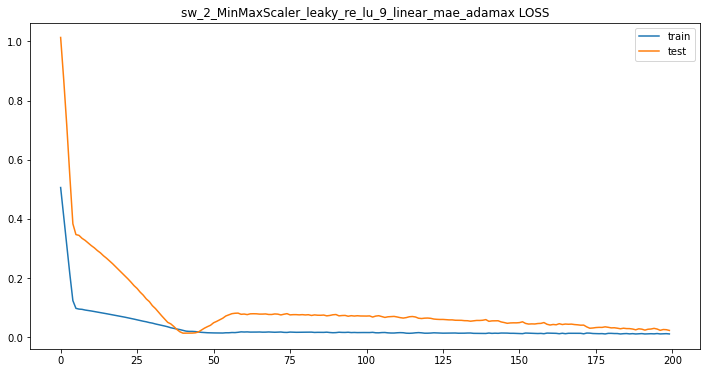


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adamax 데이터 비교


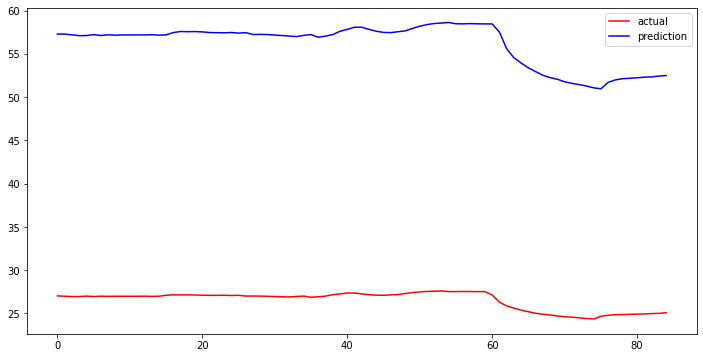

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adamax metrics
mean_squared_error : 29.663746665095047
r2_score : -843.1949022271298
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_544"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_544 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_544 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.5349 - acc: 0.0021 - val_loss: 1.0721 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4241 - acc: 0.0021 - val_loss: 0.

Epoch 69/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0410 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0108 - acc: 0.0043 - val_loss: 0.0421 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0120 - acc: 0.0043 - val_loss: 0.0438 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0450 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0134 - acc: 0.0043 - val_loss: 0.0432 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0107 - acc: 0.0043 - val_loss: 0.0446 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0437 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0427 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0412 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0108 - acc: 0.0043 - val_loss: 0.0427 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0127 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0127 - acc: 0.0043 - val_loss: 0.0519 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0556 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0145 - acc: 0.0043 - val_loss: 0.0568 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0128 - acc: 0.0043 - val_loss: 0.0516 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0111 - acc: 0.0043 - val_loss: 0.0551 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0146 - acc: 0.0043 - val_loss: 0.0522 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0113 - acc: 0.0043 - val_loss: 0.0560 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0139 - acc: 0.0043 - val_loss: 0.0519 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.0501 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0112 - acc: 0.0043 - val_loss: 0.0568 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0138 - acc: 0.0

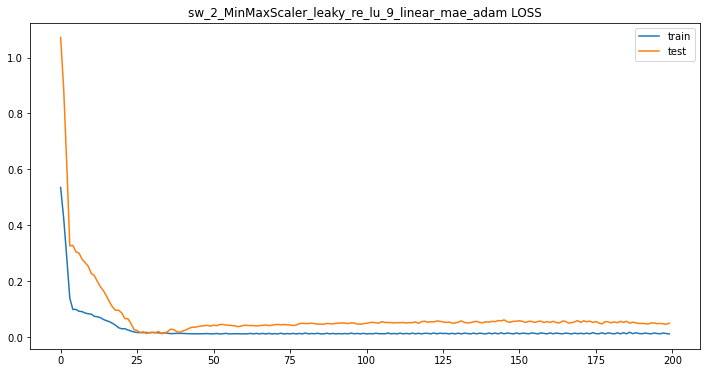


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adam 데이터 비교


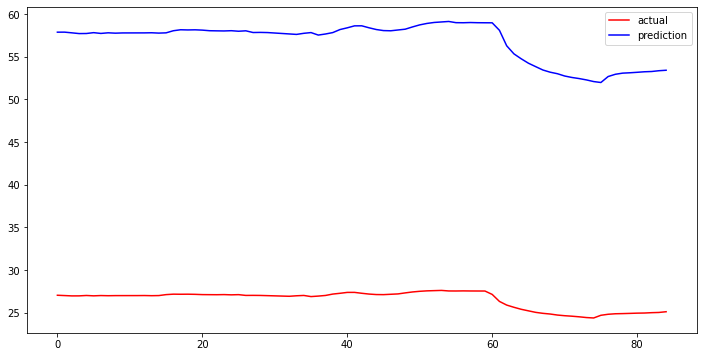

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adam metrics
mean_squared_error : 30.342806611879816
r2_score : -882.287928346551
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_545"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_545 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_545 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.5718 - acc: 0.0021 - val_loss: 1.1954 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5600 - acc: 0.0021 - val_loss: 1.1835

Epoch 69/200
32/32 - 0s - loss: 0.3489 - acc: 0.0021 - val_loss: 0.8959 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.3465 - acc: 0.0021 - val_loss: 0.8923 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.3442 - acc: 0.0021 - val_loss: 0.8887 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.3418 - acc: 0.0021 - val_loss: 0.8851 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.3394 - acc: 0.0021 - val_loss: 0.8815 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.3370 - acc: 0.0021 - val_loss: 0.8779 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.3347 - acc: 0.0021 - val_loss: 0.8743 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.3323 - acc: 0.0021 - val_loss: 0.8707 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.3300 - acc: 0.0021 - val_loss: 0.8672 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.3277 - acc: 0.0021 - val_loss: 0.8636 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.3254 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.1685 - acc: 0.0043 - val_loss: 0.5978 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1667 - acc: 0.0043 - val_loss: 0.5944 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1648 - acc: 0.0043 - val_loss: 0.5910 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1630 - acc: 0.0043 - val_loss: 0.5876 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.1612 - acc: 0.0043 - val_loss: 0.5842 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.1594 - acc: 0.0043 - val_loss: 0.5809 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.1577 - acc: 0.0043 - val_loss: 0.5776 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.1560 - acc: 0.0043 - val_loss: 0.5743 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.1542 - acc: 0.0043 - val_loss: 0.5710 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.1525 - acc: 0.0043 - val_loss: 0.5677 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.1508 - acc: 0.0

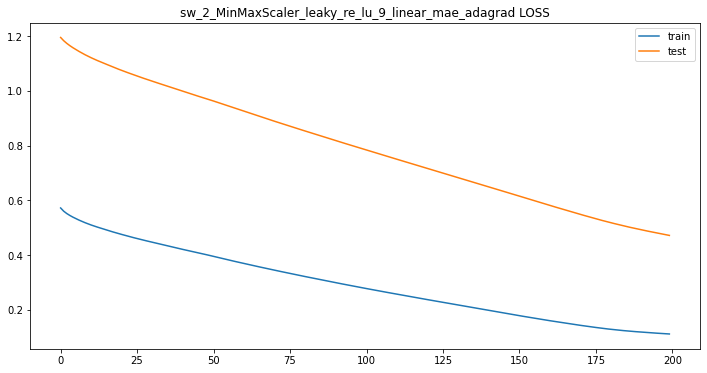


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adagrad 데이터 비교


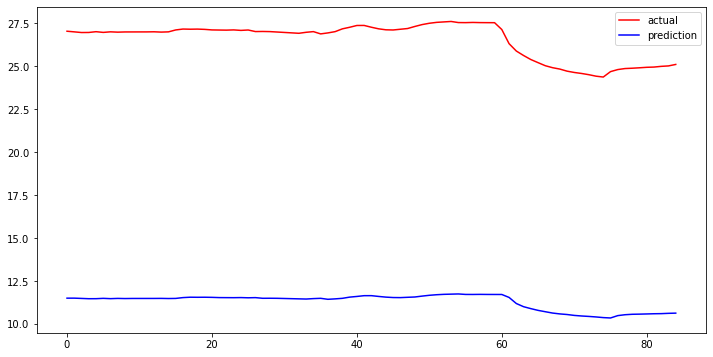

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adagrad metrics
mean_squared_error : 15.253159492764729
r2_score : -222.20833973688497
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_546"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_546 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_546 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.4910 - acc: 0.0021 - val_loss: 0.9800 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3599 - acc: 0.0021 - val_l

Epoch 69/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0639 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0630 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0609 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0541 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0519 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0515 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.0622 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0526 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0119 - acc: 0.0043 - val_loss: 0.0499 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0610 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0117 - acc: 0.0043 - val_loss: 0.0802 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0372 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0117 - acc: 0.0043 - val_loss: 0.0794 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0397 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0117 - acc: 0.0043 - val_loss: 0.0787 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0835 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0854 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0865 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0121 - acc: 0.0043 - val_loss: 0.0869 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0582 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0115 - acc: 0.0

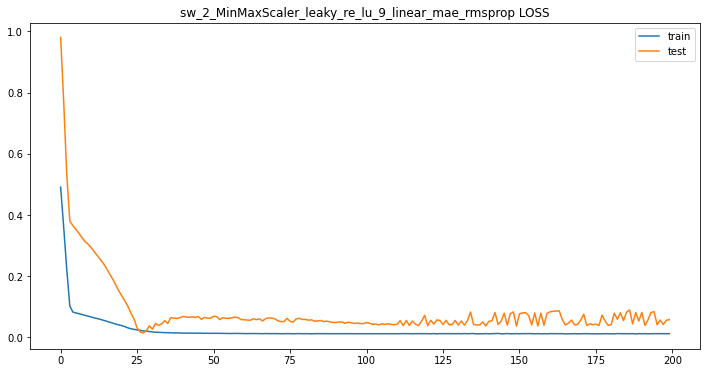


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_rmsprop 데이터 비교


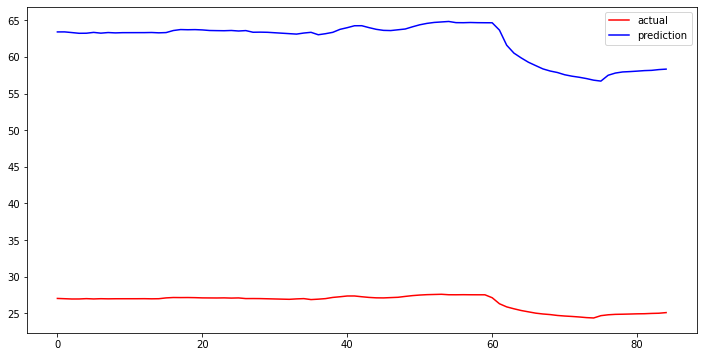

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_rmsprop metrics
mean_squared_error : 35.716465300400145
r2_score : -1222.8485394471782
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_9
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_547"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_547 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_547 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.4852 - acc: 0.0021 - val_loss: 0.9958 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3378 - acc: 0.00

32/32 - 0s - loss: 0.0608 - acc: 0.0043 - val_loss: 0.2834 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0590 - acc: 0.0043 - val_loss: 0.2761 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0570 - acc: 0.0043 - val_loss: 0.2695 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0557 - acc: 0.0043 - val_loss: 0.2582 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0534 - acc: 0.0043 - val_loss: 0.2539 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0503 - acc: 0.0043 - val_loss: 0.2427 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0483 - acc: 0.0043 - val_loss: 0.2332 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0467 - acc: 0.0043 - val_loss: 0.2206 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0456 - acc: 0.0043 - val_loss: 0.2104 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0432 - acc: 0.0043 - val_loss: 0.1972 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0408 - acc: 0.0043 - val_loss: 0.1861 -

Epoch 155/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0399 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0124 - acc: 0.0043 - val_loss: 0.0446 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0126 - acc: 0.0043 - val_loss: 0.0461 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0434 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0624 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0128 - acc: 0.0043 - val_loss: 0.0432 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0125 - acc: 0.0043 - val_loss: 0.0622 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0129 - acc: 0.0043 - val_loss: 0.0599 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0123 - acc: 0.0043 - val_loss: 0.0447 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0122 - acc: 0.0043 - val_loss: 0.0427 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0125 - acc: 0.0

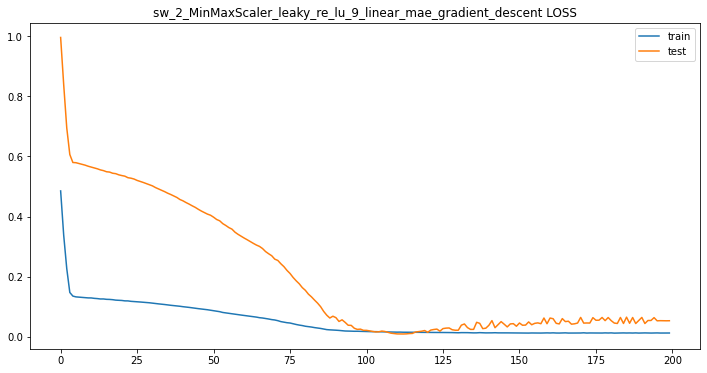


 sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_gradient_descent 데이터 비교


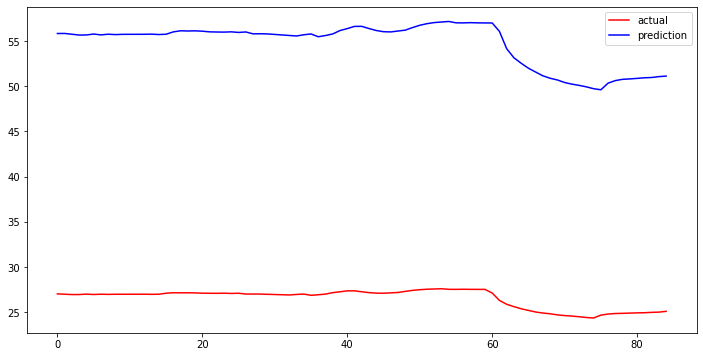

sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_gradient_descent metrics
mean_squared_error : 28.23903314853507
r2_score : -764.0509626273769
sw_2_MinMaxScaler_leaky_re_lu_9_linear_mae_gradient_descent이 완료되었습니다.
train_X.shape : (469, 1, 2) 
train_y.shape : (469, 1) 
valid_X.shape :  (118, 1, 2) 
valid_y.shape : (118, 1) 
test_X.shape :  (85, 1, 2)
scaler_data가 완료되었습니다.

Scaler : StandardScaler
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_548"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_548 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_548 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
___________________

Epoch 61/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1234 - val_acc: 0.0000e+00
Epoch 62/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1299 - val_acc: 0.0000e+00
Epoch 63/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1286 - val_acc: 0.0000e+00
Epoch 64/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1335 - val_acc: 0.0000e+00
Epoch 65/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1323 - val_acc: 0.0000e+00
Epoch 66/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1379 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1362 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1433 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1392 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1479 - val_acc: 0.0000e+00
Epoch 71/200
32/32 -

Epoch 145/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2705 - val_acc: 0.0000e+00
Epoch 146/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2862 - val_acc: 0.0000e+00
Epoch 147/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2738 - val_acc: 0.0000e+00
Epoch 148/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2894 - val_acc: 0.0000e+00
Epoch 149/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2769 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2924 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2785 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2957 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2823 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2969 - val_acc: 0.0000e+00
Epoch 155/

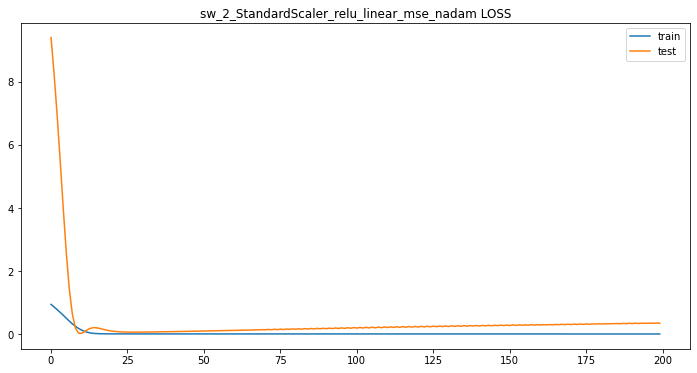


 sw_2_StandardScaler_relu_linear_mse_nadam 데이터 비교


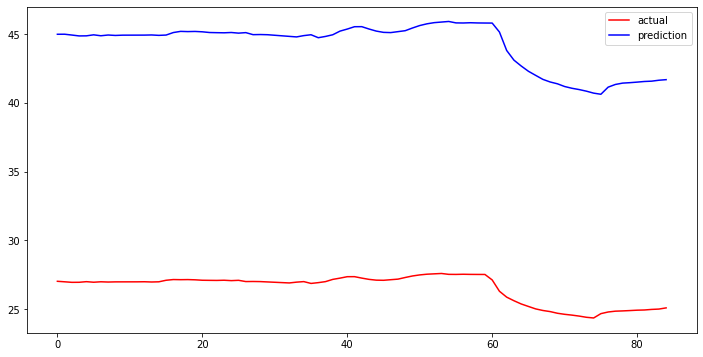

sw_2_StandardScaler_relu_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mse_nadam metrics
mean_squared_error : 17.690076660542186
r2_score : -299.2272886184264
sw_2_StandardScaler_relu_linear_mse_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_549"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_549 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_549 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 1.0193 - acc: 0.0000e+00 - val_loss: 9.9554 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.9912 - acc: 0.0000e+00 - val_loss: 9.6876 - val_acc: 0.0000e

Epoch 66/200
32/32 - 0s - loss: 0.0144 - acc: 0.0000e+00 - val_loss: 0.1394 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0140 - acc: 0.0000e+00 - val_loss: 0.1312 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0136 - acc: 0.0000e+00 - val_loss: 0.1233 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0132 - acc: 0.0000e+00 - val_loss: 0.1161 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0129 - acc: 0.0000e+00 - val_loss: 0.1093 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0127 - acc: 0.0000e+00 - val_loss: 0.1033 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0125 - acc: 0.0000e+00 - val_loss: 0.0979 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0123 - acc: 0.0000e+00 - val_loss: 0.0931 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0122 - acc: 0.0000e+00 - val_loss: 0.0888 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0120 - acc: 0.0000e+00 - val_loss: 0.0852 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.1430 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.1416 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.1456 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1442 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1482 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1467 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1509 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1493 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1534 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1518 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

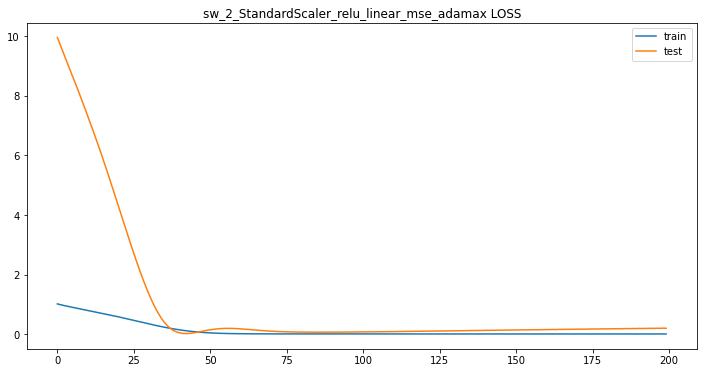


 sw_2_StandardScaler_relu_linear_mse_adamax 데이터 비교


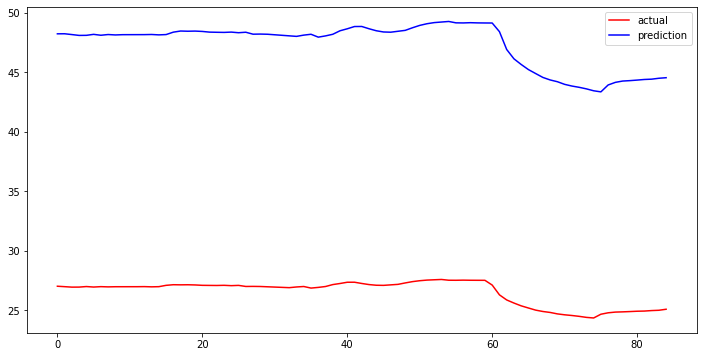

sw_2_StandardScaler_relu_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mse_adamax metrics
mean_squared_error : 20.849539757641384
r2_score : -416.0457196100926
sw_2_StandardScaler_relu_linear_mse_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_550"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_550 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_550 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 1.0093 - acc: 0.0000e+00 - val_loss: 9.8075 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.9328 - acc: 0.0000e+00 - val_loss: 8.9861 - val_acc: 0.0000

Epoch 66/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.0870 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.0868 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.0899 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.0904 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.0928 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.0950 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.0961 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.0989 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.0988 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0108 - acc: 0.0000e+00 - val_loss: 0.1033 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.3133 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.2110 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.3294 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.2057 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.3465 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.2011 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.3598 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.2014 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.3645 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.2134 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

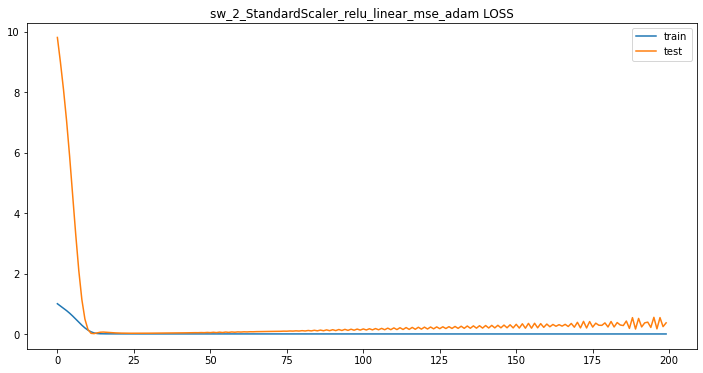


 sw_2_StandardScaler_relu_linear_mse_adam 데이터 비교


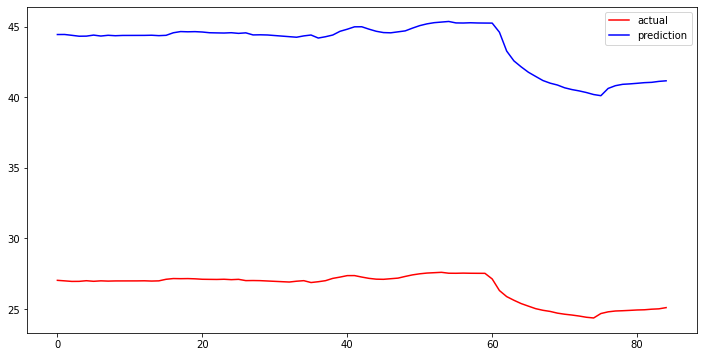

sw_2_StandardScaler_relu_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mse_adam metrics
mean_squared_error : 17.153973871382636
r2_score : -281.3061160176155
sw_2_StandardScaler_relu_linear_mse_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_551"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_551 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_551 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 1.0123 - acc: 0.0000e+00 - val_loss: 9.8862 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.0020 - acc: 0.0000e+00 - val_loss: 9.8263 - val_acc: 0.0000e+0

Epoch 66/200
32/32 - 0s - loss: 0.8325 - acc: 0.0000e+00 - val_loss: 8.4566 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.8309 - acc: 0.0000e+00 - val_loss: 8.4413 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.8293 - acc: 0.0000e+00 - val_loss: 8.4262 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.8277 - acc: 0.0000e+00 - val_loss: 8.4111 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.8261 - acc: 0.0000e+00 - val_loss: 8.3960 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.8245 - acc: 0.0000e+00 - val_loss: 8.3811 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.8229 - acc: 0.0000e+00 - val_loss: 8.3661 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.8214 - acc: 0.0000e+00 - val_loss: 8.3512 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.8198 - acc: 0.0000e+00 - val_loss: 8.3364 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.8182 - acc: 0.0000e+00 - val_loss: 8.3216 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.7203 - acc: 0.0000e+00 - val_loss: 7.3247 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.7191 - acc: 0.0000e+00 - val_loss: 7.3120 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.7179 - acc: 0.0000e+00 - val_loss: 7.2994 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.7168 - acc: 0.0000e+00 - val_loss: 7.2868 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.7156 - acc: 0.0000e+00 - val_loss: 7.2742 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.7144 - acc: 0.0000e+00 - val_loss: 7.2617 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.7133 - acc: 0.0000e+00 - val_loss: 7.2491 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.7121 - acc: 0.0000e+00 - val_loss: 7.2366 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.7110 - acc: 0.0000e+00 - val_loss: 7.2240 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.7098 - acc: 0.0000e+00 - val_loss: 7.2115 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

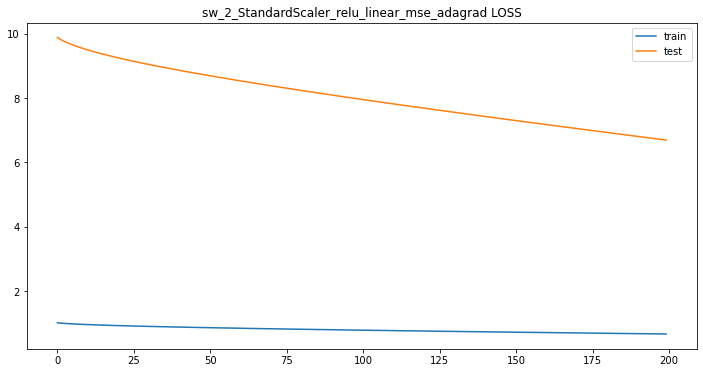


 sw_2_StandardScaler_relu_linear_mse_adagrad 데이터 비교


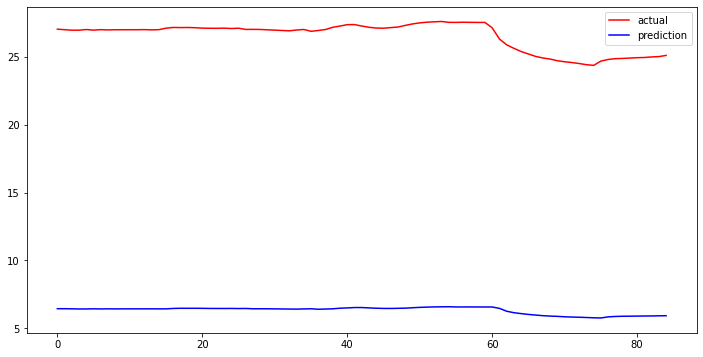

sw_2_StandardScaler_relu_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mse_adagrad metrics
mean_squared_error : 20.22643953347133
r2_score : -391.4909831287705
sw_2_StandardScaler_relu_linear_mse_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_552"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_552 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_552 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.9284 - acc: 0.0000e+00 - val_loss: 9.7163 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8559 - acc: 0.0000e+00 - val_loss: 9.0298 - val_acc: 0

Epoch 66/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0543 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0545 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0557 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0566 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0567 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0584 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0582 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0599 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0615 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0614 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1110 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1120 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1118 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1127 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1142 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1136 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1144 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1146 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1155 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1157 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

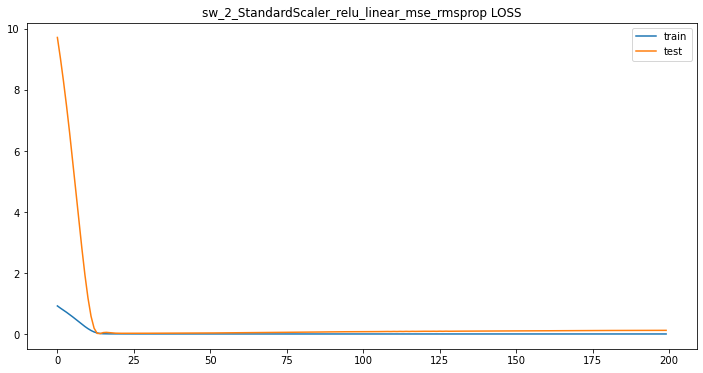


 sw_2_StandardScaler_relu_linear_mse_rmsprop 데이터 비교


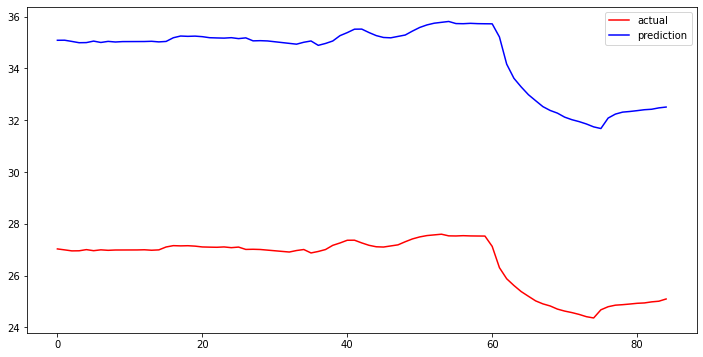

sw_2_StandardScaler_relu_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mse_rmsprop metrics
mean_squared_error : 7.954233867933558
r2_score : -59.699829566936906
sw_2_StandardScaler_relu_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_553"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_553 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_553 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 1.0357 - acc: 0.0000e+00 - val_loss: 10.3265 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.9904 - acc: 0.0000e+00 - val_loss: 9.8804 -

Epoch 66/200
32/32 - 0s - loss: 0.0147 - acc: 0.0000e+00 - val_loss: 0.0495 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0147 - acc: 0.0000e+00 - val_loss: 0.0490 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0147 - acc: 0.0000e+00 - val_loss: 0.0485 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0146 - acc: 0.0000e+00 - val_loss: 0.0479 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0146 - acc: 0.0000e+00 - val_loss: 0.0474 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0146 - acc: 0.0000e+00 - val_loss: 0.0469 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0145 - acc: 0.0000e+00 - val_loss: 0.0463 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0145 - acc: 0.0000e+00 - val_loss: 0.0458 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0145 - acc: 0.0000e+00 - val_loss: 0.0453 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0145 - acc: 0.0000e+00 - val_loss: 0.0448 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 149/200
32/32 - 0s - loss: 0.0129 - acc: 0.0000e+00 - val_loss: 0.0163 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0129 - acc: 0.0000e+00 - val_loss: 0.0160 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0158 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0156 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0154 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0152 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0149 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0147 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0127 - acc: 0.0000e+00 - val_loss: 0.0145 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0127 - acc: 0.0000e+00 - val_loss: 0.0143 - val_acc: 0.0000e+00
Epoch 159/

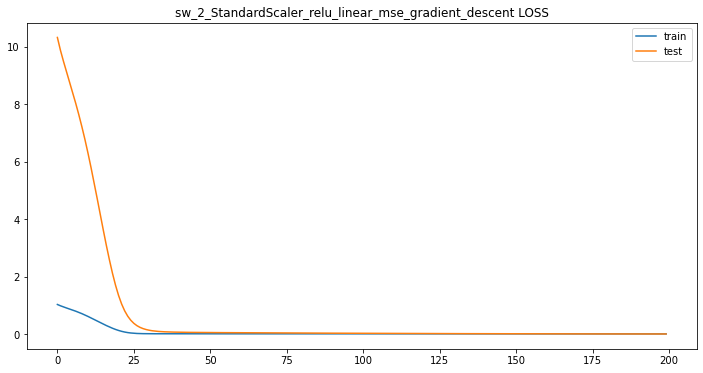


 sw_2_StandardScaler_relu_linear_mse_gradient_descent 데이터 비교


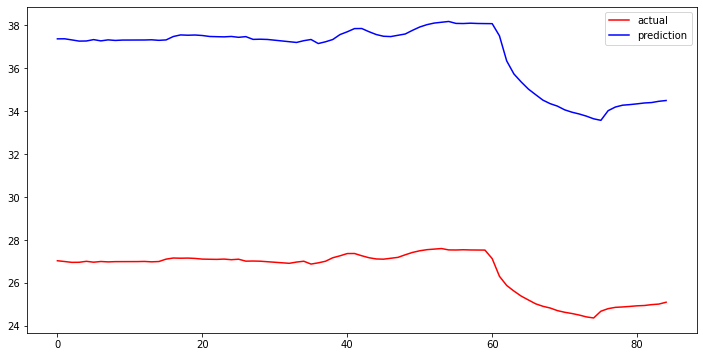

sw_2_StandardScaler_relu_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mse_gradient_descent metrics
mean_squared_error : 10.168627523799534
r2_score : -98.20086420518696
sw_2_StandardScaler_relu_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_554"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_554 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_554 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.7174 - acc: 0.0000e+00 - val_loss: 2.9524 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.6769 - acc: 0.0000e+00 - val

Epoch 66/200
32/32 - 0s - loss: 0.0587 - acc: 0.0000e+00 - val_loss: 0.3391 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0588 - acc: 0.0000e+00 - val_loss: 0.3642 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0585 - acc: 0.0000e+00 - val_loss: 0.3827 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0580 - acc: 0.0000e+00 - val_loss: 0.3901 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0581 - acc: 0.0000e+00 - val_loss: 0.3168 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0593 - acc: 0.0000e+00 - val_loss: 0.3587 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0582 - acc: 0.0000e+00 - val_loss: 0.3351 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0590 - acc: 0.0000e+00 - val_loss: 0.3619 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0581 - acc: 0.0000e+00 - val_loss: 0.3704 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0582 - acc: 0.0000e+00 - val_loss: 0.3574 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.3303 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0568 - acc: 0.0000e+00 - val_loss: 0.3442 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0567 - acc: 0.0000e+00 - val_loss: 0.3223 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.3473 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0564 - acc: 0.0000e+00 - val_loss: 0.3331 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.3384 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.3387 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.3130 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0572 - acc: 0.0000e+00 - val_loss: 0.3417 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.3606 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

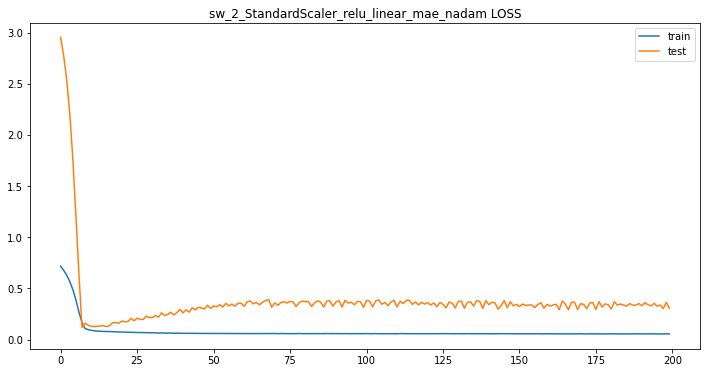


 sw_2_StandardScaler_relu_linear_mae_nadam 데이터 비교


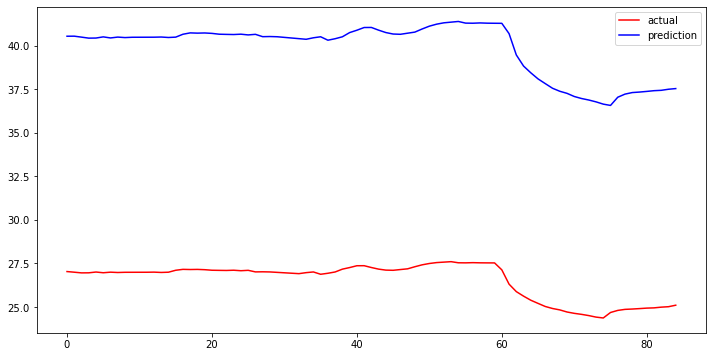

sw_2_StandardScaler_relu_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mae_nadam metrics
mean_squared_error : 13.319464209608984
r2_score : -169.20185525656368
sw_2_StandardScaler_relu_linear_mae_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_555"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_555 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_555 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.7494 - acc: 0.0000e+00 - val_loss: 3.2052 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7240 - acc: 0.0000e+00 - val_loss: 3.1223 - val_acc: 0.0000

Epoch 66/200
32/32 - 0s - loss: 0.0715 - acc: 0.0000e+00 - val_loss: 0.1254 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0710 - acc: 0.0000e+00 - val_loss: 0.1214 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0706 - acc: 0.0000e+00 - val_loss: 0.1305 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0702 - acc: 0.0000e+00 - val_loss: 0.1277 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0699 - acc: 0.0000e+00 - val_loss: 0.1231 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0694 - acc: 0.0000e+00 - val_loss: 0.1225 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0692 - acc: 0.0000e+00 - val_loss: 0.1316 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0690 - acc: 0.0000e+00 - val_loss: 0.1257 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0684 - acc: 0.0000e+00 - val_loss: 0.1231 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0681 - acc: 0.0000e+00 - val_loss: 0.1223 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.0748 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0562 - acc: 0.0000e+00 - val_loss: 0.0752 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.0743 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.0748 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.0750 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0559 - acc: 0.0000e+00 - val_loss: 0.0752 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.0751 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.0752 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.0745 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0559 - acc: 0.0000e+00 - val_loss: 0.0751 - val_acc: 0.0000e+00
Epoch 160/

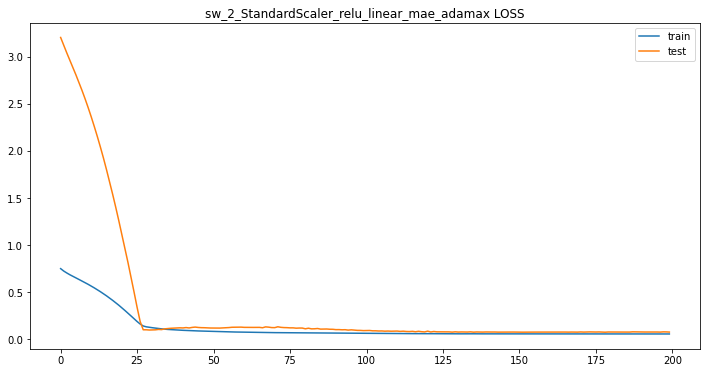


 sw_2_StandardScaler_relu_linear_mae_adamax 데이터 비교


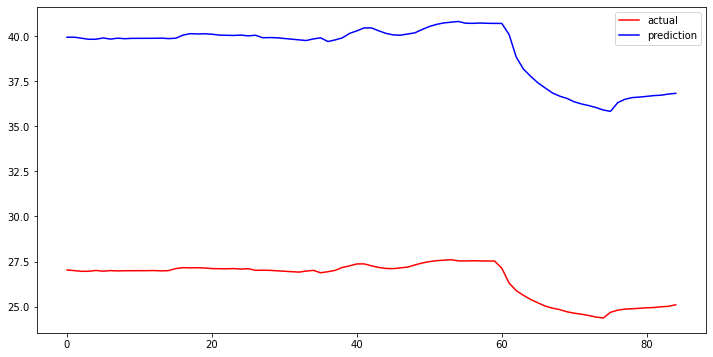

sw_2_StandardScaler_relu_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mae_adamax metrics
mean_squared_error : 12.700014754159122
r2_score : -153.7388013609006
sw_2_StandardScaler_relu_linear_mae_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_556"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_556 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_556 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.7203 - acc: 0.0000e+00 - val_loss: 2.8978 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.6772 - acc: 0.0000e+00 - val_loss: 2.6847 - val_acc: 0.0000

Epoch 66/200
32/32 - 0s - loss: 0.0588 - acc: 0.0000e+00 - val_loss: 0.3546 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0606 - acc: 0.0000e+00 - val_loss: 0.4211 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0605 - acc: 0.0000e+00 - val_loss: 0.4531 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0584 - acc: 0.0000e+00 - val_loss: 0.3889 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0595 - acc: 0.0000e+00 - val_loss: 0.4234 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0581 - acc: 0.0000e+00 - val_loss: 0.3912 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0586 - acc: 0.0000e+00 - val_loss: 0.4260 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0590 - acc: 0.0000e+00 - val_loss: 0.4522 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0583 - acc: 0.0000e+00 - val_loss: 0.3639 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0599 - acc: 0.0000e+00 - val_loss: 0.4311 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.3821 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.3738 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0592 - acc: 0.0000e+00 - val_loss: 0.4269 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0570 - acc: 0.0000e+00 - val_loss: 0.3618 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0573 - acc: 0.0000e+00 - val_loss: 0.4194 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.3977 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0569 - acc: 0.0000e+00 - val_loss: 0.3995 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0567 - acc: 0.0000e+00 - val_loss: 0.3507 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0572 - acc: 0.0000e+00 - val_loss: 0.3975 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0583 - acc: 0.0000e+00 - val_loss: 0.4156 - val_acc: 0.0000e+00
Epoch 160/

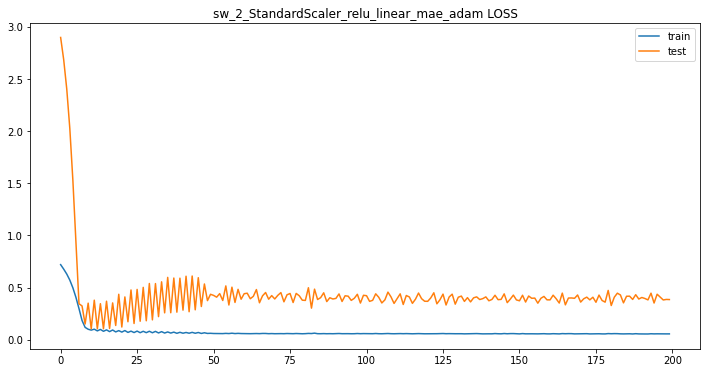


 sw_2_StandardScaler_relu_linear_mae_adam 데이터 비교


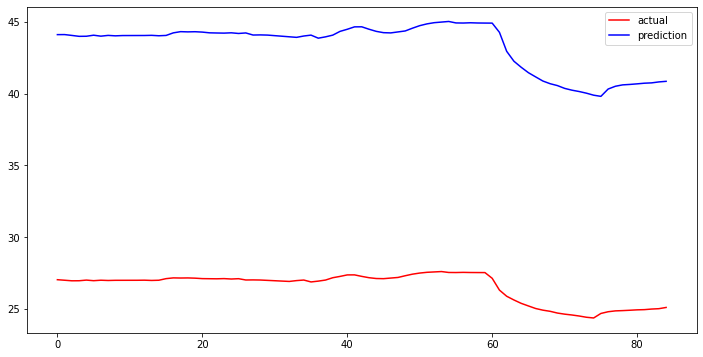

sw_2_StandardScaler_relu_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mae_adam metrics
mean_squared_error : 16.82208319174995
r2_score : -270.48778442872725
sw_2_StandardScaler_relu_linear_mae_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_557"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_557 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_557 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.7565 - acc: 0.0000e+00 - val_loss: 3.2054 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7535 - acc: 0.0000e+00 - val_loss: 3.1953 - val_acc: 0.0000e+0

Epoch 66/200
32/32 - 0s - loss: 0.6851 - acc: 0.0000e+00 - val_loss: 2.9096 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.6844 - acc: 0.0000e+00 - val_loss: 2.9063 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.6837 - acc: 0.0000e+00 - val_loss: 2.9031 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.6830 - acc: 0.0000e+00 - val_loss: 2.8998 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.6822 - acc: 0.0000e+00 - val_loss: 2.8966 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.6815 - acc: 0.0000e+00 - val_loss: 2.8934 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.6808 - acc: 0.0000e+00 - val_loss: 2.8902 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.6801 - acc: 0.0000e+00 - val_loss: 2.8870 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.6794 - acc: 0.0000e+00 - val_loss: 2.8838 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.6787 - acc: 0.0000e+00 - val_loss: 2.8806 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.6312 - acc: 0.0000e+00 - val_loss: 2.6592 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.6306 - acc: 0.0000e+00 - val_loss: 2.6562 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.6300 - acc: 0.0000e+00 - val_loss: 2.6533 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.6294 - acc: 0.0000e+00 - val_loss: 2.6504 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.6287 - acc: 0.0000e+00 - val_loss: 2.6474 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.6281 - acc: 0.0000e+00 - val_loss: 2.6445 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.6275 - acc: 0.0000e+00 - val_loss: 2.6416 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.6269 - acc: 0.0000e+00 - val_loss: 2.6386 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.6263 - acc: 0.0000e+00 - val_loss: 2.6357 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.6257 - acc: 0.0000e+00 - val_loss: 2.6328 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

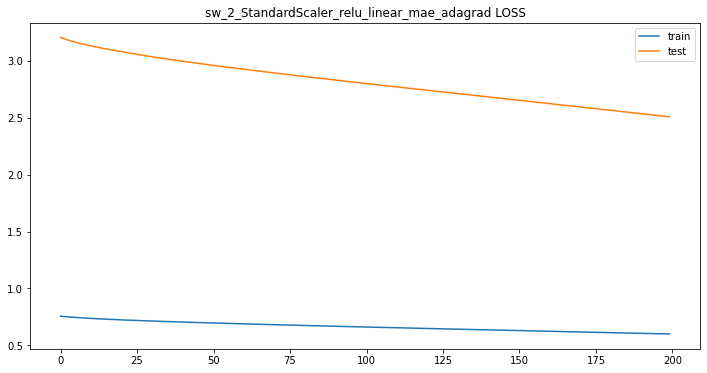


 sw_2_StandardScaler_relu_linear_mae_adagrad 데이터 비교


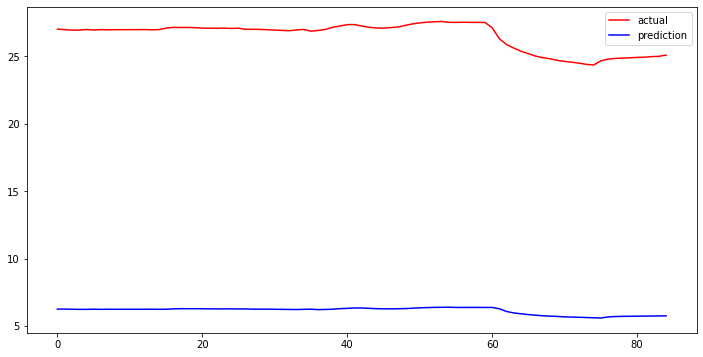

sw_2_StandardScaler_relu_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mae_adagrad metrics
mean_squared_error : 20.42469914003478
r2_score : -399.2230378118306
sw_2_StandardScaler_relu_linear_mae_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_558"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_558 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_558 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.7143 - acc: 0.0000e+00 - val_loss: 3.0292 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.6684 - acc: 0.0000e+00 - val_loss: 2.9050 - val_acc: 0

Epoch 66/200
32/32 - 0s - loss: 0.0576 - acc: 0.0000e+00 - val_loss: 0.1170 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.1550 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.1278 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.1181 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.1518 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0573 - acc: 0.0000e+00 - val_loss: 0.1694 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0571 - acc: 0.0000e+00 - val_loss: 0.1786 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.1372 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0576 - acc: 0.0000e+00 - val_loss: 0.1261 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.1219 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0559 - acc: 0.0000e+00 - val_loss: 0.3197 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.3169 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.3414 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0561 - acc: 0.0000e+00 - val_loss: 0.2449 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0558 - acc: 0.0000e+00 - val_loss: 0.3039 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0561 - acc: 0.0000e+00 - val_loss: 0.3207 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0562 - acc: 0.0000e+00 - val_loss: 0.3420 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0559 - acc: 0.0000e+00 - val_loss: 0.3306 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0559 - acc: 0.0000e+00 - val_loss: 0.2352 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0561 - acc: 0.0000e+00 - val_loss: 0.2551 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

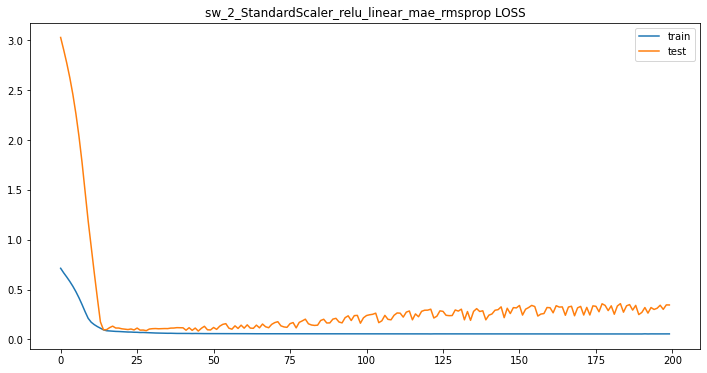


 sw_2_StandardScaler_relu_linear_mae_rmsprop 데이터 비교


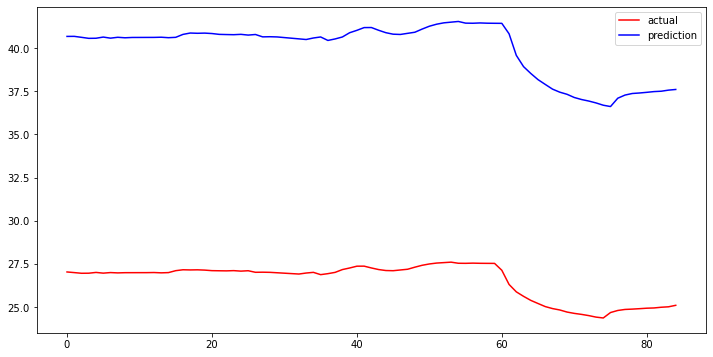

sw_2_StandardScaler_relu_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mae_rmsprop metrics
mean_squared_error : 13.43548994777335
r2_score : -172.18000762286871
sw_2_StandardScaler_relu_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_559"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_559 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_559 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.7430 - acc: 0.0000e+00 - val_loss: 3.1334 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7297 - acc: 0.0000e+00 - val_loss: 3.0859 - 

Epoch 66/200
32/32 - 0s - loss: 0.0823 - acc: 0.0000e+00 - val_loss: 0.3221 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0815 - acc: 0.0000e+00 - val_loss: 0.3442 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0811 - acc: 0.0000e+00 - val_loss: 0.3246 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0800 - acc: 0.0000e+00 - val_loss: 0.3163 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0791 - acc: 0.0000e+00 - val_loss: 0.3368 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0788 - acc: 0.0000e+00 - val_loss: 0.3205 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0774 - acc: 0.0000e+00 - val_loss: 0.3333 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0772 - acc: 0.0000e+00 - val_loss: 0.3100 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0760 - acc: 0.0000e+00 - val_loss: 0.3226 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0761 - acc: 0.0000e+00 - val_loss: 0.2947 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0578 - acc: 0.0000e+00 - val_loss: 0.1133 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.1091 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.1543 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0578 - acc: 0.0000e+00 - val_loss: 0.1297 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.1208 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.1152 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.1137 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.1559 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0580 - acc: 0.0000e+00 - val_loss: 0.1264 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0573 - acc: 0.0000e+00 - val_loss: 0.1132 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

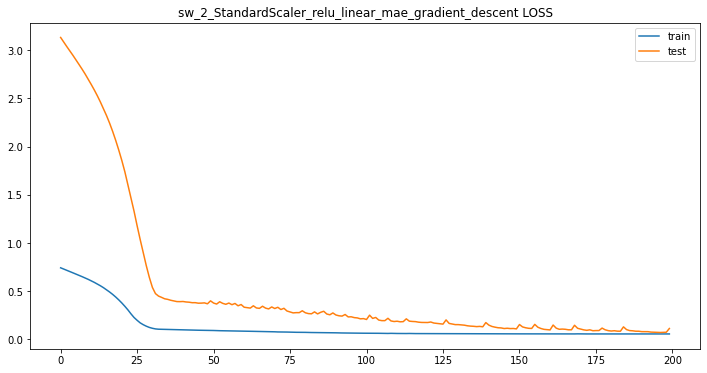


 sw_2_StandardScaler_relu_linear_mae_gradient_descent 데이터 비교


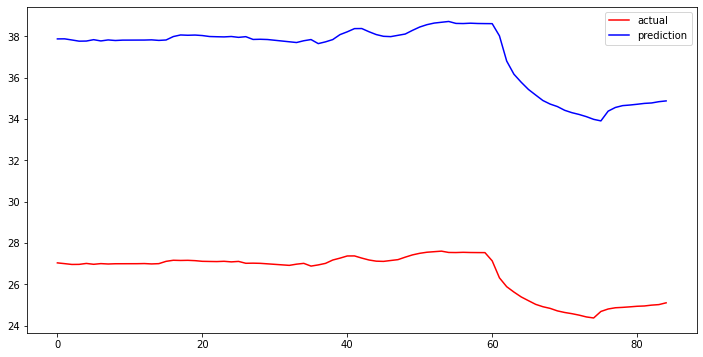

sw_2_StandardScaler_relu_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_StandardScaler_relu_linear_mae_gradient_descent metrics
mean_squared_error : 10.64453125
r2_score : -107.70356956529763
sw_2_StandardScaler_relu_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_560"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_560 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_560 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.9836 - acc: 0.0000e+00 - val_loss: 9.9580 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.9063 - acc: 0.0000e+00 - va

Epoch 66/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1302 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1321 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1339 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1360 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1378 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1400 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1415 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1441 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1459 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1484 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2757 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2730 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2784 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2747 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2803 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2766 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2819 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2791 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2848 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2825 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

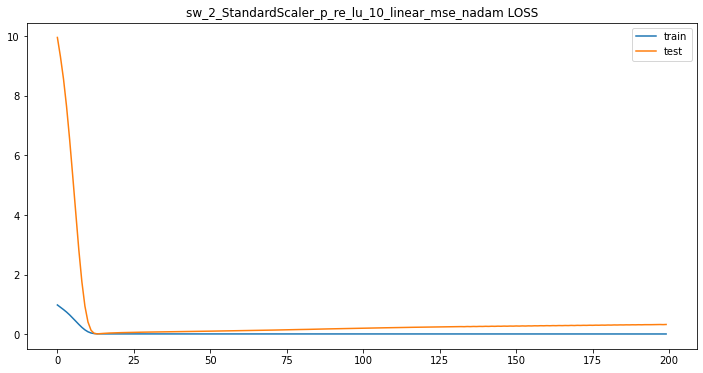


 sw_2_StandardScaler_p_re_lu_10_linear_mse_nadam 데이터 비교


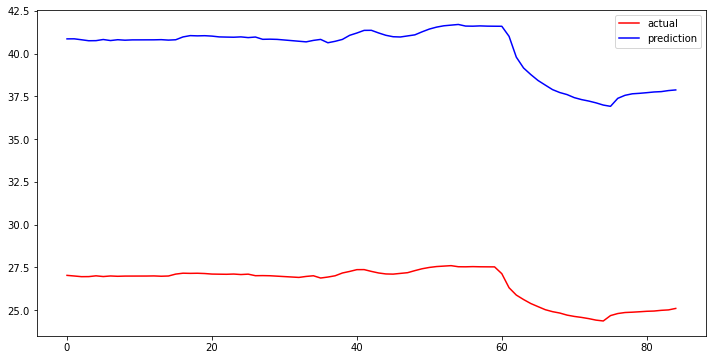

sw_2_StandardScaler_p_re_lu_10_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mse_nadam metrics
mean_squared_error : 13.631516324484503
r2_score : -177.27034624992558
sw_2_StandardScaler_p_re_lu_10_linear_mse_nadam이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_561"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_561 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_561 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.9362 - acc: 0.0000e+00 - val_loss: 9.7034 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.9065 - acc: 0.0000e+00 - val_loss:

Epoch 66/200
32/32 - 0s - loss: 0.0125 - acc: 0.0000e+00 - val_loss: 0.0291 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0124 - acc: 0.0000e+00 - val_loss: 0.0290 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0124 - acc: 0.0000e+00 - val_loss: 0.0289 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0124 - acc: 0.0000e+00 - val_loss: 0.0289 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0123 - acc: 0.0000e+00 - val_loss: 0.0290 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0123 - acc: 0.0000e+00 - val_loss: 0.0291 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0122 - acc: 0.0000e+00 - val_loss: 0.0292 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0122 - acc: 0.0000e+00 - val_loss: 0.0294 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0122 - acc: 0.0000e+00 - val_loss: 0.0297 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0121 - acc: 0.0000e+00 - val_loss: 0.0300 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.1155 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1147 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1184 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1176 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1213 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1204 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1243 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1234 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1272 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1262 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

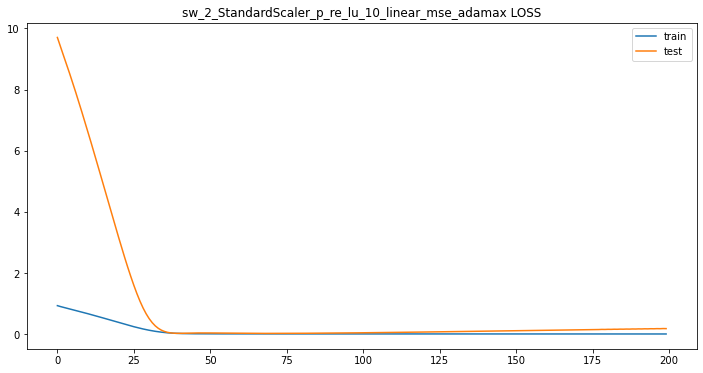


 sw_2_StandardScaler_p_re_lu_10_linear_mse_adamax 데이터 비교


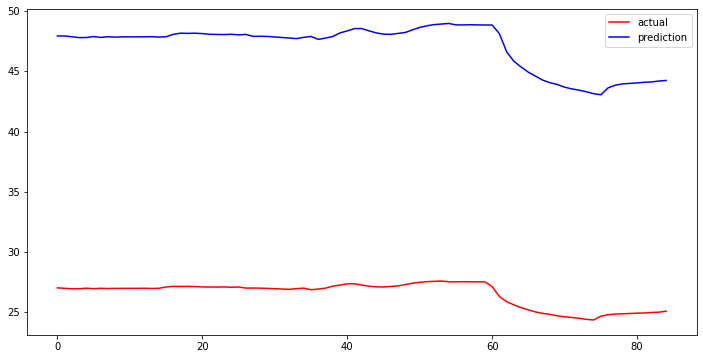

sw_2_StandardScaler_p_re_lu_10_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mse_adamax metrics
mean_squared_error : 20.56022394911813
r2_score : -404.5518593729611
sw_2_StandardScaler_p_re_lu_10_linear_mse_adamax이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_562"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_562 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_562 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 12s - loss: 0.9212 - acc: 0.0000e+00 - val_loss: 9.5559 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8406 - acc: 0.0000e+00 - val_loss: 

Epoch 66/200
32/32 - 0s - loss: 0.0113 - acc: 0.0000e+00 - val_loss: 0.1330 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0112 - acc: 0.0000e+00 - val_loss: 0.1349 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0112 - acc: 0.0000e+00 - val_loss: 0.1362 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1405 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1396 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1434 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1419 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1469 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1446 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1501 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.3196 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.2174 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.3274 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.2191 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.3292 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.2261 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.3247 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.2340 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.3223 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.2381 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

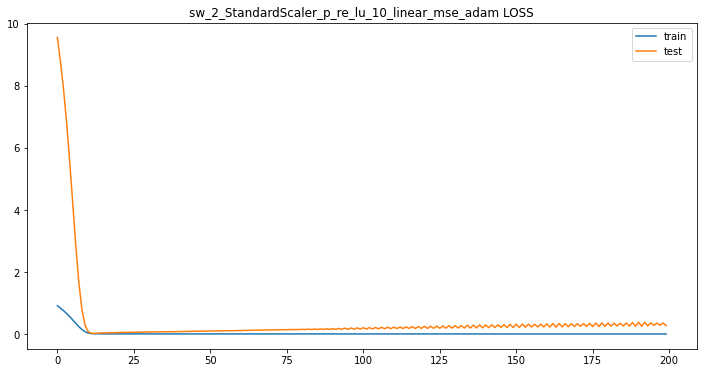


 sw_2_StandardScaler_p_re_lu_10_linear_mse_adam 데이터 비교


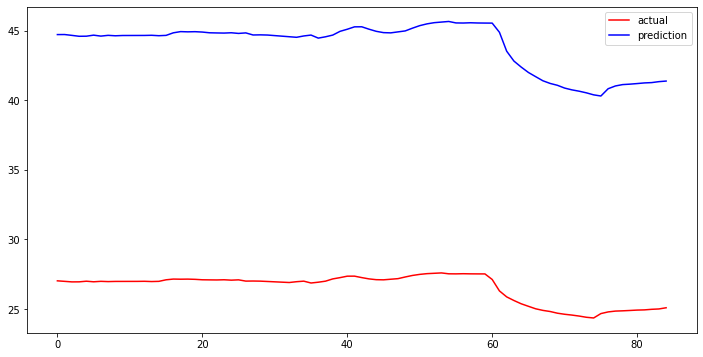

sw_2_StandardScaler_p_re_lu_10_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mse_adam metrics
mean_squared_error : 17.406129901683972
r2_score : -289.6666129836792
sw_2_StandardScaler_p_re_lu_10_linear_mse_adam이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_563"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_563 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_563 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 1.0613 - acc: 0.0000e+00 - val_loss: 10.3705 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.0508 - acc: 0.0000e+00 - val_loss: 1

Epoch 66/200
32/32 - 0s - loss: 0.8937 - acc: 0.0000e+00 - val_loss: 8.6217 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.8923 - acc: 0.0000e+00 - val_loss: 8.6051 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.8909 - acc: 0.0000e+00 - val_loss: 8.5886 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.8895 - acc: 0.0000e+00 - val_loss: 8.5723 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.8881 - acc: 0.0000e+00 - val_loss: 8.5560 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.8867 - acc: 0.0000e+00 - val_loss: 8.5398 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.8853 - acc: 0.0000e+00 - val_loss: 8.5237 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.8840 - acc: 0.0000e+00 - val_loss: 8.5077 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.8826 - acc: 0.0000e+00 - val_loss: 8.4918 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.8813 - acc: 0.0000e+00 - val_loss: 8.4760 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.7928 - acc: 0.0000e+00 - val_loss: 7.4289 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.7917 - acc: 0.0000e+00 - val_loss: 7.4159 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.7907 - acc: 0.0000e+00 - val_loss: 7.4030 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.7896 - acc: 0.0000e+00 - val_loss: 7.3901 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.7885 - acc: 0.0000e+00 - val_loss: 7.3772 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.7875 - acc: 0.0000e+00 - val_loss: 7.3643 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.7864 - acc: 0.0000e+00 - val_loss: 7.3515 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.7853 - acc: 0.0000e+00 - val_loss: 7.3387 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.7843 - acc: 0.0000e+00 - val_loss: 7.3259 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.7832 - acc: 0.0000e+00 - val_loss: 7.3131 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

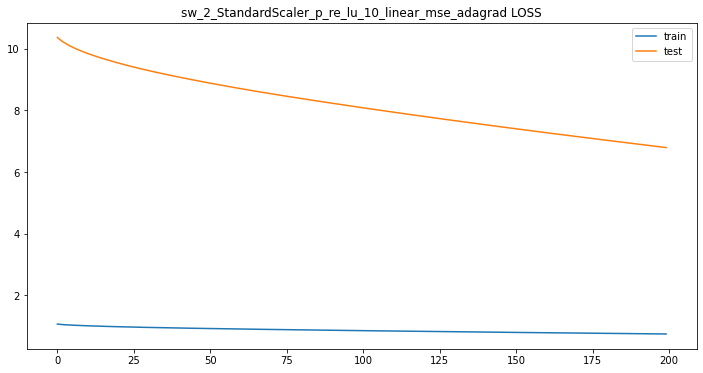


 sw_2_StandardScaler_p_re_lu_10_linear_mse_adagrad 데이터 비교


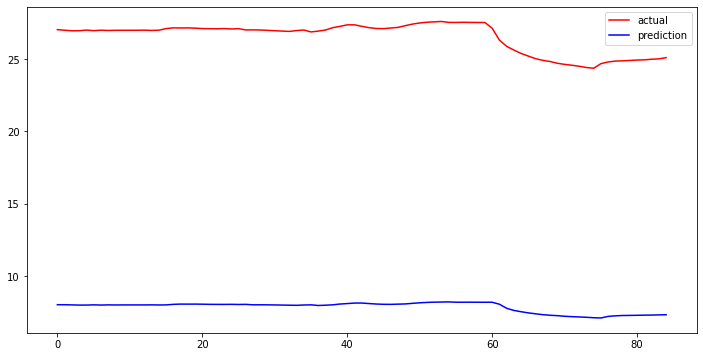

sw_2_StandardScaler_p_re_lu_10_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mse_adagrad metrics
mean_squared_error : 18.696274754540426
r2_score : -334.35203170998295
sw_2_StandardScaler_p_re_lu_10_linear_mse_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_564"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_564 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_564 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 0.9420 - acc: 0.0000e+00 - val_loss: 9.6607 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8694 - acc: 0.0000e+00 - va

Epoch 66/200
32/32 - 0s - loss: 0.0107 - acc: 0.0000e+00 - val_loss: 0.0885 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0107 - acc: 0.0000e+00 - val_loss: 0.0897 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0107 - acc: 0.0000e+00 - val_loss: 0.0897 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0107 - acc: 0.0000e+00 - val_loss: 0.0913 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0106 - acc: 0.0000e+00 - val_loss: 0.0924 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0106 - acc: 0.0000e+00 - val_loss: 0.0944 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0106 - acc: 0.0000e+00 - val_loss: 0.0950 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0106 - acc: 0.0000e+00 - val_loss: 0.0974 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0106 - acc: 0.0000e+00 - val_loss: 0.0964 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0106 - acc: 0.0000e+00 - val_loss: 0.0986 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1418 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1431 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1429 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1440 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1441 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1440 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1481 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1431 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1479 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1446 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

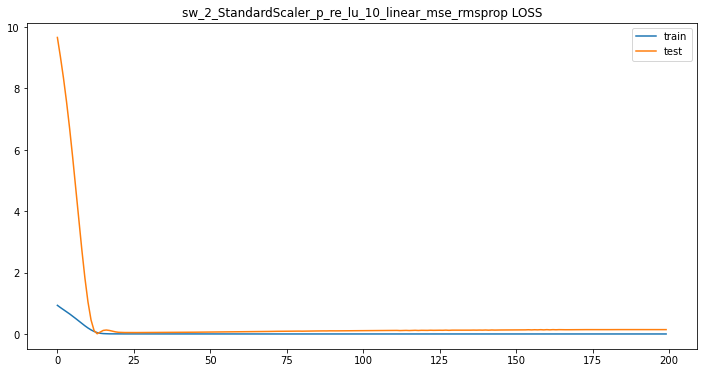


 sw_2_StandardScaler_p_re_lu_10_linear_mse_rmsprop 데이터 비교


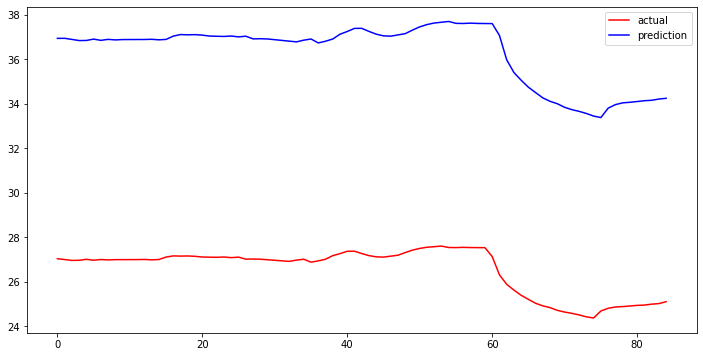

sw_2_StandardScaler_p_re_lu_10_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mse_rmsprop metrics
mean_squared_error : 9.78454378385142
r2_score : -90.84847172642247
sw_2_StandardScaler_p_re_lu_10_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_565"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_565 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_565 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.9363 - acc: 0.0000e+00 - val_loss: 9.5980 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8831 - acc: 0.0000e+00

Epoch 66/200
32/32 - 0s - loss: 0.0146 - acc: 0.0000e+00 - val_loss: 0.0625 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0146 - acc: 0.0000e+00 - val_loss: 0.0620 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0146 - acc: 0.0000e+00 - val_loss: 0.0614 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0146 - acc: 0.0000e+00 - val_loss: 0.0609 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0145 - acc: 0.0000e+00 - val_loss: 0.0603 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0145 - acc: 0.0000e+00 - val_loss: 0.0598 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0145 - acc: 0.0000e+00 - val_loss: 0.0592 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0144 - acc: 0.0000e+00 - val_loss: 0.0587 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0144 - acc: 0.0000e+00 - val_loss: 0.0581 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0144 - acc: 0.0000e+00 - val_loss: 0.0576 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0127 - acc: 0.0000e+00 - val_loss: 0.0256 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0127 - acc: 0.0000e+00 - val_loss: 0.0253 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0126 - acc: 0.0000e+00 - val_loss: 0.0250 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0126 - acc: 0.0000e+00 - val_loss: 0.0247 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0126 - acc: 0.0000e+00 - val_loss: 0.0244 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0126 - acc: 0.0000e+00 - val_loss: 0.0241 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0126 - acc: 0.0000e+00 - val_loss: 0.0238 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0126 - acc: 0.0000e+00 - val_loss: 0.0235 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0125 - acc: 0.0000e+00 - val_loss: 0.0232 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0125 - acc: 0.0000e+00 - val_loss: 0.0229 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

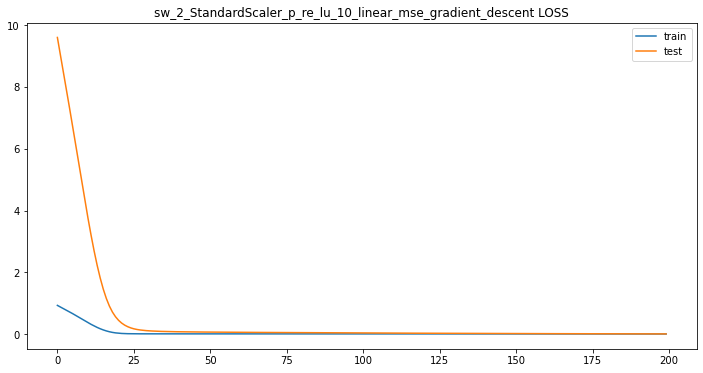


 sw_2_StandardScaler_p_re_lu_10_linear_mse_gradient_descent 데이터 비교


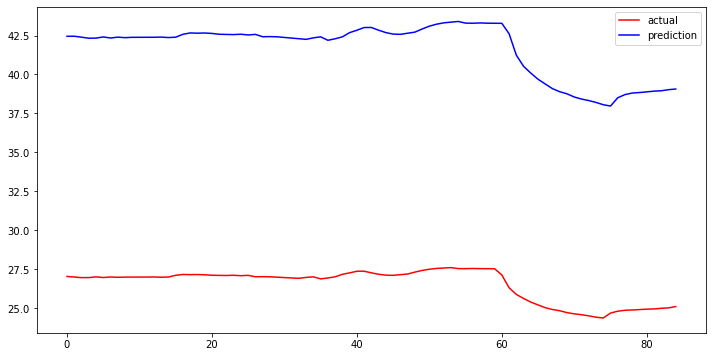

sw_2_StandardScaler_p_re_lu_10_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mse_gradient_descent metrics
mean_squared_error : 15.139207960649106
r2_score : -218.88573682151673
sw_2_StandardScaler_p_re_lu_10_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_566"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_566 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_566 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.7215 - acc: 0.0000e+00 - val_loss: 2.9707 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.67

Epoch 66/200
32/32 - 0s - loss: 0.0593 - acc: 0.0000e+00 - val_loss: 0.2774 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0592 - acc: 0.0000e+00 - val_loss: 0.3311 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0593 - acc: 0.0000e+00 - val_loss: 0.3186 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0592 - acc: 0.0000e+00 - val_loss: 0.2998 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0591 - acc: 0.0000e+00 - val_loss: 0.3258 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0589 - acc: 0.0000e+00 - val_loss: 0.2858 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0593 - acc: 0.0000e+00 - val_loss: 0.2874 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0591 - acc: 0.0000e+00 - val_loss: 0.3240 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0593 - acc: 0.0000e+00 - val_loss: 0.3166 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0587 - acc: 0.0000e+00 - val_loss: 0.2917 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0567 - acc: 0.0000e+00 - val_loss: 0.2876 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0576 - acc: 0.0000e+00 - val_loss: 0.3348 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.3275 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.2746 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.3312 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.3369 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0564 - acc: 0.0000e+00 - val_loss: 0.2695 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.3324 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0564 - acc: 0.0000e+00 - val_loss: 0.2804 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0572 - acc: 0.0000e+00 - val_loss: 0.3238 - val_acc: 0.0000e+00
Epoch 160/

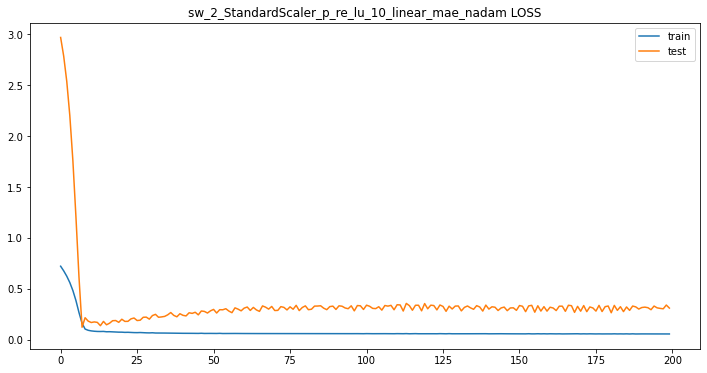


 sw_2_StandardScaler_p_re_lu_10_linear_mae_nadam 데이터 비교


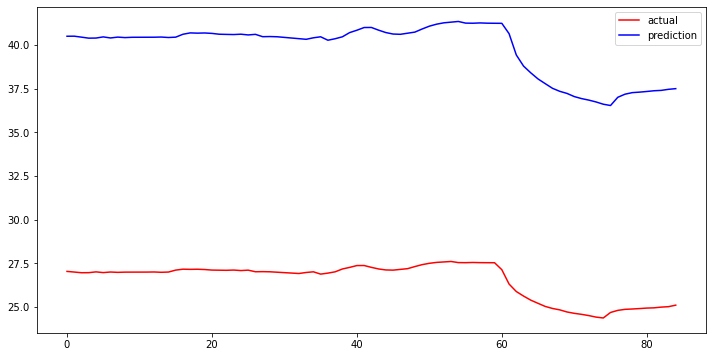

sw_2_StandardScaler_p_re_lu_10_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mae_nadam metrics
mean_squared_error : 13.265677911408023
r2_score : -167.83000613069012
sw_2_StandardScaler_p_re_lu_10_linear_mae_nadam이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_567"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_567 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_567 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.7207 - acc: 0.0000e+00 - val_loss: 3.0278 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.6966 - acc: 0.0000e+00 - val_loss:

Epoch 66/200
32/32 - 0s - loss: 0.0765 - acc: 0.0000e+00 - val_loss: 0.2178 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0761 - acc: 0.0000e+00 - val_loss: 0.2154 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0754 - acc: 0.0000e+00 - val_loss: 0.2130 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0751 - acc: 0.0000e+00 - val_loss: 0.2099 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0744 - acc: 0.0000e+00 - val_loss: 0.2072 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0737 - acc: 0.0000e+00 - val_loss: 0.2077 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0734 - acc: 0.0000e+00 - val_loss: 0.2028 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0727 - acc: 0.0000e+00 - val_loss: 0.2086 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0723 - acc: 0.0000e+00 - val_loss: 0.2023 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0716 - acc: 0.0000e+00 - val_loss: 0.2056 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0555 - acc: 0.0000e+00 - val_loss: 0.0758 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0553 - acc: 0.0000e+00 - val_loss: 0.0781 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0554 - acc: 0.0000e+00 - val_loss: 0.0778 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0558 - acc: 0.0000e+00 - val_loss: 0.0761 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0555 - acc: 0.0000e+00 - val_loss: 0.0777 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0557 - acc: 0.0000e+00 - val_loss: 0.0757 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0554 - acc: 0.0000e+00 - val_loss: 0.0772 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0556 - acc: 0.0000e+00 - val_loss: 0.0754 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0554 - acc: 0.0000e+00 - val_loss: 0.0768 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0553 - acc: 0.0000e+00 - val_loss: 0.0768 - val_acc: 0.0000e+00
Epoch 160/

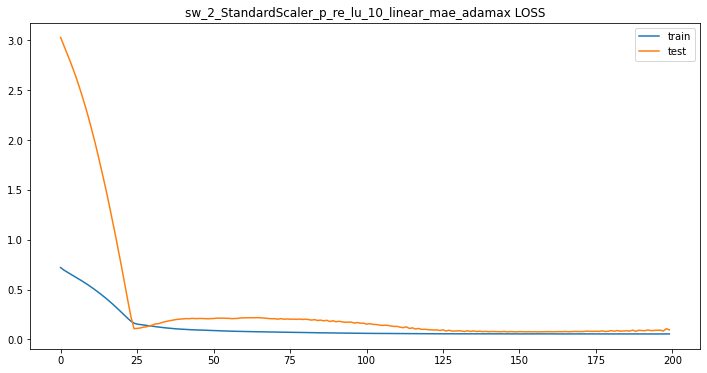


 sw_2_StandardScaler_p_re_lu_10_linear_mae_adamax 데이터 비교


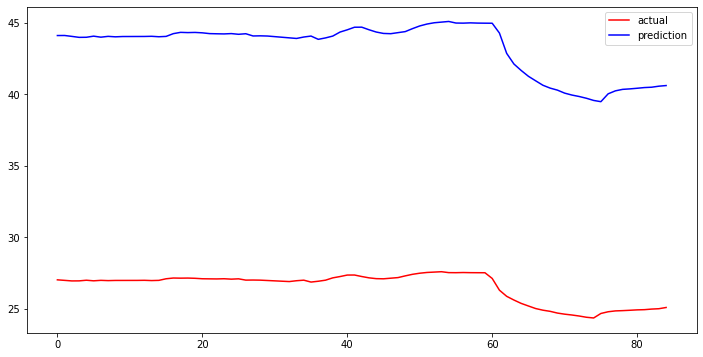

sw_2_StandardScaler_p_re_lu_10_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mae_adamax metrics
mean_squared_error : 16.7742762220442
r2_score : -268.94685198398554
sw_2_StandardScaler_p_re_lu_10_linear_mae_adamax이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_568"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_568 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_568 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.7497 - acc: 0.0000e+00 - val_loss: 3.1475 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7040 - acc: 0.0000e+00 - val_loss: 2

Epoch 66/200
32/32 - 0s - loss: 0.0618 - acc: 0.0000e+00 - val_loss: 0.2537 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0657 - acc: 0.0000e+00 - val_loss: 0.5459 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0632 - acc: 0.0000e+00 - val_loss: 0.2324 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0672 - acc: 0.0000e+00 - val_loss: 0.5488 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0622 - acc: 0.0000e+00 - val_loss: 0.2343 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0669 - acc: 0.0000e+00 - val_loss: 0.5372 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0616 - acc: 0.0000e+00 - val_loss: 0.2518 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0652 - acc: 0.0000e+00 - val_loss: 0.5256 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0625 - acc: 0.0000e+00 - val_loss: 0.2291 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0668 - acc: 0.0000e+00 - val_loss: 0.5275 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.2994 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0573 - acc: 0.0000e+00 - val_loss: 0.3362 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0572 - acc: 0.0000e+00 - val_loss: 0.3063 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0568 - acc: 0.0000e+00 - val_loss: 0.3060 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0567 - acc: 0.0000e+00 - val_loss: 0.3053 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0567 - acc: 0.0000e+00 - val_loss: 0.3160 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.3101 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0571 - acc: 0.0000e+00 - val_loss: 0.2783 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.3164 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0576 - acc: 0.0000e+00 - val_loss: 0.3106 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

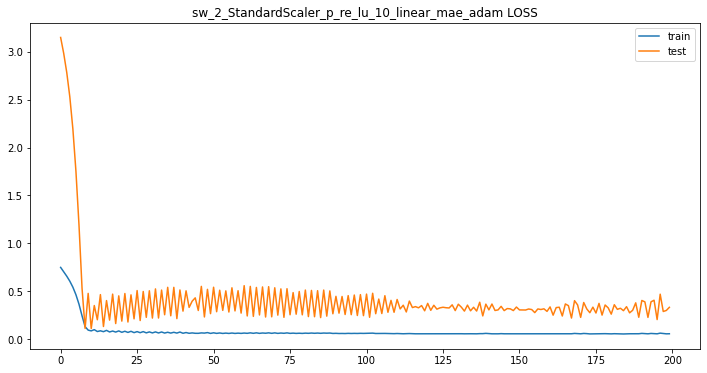


 sw_2_StandardScaler_p_re_lu_10_linear_mae_adam 데이터 비교


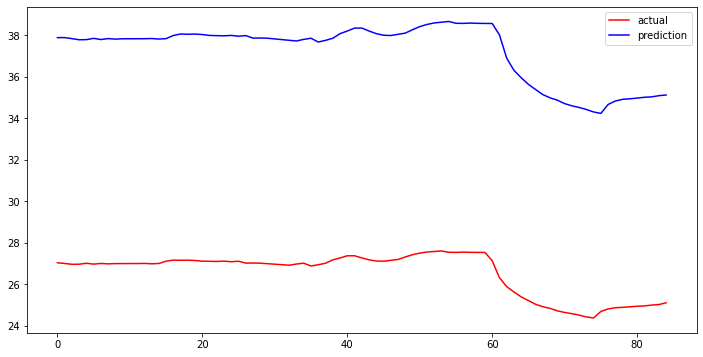

sw_2_StandardScaler_p_re_lu_10_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mae_adam metrics
mean_squared_error : 10.718200491563113
r2_score : -109.21341785827006
sw_2_StandardScaler_p_re_lu_10_linear_mae_adam이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_569"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_569 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_569 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.7371 - acc: 0.0000e+00 - val_loss: 3.1071 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7341 - acc: 0.0000e+00 - val_loss: 3.

Epoch 66/200
32/32 - 0s - loss: 0.6611 - acc: 0.0000e+00 - val_loss: 2.8523 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.6603 - acc: 0.0000e+00 - val_loss: 2.8493 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.6595 - acc: 0.0000e+00 - val_loss: 2.8464 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.6588 - acc: 0.0000e+00 - val_loss: 2.8434 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.6580 - acc: 0.0000e+00 - val_loss: 2.8405 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.6572 - acc: 0.0000e+00 - val_loss: 2.8375 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.6564 - acc: 0.0000e+00 - val_loss: 2.8345 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.6557 - acc: 0.0000e+00 - val_loss: 2.8316 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.6549 - acc: 0.0000e+00 - val_loss: 2.8287 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.6541 - acc: 0.0000e+00 - val_loss: 2.8257 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.6006 - acc: 0.0000e+00 - val_loss: 2.6083 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.5999 - acc: 0.0000e+00 - val_loss: 2.6052 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.5992 - acc: 0.0000e+00 - val_loss: 2.6022 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.5985 - acc: 0.0000e+00 - val_loss: 2.5992 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.5978 - acc: 0.0000e+00 - val_loss: 2.5962 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.5971 - acc: 0.0000e+00 - val_loss: 2.5932 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.5963 - acc: 0.0000e+00 - val_loss: 2.5902 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.5956 - acc: 0.0000e+00 - val_loss: 2.5872 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.5949 - acc: 0.0000e+00 - val_loss: 2.5841 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.5942 - acc: 0.0000e+00 - val_loss: 2.5811 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

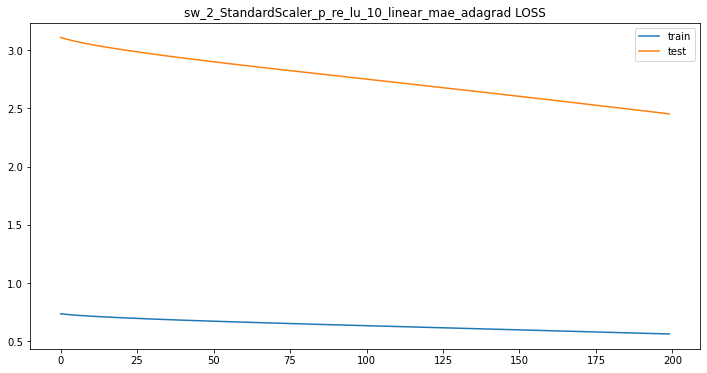


 sw_2_StandardScaler_p_re_lu_10_linear_mae_adagrad 데이터 비교


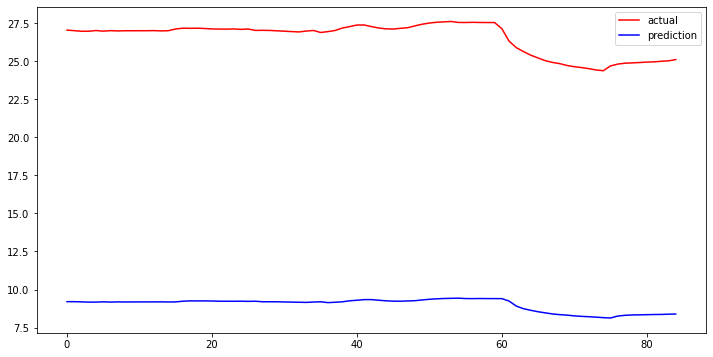

sw_2_StandardScaler_p_re_lu_10_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mae_adagrad metrics
mean_squared_error : 17.53319953509627
r2_score : -293.9260575734355
sw_2_StandardScaler_p_re_lu_10_linear_mae_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_570"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_570 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_570 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.7337 - acc: 0.0000e+00 - val_loss: 3.1574 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.6901 - acc: 0.0000e+00 - val_l

Epoch 66/200
32/32 - 0s - loss: 0.0571 - acc: 0.0000e+00 - val_loss: 0.1632 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0580 - acc: 0.0000e+00 - val_loss: 0.0969 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.0996 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.0849 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.1365 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.0928 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0567 - acc: 0.0000e+00 - val_loss: 0.1519 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.0947 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0572 - acc: 0.0000e+00 - val_loss: 0.0863 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0572 - acc: 0.0000e+00 - val_loss: 0.1403 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.1643 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.2342 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0552 - acc: 0.0000e+00 - val_loss: 0.2661 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.1634 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0561 - acc: 0.0000e+00 - val_loss: 0.1473 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.1548 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.2269 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0551 - acc: 0.0000e+00 - val_loss: 0.2418 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0558 - acc: 0.0000e+00 - val_loss: 0.1612 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0561 - acc: 0.0000e+00 - val_loss: 0.1356 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

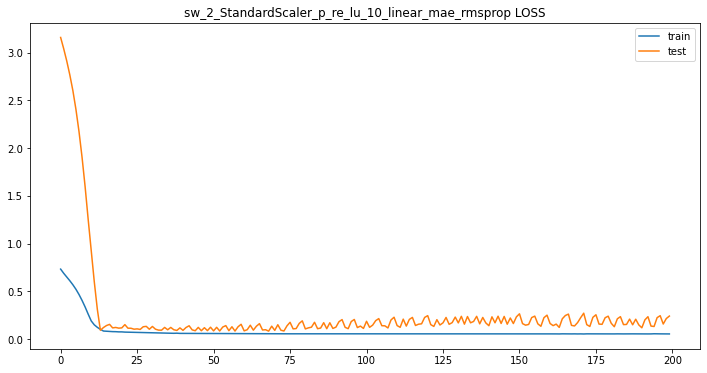


 sw_2_StandardScaler_p_re_lu_10_linear_mae_rmsprop 데이터 비교


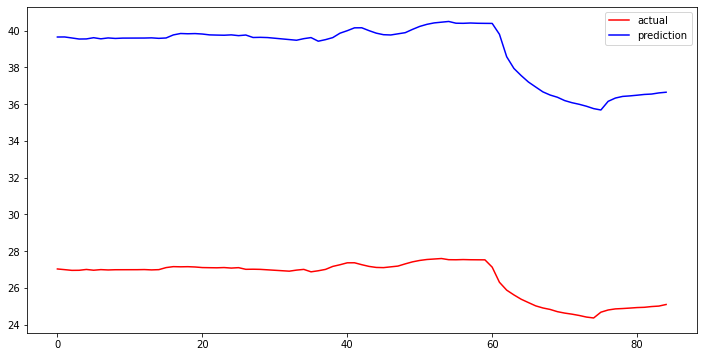

sw_2_StandardScaler_p_re_lu_10_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mae_rmsprop metrics
mean_squared_error : 12.42116620422764
r2_score : -147.0183282673333
sw_2_StandardScaler_p_re_lu_10_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_10
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_571"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_571 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_571 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 12s - loss: 0.7379 - acc: 0.0000e+00 - val_loss: 3.2351 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7259 - acc: 0.0000e+

Epoch 66/200
32/32 - 0s - loss: 0.0773 - acc: 0.0000e+00 - val_loss: 0.3345 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0767 - acc: 0.0000e+00 - val_loss: 0.3238 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0766 - acc: 0.0000e+00 - val_loss: 0.3235 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0759 - acc: 0.0000e+00 - val_loss: 0.3182 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0754 - acc: 0.0000e+00 - val_loss: 0.3120 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0749 - acc: 0.0000e+00 - val_loss: 0.3034 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0747 - acc: 0.0000e+00 - val_loss: 0.3086 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0744 - acc: 0.0000e+00 - val_loss: 0.3070 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0740 - acc: 0.0000e+00 - val_loss: 0.3005 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0736 - acc: 0.0000e+00 - val_loss: 0.2955 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0608 - acc: 0.0000e+00 - val_loss: 0.0783 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0605 - acc: 0.0000e+00 - val_loss: 0.0784 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0606 - acc: 0.0000e+00 - val_loss: 0.0876 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0608 - acc: 0.0000e+00 - val_loss: 0.0787 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0607 - acc: 0.0000e+00 - val_loss: 0.0734 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0604 - acc: 0.0000e+00 - val_loss: 0.0750 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0606 - acc: 0.0000e+00 - val_loss: 0.0740 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0604 - acc: 0.0000e+00 - val_loss: 0.0992 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0607 - acc: 0.0000e+00 - val_loss: 0.0773 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0603 - acc: 0.0000e+00 - val_loss: 0.0746 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

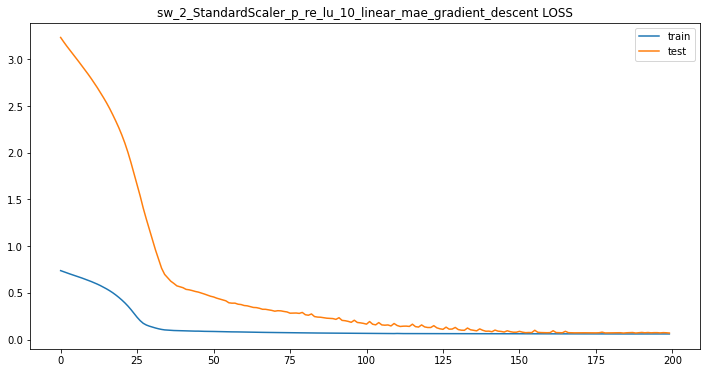


 sw_2_StandardScaler_p_re_lu_10_linear_mae_gradient_descent 데이터 비교


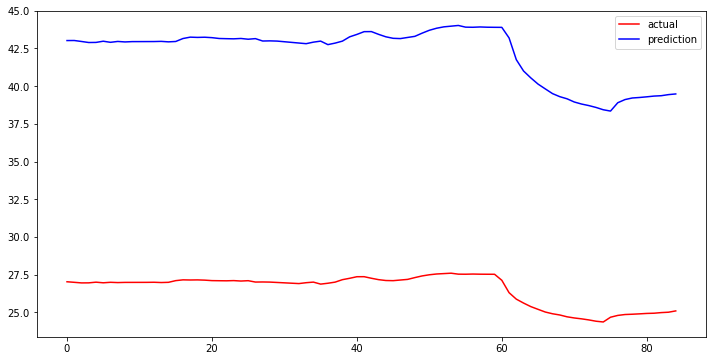

sw_2_StandardScaler_p_re_lu_10_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_StandardScaler_p_re_lu_10_linear_mae_gradient_descent metrics
mean_squared_error : 15.680055835390911
r2_score : -234.87718685259867
sw_2_StandardScaler_p_re_lu_10_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_572"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_572 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_572 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 0.9464 - acc: 0.0000e+00 - val_loss: 9.5089 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 

Epoch 66/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1243 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1261 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1280 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1306 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1320 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1349 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1369 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1390 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1417 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1432 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2852 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2915 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2873 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2949 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2915 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2963 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2939 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.3005 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.2972 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.3018 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

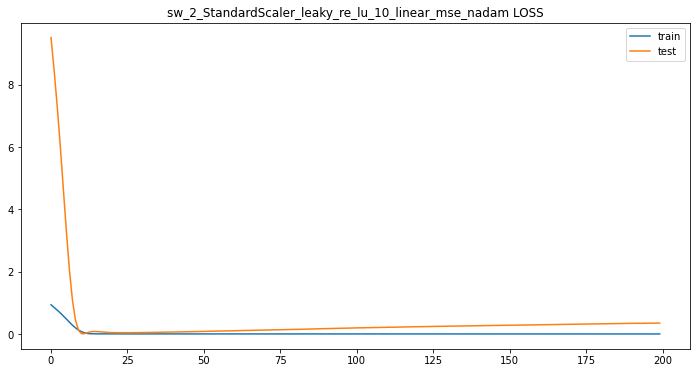


 sw_2_StandardScaler_leaky_re_lu_10_linear_mse_nadam 데이터 비교


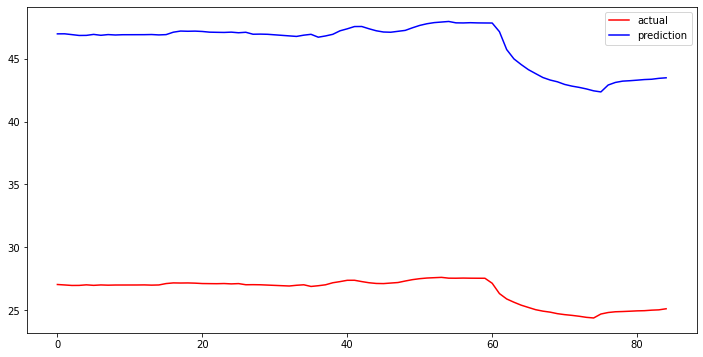

sw_2_StandardScaler_leaky_re_lu_10_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_nadam metrics
mean_squared_error : 19.651702015088762
r2_score : -369.5024805059499
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_573"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_573 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_573 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.9286 - acc: 0.0000e+00 - val_loss: 10.0415 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8945 - acc: 0.0000e

Epoch 66/200
32/32 - 0s - loss: 0.0129 - acc: 0.0000e+00 - val_loss: 0.0076 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0129 - acc: 0.0000e+00 - val_loss: 0.0077 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0129 - acc: 0.0000e+00 - val_loss: 0.0078 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0080 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0082 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0084 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0127 - acc: 0.0000e+00 - val_loss: 0.0086 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0127 - acc: 0.0000e+00 - val_loss: 0.0089 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0126 - acc: 0.0000e+00 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0126 - acc: 0.0000e+00 - val_loss: 0.0094 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.1094 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.1126 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0102 - acc: 0.0000e+00 - val_loss: 0.1128 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0101 - acc: 0.0000e+00 - val_loss: 0.1161 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0101 - acc: 0.0000e+00 - val_loss: 0.1163 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0101 - acc: 0.0000e+00 - val_loss: 0.1197 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0101 - acc: 0.0000e+00 - val_loss: 0.1197 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0101 - acc: 0.0000e+00 - val_loss: 0.1232 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0101 - acc: 0.0000e+00 - val_loss: 0.1231 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0101 - acc: 0.0000e+00 - val_loss: 0.1264 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

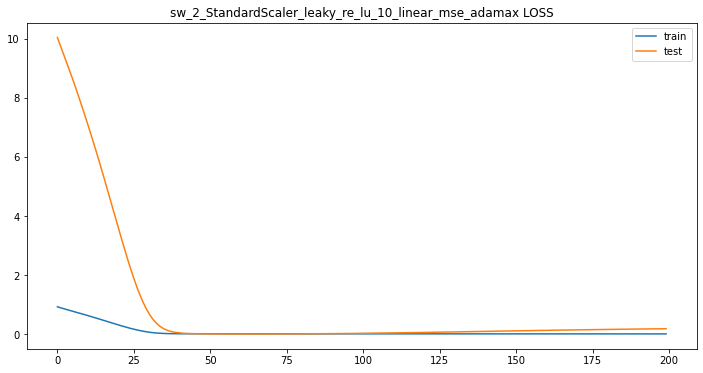


 sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adamax 데이터 비교


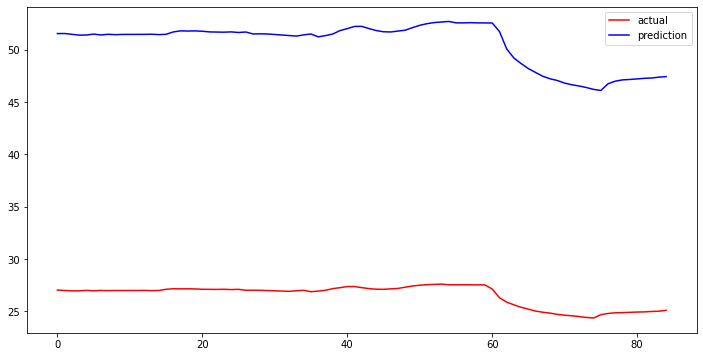

sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adamax metrics
mean_squared_error : 24.064733307480395
r2_score : -554.5879914887066
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_574"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_574 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_574 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.9382 - acc: 0.0000e+00 - val_loss: 8.6214 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8557 - acc: 0.0000e

Epoch 66/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1062 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1010 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1133 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1044 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1204 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0111 - acc: 0.0000e+00 - val_loss: 0.1075 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1279 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1102 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0109 - acc: 0.0000e+00 - val_loss: 0.1354 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0110 - acc: 0.0000e+00 - val_loss: 0.1131 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0107 - acc: 0.0000e+00 - val_loss: 0.1703 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.3418 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.2581 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0106 - acc: 0.0000e+00 - val_loss: 0.2294 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.3644 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0108 - acc: 0.0000e+00 - val_loss: 0.1787 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.3827 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0104 - acc: 0.0000e+00 - val_loss: 0.2115 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.3034 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.3049 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

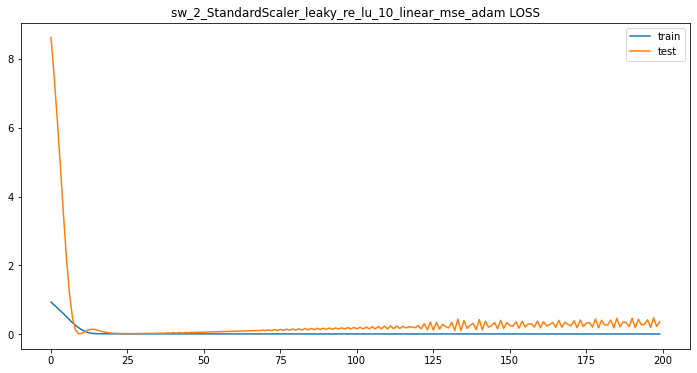


 sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adam 데이터 비교


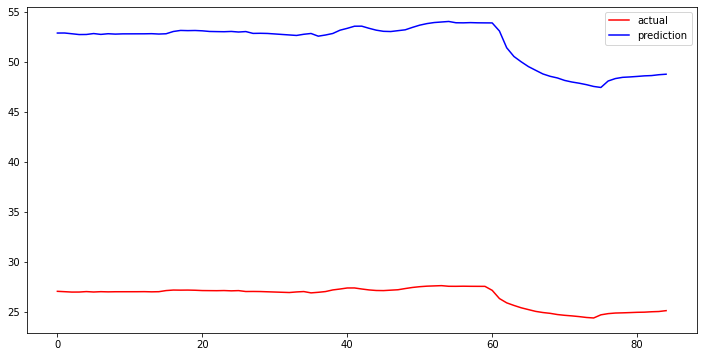

sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adam metrics
mean_squared_error : 25.388207817634672
r2_score : -617.3791147363813
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_575"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_575 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_575 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.9695 - acc: 0.0000e+00 - val_loss: 10.7512 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.9574 - acc: 0.0000e+0

Epoch 66/200
32/32 - 0s - loss: 0.7630 - acc: 0.0000e+00 - val_loss: 9.0243 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.7612 - acc: 0.0000e+00 - val_loss: 9.0087 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.7594 - acc: 0.0000e+00 - val_loss: 8.9931 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.7576 - acc: 0.0000e+00 - val_loss: 8.9776 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.7558 - acc: 0.0000e+00 - val_loss: 8.9622 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.7541 - acc: 0.0000e+00 - val_loss: 8.9470 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.7523 - acc: 0.0000e+00 - val_loss: 8.9318 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.7506 - acc: 0.0000e+00 - val_loss: 8.9166 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.7489 - acc: 0.0000e+00 - val_loss: 8.9016 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.7472 - acc: 0.0000e+00 - val_loss: 8.8866 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.6385 - acc: 0.0000e+00 - val_loss: 7.8790 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.6372 - acc: 0.0000e+00 - val_loss: 7.8660 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.6359 - acc: 0.0000e+00 - val_loss: 7.8531 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.6346 - acc: 0.0000e+00 - val_loss: 7.8402 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.6333 - acc: 0.0000e+00 - val_loss: 7.8273 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.6320 - acc: 0.0000e+00 - val_loss: 7.8144 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.6307 - acc: 0.0000e+00 - val_loss: 7.8016 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.6294 - acc: 0.0000e+00 - val_loss: 7.7887 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.6281 - acc: 0.0000e+00 - val_loss: 7.7758 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.6268 - acc: 0.0000e+00 - val_loss: 7.7628 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

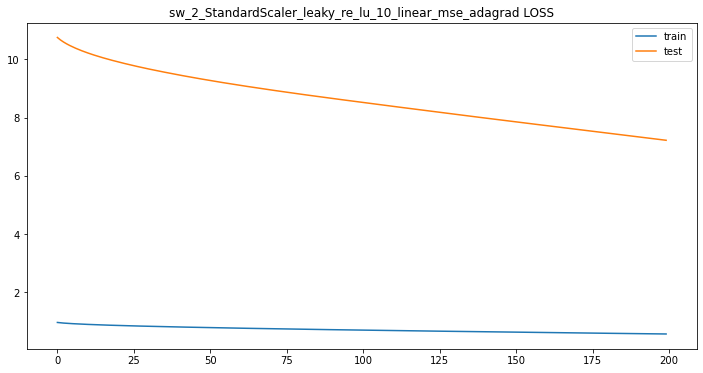


 sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adagrad 데이터 비교


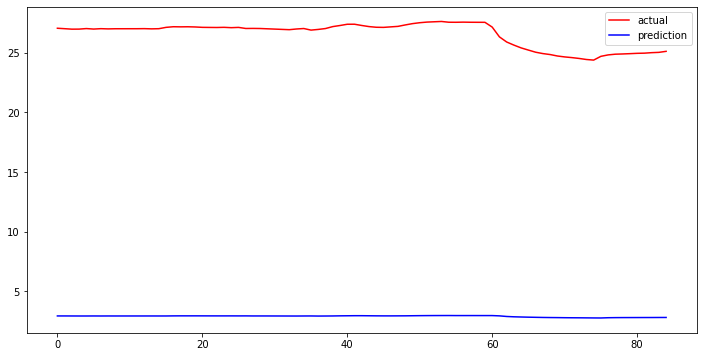

sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adagrad metrics
mean_squared_error : 23.63951093087125
r2_score : -535.1270844283868
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_576"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_576 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_576 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.9265 - acc: 0.0000e+00 - val_loss: 9.1710 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8381 - acc: 0.

Epoch 66/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0945 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0974 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0982 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0987 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.0997 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.1004 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.1008 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.1025 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.1016 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0105 - acc: 0.0000e+00 - val_loss: 0.1046 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1379 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1329 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1358 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1389 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1352 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1396 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1354 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1404 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1359 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0103 - acc: 0.0000e+00 - val_loss: 0.1419 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

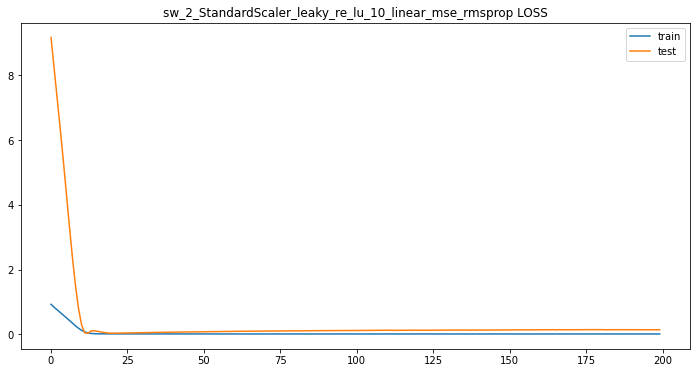


 sw_2_StandardScaler_leaky_re_lu_10_linear_mse_rmsprop 데이터 비교


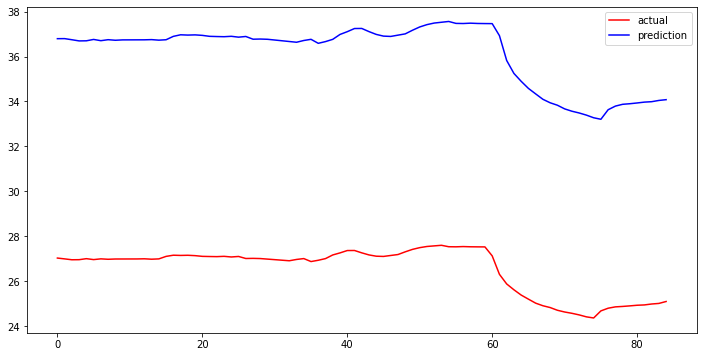

sw_2_StandardScaler_leaky_re_lu_10_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_rmsprop metrics
mean_squared_error : 9.630129153454124
r2_score : -87.97232902547671
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_577"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_577 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_577 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 1.0424 - acc: 0.0000e+00 - val_loss: 10.2755 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.9776

Epoch 66/200
32/32 - 0s - loss: 0.0143 - acc: 0.0000e+00 - val_loss: 0.0531 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0143 - acc: 0.0000e+00 - val_loss: 0.0525 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0143 - acc: 0.0000e+00 - val_loss: 0.0518 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0143 - acc: 0.0000e+00 - val_loss: 0.0511 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0143 - acc: 0.0000e+00 - val_loss: 0.0505 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0142 - acc: 0.0000e+00 - val_loss: 0.0498 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0142 - acc: 0.0000e+00 - val_loss: 0.0492 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0142 - acc: 0.0000e+00 - val_loss: 0.0486 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0142 - acc: 0.0000e+00 - val_loss: 0.0480 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0141 - acc: 0.0000e+00 - val_loss: 0.0474 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0129 - acc: 0.0000e+00 - val_loss: 0.0171 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0129 - acc: 0.0000e+00 - val_loss: 0.0169 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0167 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0164 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0162 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0160 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0157 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0155 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0128 - acc: 0.0000e+00 - val_loss: 0.0153 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0127 - acc: 0.0000e+00 - val_loss: 0.0151 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

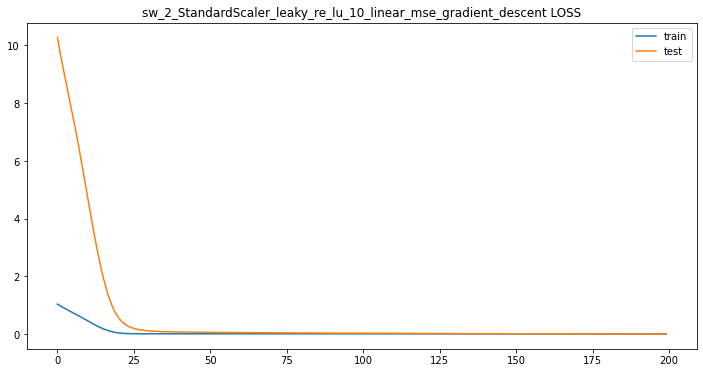


 sw_2_StandardScaler_leaky_re_lu_10_linear_mse_gradient_descent 데이터 비교


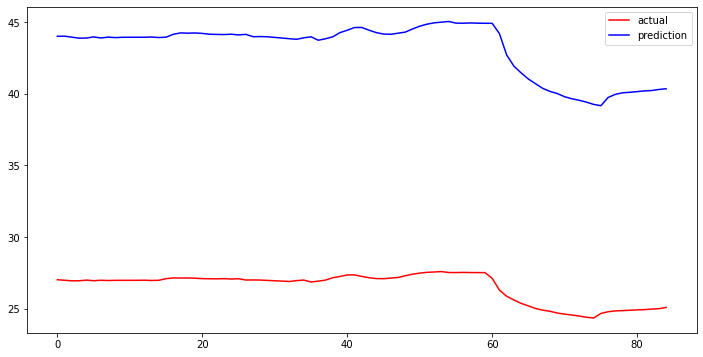

sw_2_StandardScaler_leaky_re_lu_10_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_gradient_descent metrics
mean_squared_error : 16.639445747534868
r2_score : -264.62470485403287
sw_2_StandardScaler_leaky_re_lu_10_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_578"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_578 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_578 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 21s - loss: 0.7239 - acc: 0.0000e+00 - val_loss: 2.9150 - val_acc: 0.0000e+00
Epoch 2/200
32/32 -

32/32 - 0s - loss: 0.0580 - acc: 0.0000e+00 - val_loss: 0.2421 - val_acc: 0.0000e+00
Epoch 66/200
32/32 - 0s - loss: 0.0594 - acc: 0.0000e+00 - val_loss: 0.2999 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0583 - acc: 0.0000e+00 - val_loss: 0.2884 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0582 - acc: 0.0000e+00 - val_loss: 0.2432 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0589 - acc: 0.0000e+00 - val_loss: 0.3109 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0578 - acc: 0.0000e+00 - val_loss: 0.3083 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0579 - acc: 0.0000e+00 - val_loss: 0.3010 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0578 - acc: 0.0000e+00 - val_loss: 0.2555 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0591 - acc: 0.0000e+00 - val_loss: 0.3156 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0580 - acc: 0.0000e+00 - val_loss: 0.3093 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0

Epoch 149/200
32/32 - 0s - loss: 0.0564 - acc: 0.0000e+00 - val_loss: 0.2875 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.3388 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.3203 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0562 - acc: 0.0000e+00 - val_loss: 0.2876 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0574 - acc: 0.0000e+00 - val_loss: 0.3413 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0566 - acc: 0.0000e+00 - val_loss: 0.3114 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.2792 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0576 - acc: 0.0000e+00 - val_loss: 0.3389 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0566 - acc: 0.0000e+00 - val_loss: 0.3033 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.2699 - val_acc: 0.0000e+00
Epoch 159/

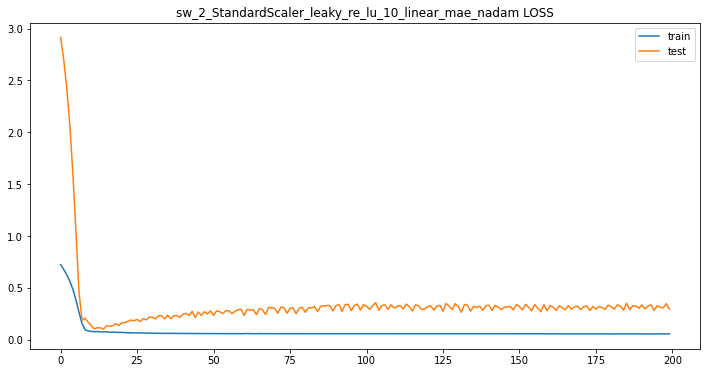


 sw_2_StandardScaler_leaky_re_lu_10_linear_mae_nadam 데이터 비교


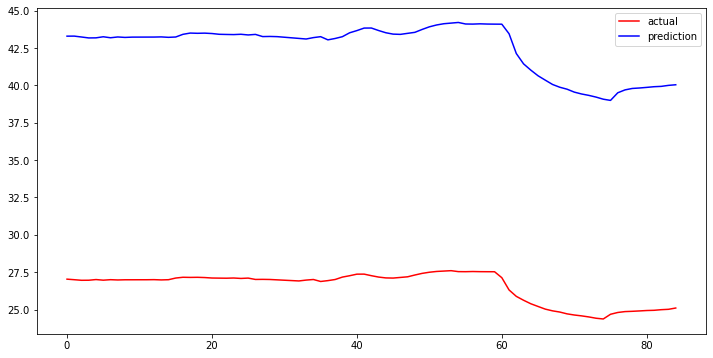

sw_2_StandardScaler_leaky_re_lu_10_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_nadam metrics
mean_squared_error : 16.016629160593336
r2_score : -245.1121194387865
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_579"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_579 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_579 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.7206 - acc: 0.0000e+00 - val_loss: 2.9821 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.6994 - acc: 0.0000e+

Epoch 66/200
32/32 - 0s - loss: 0.0723 - acc: 0.0000e+00 - val_loss: 0.0967 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0720 - acc: 0.0000e+00 - val_loss: 0.0912 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0714 - acc: 0.0000e+00 - val_loss: 0.0963 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0711 - acc: 0.0000e+00 - val_loss: 0.0927 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0706 - acc: 0.0000e+00 - val_loss: 0.0931 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0702 - acc: 0.0000e+00 - val_loss: 0.0934 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0696 - acc: 0.0000e+00 - val_loss: 0.0937 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0694 - acc: 0.0000e+00 - val_loss: 0.0931 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0691 - acc: 0.0000e+00 - val_loss: 0.0908 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0688 - acc: 0.0000e+00 - val_loss: 0.0872 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.1037 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0561 - acc: 0.0000e+00 - val_loss: 0.1268 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.1048 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0561 - acc: 0.0000e+00 - val_loss: 0.1341 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0565 - acc: 0.0000e+00 - val_loss: 0.1096 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0561 - acc: 0.0000e+00 - val_loss: 0.1323 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.1101 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.1296 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0560 - acc: 0.0000e+00 - val_loss: 0.1083 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0559 - acc: 0.0000e+00 - val_loss: 0.1169 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

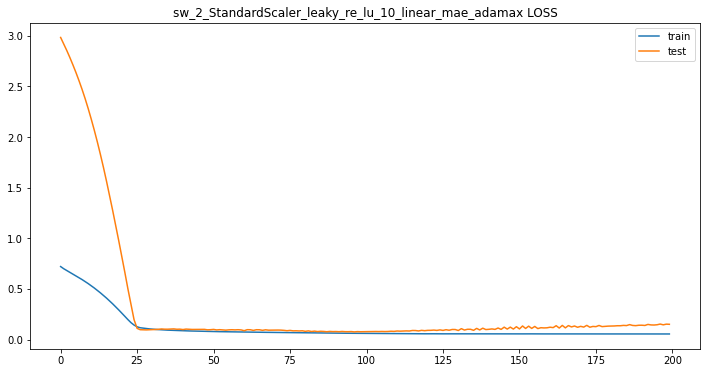


 sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adamax 데이터 비교


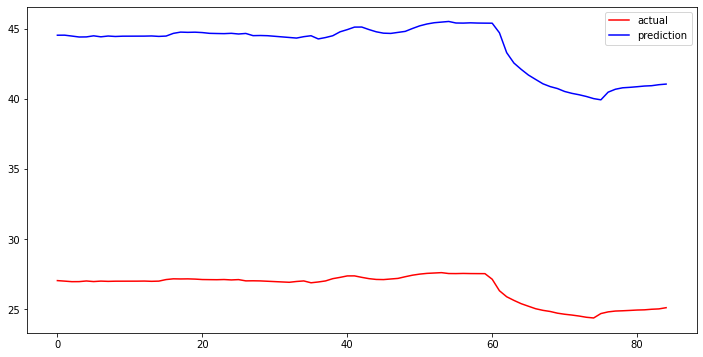

sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adamax metrics
mean_squared_error : 17.20219808328239
r2_score : -282.89560458118746
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_580"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_580 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_580 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 0.7122 - acc: 0.0000e+00 - val_loss: 3.0371 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.6648 - acc: 0.0000

Epoch 66/200
32/32 - 0s - loss: 0.0602 - acc: 0.0000e+00 - val_loss: 0.4328 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0588 - acc: 0.0000e+00 - val_loss: 0.3344 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0598 - acc: 0.0000e+00 - val_loss: 0.4373 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0593 - acc: 0.0000e+00 - val_loss: 0.3868 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0586 - acc: 0.0000e+00 - val_loss: 0.3795 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0583 - acc: 0.0000e+00 - val_loss: 0.3700 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0588 - acc: 0.0000e+00 - val_loss: 0.4215 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0584 - acc: 0.0000e+00 - val_loss: 0.3974 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0583 - acc: 0.0000e+00 - val_loss: 0.3756 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0582 - acc: 0.0000e+00 - val_loss: 0.3966 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0573 - acc: 0.0000e+00 - val_loss: 0.3138 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0592 - acc: 0.0000e+00 - val_loss: 0.3911 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.2979 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0582 - acc: 0.0000e+00 - val_loss: 0.3224 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0595 - acc: 0.0000e+00 - val_loss: 0.3983 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.2811 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0580 - acc: 0.0000e+00 - val_loss: 0.3411 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0573 - acc: 0.0000e+00 - val_loss: 0.3683 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0564 - acc: 0.0000e+00 - val_loss: 0.3114 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0570 - acc: 0.0000e+00 - val_loss: 0.3158 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

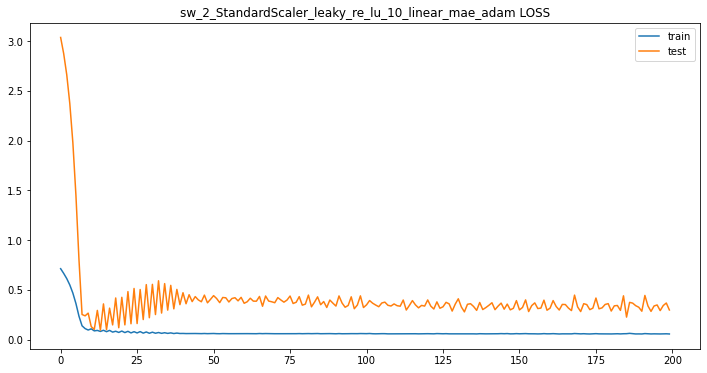


 sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adam 데이터 비교


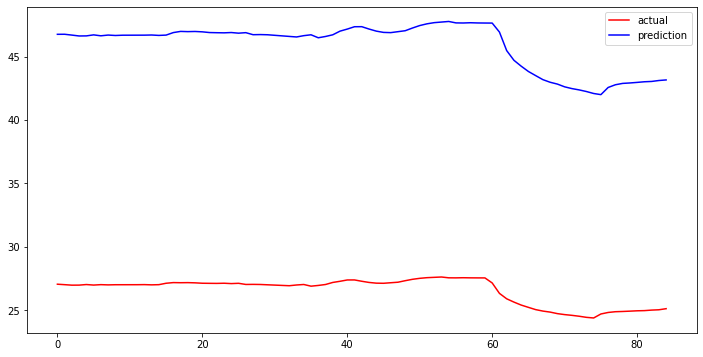

sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adam metrics
mean_squared_error : 19.396639251628425
r2_score : -359.94724557728233
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_581"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_581 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_581 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.7406 - acc: 0.0000e+00 - val_loss: 3.2266 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7377 - acc: 0.0000e+0

Epoch 66/200
32/32 - 0s - loss: 0.6615 - acc: 0.0000e+00 - val_loss: 2.9712 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.6606 - acc: 0.0000e+00 - val_loss: 2.9685 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.6598 - acc: 0.0000e+00 - val_loss: 2.9658 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.6589 - acc: 0.0000e+00 - val_loss: 2.9631 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.6581 - acc: 0.0000e+00 - val_loss: 2.9604 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.6572 - acc: 0.0000e+00 - val_loss: 2.9577 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.6564 - acc: 0.0000e+00 - val_loss: 2.9551 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.6555 - acc: 0.0000e+00 - val_loss: 2.9524 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.6547 - acc: 0.0000e+00 - val_loss: 2.9498 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.6538 - acc: 0.0000e+00 - val_loss: 2.9471 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.5954 - acc: 0.0000e+00 - val_loss: 2.7618 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.5947 - acc: 0.0000e+00 - val_loss: 2.7593 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.5939 - acc: 0.0000e+00 - val_loss: 2.7568 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.5931 - acc: 0.0000e+00 - val_loss: 2.7544 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.5924 - acc: 0.0000e+00 - val_loss: 2.7519 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.5916 - acc: 0.0000e+00 - val_loss: 2.7494 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.5908 - acc: 0.0000e+00 - val_loss: 2.7469 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.5901 - acc: 0.0000e+00 - val_loss: 2.7444 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.5893 - acc: 0.0000e+00 - val_loss: 2.7419 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.5885 - acc: 0.0000e+00 - val_loss: 2.7394 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

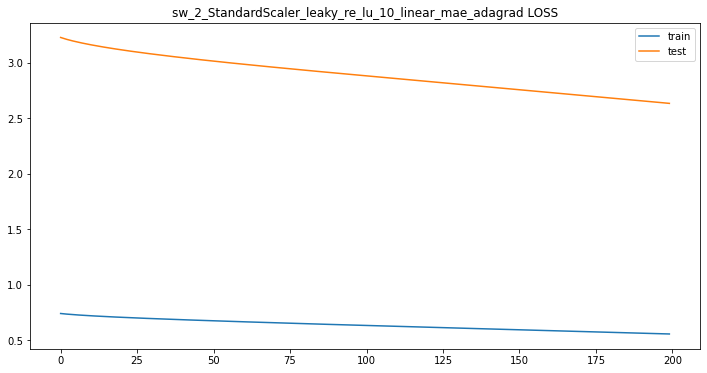


 sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adagrad 데이터 비교


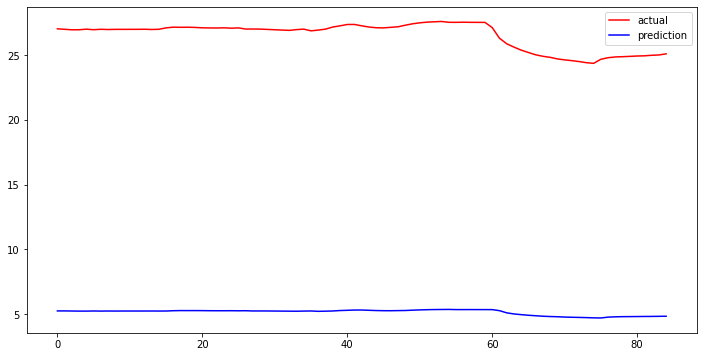

sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adagrad metrics
mean_squared_error : 21.40244178032395
r2_score : -438.45803654807736
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_582"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_582 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_582 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.7261 - acc: 0.0000e+00 - val_loss: 3.0709 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.6852 - acc: 

Epoch 66/200
32/32 - 0s - loss: 0.0584 - acc: 0.0000e+00 - val_loss: 0.0900 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0578 - acc: 0.0000e+00 - val_loss: 0.1610 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0584 - acc: 0.0000e+00 - val_loss: 0.0983 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0582 - acc: 0.0000e+00 - val_loss: 0.0906 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0578 - acc: 0.0000e+00 - val_loss: 0.1747 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0578 - acc: 0.0000e+00 - val_loss: 0.1919 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0583 - acc: 0.0000e+00 - val_loss: 0.1089 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0577 - acc: 0.0000e+00 - val_loss: 0.1056 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0579 - acc: 0.0000e+00 - val_loss: 0.1756 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0580 - acc: 0.0000e+00 - val_loss: 0.1076 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0568 - acc: 0.0000e+00 - val_loss: 0.1905 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0566 - acc: 0.0000e+00 - val_loss: 0.2878 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0573 - acc: 0.0000e+00 - val_loss: 0.2076 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0566 - acc: 0.0000e+00 - val_loss: 0.2342 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0572 - acc: 0.0000e+00 - val_loss: 0.2910 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0566 - acc: 0.0000e+00 - val_loss: 0.2267 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0563 - acc: 0.0000e+00 - val_loss: 0.2286 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0564 - acc: 0.0000e+00 - val_loss: 0.2824 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0575 - acc: 0.0000e+00 - val_loss: 0.2076 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0572 - acc: 0.0000e+00 - val_loss: 0.2340 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

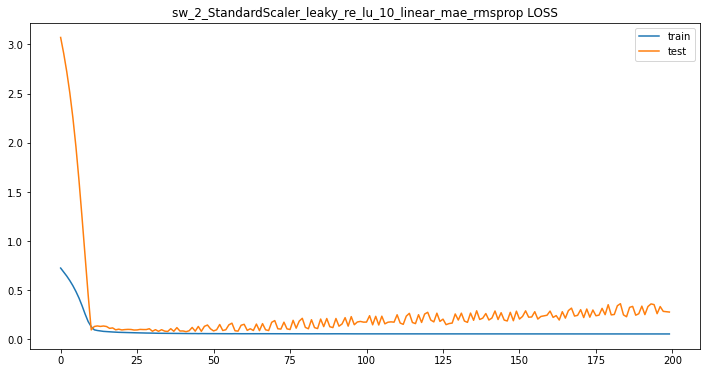


 sw_2_StandardScaler_leaky_re_lu_10_linear_mae_rmsprop 데이터 비교


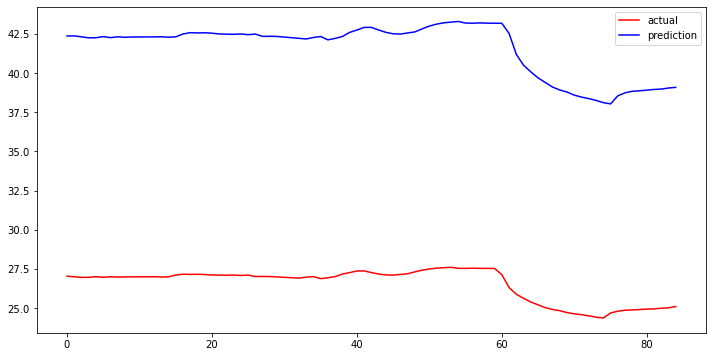

sw_2_StandardScaler_leaky_re_lu_10_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_rmsprop metrics
mean_squared_error : 15.080771100392111
r2_score : -217.19152564514732
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_10
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_583"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_583 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_583 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.7574 - acc: 0.0000e+00 - val_loss: 3.2188 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.744

Epoch 66/200
32/32 - 0s - loss: 0.0764 - acc: 0.0000e+00 - val_loss: 0.1135 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0751 - acc: 0.0000e+00 - val_loss: 0.1057 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0746 - acc: 0.0000e+00 - val_loss: 0.0991 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0741 - acc: 0.0000e+00 - val_loss: 0.0940 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0735 - acc: 0.0000e+00 - val_loss: 0.1058 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0737 - acc: 0.0000e+00 - val_loss: 0.0876 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0725 - acc: 0.0000e+00 - val_loss: 0.0844 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0720 - acc: 0.0000e+00 - val_loss: 0.0807 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0719 - acc: 0.0000e+00 - val_loss: 0.0806 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0715 - acc: 0.0000e+00 - val_loss: 0.0790 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0585 - acc: 0.0000e+00 - val_loss: 0.2951 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0587 - acc: 0.0000e+00 - val_loss: 0.2875 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0586 - acc: 0.0000e+00 - val_loss: 0.2985 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0585 - acc: 0.0000e+00 - val_loss: 0.2962 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0586 - acc: 0.0000e+00 - val_loss: 0.2960 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0585 - acc: 0.0000e+00 - val_loss: 0.2969 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0586 - acc: 0.0000e+00 - val_loss: 0.2646 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0586 - acc: 0.0000e+00 - val_loss: 0.2851 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0585 - acc: 0.0000e+00 - val_loss: 0.2999 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0583 - acc: 0.0000e+00 - val_loss: 0.3051 - val_acc: 0.0000e+00
Epoch 160/

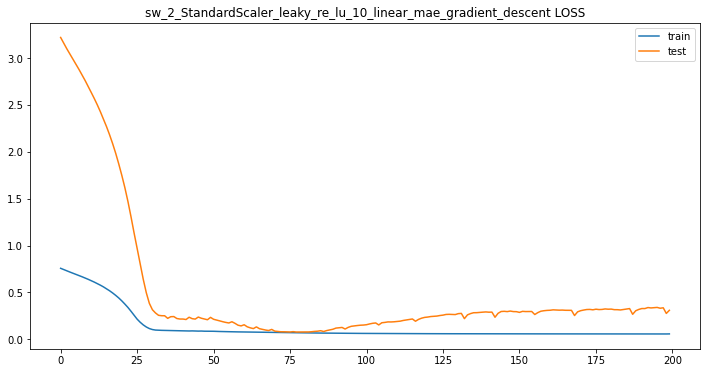


 sw_2_StandardScaler_leaky_re_lu_10_linear_mae_gradient_descent 데이터 비교


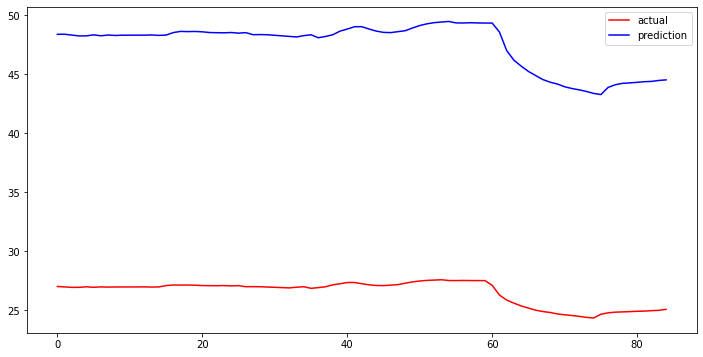

sw_2_StandardScaler_leaky_re_lu_10_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_gradient_descent metrics
mean_squared_error : 20.9590221415709
r2_score : -420.4371824825066
sw_2_StandardScaler_leaky_re_lu_10_linear_mae_gradient_descent이 완료되었습니다.
train_X.shape : (469, 1, 2) 
train_y.shape : (469, 1) 
valid_X.shape :  (118, 1, 2) 
valid_y.shape : (118, 1) 
test_X.shape :  (85, 1, 2)
scaler_data가 완료되었습니다.

Scaler : MaxAbsScaler
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_584"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_584 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_584 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_____________

Epoch 61/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0443 - val_acc: 0.0000e+00
Epoch 62/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0436 - val_acc: 0.0000e+00
Epoch 63/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0428 - val_acc: 0.0000e+00
Epoch 64/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0421 - val_acc: 0.0000e+00
Epoch 65/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0414 - val_acc: 0.0000e+00
Epoch 66/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0406 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0399 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0392 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0385 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0377 - val_acc: 0.0000e+00
Epoch 71/200
32/32 -

Epoch 145/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0195 - val_acc: 0.0000e+00
Epoch 146/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0194 - val_acc: 0.0000e+00
Epoch 147/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0194 - val_acc: 0.0000e+00
Epoch 148/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0194 - val_acc: 0.0000e+00
Epoch 149/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0195 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0194 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0193 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0192 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0191 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0191 - val_acc: 0.0000e+00
Epoch 155/

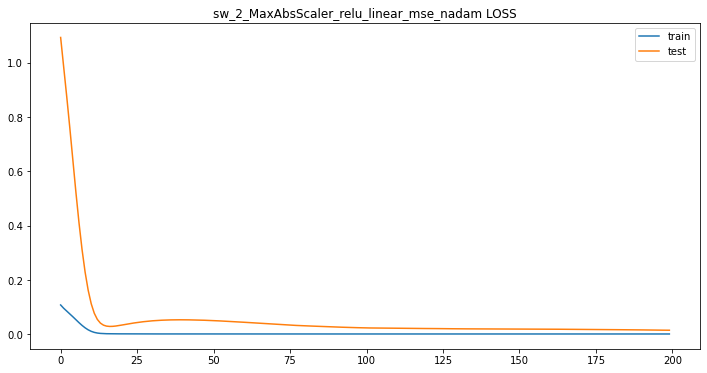


 sw_2_MaxAbsScaler_relu_linear_mse_nadam 데이터 비교


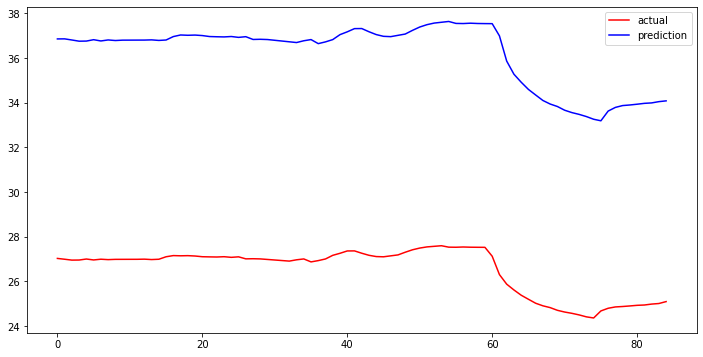

sw_2_MaxAbsScaler_relu_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mse_nadam metrics
mean_squared_error : 9.681439084988742
r2_score : -88.92295235229429
sw_2_MaxAbsScaler_relu_linear_mse_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_585"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_585 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_585 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.1127 - acc: 0.0000e+00 - val_loss: 1.1811 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1073 - acc: 0.0000e+00 - val_loss: 1.1430 - val_acc: 0.0000e+00
Epo

Epoch 66/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.0449 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.0455 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.0461 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.0468 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.0474 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0481 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0488 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0495 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0502 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0508 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0356 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0355 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0353 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0351 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0350 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0348 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0347 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0346 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0345 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0344 - val_acc: 0.0000e+00
Epoch 160/

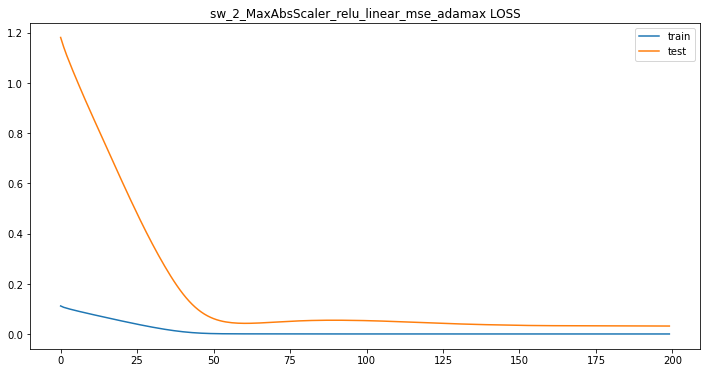


 sw_2_MaxAbsScaler_relu_linear_mse_adamax 데이터 비교


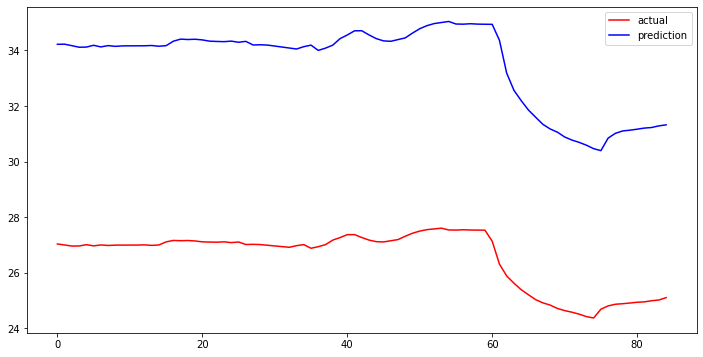

sw_2_MaxAbsScaler_relu_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mse_adamax metrics
mean_squared_error : 7.025425647587849
r2_score : -46.35174897853603
sw_2_MaxAbsScaler_relu_linear_mse_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_586"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_586 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_586 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.1057 - acc: 0.0000e+00 - val_loss: 1.0921 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.0925 - acc: 0.0000e+00 - val_loss: 0.9886 - val_acc: 0.0000e+00
Ep

Epoch 66/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0478 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0471 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0464 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0456 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0451 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0445 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0439 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0433 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0426 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0422 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0314 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0311 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0310 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0309 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0306 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0303 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0300 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0298 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0297 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0295 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

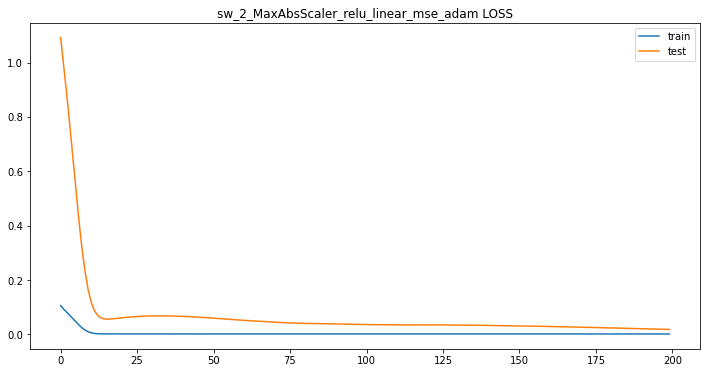


 sw_2_MaxAbsScaler_relu_linear_mse_adam 데이터 비교


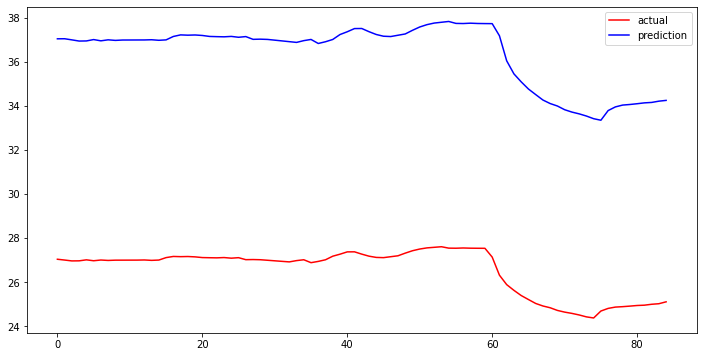

sw_2_MaxAbsScaler_relu_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mse_adam metrics
mean_squared_error : 9.856812157621983
r2_score : -92.21025775911808
sw_2_MaxAbsScaler_relu_linear_mse_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_587"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_587 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_587 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.1104 - acc: 0.0000e+00 - val_loss: 1.1473 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1094 - acc: 0.0000e+00 - val_loss: 1.1414 - val_acc: 0.0000e+00
Epoch

Epoch 66/200
32/32 - 0s - loss: 0.0891 - acc: 0.0000e+00 - val_loss: 0.9804 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0890 - acc: 0.0000e+00 - val_loss: 0.9787 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0888 - acc: 0.0000e+00 - val_loss: 0.9771 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0886 - acc: 0.0000e+00 - val_loss: 0.9755 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0884 - acc: 0.0000e+00 - val_loss: 0.9739 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0882 - acc: 0.0000e+00 - val_loss: 0.9722 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0880 - acc: 0.0000e+00 - val_loss: 0.9706 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0879 - acc: 0.0000e+00 - val_loss: 0.9690 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0877 - acc: 0.0000e+00 - val_loss: 0.9675 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0875 - acc: 0.0000e+00 - val_loss: 0.9659 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0764 - acc: 0.0000e+00 - val_loss: 0.8656 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0763 - acc: 0.0000e+00 - val_loss: 0.8643 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0761 - acc: 0.0000e+00 - val_loss: 0.8631 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0760 - acc: 0.0000e+00 - val_loss: 0.8619 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0759 - acc: 0.0000e+00 - val_loss: 0.8607 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0757 - acc: 0.0000e+00 - val_loss: 0.8595 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0756 - acc: 0.0000e+00 - val_loss: 0.8582 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0755 - acc: 0.0000e+00 - val_loss: 0.8570 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0754 - acc: 0.0000e+00 - val_loss: 0.8558 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0752 - acc: 0.0000e+00 - val_loss: 0.8545 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

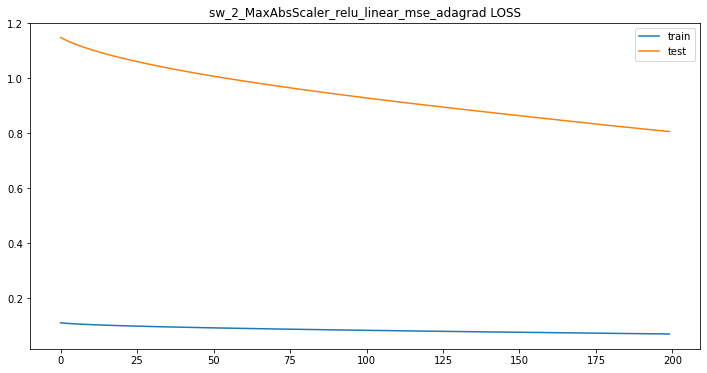


 sw_2_MaxAbsScaler_relu_linear_mse_adagrad 데이터 비교


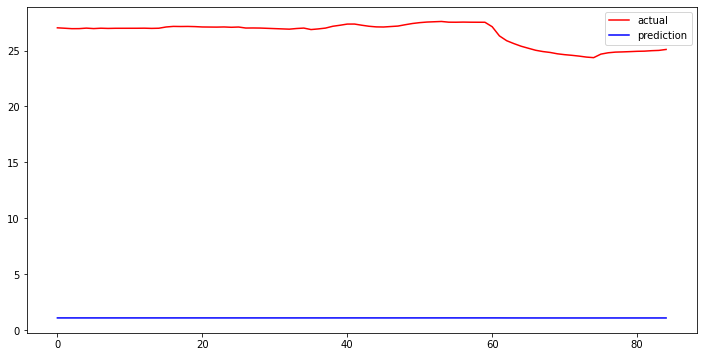

sw_2_MaxAbsScaler_relu_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mse_adagrad metrics
mean_squared_error : 25.45461407937051
r2_score : -620.6183049160074
sw_2_MaxAbsScaler_relu_linear_mse_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_588"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_588 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_588 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.1060 - acc: 0.0000e+00 - val_loss: 1.0211 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.0954 - acc: 0.0000e+00 - val_loss: 0.9266 - val_acc: 0.0000e

Epoch 66/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0111 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0109 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0106 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0103 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0100 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0098 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0095 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0092 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0089 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0087 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0012 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

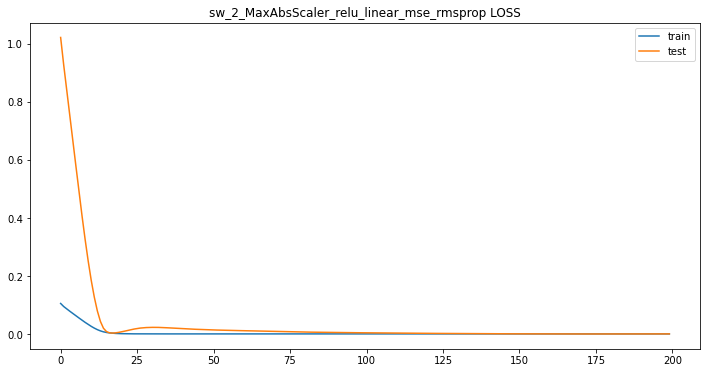


 sw_2_MaxAbsScaler_relu_linear_mse_rmsprop 데이터 비교


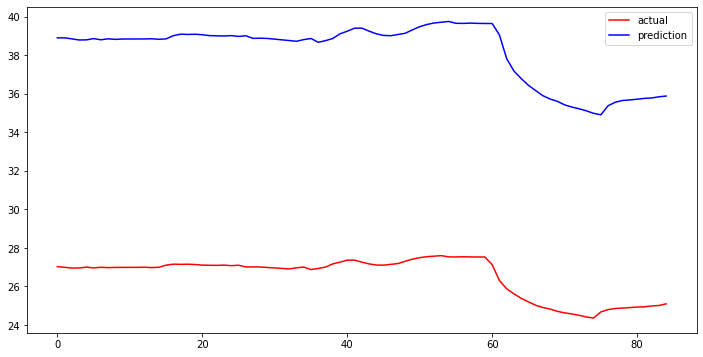

sw_2_MaxAbsScaler_relu_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mse_rmsprop metrics
mean_squared_error : 11.670136144737933
r2_score : -129.6599890551323
sw_2_MaxAbsScaler_relu_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_589"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_589 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_589 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 4s - loss: 0.1233 - acc: 0.0000e+00 - val_loss: 1.1754 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1205 - acc: 0.0000e+00 - val_loss: 1.1495 - val_ac

Epoch 66/200
32/32 - 0s - loss: 0.0476 - acc: 0.0000e+00 - val_loss: 0.5780 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0464 - acc: 0.0000e+00 - val_loss: 0.5686 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0451 - acc: 0.0000e+00 - val_loss: 0.5592 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0439 - acc: 0.0000e+00 - val_loss: 0.5498 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0427 - acc: 0.0000e+00 - val_loss: 0.5405 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0415 - acc: 0.0000e+00 - val_loss: 0.5313 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0403 - acc: 0.0000e+00 - val_loss: 0.5221 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0391 - acc: 0.0000e+00 - val_loss: 0.5131 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0379 - acc: 0.0000e+00 - val_loss: 0.5041 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0367 - acc: 0.0000e+00 - val_loss: 0.4952 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0019 - acc: 0.0000e+00 - val_loss: 0.1333 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0019 - acc: 0.0000e+00 - val_loss: 0.1321 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.1309 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.1298 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.1287 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0017 - acc: 0.0000e+00 - val_loss: 0.1276 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0017 - acc: 0.0000e+00 - val_loss: 0.1266 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0017 - acc: 0.0000e+00 - val_loss: 0.1257 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0017 - acc: 0.0000e+00 - val_loss: 0.1247 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0017 - acc: 0.0000e+00 - val_loss: 0.1238 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

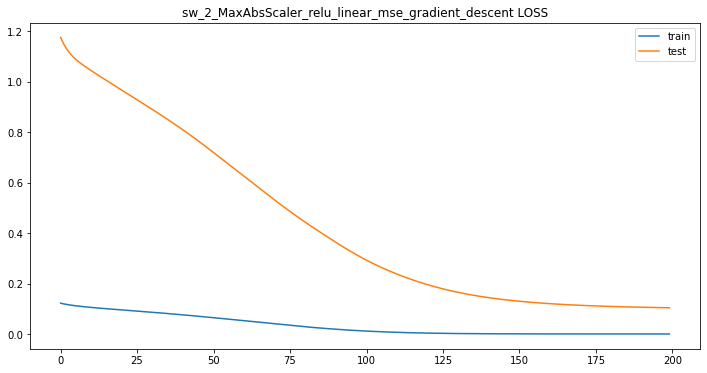


 sw_2_MaxAbsScaler_relu_linear_mse_gradient_descent 데이터 비교


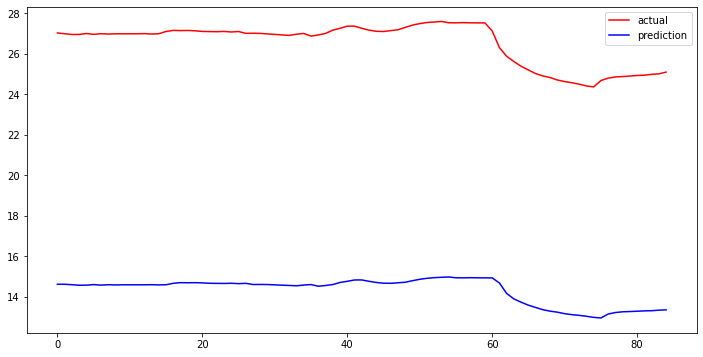

sw_2_MaxAbsScaler_relu_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mse_gradient_descent metrics
mean_squared_error : 12.21525910210834
r2_score : -142.15155261205905
sw_2_MaxAbsScaler_relu_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_590"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_590 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_590 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.2484 - acc: 0.0000e+00 - val_loss: 1.0593 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2308 - acc: 0.0000e+00 - val_loss:

Epoch 66/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1756 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1721 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1730 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1710 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1715 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.1635 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1649 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.1602 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0195 - acc: 0.0000e+00 - val_loss: 0.1624 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1617 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0195 - acc: 0.0000e+00 - val_loss: 0.0695 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0189 - acc: 0.0000e+00 - val_loss: 0.0708 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0195 - acc: 0.0000e+00 - val_loss: 0.0709 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0189 - acc: 0.0000e+00 - val_loss: 0.0721 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0195 - acc: 0.0000e+00 - val_loss: 0.0717 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.0738 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0194 - acc: 0.0000e+00 - val_loss: 0.0693 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0188 - acc: 0.0000e+00 - val_loss: 0.0677 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0195 - acc: 0.0000e+00 - val_loss: 0.0655 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0189 - acc: 0.0000e+00 - val_loss: 0.0702 - val_acc: 0.0000e+00
Epoch 160/

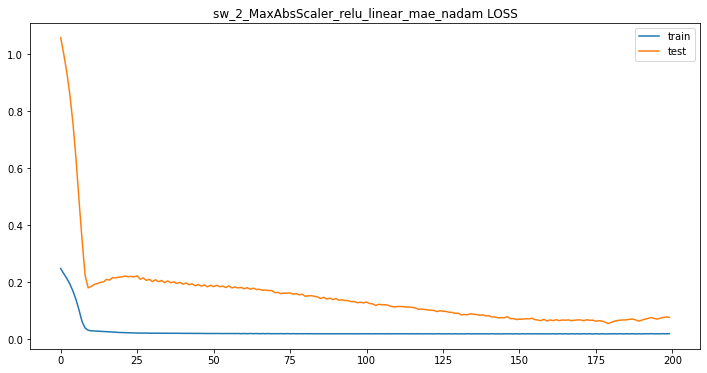


 sw_2_MaxAbsScaler_relu_linear_mae_nadam 데이터 비교


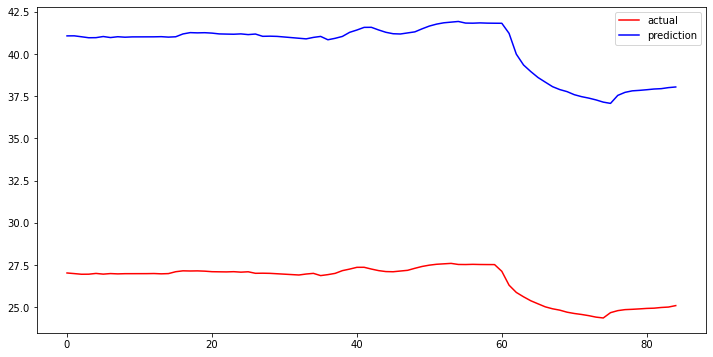

sw_2_MaxAbsScaler_relu_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mae_nadam metrics
mean_squared_error : 13.844251498746578
r2_score : -182.877947895898
sw_2_MaxAbsScaler_relu_linear_mae_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_591"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_591 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_591 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.2490 - acc: 0.0000e+00 - val_loss: 1.0652 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2388 - acc: 0.0000e+00 - val_loss: 1.0415 - val_acc: 0.0000e+00
Epo

Epoch 66/200
32/32 - 0s - loss: 0.0238 - acc: 0.0000e+00 - val_loss: 0.2563 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0233 - acc: 0.0000e+00 - val_loss: 0.2553 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0229 - acc: 0.0000e+00 - val_loss: 0.2548 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0226 - acc: 0.0000e+00 - val_loss: 0.2530 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0223 - acc: 0.0000e+00 - val_loss: 0.2526 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0223 - acc: 0.0000e+00 - val_loss: 0.2530 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0224 - acc: 0.0000e+00 - val_loss: 0.2544 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0226 - acc: 0.0000e+00 - val_loss: 0.2543 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0228 - acc: 0.0000e+00 - val_loss: 0.2548 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0230 - acc: 0.0000e+00 - val_loss: 0.2549 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.2400 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0219 - acc: 0.0000e+00 - val_loss: 0.2375 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0210 - acc: 0.0000e+00 - val_loss: 0.2339 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0209 - acc: 0.0000e+00 - val_loss: 0.2356 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0209 - acc: 0.0000e+00 - val_loss: 0.2367 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0207 - acc: 0.0000e+00 - val_loss: 0.2351 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.2363 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0209 - acc: 0.0000e+00 - val_loss: 0.2352 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0212 - acc: 0.0000e+00 - val_loss: 0.2356 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0209 - acc: 0.0000e+00 - val_loss: 0.2343 - val_acc: 0.0000e+00
Epoch 160/

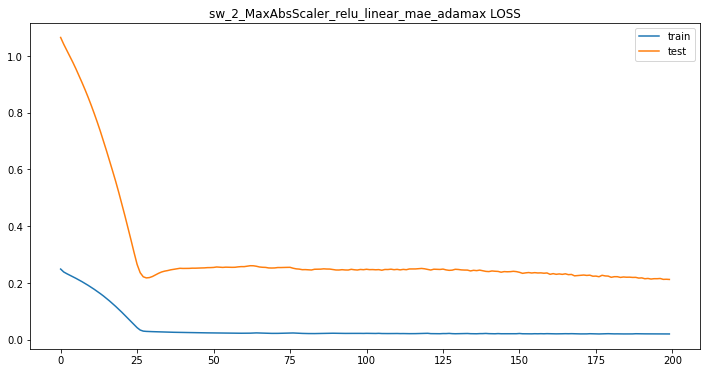


 sw_2_MaxAbsScaler_relu_linear_mae_adamax 데이터 비교


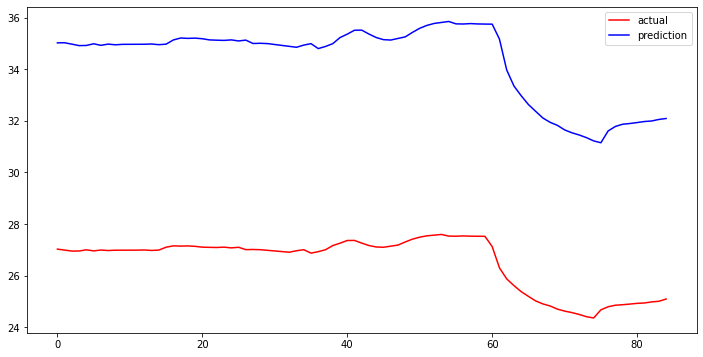

sw_2_MaxAbsScaler_relu_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mae_adamax metrics
mean_squared_error : 7.813880737363117
r2_score : -57.57661201670431
sw_2_MaxAbsScaler_relu_linear_mae_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_592"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_592 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_592 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.2447 - acc: 0.0000e+00 - val_loss: 0.9683 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2229 - acc: 0.0000e+00 - val_loss: 0.8807 - val_acc: 0.0000e+00
Ep

Epoch 66/200
32/32 - 0s - loss: 0.0234 - acc: 0.0000e+00 - val_loss: 0.2047 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0233 - acc: 0.0000e+00 - val_loss: 0.2041 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0225 - acc: 0.0000e+00 - val_loss: 0.1930 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0224 - acc: 0.0000e+00 - val_loss: 0.2007 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0222 - acc: 0.0000e+00 - val_loss: 0.2021 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0239 - acc: 0.0000e+00 - val_loss: 0.1953 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0228 - acc: 0.0000e+00 - val_loss: 0.1921 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0232 - acc: 0.0000e+00 - val_loss: 0.1899 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0225 - acc: 0.0000e+00 - val_loss: 0.1941 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0232 - acc: 0.0000e+00 - val_loss: 0.1937 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0203 - acc: 0.0000e+00 - val_loss: 0.0899 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.0943 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.0963 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0214 - acc: 0.0000e+00 - val_loss: 0.1033 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0934 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0226 - acc: 0.0000e+00 - val_loss: 0.1080 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.0999 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.1175 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.1305 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.1356 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

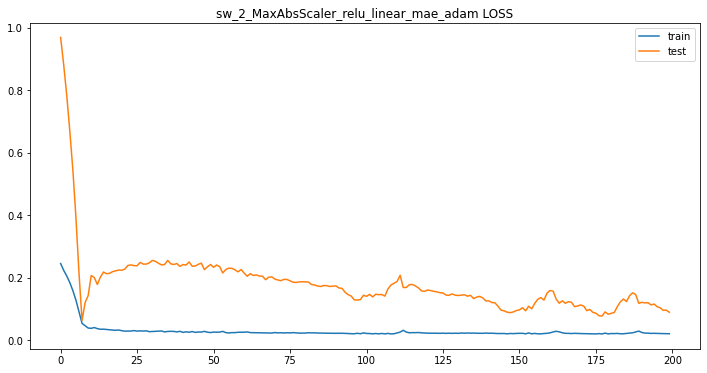


 sw_2_MaxAbsScaler_relu_linear_mae_adam 데이터 비교


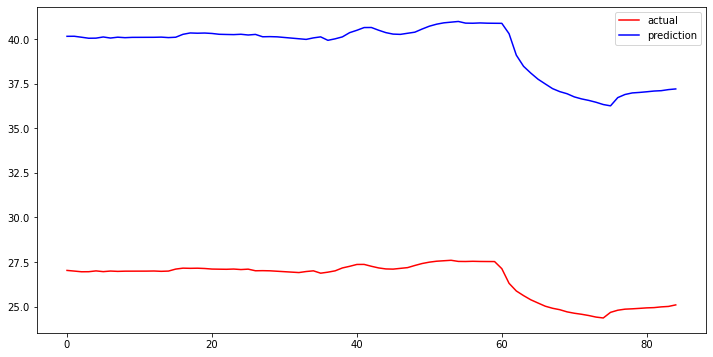

sw_2_MaxAbsScaler_relu_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mae_adam metrics
mean_squared_error : 12.93811269590105
r2_score : -159.595225796958
sw_2_MaxAbsScaler_relu_linear_mae_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_593"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_593 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_593 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 4s - loss: 0.2520 - acc: 0.0000e+00 - val_loss: 1.0650 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2501 - acc: 0.0000e+00 - val_loss: 1.0622 - val_acc: 0.0000e+00
Epoch 

Epoch 66/200
32/32 - 0s - loss: 0.2226 - acc: 0.0000e+00 - val_loss: 0.9822 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.2224 - acc: 0.0000e+00 - val_loss: 0.9813 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.2221 - acc: 0.0000e+00 - val_loss: 0.9803 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.2219 - acc: 0.0000e+00 - val_loss: 0.9794 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.2216 - acc: 0.0000e+00 - val_loss: 0.9784 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.2213 - acc: 0.0000e+00 - val_loss: 0.9775 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.2211 - acc: 0.0000e+00 - val_loss: 0.9766 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.2208 - acc: 0.0000e+00 - val_loss: 0.9756 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.2205 - acc: 0.0000e+00 - val_loss: 0.9747 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.2203 - acc: 0.0000e+00 - val_loss: 0.9737 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.2020 - acc: 0.0000e+00 - val_loss: 0.9076 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.2017 - acc: 0.0000e+00 - val_loss: 0.9068 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.2015 - acc: 0.0000e+00 - val_loss: 0.9059 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.2013 - acc: 0.0000e+00 - val_loss: 0.9051 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.2010 - acc: 0.0000e+00 - val_loss: 0.9042 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.2008 - acc: 0.0000e+00 - val_loss: 0.9034 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.2005 - acc: 0.0000e+00 - val_loss: 0.9026 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.2003 - acc: 0.0000e+00 - val_loss: 0.9017 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.2001 - acc: 0.0000e+00 - val_loss: 0.9009 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1998 - acc: 0.0000e+00 - val_loss: 0.9000 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

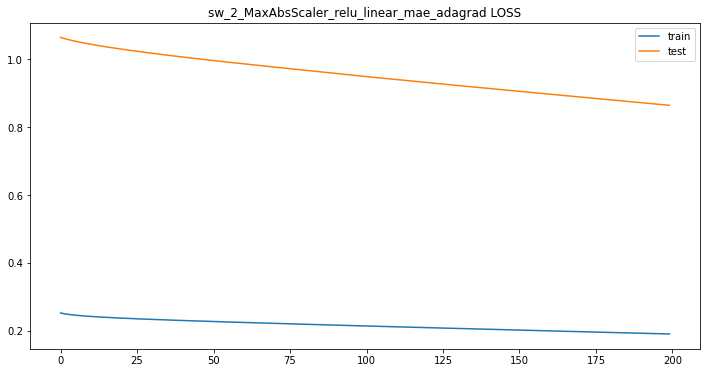


 sw_2_MaxAbsScaler_relu_linear_mae_adagrad 데이터 비교


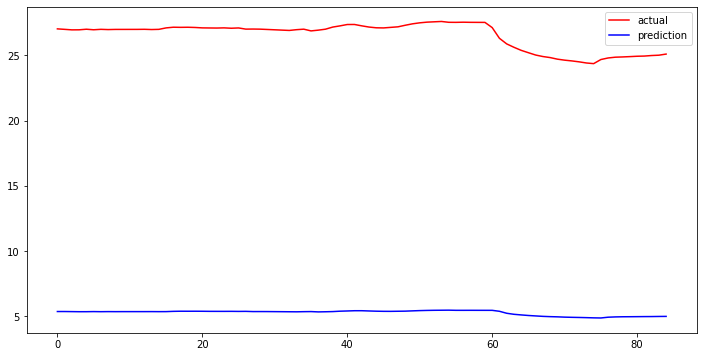

sw_2_MaxAbsScaler_relu_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mae_adagrad metrics
mean_squared_error : 21.285343711897013
r2_score : -433.66247961655114
sw_2_MaxAbsScaler_relu_linear_mae_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_594"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_594 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_594 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.2407 - acc: 0.0000e+00 - val_loss: 1.0672 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2219 - acc: 0.0000e+00 - val_loss: 1.0215 - val_acc: 0.000

Epoch 66/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.1614 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.1790 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1816 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.1613 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.1541 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.1690 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.1733 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1604 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1469 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0195 - acc: 0.0000e+00 - val_loss: 0.1637 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.0730 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.0654 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.0718 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0606 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.0717 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0625 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0195 - acc: 0.0000e+00 - val_loss: 0.0562 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0682 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.0698 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.0565 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

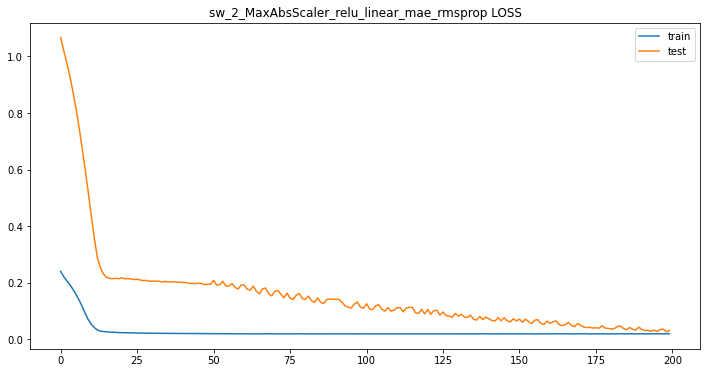


 sw_2_MaxAbsScaler_relu_linear_mae_rmsprop 데이터 비교


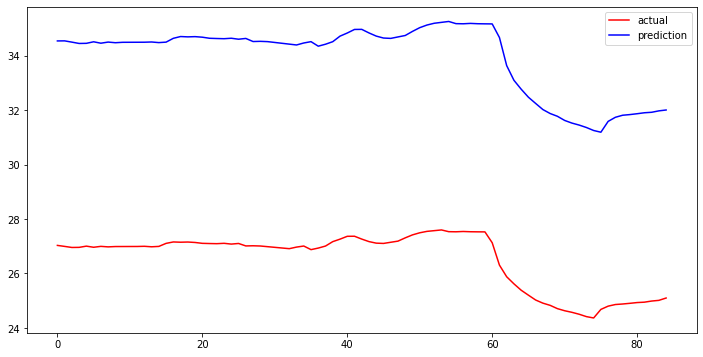

sw_2_MaxAbsScaler_relu_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mae_rmsprop metrics
mean_squared_error : 7.419530879817302
r2_score : -51.813340878393234
sw_2_MaxAbsScaler_relu_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_595"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_595 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_595 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.2513 - acc: 0.0000e+00 - val_loss: 1.0770 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2455 - acc: 0.0000e+00 - val_loss: 1.0651 - val_ac

Epoch 66/200
32/32 - 0s - loss: 0.0261 - acc: 0.0000e+00 - val_loss: 0.3754 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0254 - acc: 0.0000e+00 - val_loss: 0.3691 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0244 - acc: 0.0000e+00 - val_loss: 0.3569 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0239 - acc: 0.0000e+00 - val_loss: 0.3514 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0233 - acc: 0.0000e+00 - val_loss: 0.3444 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0228 - acc: 0.0000e+00 - val_loss: 0.3383 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0228 - acc: 0.0000e+00 - val_loss: 0.3346 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0225 - acc: 0.0000e+00 - val_loss: 0.3304 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0223 - acc: 0.0000e+00 - val_loss: 0.3254 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0222 - acc: 0.0000e+00 - val_loss: 0.3229 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.2639 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.2638 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.2629 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0192 - acc: 0.0000e+00 - val_loss: 0.2641 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.2620 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.2626 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.2633 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0194 - acc: 0.0000e+00 - val_loss: 0.2624 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0194 - acc: 0.0000e+00 - val_loss: 0.2618 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0194 - acc: 0.0000e+00 - val_loss: 0.2611 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

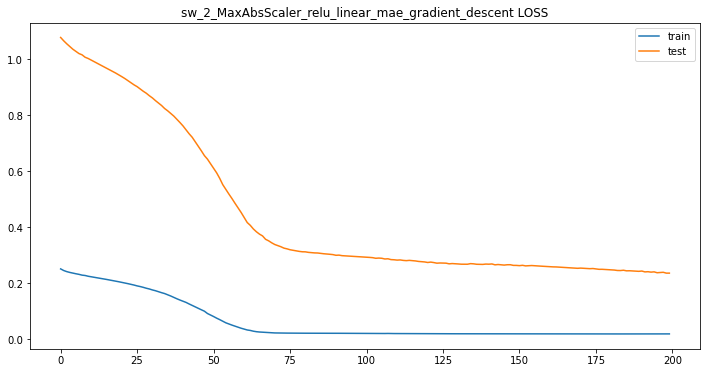


 sw_2_MaxAbsScaler_relu_linear_mae_gradient_descent 데이터 비교


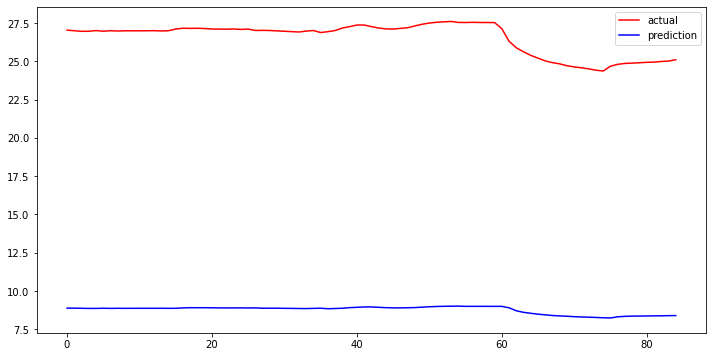

sw_2_MaxAbsScaler_relu_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_relu_linear_mae_gradient_descent metrics
mean_squared_error : 17.789958839133014
r2_score : -302.62719482040677
sw_2_MaxAbsScaler_relu_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_596"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_596 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_596 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.1101 - acc: 0.0000e+00 - val_loss: 1.1190 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.0981 - acc: 0.0000e+00 - va

Epoch 66/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0404 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0396 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0389 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0382 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0375 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0368 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0362 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0356 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0351 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0345 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0239 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0239 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0238 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0238 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0237 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0238 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0238 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0238 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0239 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0239 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

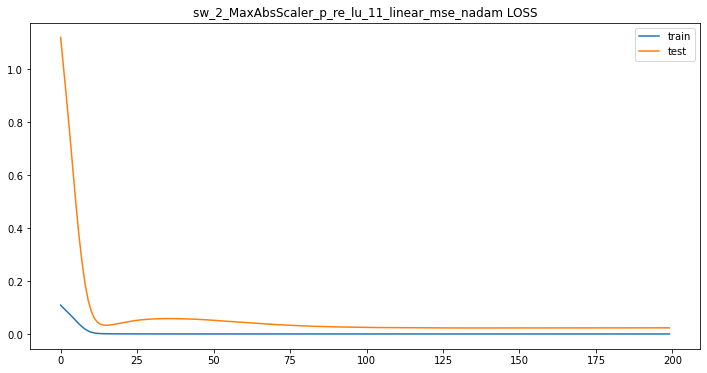


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_nadam 데이터 비교


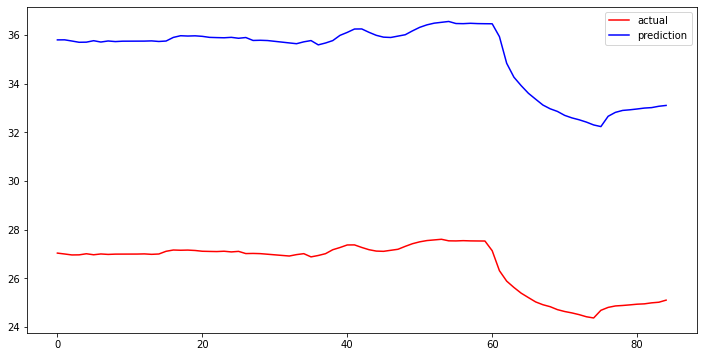

sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_nadam metrics
mean_squared_error : 8.634909866118818
r2_score : -70.53298557724383
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_nadam이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_597"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_597 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_597 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.1095 - acc: 0.0000e+00 - val_loss: 1.2034 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1040 - acc: 0.0000e+00 - val_loss: 1.1618 -

Epoch 66/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.0584 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0585 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0586 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0588 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0590 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0592 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0594 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0596 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0598 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0014 - acc: 0.0000e+00 - val_loss: 0.0601 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0433 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0430 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0428 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0426 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0423 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0421 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0419 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0417 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0415 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0413 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

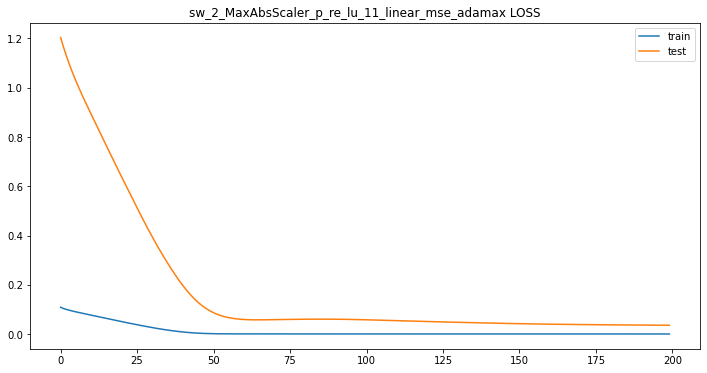


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adamax 데이터 비교


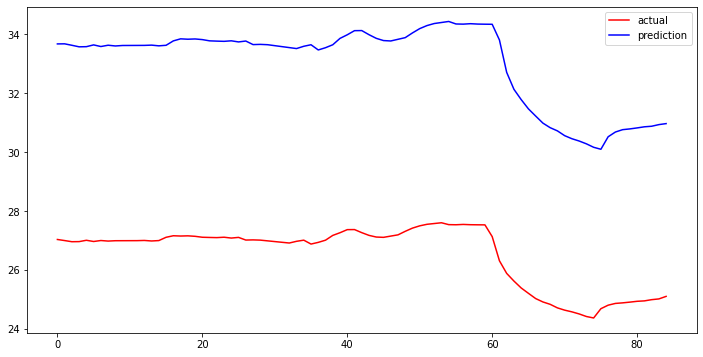

sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adamax metrics
mean_squared_error : 6.515974222974097
r2_score : -39.73329366635074
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adamax이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_598"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_598 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_598 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.1012 - acc: 0.0000e+00 - val_loss: 1.0892 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.0879 - acc: 0.0000e+00 - val_loss: 0.9838 

Epoch 66/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0472 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0467 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0462 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0458 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0454 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0449 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0443 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0439 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0436 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0432 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0370 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0370 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0368 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0365 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0365 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0366 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0367 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0368 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0368 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0366 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

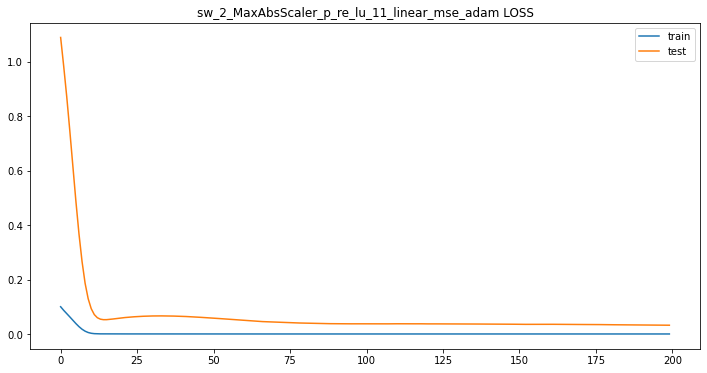


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adam 데이터 비교


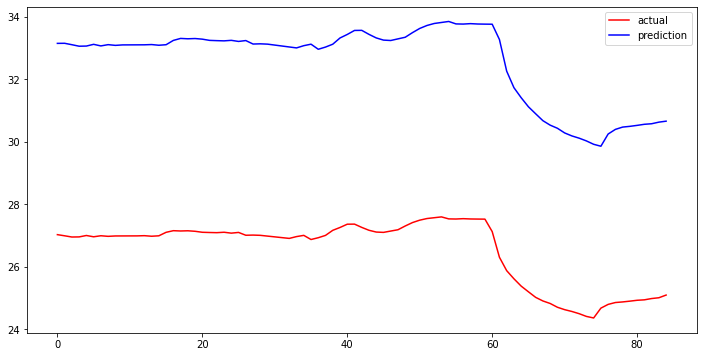

sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adam metrics
mean_squared_error : 6.039696979626783
r2_score : -33.99621474172763
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adam이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_599"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_599 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_599 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.1191 - acc: 0.0000e+00 - val_loss: 1.1960 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1182 - acc: 0.0000e+00 - val_loss: 1.1905 - 

Epoch 66/200
32/32 - 0s - loss: 0.1010 - acc: 0.0000e+00 - val_loss: 1.0522 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.1008 - acc: 0.0000e+00 - val_loss: 1.0509 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.1007 - acc: 0.0000e+00 - val_loss: 1.0496 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.1005 - acc: 0.0000e+00 - val_loss: 1.0482 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.1004 - acc: 0.0000e+00 - val_loss: 1.0469 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.1002 - acc: 0.0000e+00 - val_loss: 1.0456 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.1001 - acc: 0.0000e+00 - val_loss: 1.0443 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.1000 - acc: 0.0000e+00 - val_loss: 1.0431 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0998 - acc: 0.0000e+00 - val_loss: 1.0418 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0997 - acc: 0.0000e+00 - val_loss: 1.0405 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0910 - acc: 0.0000e+00 - val_loss: 0.9606 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0909 - acc: 0.0000e+00 - val_loss: 0.9596 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0908 - acc: 0.0000e+00 - val_loss: 0.9587 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0907 - acc: 0.0000e+00 - val_loss: 0.9577 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0906 - acc: 0.0000e+00 - val_loss: 0.9568 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0905 - acc: 0.0000e+00 - val_loss: 0.9559 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0904 - acc: 0.0000e+00 - val_loss: 0.9549 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0903 - acc: 0.0000e+00 - val_loss: 0.9540 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0902 - acc: 0.0000e+00 - val_loss: 0.9530 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0901 - acc: 0.0000e+00 - val_loss: 0.9521 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

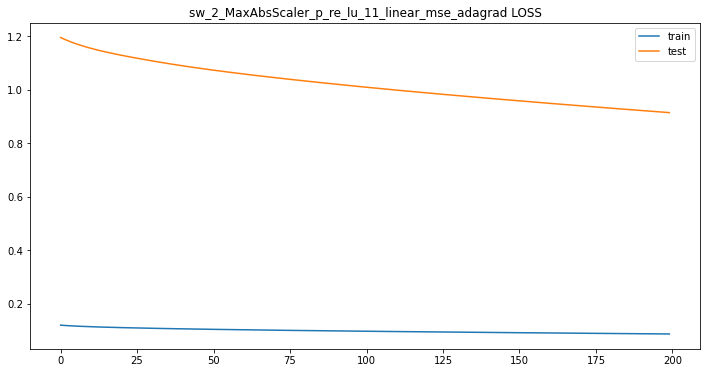


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adagrad 데이터 비교


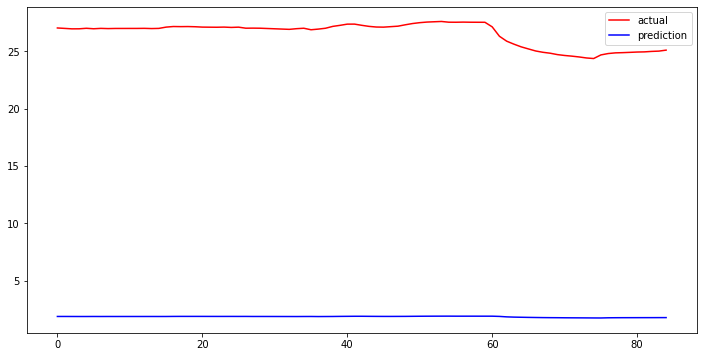

sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adagrad metrics
mean_squared_error : 24.716507878718424
r2_score : -585.0909547412588
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_600"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_600 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_600 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.1120 - acc: 0.0000e+00 - val_loss: 1.1432 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1013 - acc: 0.0000e+00 - val_loss:

Epoch 66/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0147 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0142 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0138 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0133 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0130 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0126 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0124 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0121 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0119 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0116 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

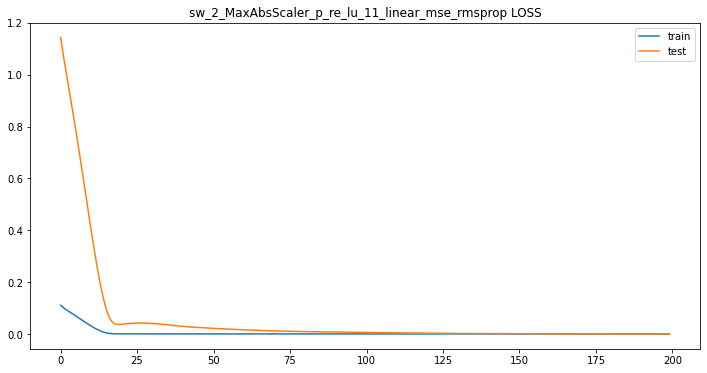


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_rmsprop 데이터 비교


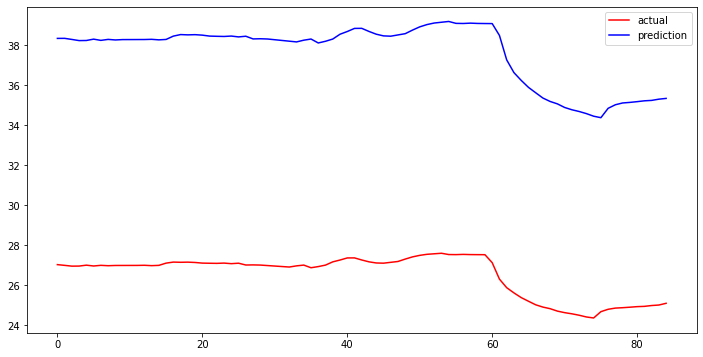

sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_rmsprop metrics
mean_squared_error : 11.111749537458227
r2_score : -117.45561137146755
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_601"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_601 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_601 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.1248 - acc: 0.0000e+00 - val_loss: 1.1703 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1222 - acc: 0.0000e+00 -

Epoch 66/200
32/32 - 0s - loss: 0.0431 - acc: 0.0000e+00 - val_loss: 0.5878 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0418 - acc: 0.0000e+00 - val_loss: 0.5784 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0405 - acc: 0.0000e+00 - val_loss: 0.5691 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0392 - acc: 0.0000e+00 - val_loss: 0.5599 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0379 - acc: 0.0000e+00 - val_loss: 0.5508 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0367 - acc: 0.0000e+00 - val_loss: 0.5418 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0355 - acc: 0.0000e+00 - val_loss: 0.5329 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0342 - acc: 0.0000e+00 - val_loss: 0.5241 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0330 - acc: 0.0000e+00 - val_loss: 0.5155 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0319 - acc: 0.0000e+00 - val_loss: 0.5070 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0016 - acc: 0.0000e+00 - val_loss: 0.1673 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0016 - acc: 0.0000e+00 - val_loss: 0.1661 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0016 - acc: 0.0000e+00 - val_loss: 0.1649 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0016 - acc: 0.0000e+00 - val_loss: 0.1637 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0016 - acc: 0.0000e+00 - val_loss: 0.1626 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.1616 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.1605 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.1595 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.1586 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0015 - acc: 0.0000e+00 - val_loss: 0.1576 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

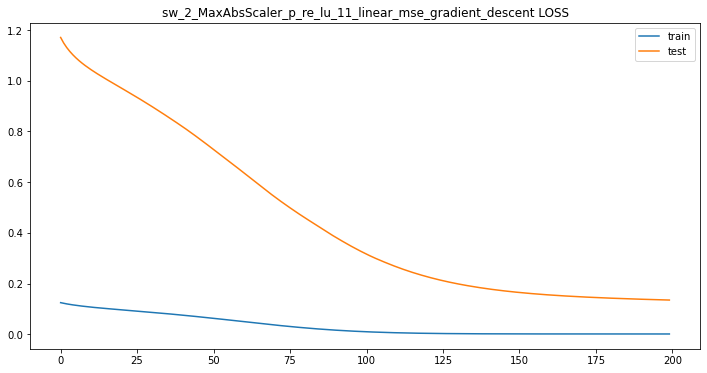


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_gradient_descent 데이터 비교


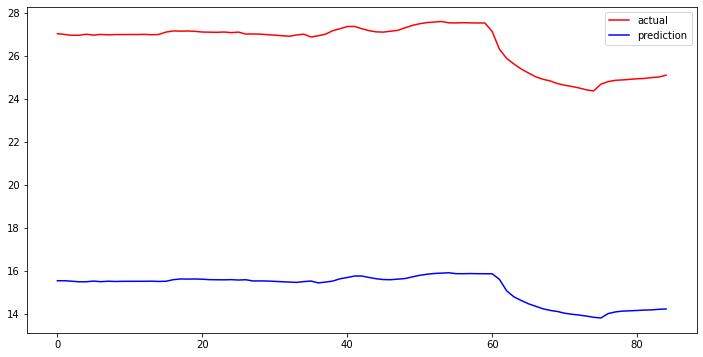

sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_gradient_descent metrics
mean_squared_error : 11.320672386877717
r2_score : -121.9518919239373
sw_2_MaxAbsScaler_p_re_lu_11_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_602"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_602 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_602 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 16s - loss: 0.2365 - acc: 0.0000e+00 - val_loss: 0.9854 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2157 - ac

Epoch 66/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.1587 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1611 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1564 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1563 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1520 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1548 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.1485 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0195 - acc: 0.0000e+00 - val_loss: 0.1494 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.1433 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1453 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0191 - acc: 0.0000e+00 - val_loss: 0.0762 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0191 - acc: 0.0000e+00 - val_loss: 0.0771 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0189 - acc: 0.0000e+00 - val_loss: 0.0768 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.0669 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0188 - acc: 0.0000e+00 - val_loss: 0.0728 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.0846 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.0839 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0828 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0192 - acc: 0.0000e+00 - val_loss: 0.0814 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0828 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

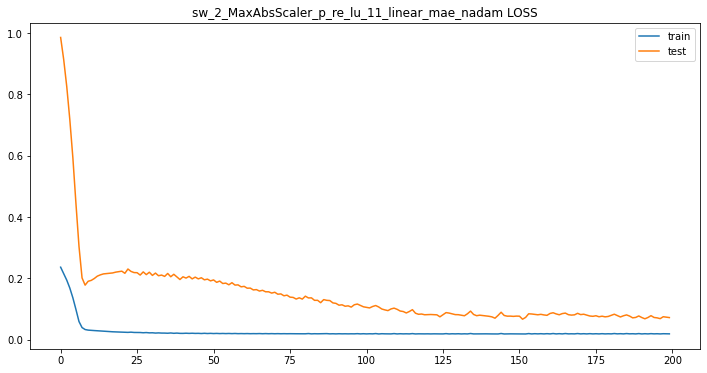


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_nadam 데이터 비교


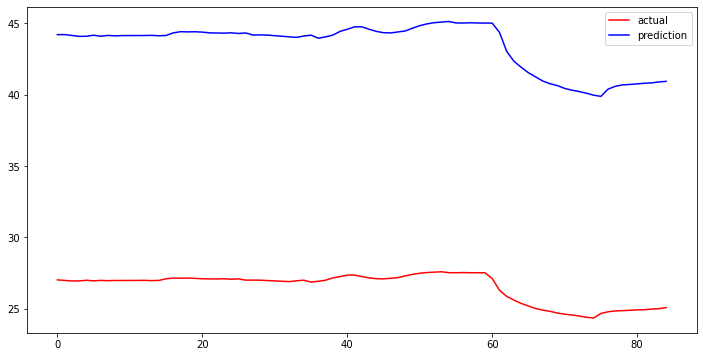

sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_nadam metrics
mean_squared_error : 16.907186824205667
r2_score : -273.2416793328168
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_nadam이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_603"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_603 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_603 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.2546 - acc: 0.0000e+00 - val_loss: 1.0691 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2446 - acc: 0.0000e+00 - val_loss: 1.0429

Epoch 66/200
32/32 - 0s - loss: 0.0245 - acc: 0.0000e+00 - val_loss: 0.2108 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0243 - acc: 0.0000e+00 - val_loss: 0.2120 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0241 - acc: 0.0000e+00 - val_loss: 0.2136 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0240 - acc: 0.0000e+00 - val_loss: 0.2148 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0239 - acc: 0.0000e+00 - val_loss: 0.2166 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0239 - acc: 0.0000e+00 - val_loss: 0.2174 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0237 - acc: 0.0000e+00 - val_loss: 0.2170 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0235 - acc: 0.0000e+00 - val_loss: 0.2178 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0233 - acc: 0.0000e+00 - val_loss: 0.2196 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0233 - acc: 0.0000e+00 - val_loss: 0.2212 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0213 - acc: 0.0000e+00 - val_loss: 0.2306 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0221 - acc: 0.0000e+00 - val_loss: 0.2285 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0213 - acc: 0.0000e+00 - val_loss: 0.2292 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0210 - acc: 0.0000e+00 - val_loss: 0.2288 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0217 - acc: 0.0000e+00 - val_loss: 0.2295 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0213 - acc: 0.0000e+00 - val_loss: 0.2271 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0214 - acc: 0.0000e+00 - val_loss: 0.2276 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0209 - acc: 0.0000e+00 - val_loss: 0.2265 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.2264 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0208 - acc: 0.0000e+00 - val_loss: 0.2265 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

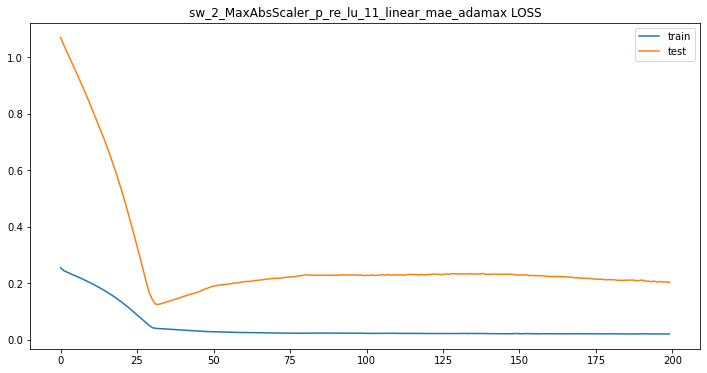


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adamax 데이터 비교


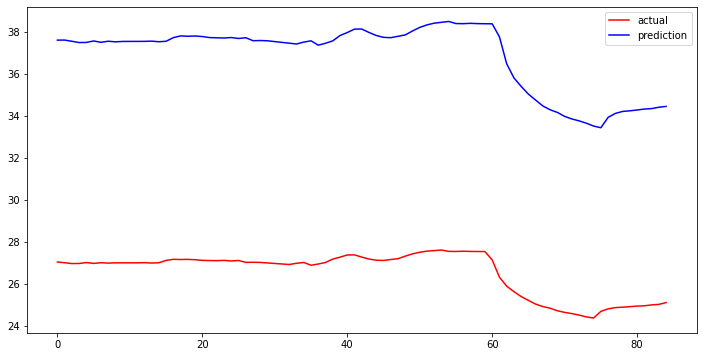

sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adamax metrics
mean_squared_error : 10.335380556494211
r2_score : -101.48109657355094
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adamax이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_604"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_604 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_604 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.2439 - acc: 0.0000e+00 - val_loss: 1.0321 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2218 - acc: 0.0000e+00 - val_loss: 0.965

Epoch 66/200
32/32 - 0s - loss: 0.0238 - acc: 0.0000e+00 - val_loss: 0.2460 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0235 - acc: 0.0000e+00 - val_loss: 0.2461 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0256 - acc: 0.0000e+00 - val_loss: 0.2371 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0240 - acc: 0.0000e+00 - val_loss: 0.2421 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0237 - acc: 0.0000e+00 - val_loss: 0.2381 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0258 - acc: 0.0000e+00 - val_loss: 0.2308 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0241 - acc: 0.0000e+00 - val_loss: 0.2397 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0241 - acc: 0.0000e+00 - val_loss: 0.2344 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0265 - acc: 0.0000e+00 - val_loss: 0.2232 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0230 - acc: 0.0000e+00 - val_loss: 0.2302 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0218 - acc: 0.0000e+00 - val_loss: 0.1108 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0226 - acc: 0.0000e+00 - val_loss: 0.1117 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0221 - acc: 0.0000e+00 - val_loss: 0.1091 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0235 - acc: 0.0000e+00 - val_loss: 0.1008 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0225 - acc: 0.0000e+00 - val_loss: 0.1056 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0223 - acc: 0.0000e+00 - val_loss: 0.1012 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0221 - acc: 0.0000e+00 - val_loss: 0.1021 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0219 - acc: 0.0000e+00 - val_loss: 0.1008 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0218 - acc: 0.0000e+00 - val_loss: 0.1001 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0214 - acc: 0.0000e+00 - val_loss: 0.0928 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

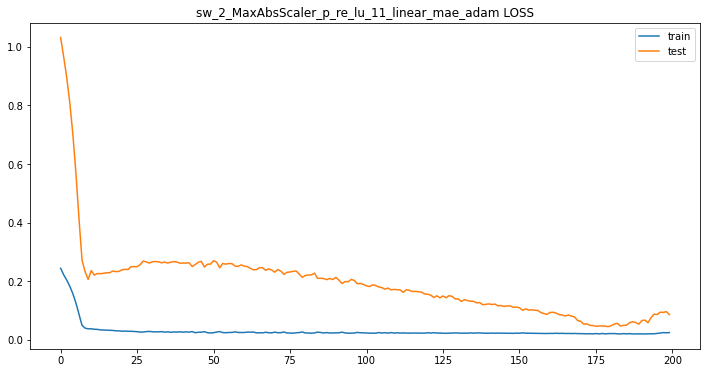


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adam 데이터 비교


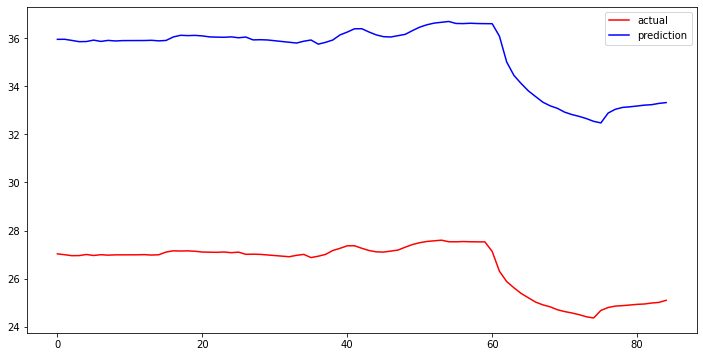

sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adam metrics
mean_squared_error : 8.805201328451854
r2_score : -73.38225533040433
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adam이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_605"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_605 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_605 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.2630 - acc: 0.0000e+00 - val_loss: 1.1271 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2610 - acc: 0.0000e+00 - val_loss: 1.1237 - 

Epoch 66/200
32/32 - 0s - loss: 0.2359 - acc: 0.0000e+00 - val_loss: 1.0390 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.2357 - acc: 0.0000e+00 - val_loss: 1.0381 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.2355 - acc: 0.0000e+00 - val_loss: 1.0372 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.2353 - acc: 0.0000e+00 - val_loss: 1.0363 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.2350 - acc: 0.0000e+00 - val_loss: 1.0354 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.2348 - acc: 0.0000e+00 - val_loss: 1.0345 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.2346 - acc: 0.0000e+00 - val_loss: 1.0336 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.2344 - acc: 0.0000e+00 - val_loss: 1.0328 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.2342 - acc: 0.0000e+00 - val_loss: 1.0319 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.2340 - acc: 0.0000e+00 - val_loss: 1.0311 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.2209 - acc: 0.0000e+00 - val_loss: 0.9765 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.2208 - acc: 0.0000e+00 - val_loss: 0.9759 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.2206 - acc: 0.0000e+00 - val_loss: 0.9752 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.2204 - acc: 0.0000e+00 - val_loss: 0.9745 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.2203 - acc: 0.0000e+00 - val_loss: 0.9739 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.2201 - acc: 0.0000e+00 - val_loss: 0.9732 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.2199 - acc: 0.0000e+00 - val_loss: 0.9725 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.2198 - acc: 0.0000e+00 - val_loss: 0.9719 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.2196 - acc: 0.0000e+00 - val_loss: 0.9712 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.2194 - acc: 0.0000e+00 - val_loss: 0.9706 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

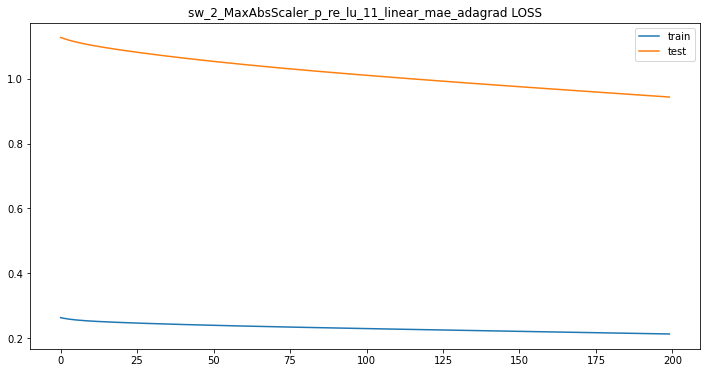


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adagrad 데이터 비교


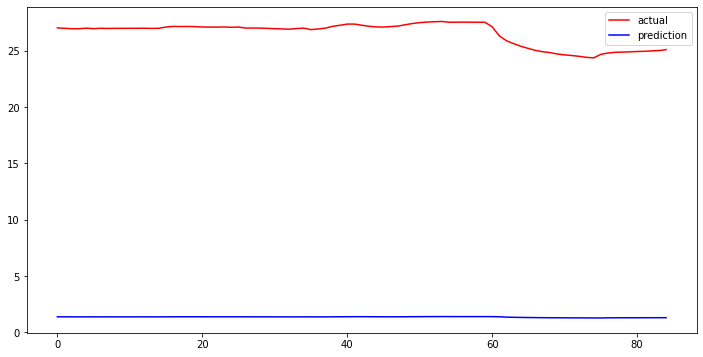

sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adagrad metrics
mean_squared_error : 25.201685240571585
r2_score : -608.3263605568618
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_606"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_606 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_606 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.2378 - acc: 0.0000e+00 - val_loss: 1.0154 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2186 - acc: 0.0000e+00 - val_loss: 

Epoch 66/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1577 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1748 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.1527 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.1539 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1402 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.1563 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.1413 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.1552 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1422 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.1522 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0572 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.0518 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.0557 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0669 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.0563 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.0502 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.0628 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.0514 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0477 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.0608 - val_acc: 0.0000e+00
Epoch 160/

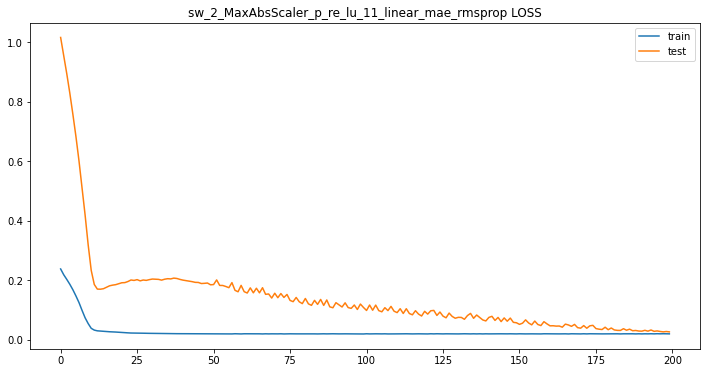


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_rmsprop 데이터 비교


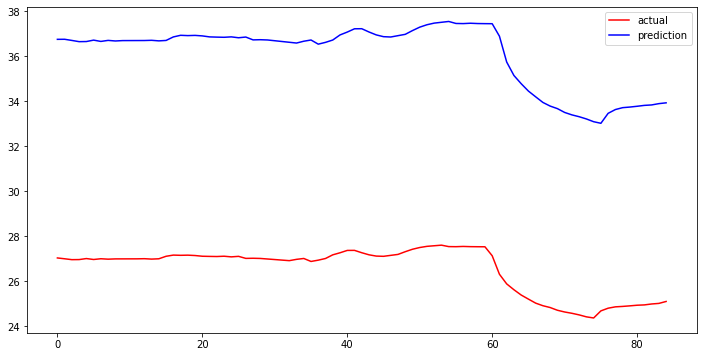

sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_rmsprop metrics
mean_squared_error : 9.55526998620538
r2_score : -86.59447008164865
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_11
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_607"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_607 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_607 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.2499 - acc: 0.0000e+00 - val_loss: 1.0547 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2430 - acc: 0.0000e+00 - val

Epoch 66/200
32/32 - 0s - loss: 0.0233 - acc: 0.0000e+00 - val_loss: 0.2778 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0231 - acc: 0.0000e+00 - val_loss: 0.2744 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0230 - acc: 0.0000e+00 - val_loss: 0.2715 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0228 - acc: 0.0000e+00 - val_loss: 0.2678 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0226 - acc: 0.0000e+00 - val_loss: 0.2635 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0226 - acc: 0.0000e+00 - val_loss: 0.2617 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0224 - acc: 0.0000e+00 - val_loss: 0.2602 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0223 - acc: 0.0000e+00 - val_loss: 0.2565 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0224 - acc: 0.0000e+00 - val_loss: 0.2558 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0223 - acc: 0.0000e+00 - val_loss: 0.2545 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.1942 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0191 - acc: 0.0000e+00 - val_loss: 0.1946 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.1936 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.1925 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.1944 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0189 - acc: 0.0000e+00 - val_loss: 0.1925 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.1924 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0192 - acc: 0.0000e+00 - val_loss: 0.1925 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0191 - acc: 0.0000e+00 - val_loss: 0.1927 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.1928 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

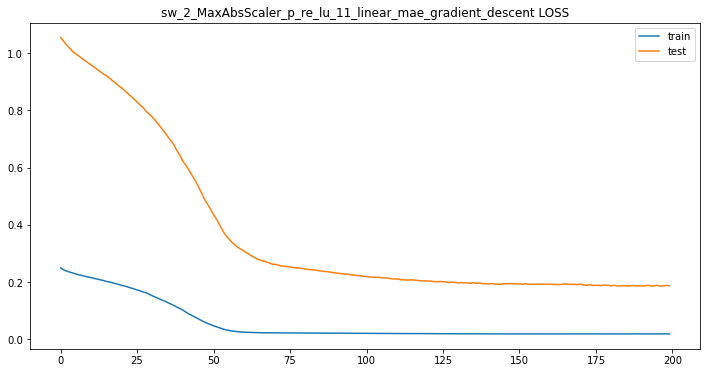


 sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_gradient_descent 데이터 비교


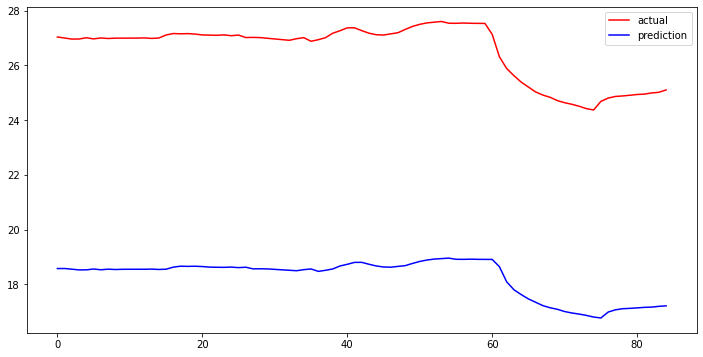

sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_gradient_descent metrics
mean_squared_error : 8.288771182881572
r2_score : -64.91299104442858
sw_2_MaxAbsScaler_p_re_lu_11_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_608"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_608 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_608 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.1136 - acc: 0.0000e+00 - val_loss: 1.1560 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1007 - 

Epoch 66/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0365 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0359 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0353 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0348 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0343 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0338 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0334 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0329 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0325 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0322 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0215 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0213 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0213 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0213 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

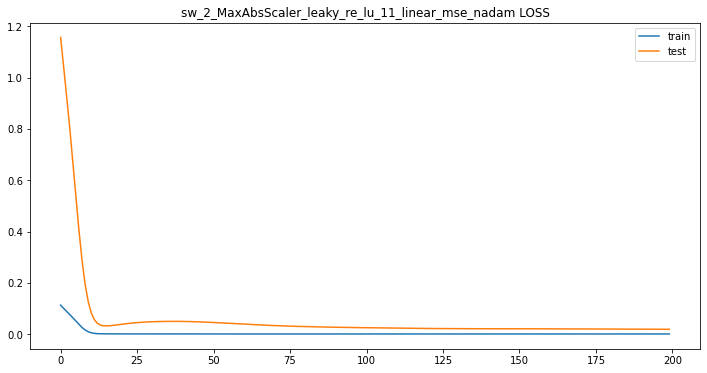


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_nadam 데이터 비교


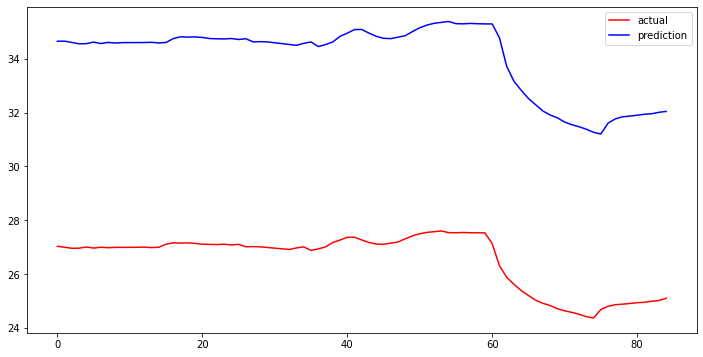

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_nadam metrics
mean_squared_error : 7.512085142439205
r2_score : -53.13918580409484
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_609"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_609 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_609 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.1244 - acc: 0.0000e+00 - val_loss: 1.2326 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1183 - acc: 0.0000e+00 - va

32/32 - 0s - loss: 0.0040 - acc: 0.0000e+00 - val_loss: 5.7698e-04 - val_acc: 0.0000e+00
Epoch 66/200
32/32 - 0s - loss: 0.0038 - acc: 0.0000e+00 - val_loss: 6.7274e-04 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0036 - acc: 0.0000e+00 - val_loss: 8.1111e-04 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0034 - acc: 0.0000e+00 - val_loss: 0.0010 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0032 - acc: 0.0000e+00 - val_loss: 0.0013 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0031 - acc: 0.0000e+00 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0029 - acc: 0.0000e+00 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0028 - acc: 0.0000e+00 - val_loss: 0.0024 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0026 - acc: 0.0000e+00 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0025 - acc: 0.0000e+00 - val_loss: 0.0035 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 

32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0224 - val_acc: 0.0000e+00
Epoch 149/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0223 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0222 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0222 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0221 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0220 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0219 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0219 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0218 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0217 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s

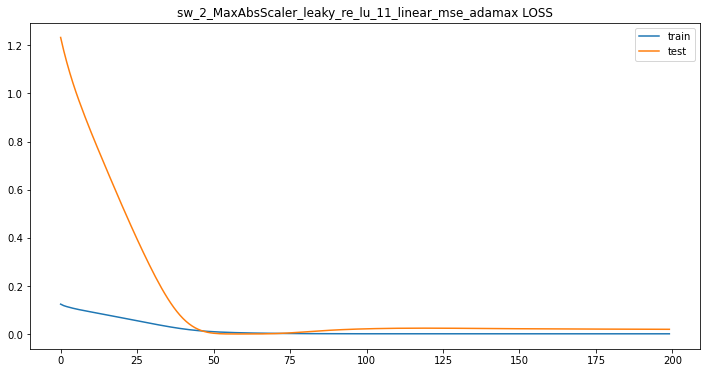


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adamax 데이터 비교


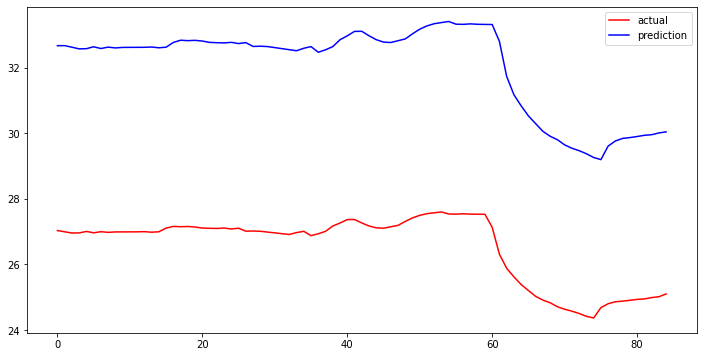

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adamax metrics
mean_squared_error : 5.528301250436355
r2_score : -28.320686248048066
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_610"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_610 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_610 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.1076 - acc: 0.0000e+00 - val_loss: 1.0886 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.0954 - acc: 0.0000e+00 - 

Epoch 66/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0474 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0469 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0462 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0456 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0450 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0444 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0438 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0433 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0427 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0422 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0207 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0205 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0203 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0203 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0201 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0198 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0195 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0194 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0192 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0190 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

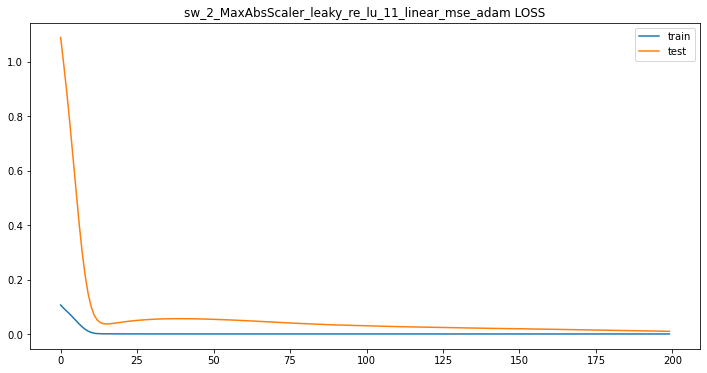


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adam 데이터 비교


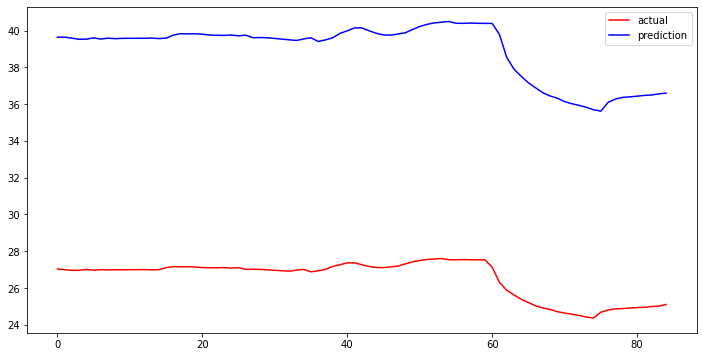

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adam metrics
mean_squared_error : 12.405128255332551
r2_score : -146.63636059591306
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_611"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_611 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_611 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 4s - loss: 0.1134 - acc: 0.0000e+00 - val_loss: 1.1807 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1125 - acc: 0.0000e+00 - va

Epoch 66/200
32/32 - 0s - loss: 0.0925 - acc: 0.0000e+00 - val_loss: 1.0267 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0923 - acc: 0.0000e+00 - val_loss: 1.0251 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0921 - acc: 0.0000e+00 - val_loss: 1.0235 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0920 - acc: 0.0000e+00 - val_loss: 1.0219 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0918 - acc: 0.0000e+00 - val_loss: 1.0203 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0916 - acc: 0.0000e+00 - val_loss: 1.0187 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0914 - acc: 0.0000e+00 - val_loss: 1.0171 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0912 - acc: 0.0000e+00 - val_loss: 1.0155 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0910 - acc: 0.0000e+00 - val_loss: 1.0139 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0909 - acc: 0.0000e+00 - val_loss: 1.0124 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0796 - acc: 0.0000e+00 - val_loss: 0.9114 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0795 - acc: 0.0000e+00 - val_loss: 0.9102 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0793 - acc: 0.0000e+00 - val_loss: 0.9090 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0792 - acc: 0.0000e+00 - val_loss: 0.9079 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0791 - acc: 0.0000e+00 - val_loss: 0.9067 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0789 - acc: 0.0000e+00 - val_loss: 0.9055 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0788 - acc: 0.0000e+00 - val_loss: 0.9043 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0787 - acc: 0.0000e+00 - val_loss: 0.9032 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0785 - acc: 0.0000e+00 - val_loss: 0.9020 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0784 - acc: 0.0000e+00 - val_loss: 0.9008 - val_acc: 0.0000e+00
Epoch 160/

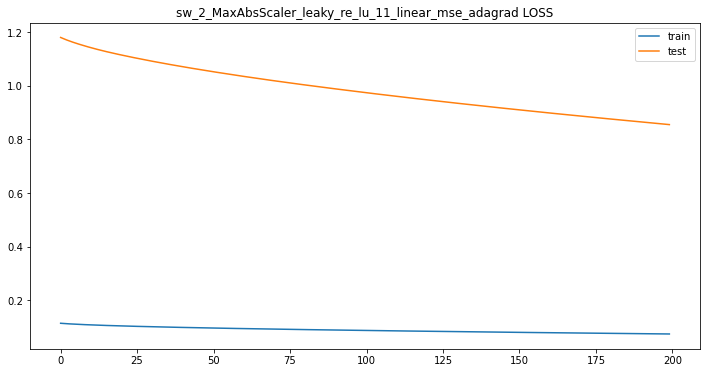


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adagrad 데이터 비교


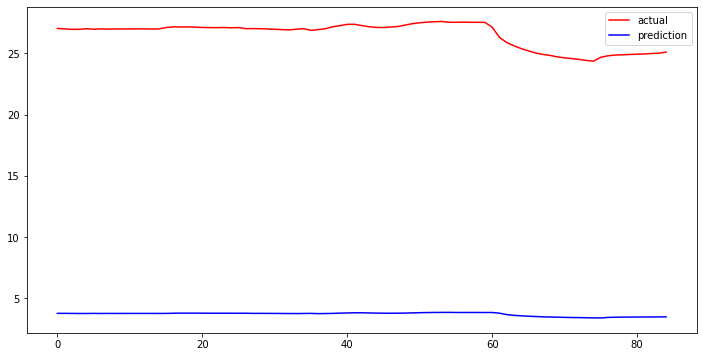

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adagrad metrics
mean_squared_error : 22.83598961891076
r2_score : -499.2999413769231
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_612"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_612 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_612 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.1123 - acc: 0.0000e+00 - val_loss: 1.1467 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1010 - acc: 0.0000e+

Epoch 66/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0130 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0127 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0124 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0121 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0119 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0116 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0013 - acc: 0.0000e+00 - val_loss: 0.0114 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0111 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0109 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0106 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0016 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0015 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0012 - acc: 0.0000e+00 - val_loss: 0.0014 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

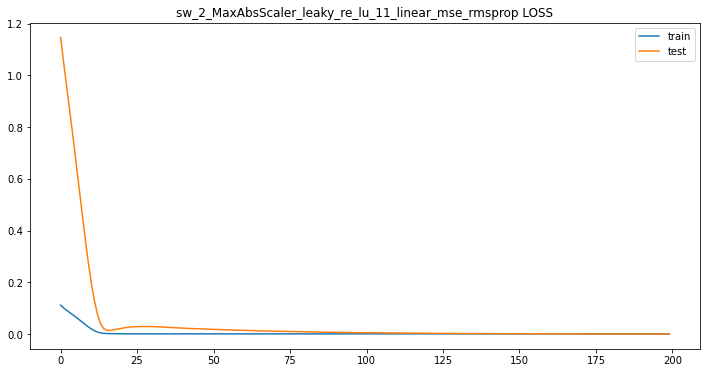


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_rmsprop 데이터 비교


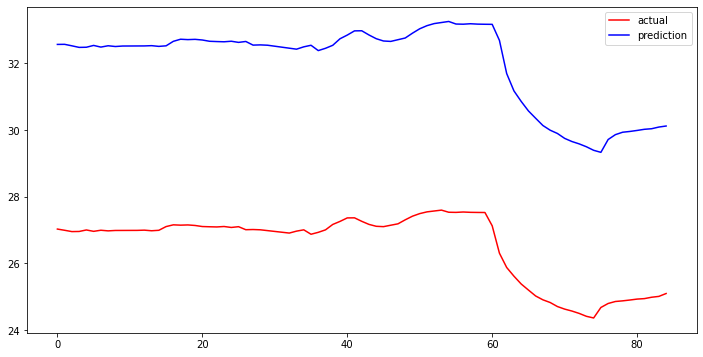

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_rmsprop metrics
mean_squared_error : 5.465792831888886
r2_score : -27.661379161167883
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_613"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_613 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_613 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.1163 - acc: 0.0000e+00 - val_loss: 1.1273 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.1139 - acc

Epoch 66/200
32/32 - 0s - loss: 0.0331 - acc: 0.0000e+00 - val_loss: 0.4279 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0320 - acc: 0.0000e+00 - val_loss: 0.4191 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0309 - acc: 0.0000e+00 - val_loss: 0.4104 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0298 - acc: 0.0000e+00 - val_loss: 0.4018 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0288 - acc: 0.0000e+00 - val_loss: 0.3933 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0278 - acc: 0.0000e+00 - val_loss: 0.3850 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0267 - acc: 0.0000e+00 - val_loss: 0.3768 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0257 - acc: 0.0000e+00 - val_loss: 0.3687 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0248 - acc: 0.0000e+00 - val_loss: 0.3608 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0238 - acc: 0.0000e+00 - val_loss: 0.3530 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0019 - acc: 0.0000e+00 - val_loss: 0.0914 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0019 - acc: 0.0000e+00 - val_loss: 0.0907 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0019 - acc: 0.0000e+00 - val_loss: 0.0901 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.0895 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.0889 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.0883 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.0878 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.0873 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.0868 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0018 - acc: 0.0000e+00 - val_loss: 0.0863 - val_acc: 0.0000e+00
Epoch 160/

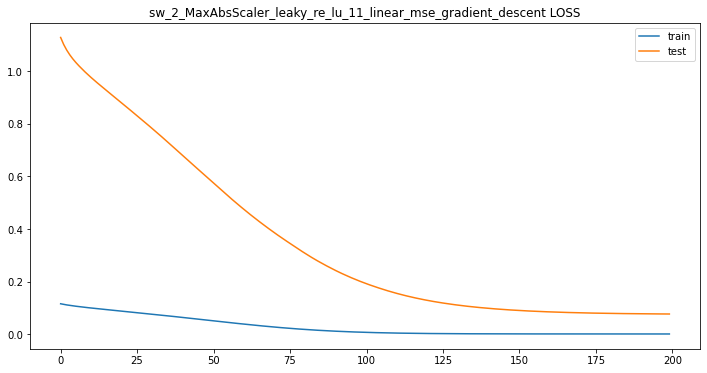


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_gradient_descent 데이터 비교


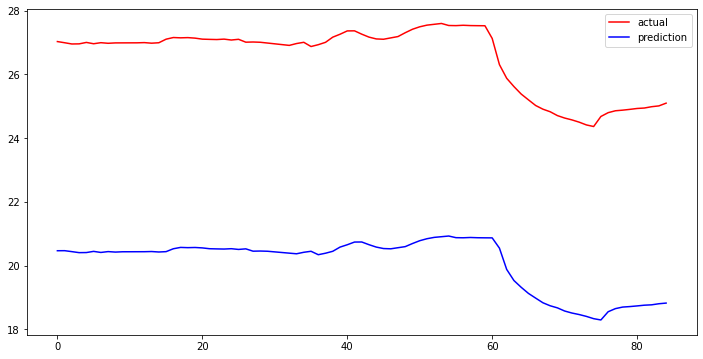

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_gradient_descent metrics
mean_squared_error : 6.4563485654118535
r2_score : -38.991222307486005
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_614"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_614 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_614 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 0.2439 - acc: 0.0000e+00 - val_loss: 1.0129 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - 

Epoch 66/200
32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.1559 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1485 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.1513 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.1444 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.1512 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.1441 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1429 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.1353 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0196 - acc: 0.0000e+00 - val_loss: 0.1398 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0198 - acc: 0.0000e+00 - val_loss: 0.1324 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.0693 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.0718 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.0745 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0192 - acc: 0.0000e+00 - val_loss: 0.0683 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0188 - acc: 0.0000e+00 - val_loss: 0.0703 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0692 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0190 - acc: 0.0000e+00 - val_loss: 0.0737 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0193 - acc: 0.0000e+00 - val_loss: 0.0715 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0192 - acc: 0.0000e+00 - val_loss: 0.0716 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0194 - acc: 0.0000e+00 - val_loss: 0.0724 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

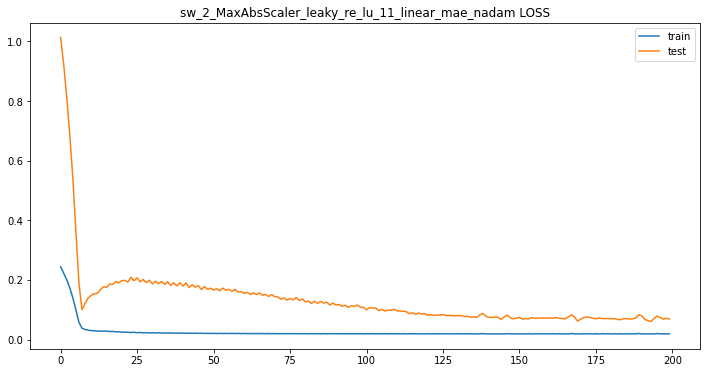


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_nadam 데이터 비교


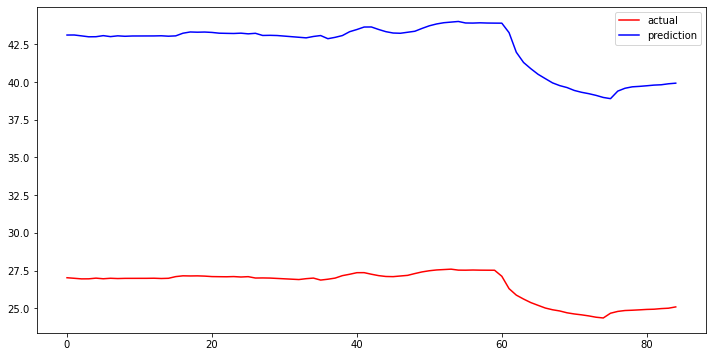

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_nadam metrics
mean_squared_error : 15.840093728761124
r2_score : -239.71671325219032
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_615"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_615 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_615 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.2540 - acc: 0.0000e+00 - val_loss: 1.0618 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2414 - acc: 0.0000e+00 - 

Epoch 66/200
32/32 - 0s - loss: 0.0240 - acc: 0.0000e+00 - val_loss: 0.2292 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0239 - acc: 0.0000e+00 - val_loss: 0.2292 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0237 - acc: 0.0000e+00 - val_loss: 0.2280 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0234 - acc: 0.0000e+00 - val_loss: 0.2270 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0230 - acc: 0.0000e+00 - val_loss: 0.2279 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0229 - acc: 0.0000e+00 - val_loss: 0.2299 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0233 - acc: 0.0000e+00 - val_loss: 0.2316 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0238 - acc: 0.0000e+00 - val_loss: 0.2329 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0239 - acc: 0.0000e+00 - val_loss: 0.2286 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0234 - acc: 0.0000e+00 - val_loss: 0.2265 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0215 - acc: 0.0000e+00 - val_loss: 0.2127 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0213 - acc: 0.0000e+00 - val_loss: 0.2111 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.2099 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0216 - acc: 0.0000e+00 - val_loss: 0.2110 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0213 - acc: 0.0000e+00 - val_loss: 0.2107 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0218 - acc: 0.0000e+00 - val_loss: 0.2110 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0213 - acc: 0.0000e+00 - val_loss: 0.2088 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0216 - acc: 0.0000e+00 - val_loss: 0.2085 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0210 - acc: 0.0000e+00 - val_loss: 0.2072 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.2084 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

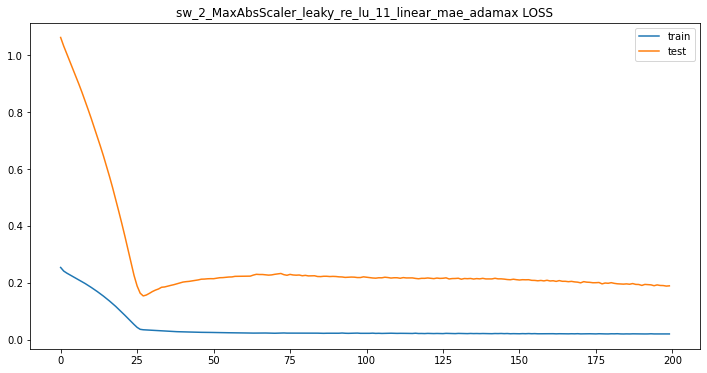


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adamax 데이터 비교


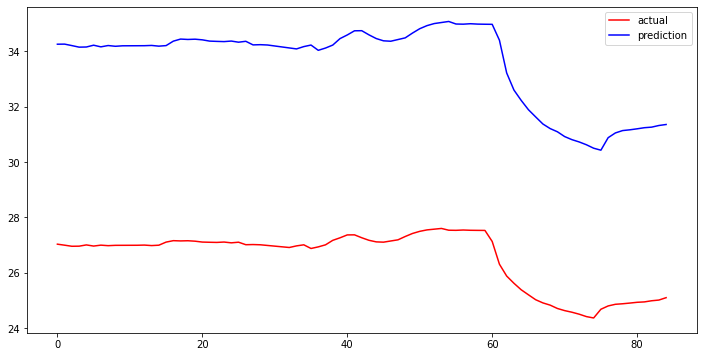

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adamax metrics
mean_squared_error : 7.056954966791294
r2_score : -46.77772013212223
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_616"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_616 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_616 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.2541 - acc: 0.0000e+00 - val_loss: 1.0697 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2357 - acc: 0.0000e+00 - v

Epoch 66/200
32/32 - 0s - loss: 0.0226 - acc: 0.0000e+00 - val_loss: 0.1740 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0229 - acc: 0.0000e+00 - val_loss: 0.1706 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0224 - acc: 0.0000e+00 - val_loss: 0.1658 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0228 - acc: 0.0000e+00 - val_loss: 0.1697 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0225 - acc: 0.0000e+00 - val_loss: 0.1615 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0229 - acc: 0.0000e+00 - val_loss: 0.1650 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0225 - acc: 0.0000e+00 - val_loss: 0.1580 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0230 - acc: 0.0000e+00 - val_loss: 0.1584 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0225 - acc: 0.0000e+00 - val_loss: 0.1522 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0224 - acc: 0.0000e+00 - val_loss: 0.1526 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.1050 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0211 - acc: 0.0000e+00 - val_loss: 0.1011 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0212 - acc: 0.0000e+00 - val_loss: 0.1293 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0241 - acc: 0.0000e+00 - val_loss: 0.1452 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0301 - acc: 0.0000e+00 - val_loss: 0.1157 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0266 - acc: 0.0000e+00 - val_loss: 0.1109 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0244 - acc: 0.0000e+00 - val_loss: 0.1180 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0239 - acc: 0.0000e+00 - val_loss: 0.1131 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0243 - acc: 0.0000e+00 - val_loss: 0.1056 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0235 - acc: 0.0000e+00 - val_loss: 0.1115 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

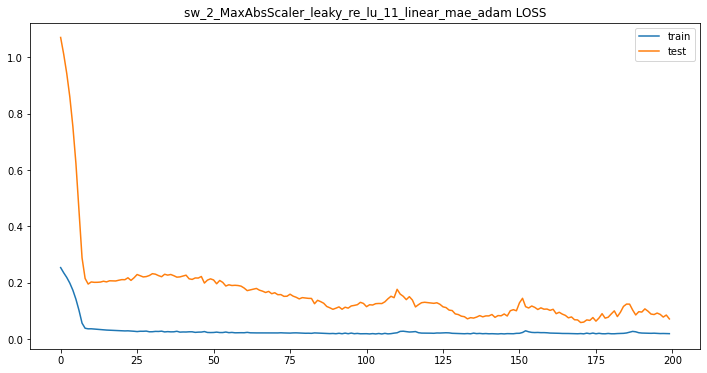


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adam 데이터 비교


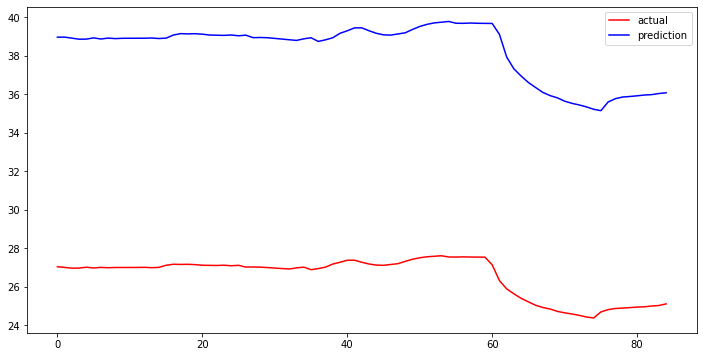

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adam metrics
mean_squared_error : 11.760732740553479
r2_score : -131.6964861920947
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_617"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_617 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_617 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.2502 - acc: 0.0000e+00 - val_loss: 1.0750 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2485 - acc: 0.0000e+00 - val

Epoch 66/200
32/32 - 0s - loss: 0.2206 - acc: 0.0000e+00 - val_loss: 0.9872 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.2203 - acc: 0.0000e+00 - val_loss: 0.9861 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.2201 - acc: 0.0000e+00 - val_loss: 0.9851 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.2198 - acc: 0.0000e+00 - val_loss: 0.9840 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.2195 - acc: 0.0000e+00 - val_loss: 0.9830 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.2192 - acc: 0.0000e+00 - val_loss: 0.9820 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.2189 - acc: 0.0000e+00 - val_loss: 0.9809 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.2186 - acc: 0.0000e+00 - val_loss: 0.9799 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.2184 - acc: 0.0000e+00 - val_loss: 0.9789 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.2181 - acc: 0.0000e+00 - val_loss: 0.9778 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.1988 - acc: 0.0000e+00 - val_loss: 0.9078 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.1986 - acc: 0.0000e+00 - val_loss: 0.9069 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.1983 - acc: 0.0000e+00 - val_loss: 0.9060 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.1981 - acc: 0.0000e+00 - val_loss: 0.9051 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.1978 - acc: 0.0000e+00 - val_loss: 0.9042 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.1976 - acc: 0.0000e+00 - val_loss: 0.9033 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.1973 - acc: 0.0000e+00 - val_loss: 0.9024 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1971 - acc: 0.0000e+00 - val_loss: 0.9015 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1968 - acc: 0.0000e+00 - val_loss: 0.9006 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1966 - acc: 0.0000e+00 - val_loss: 0.8997 - val_acc: 0.0000e+00
Epoch 160/

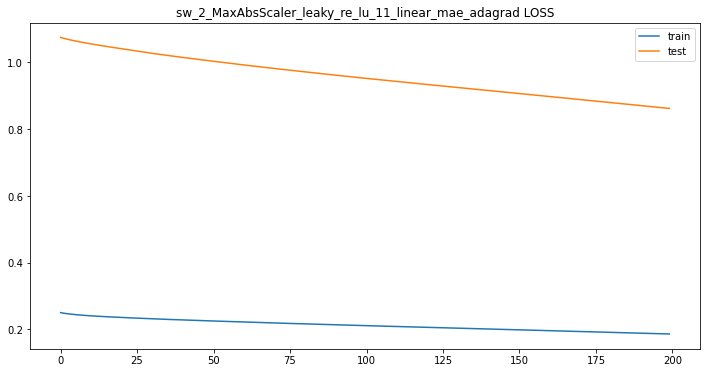


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adagrad 데이터 비교


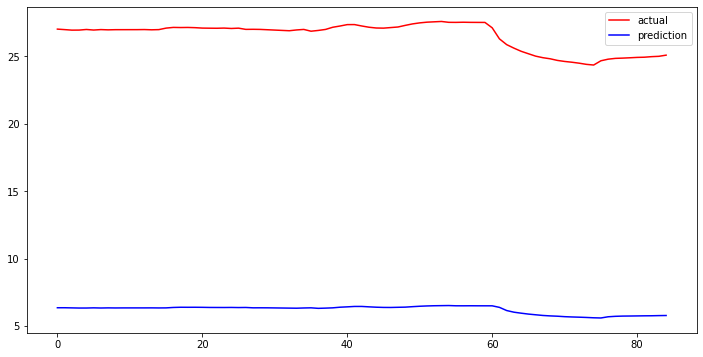

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adagrad metrics
mean_squared_error : 20.33482847292884
r2_score : -395.7087098978066
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_618"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_618 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_618 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.2518 - acc: 0.0000e+00 - val_loss: 1.0196 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2310 - acc: 0.0000e+

Epoch 66/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1324 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.1217 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0204 - acc: 0.0000e+00 - val_loss: 0.1244 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0203 - acc: 0.0000e+00 - val_loss: 0.1201 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0204 - acc: 0.0000e+00 - val_loss: 0.1142 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1582 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0204 - acc: 0.0000e+00 - val_loss: 0.1250 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0203 - acc: 0.0000e+00 - val_loss: 0.1409 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1613 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0206 - acc: 0.0000e+00 - val_loss: 0.1308 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

32/32 - 0s - loss: 0.0199 - acc: 0.0000e+00 - val_loss: 0.0633 - val_acc: 0.0000e+00
Epoch 150/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.0525 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0206 - acc: 0.0000e+00 - val_loss: 0.0509 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.0795 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0204 - acc: 0.0000e+00 - val_loss: 0.0483 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0197 - acc: 0.0000e+00 - val_loss: 0.0843 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0203 - acc: 0.0000e+00 - val_loss: 0.0560 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0200 - acc: 0.0000e+00 - val_loss: 0.0904 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.0741 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0205 - acc: 0.0000e+00 - val_loss: 0.0689 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s

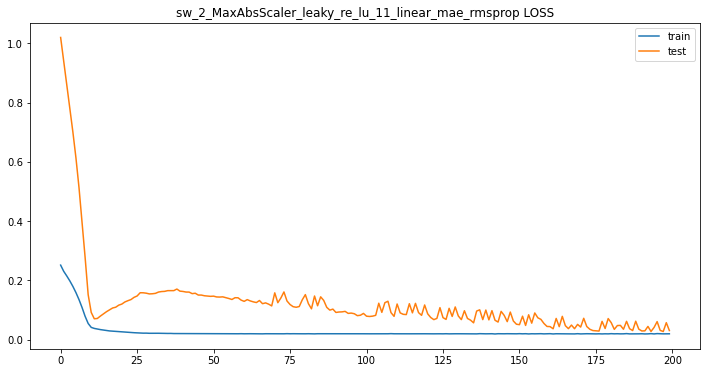


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_rmsprop 데이터 비교


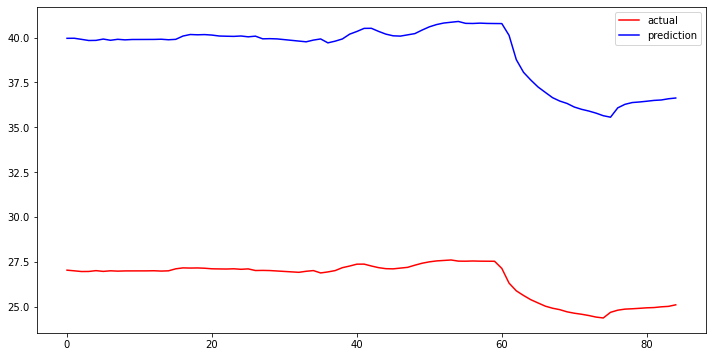

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_rmsprop metrics
mean_squared_error : 12.66363957691407
r2_score : -152.85364071090015
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_11
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_619"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_619 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_619 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.2491 - acc: 0.0000e+00 - val_loss: 1.0432 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2434 - acc

Epoch 66/200
32/32 - 0s - loss: 0.0265 - acc: 0.0000e+00 - val_loss: 0.1998 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0261 - acc: 0.0000e+00 - val_loss: 0.1945 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0257 - acc: 0.0000e+00 - val_loss: 0.1901 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0256 - acc: 0.0000e+00 - val_loss: 0.1845 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0254 - acc: 0.0000e+00 - val_loss: 0.1830 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0251 - acc: 0.0000e+00 - val_loss: 0.1780 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0249 - acc: 0.0000e+00 - val_loss: 0.1757 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0247 - acc: 0.0000e+00 - val_loss: 0.1748 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0244 - acc: 0.0000e+00 - val_loss: 0.1721 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0243 - acc: 0.0000e+00 - val_loss: 0.1703 - val_acc: 0.0000e+00
Epoch 76/200
32/32 -

Epoch 150/200
32/32 - 0s - loss: 0.0204 - acc: 0.0000e+00 - val_loss: 0.1515 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0203 - acc: 0.0000e+00 - val_loss: 0.1547 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0205 - acc: 0.0000e+00 - val_loss: 0.1528 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1518 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1516 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1509 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1518 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0202 - acc: 0.0000e+00 - val_loss: 0.1546 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0203 - acc: 0.0000e+00 - val_loss: 0.1517 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0201 - acc: 0.0000e+00 - val_loss: 0.1520 - val_acc: 0.0000e+00
Epoch 160/

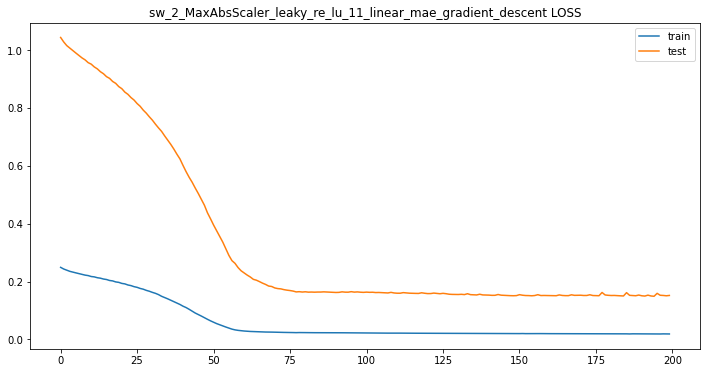


 sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_gradient_descent 데이터 비교


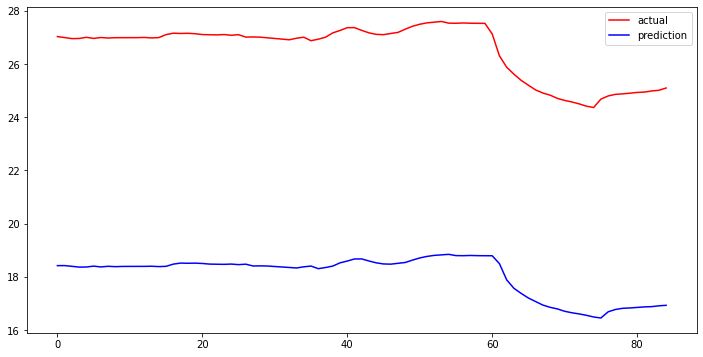

sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_gradient_descent metrics
mean_squared_error : 8.465480947694658
r2_score : -67.75336753113537
sw_2_MaxAbsScaler_leaky_re_lu_11_linear_mae_gradient_descent이 완료되었습니다.
train_X.shape : (469, 1, 2) 
train_y.shape : (469, 1) 
valid_X.shape :  (118, 1, 2) 
valid_y.shape : (118, 1) 
test_X.shape :  (85, 1, 2)
scaler_data가 완료되었습니다.

Scaler : RobustScaler
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_620"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_620 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_620 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
__________________

Epoch 63/200
32/32 - 0s - loss: 0.0154 - acc: 0.0021 - val_loss: 0.1035 - val_acc: 0.0000e+00
Epoch 64/200
32/32 - 0s - loss: 0.0167 - acc: 0.0021 - val_loss: 0.0538 - val_acc: 0.0000e+00
Epoch 65/200
32/32 - 0s - loss: 0.0149 - acc: 0.0021 - val_loss: 0.0372 - val_acc: 0.0000e+00
Epoch 66/200
32/32 - 0s - loss: 0.0159 - acc: 0.0021 - val_loss: 0.1007 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0164 - acc: 0.0021 - val_loss: 0.0496 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0154 - acc: 0.0021 - val_loss: 0.0400 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0160 - acc: 0.0021 - val_loss: 0.1025 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0158 - acc: 0.0021 - val_loss: 0.0357 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0157 - acc: 0.0021 - val_loss: 0.0932 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0150 - acc: 0.0021 - val_loss: 0.0396 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0155 - acc: 0.0021 - val_l

Epoch 150/200
32/32 - 0s - loss: 0.0163 - acc: 0.0021 - val_loss: 0.0141 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0160 - acc: 0.0021 - val_loss: 0.0096 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0145 - acc: 0.0021 - val_loss: 0.0104 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0166 - acc: 0.0021 - val_loss: 0.0229 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0151 - acc: 0.0021 - val_loss: 0.0503 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0148 - acc: 0.0021 - val_loss: 0.0134 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0184 - acc: 0.0021 - val_loss: 0.0234 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0180 - acc: 0.0021 - val_loss: 0.0438 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0151 - acc: 0.0021 - val_loss: 0.0269 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0217 - acc: 0.0021 - val_loss: 0.0242 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0163 - acc: 0.0

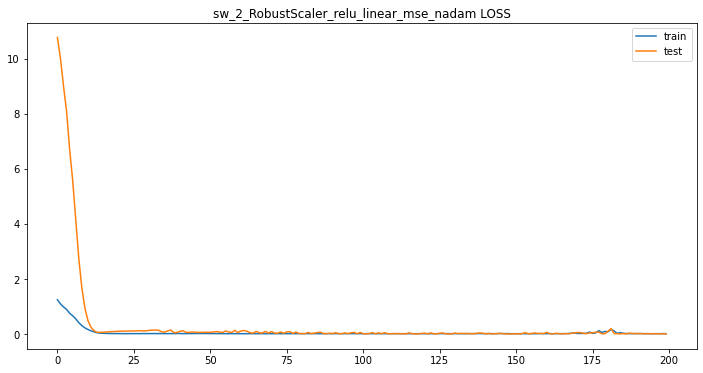


 sw_2_RobustScaler_relu_linear_mse_nadam 데이터 비교


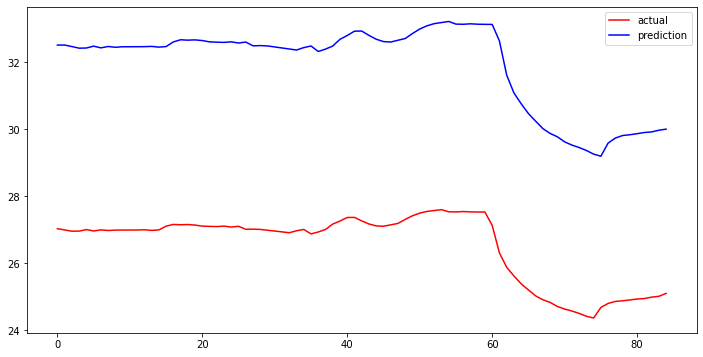

sw_2_RobustScaler_relu_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mse_nadam metrics
mean_squared_error : 5.397356424688115
r2_score : -26.948143299106874
sw_2_RobustScaler_relu_linear_mse_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_621"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_621 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_621 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 1.2669 - acc: 0.0021 - val_loss: 11.2521 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.2155 - acc: 0.0021 - val_loss: 11.0457 - val_acc: 0.0000e+00
Epoch 3/

Epoch 69/200
32/32 - 0s - loss: 0.0167 - acc: 0.0021 - val_loss: 0.0222 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0201 - acc: 0.0021 - val_loss: 0.0251 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0196 - acc: 0.0021 - val_loss: 0.0251 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0195 - acc: 0.0021 - val_loss: 0.0247 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0193 - acc: 0.0021 - val_loss: 0.0241 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0192 - acc: 0.0021 - val_loss: 0.0239 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0190 - acc: 0.0021 - val_loss: 0.0231 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0197 - acc: 0.0021 - val_loss: 0.0232 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0207 - acc: 0.0021 - val_loss: 0.0251 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0192 - acc: 0.0021 - val_loss: 0.0230 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0182 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0179 - acc: 0.0021 - val_loss: 0.0273 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0177 - acc: 0.0021 - val_loss: 0.0265 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0175 - acc: 0.0021 - val_loss: 0.0256 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0185 - acc: 0.0021 - val_loss: 0.0276 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0178 - acc: 0.0021 - val_loss: 0.0267 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0173 - acc: 0.0021 - val_loss: 0.0251 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0182 - acc: 0.0021 - val_loss: 0.0273 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0181 - acc: 0.0021 - val_loss: 0.0272 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0179 - acc: 0.0021 - val_loss: 0.0266 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0174 - acc: 0.0021 - val_loss: 0.0250 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0182 - acc: 0.0

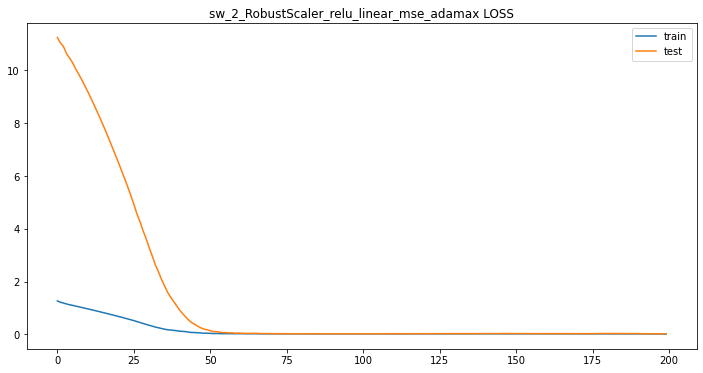


 sw_2_RobustScaler_relu_linear_mse_adamax 데이터 비교


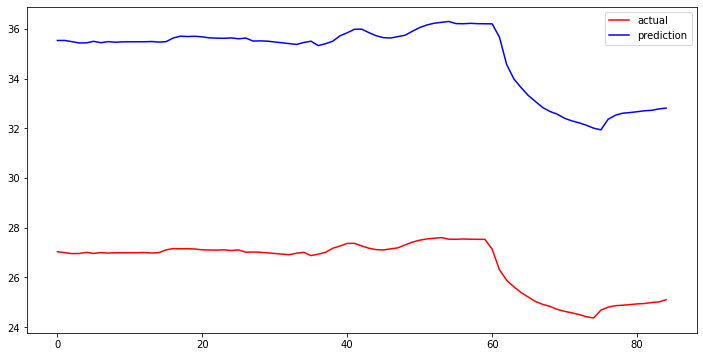

sw_2_RobustScaler_relu_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mse_adamax metrics
mean_squared_error : 8.366398279918466
r2_score : -66.1533657688067
sw_2_RobustScaler_relu_linear_mse_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_622"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_622 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_622 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 1.3308 - acc: 0.0021 - val_loss: 10.4418 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.0719 - acc: 0.0021 - val_loss: 9.5260 - val_acc: 0.0000e+00
Epoch 3/20

Epoch 69/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0793 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0136 - acc: 0.0021 - val_loss: 0.0418 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0259 - acc: 0.0021 - val_loss: 0.0521 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0174 - acc: 0.0021 - val_loss: 0.0534 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0144 - acc: 0.0021 - val_loss: 0.0472 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0149 - acc: 0.0021 - val_loss: 0.0575 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0160 - acc: 0.0021 - val_loss: 0.0626 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0189 - acc: 0.0021 - val_loss: 0.0578 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0199 - acc: 0.0021 - val_loss: 0.0747 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0164 - acc: 0.0021 - val_loss: 0.0425 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0201 - acc: 0.0021 - val_loss: 0.0499 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0157 - acc: 0.0021 - val_loss: 0.0379 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0151 - acc: 0.0021 - val_loss: 0.0436 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0136 - acc: 0.0021 - val_loss: 0.0307 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0195 - acc: 0.0021 - val_loss: 0.0395 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0218 - acc: 0.0021 - val_loss: 0.0449 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0146 - acc: 0.0021 - val_loss: 0.0271 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0198 - acc: 0.0021 - val_loss: 0.0370 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0157 - acc: 0.0021 - val_loss: 0.0314 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0167 - acc: 0.0021 - val_loss: 0.0236 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0237 - acc: 0.0

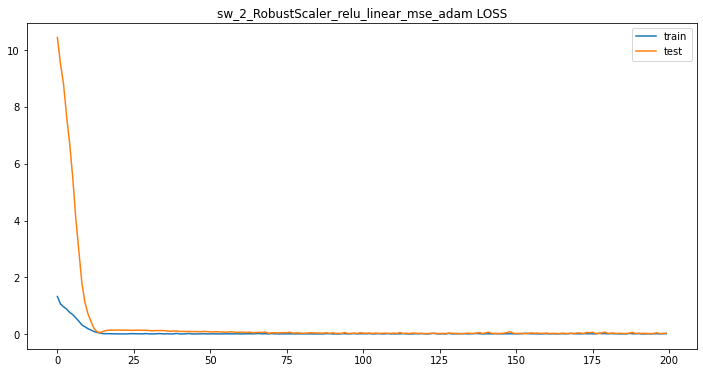


 sw_2_RobustScaler_relu_linear_mse_adam 데이터 비교


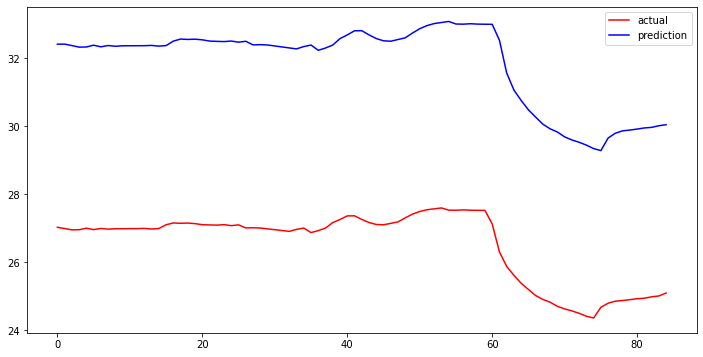

sw_2_RobustScaler_relu_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mse_adam metrics
mean_squared_error : 5.328989624391299
r2_score : -26.244604017526342
sw_2_RobustScaler_relu_linear_mse_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_623"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_623 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_623 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 1.3581 - acc: 0.0021 - val_loss: 10.6037 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.2247 - acc: 0.0021 - val_loss: 10.6627 - val_acc: 0.0000e+00
Epoch 3/2

Epoch 69/200
32/32 - 0s - loss: 0.9303 - acc: 0.0021 - val_loss: 9.3435 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.9282 - acc: 0.0021 - val_loss: 9.3261 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.9262 - acc: 0.0021 - val_loss: 9.3087 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.9241 - acc: 0.0021 - val_loss: 9.2915 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.9220 - acc: 0.0021 - val_loss: 9.2743 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.9200 - acc: 0.0021 - val_loss: 9.2573 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.9180 - acc: 0.0021 - val_loss: 9.2402 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.9160 - acc: 0.0021 - val_loss: 9.2233 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.9139 - acc: 0.0021 - val_loss: 9.2065 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.9119 - acc: 0.0021 - val_loss: 9.1897 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.9100 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.7739 - acc: 0.0021 - val_loss: 8.0220 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.7724 - acc: 0.0021 - val_loss: 8.0086 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.7710 - acc: 0.0021 - val_loss: 7.9952 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.7695 - acc: 0.0021 - val_loss: 7.9818 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.7681 - acc: 0.0021 - val_loss: 7.9684 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.7666 - acc: 0.0021 - val_loss: 7.9550 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.7652 - acc: 0.0021 - val_loss: 7.9417 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.7638 - acc: 0.0021 - val_loss: 7.9284 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.7623 - acc: 0.0021 - val_loss: 7.9152 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.7609 - acc: 0.0021 - val_loss: 7.9019 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.7595 - acc: 0.0

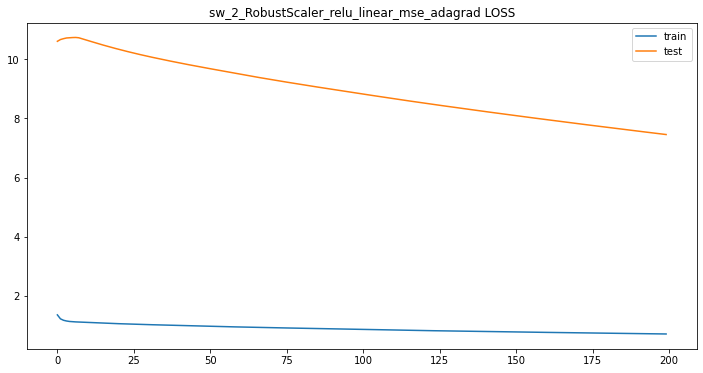


 sw_2_RobustScaler_relu_linear_mse_adagrad 데이터 비교


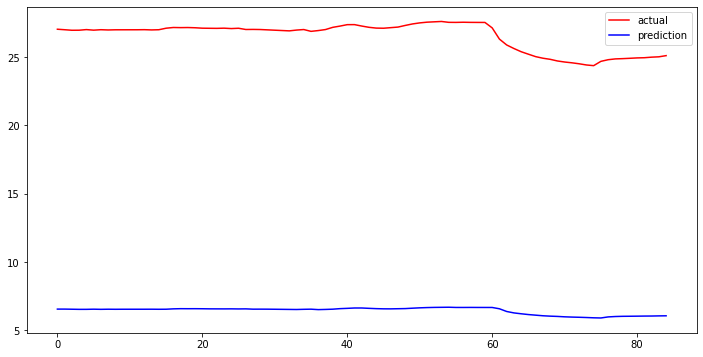

sw_2_RobustScaler_relu_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mse_adagrad metrics
mean_squared_error : 20.117685825138647
r2_score : -387.2815688892408
sw_2_RobustScaler_relu_linear_mse_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_624"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_624 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_624 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 1.1989 - acc: 0.0021 - val_loss: 9.8677 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.0468 - acc: 0.0021 - val_loss: 9.3799 - val_acc: 0.0000e+00
Epo

Epoch 69/200
32/32 - 0s - loss: 0.0378 - acc: 0.0021 - val_loss: 0.0889 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0521 - acc: 0.0021 - val_loss: 0.0725 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0634 - acc: 0.0021 - val_loss: 0.0738 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0526 - acc: 0.0021 - val_loss: 0.0875 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0347 - acc: 0.0021 - val_loss: 0.0863 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0295 - acc: 0.0021 - val_loss: 0.0462 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0352 - acc: 0.0021 - val_loss: 0.0771 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0316 - acc: 0.0021 - val_loss: 0.0651 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0279 - acc: 0.0021 - val_loss: 0.0397 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0283 - acc: 0.0021 - val_loss: 0.0352 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0289 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0197 - acc: 0.0021 - val_loss: 0.0775 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0200 - acc: 0.0021 - val_loss: 0.0818 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0206 - acc: 0.0021 - val_loss: 0.0863 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0214 - acc: 0.0021 - val_loss: 0.0920 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0204 - acc: 0.0021 - val_loss: 0.0999 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0198 - acc: 0.0021 - val_loss: 0.1058 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.1021 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0234 - acc: 0.0021 - val_loss: 0.1042 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0214 - acc: 0.0021 - val_loss: 0.1194 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0257 - acc: 0.0021 - val_loss: 0.1139 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0222 - acc: 0.0

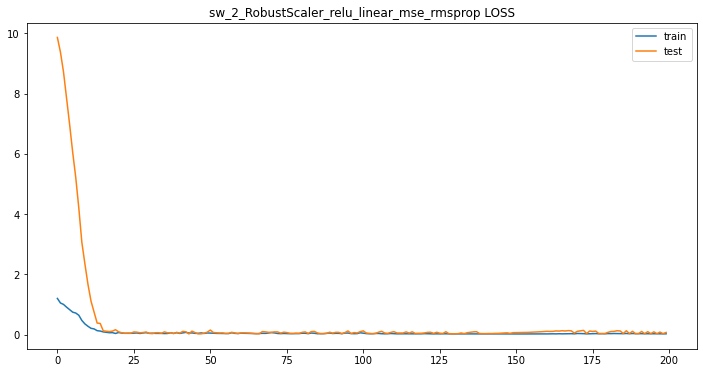


 sw_2_RobustScaler_relu_linear_mse_rmsprop 데이터 비교


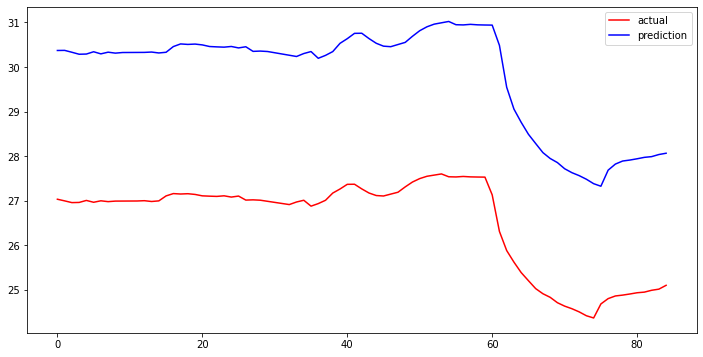

sw_2_RobustScaler_relu_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mse_rmsprop metrics
mean_squared_error : 3.3021754463577238
r2_score : -9.461430199843784
sw_2_RobustScaler_relu_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_625"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_625 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_625 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 1.2016 - acc: 0.0021 - val_loss: 10.7497 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.1434 - acc: 0.0021 - val_loss: 10.5071 - val_acc: 0.0

Epoch 69/200
32/32 - 0s - loss: 0.1009 - acc: 0.0021 - val_loss: 0.3580 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0541 - acc: 0.0021 - val_loss: 0.2303 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0974 - acc: 0.0021 - val_loss: 0.3583 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0594 - acc: 0.0021 - val_loss: 0.2419 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0720 - acc: 0.0021 - val_loss: 0.3293 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0688 - acc: 0.0021 - val_loss: 0.2835 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0664 - acc: 0.0021 - val_loss: 0.2338 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0719 - acc: 0.0021 - val_loss: 0.2742 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0856 - acc: 0.0021 - val_loss: 0.2234 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0675 - acc: 0.0021 - val_loss: 0.3650 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0806 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0947 - acc: 0.0021 - val_loss: 0.1749 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0763 - acc: 0.0021 - val_loss: 0.1795 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0849 - acc: 0.0021 - val_loss: 0.1726 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0568 - acc: 0.0021 - val_loss: 0.2505 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0579 - acc: 0.0021 - val_loss: 0.2392 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0579 - acc: 0.0021 - val_loss: 0.2176 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0501 - acc: 0.0021 - val_loss: 0.3050 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0498 - acc: 0.0021 - val_loss: 0.2606 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0573 - acc: 0.0021 - val_loss: 0.2557 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0563 - acc: 0.0021 - val_loss: 0.1659 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0628 - acc: 0.0

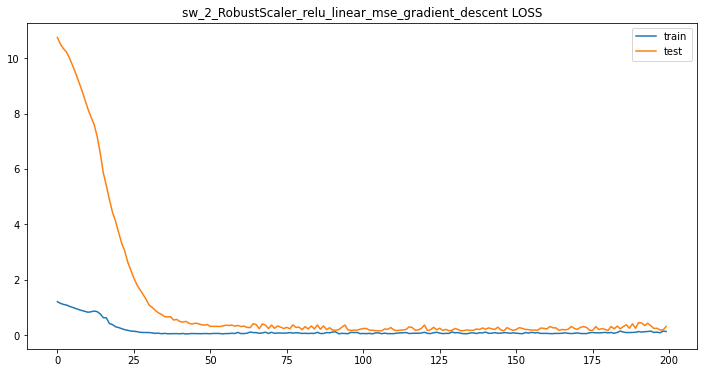


 sw_2_RobustScaler_relu_linear_mse_gradient_descent 데이터 비교


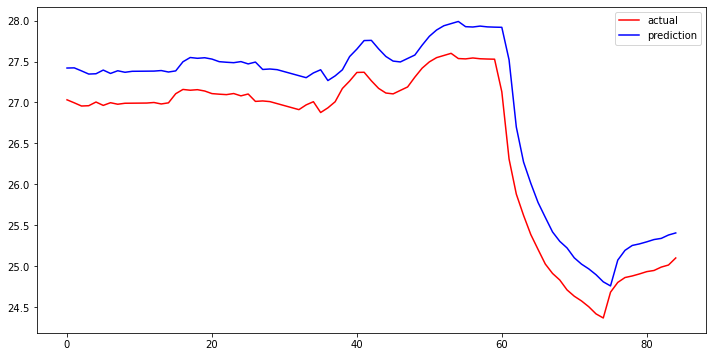

sw_2_RobustScaler_relu_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mse_gradient_descent metrics
mean_squared_error : 0.43458971987475625
r2_score : 0.8188035595670374
sw_2_RobustScaler_relu_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_626"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_626 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_626 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.8307 - acc: 0.0021 - val_loss: 3.1487 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7888 - acc: 0.0021 - val_loss: 2.971

Epoch 69/200
32/32 - 0s - loss: 0.0754 - acc: 0.0021 - val_loss: 0.2265 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0730 - acc: 0.0021 - val_loss: 0.2199 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0721 - acc: 0.0021 - val_loss: 0.2081 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0703 - acc: 0.0021 - val_loss: 0.2083 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0743 - acc: 0.0021 - val_loss: 0.2220 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0712 - acc: 0.0021 - val_loss: 0.2108 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0704 - acc: 0.0021 - val_loss: 0.2094 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0726 - acc: 0.0021 - val_loss: 0.1926 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0700 - acc: 0.0021 - val_loss: 0.2036 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0693 - acc: 0.0021 - val_loss: 0.2034 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0685 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0767 - acc: 0.0021 - val_loss: 0.2381 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0765 - acc: 0.0021 - val_loss: 0.2372 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0786 - acc: 0.0021 - val_loss: 0.2314 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0828 - acc: 0.0021 - val_loss: 0.2496 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0784 - acc: 0.0021 - val_loss: 0.2226 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0764 - acc: 0.0021 - val_loss: 0.2312 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0800 - acc: 0.0021 - val_loss: 0.2272 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0801 - acc: 0.0021 - val_loss: 0.2403 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0813 - acc: 0.0021 - val_loss: 0.2160 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0734 - acc: 0.0021 - val_loss: 0.2083 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0735 - acc: 0.0

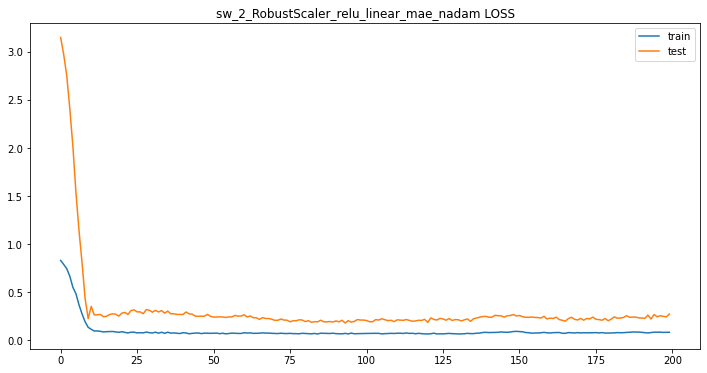


 sw_2_RobustScaler_relu_linear_mae_nadam 데이터 비교


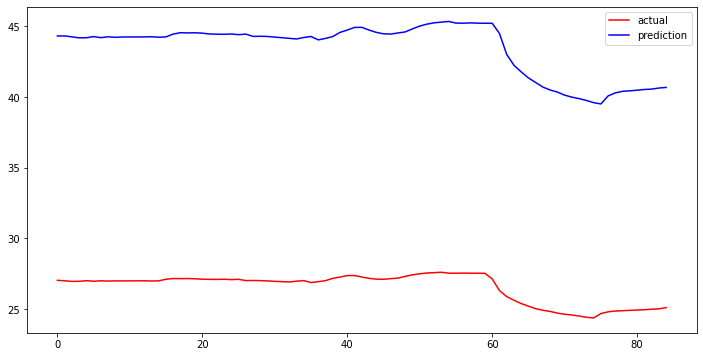

sw_2_RobustScaler_relu_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mae_nadam metrics
mean_squared_error : 16.954853922496742
r2_score : -274.79024213059756
sw_2_RobustScaler_relu_linear_mae_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_627"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_627 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_627 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.9549 - acc: 0.0021 - val_loss: 3.4607 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8346 - acc: 0.0021 - val_loss: 3.3062 - val_acc: 0.0000e+00
Epoch 3/2

Epoch 69/200
32/32 - 0s - loss: 0.0930 - acc: 0.0021 - val_loss: 0.1972 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0974 - acc: 0.0021 - val_loss: 0.2095 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0881 - acc: 0.0021 - val_loss: 0.2015 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0977 - acc: 0.0021 - val_loss: 0.2075 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0903 - acc: 0.0021 - val_loss: 0.2103 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0901 - acc: 0.0021 - val_loss: 0.2231 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0927 - acc: 0.0021 - val_loss: 0.2049 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0837 - acc: 0.0021 - val_loss: 0.1906 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0878 - acc: 0.0021 - val_loss: 0.1988 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0850 - acc: 0.0021 - val_loss: 0.1877 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0856 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0643 - acc: 0.0021 - val_loss: 0.1390 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0628 - acc: 0.0021 - val_loss: 0.1252 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0688 - acc: 0.0021 - val_loss: 0.1239 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0629 - acc: 0.0021 - val_loss: 0.1284 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0630 - acc: 0.0021 - val_loss: 0.1283 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0684 - acc: 0.0021 - val_loss: 0.1109 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0641 - acc: 0.0021 - val_loss: 0.1365 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0633 - acc: 0.0021 - val_loss: 0.1303 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0618 - acc: 0.0021 - val_loss: 0.1235 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0619 - acc: 0.0021 - val_loss: 0.1231 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0737 - acc: 0.0

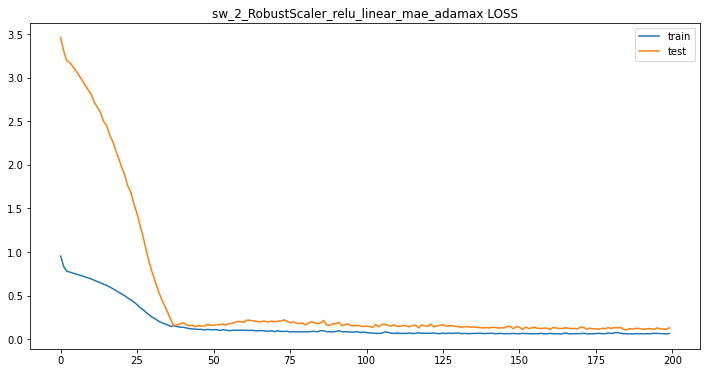


 sw_2_RobustScaler_relu_linear_mae_adamax 데이터 비교


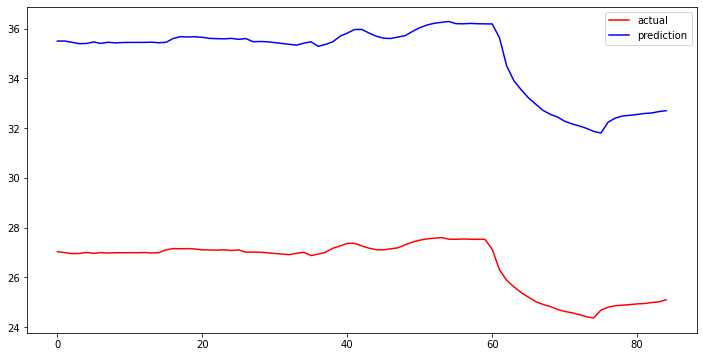

sw_2_RobustScaler_relu_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mae_adamax metrics
mean_squared_error : 8.322969426133882
r2_score : -65.45802171114153
sw_2_RobustScaler_relu_linear_mae_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_628"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_628 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_628 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.8135 - acc: 0.0021 - val_loss: 3.2474 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7701 - acc: 0.0021 - val_loss: 3.1309 - val_acc: 0.0000e+00
Epoch 3/20

Epoch 69/200
32/32 - 0s - loss: 0.1004 - acc: 0.0021 - val_loss: 0.3464 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0832 - acc: 0.0021 - val_loss: 0.3635 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0900 - acc: 0.0021 - val_loss: 0.3642 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0887 - acc: 0.0021 - val_loss: 0.3634 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0880 - acc: 0.0021 - val_loss: 0.3825 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0893 - acc: 0.0021 - val_loss: 0.3622 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0891 - acc: 0.0021 - val_loss: 0.3592 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0908 - acc: 0.0021 - val_loss: 0.3820 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0902 - acc: 0.0021 - val_loss: 0.3470 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0892 - acc: 0.0021 - val_loss: 0.3894 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0866 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0801 - acc: 0.0021 - val_loss: 0.3137 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0783 - acc: 0.0021 - val_loss: 0.2650 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0779 - acc: 0.0021 - val_loss: 0.2837 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0797 - acc: 0.0021 - val_loss: 0.2892 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0760 - acc: 0.0021 - val_loss: 0.2693 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0886 - acc: 0.0021 - val_loss: 0.3274 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0820 - acc: 0.0021 - val_loss: 0.2770 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0822 - acc: 0.0021 - val_loss: 0.2928 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0866 - acc: 0.0021 - val_loss: 0.3034 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0786 - acc: 0.0021 - val_loss: 0.2557 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0812 - acc: 0.0

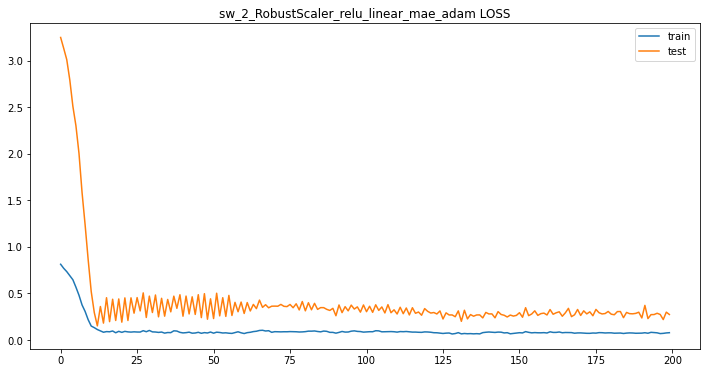


 sw_2_RobustScaler_relu_linear_mae_adam 데이터 비교


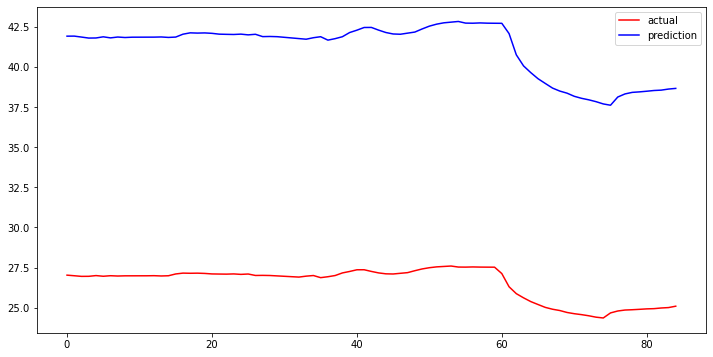

sw_2_RobustScaler_relu_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mae_adam metrics
mean_squared_error : 14.627813084990322
r2_score : -204.28135701102886
sw_2_RobustScaler_relu_linear_mae_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_629"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_629 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_629 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.9329 - acc: 0.0021 - val_loss: 3.1872 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8490 - acc: 0.0021 - val_loss: 3.2369 - val_acc: 0.0000e+00
Epoch 3/200

Epoch 69/200
32/32 - 0s - loss: 0.7302 - acc: 0.0021 - val_loss: 3.1251 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.7296 - acc: 0.0021 - val_loss: 3.1230 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.7289 - acc: 0.0021 - val_loss: 3.1210 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.7283 - acc: 0.0021 - val_loss: 3.1189 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.7275 - acc: 0.0021 - val_loss: 3.1164 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.7269 - acc: 0.0021 - val_loss: 3.1144 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.7263 - acc: 0.0021 - val_loss: 3.1124 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.7255 - acc: 0.0021 - val_loss: 3.1099 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.7250 - acc: 0.0021 - val_loss: 3.1079 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.7244 - acc: 0.0021 - val_loss: 3.1060 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.7238 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.6806 - acc: 0.0021 - val_loss: 2.9514 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.6800 - acc: 0.0021 - val_loss: 2.9492 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.6795 - acc: 0.0021 - val_loss: 2.9474 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.6791 - acc: 0.0021 - val_loss: 2.9455 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.6784 - acc: 0.0021 - val_loss: 2.9433 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.6780 - acc: 0.0021 - val_loss: 2.9415 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.6775 - acc: 0.0021 - val_loss: 2.9397 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.6769 - acc: 0.0021 - val_loss: 2.9375 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.6764 - acc: 0.0021 - val_loss: 2.9356 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.6759 - acc: 0.0021 - val_loss: 2.9338 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.6754 - acc: 0.0

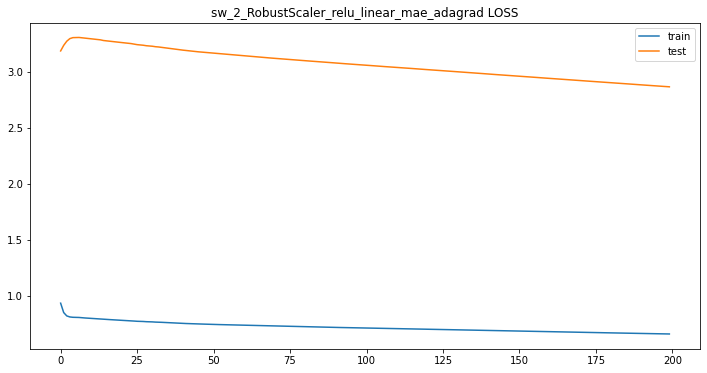


 sw_2_RobustScaler_relu_linear_mae_adagrad 데이터 비교


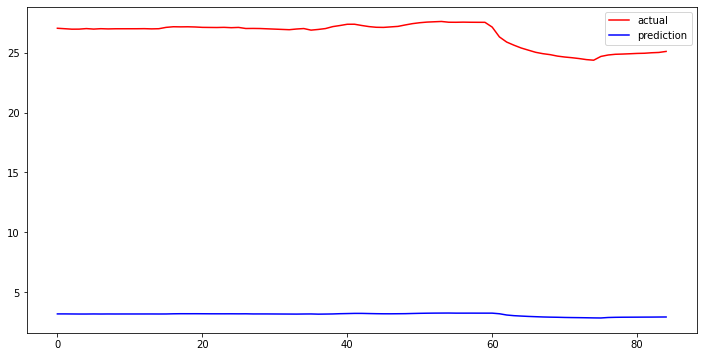

sw_2_RobustScaler_relu_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mae_adagrad metrics
mean_squared_error : 23.426513049787733
r2_score : -525.509249087936
sw_2_RobustScaler_relu_linear_mae_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_630"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_630 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_630 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.7598 - acc: 0.0021 - val_loss: 3.1451 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7157 - acc: 0.0021 - val_loss: 2.9860 - val_acc: 0.0000e+00
Epoc

Epoch 69/200
32/32 - 0s - loss: 0.0793 - acc: 0.0021 - val_loss: 0.1330 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0765 - acc: 0.0021 - val_loss: 0.1183 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0795 - acc: 0.0021 - val_loss: 0.1474 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0736 - acc: 0.0021 - val_loss: 0.1175 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0791 - acc: 0.0021 - val_loss: 0.1512 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0793 - acc: 0.0021 - val_loss: 0.1404 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0789 - acc: 0.0021 - val_loss: 0.1540 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0785 - acc: 0.0021 - val_loss: 0.1626 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0784 - acc: 0.0021 - val_loss: 0.1686 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0696 - acc: 0.0021 - val_loss: 0.1388 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0782 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0856 - acc: 0.0021 - val_loss: 0.2223 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0756 - acc: 0.0021 - val_loss: 0.2011 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0753 - acc: 0.0021 - val_loss: 0.2168 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0718 - acc: 0.0021 - val_loss: 0.1950 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0910 - acc: 0.0021 - val_loss: 0.2007 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0721 - acc: 0.0021 - val_loss: 0.1887 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0803 - acc: 0.0021 - val_loss: 0.1839 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0803 - acc: 0.0021 - val_loss: 0.1847 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0866 - acc: 0.0021 - val_loss: 0.2299 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0750 - acc: 0.0021 - val_loss: 0.1730 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0813 - acc: 0.0

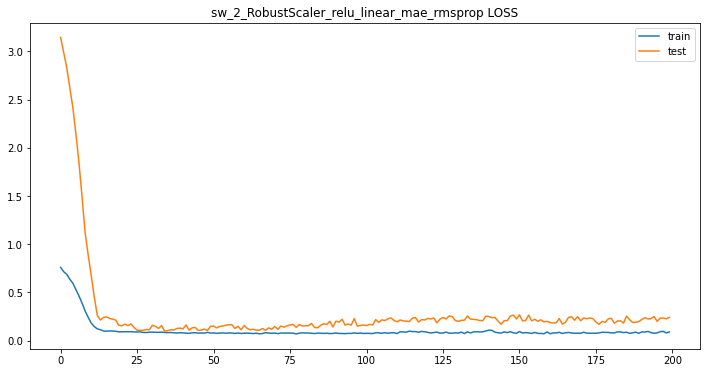


 sw_2_RobustScaler_relu_linear_mae_rmsprop 데이터 비교


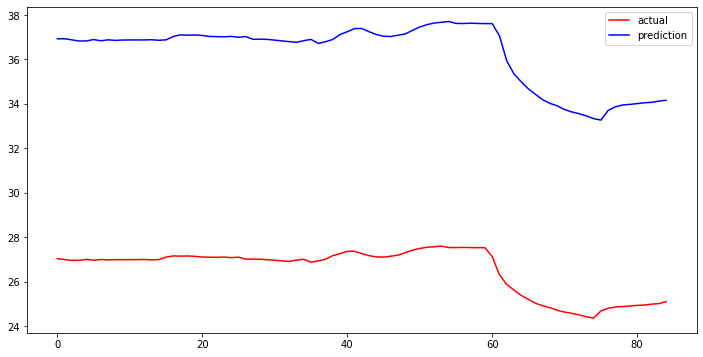

sw_2_RobustScaler_relu_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mae_rmsprop metrics
mean_squared_error : 9.755152978992932
r2_score : -90.2975103783586
sw_2_RobustScaler_relu_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_631"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_631 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_631 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.8544 - acc: 0.0021 - val_loss: 3.3297 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8126 - acc: 0.0021 - val_loss: 3.2708 - val_acc: 0.0000e

Epoch 69/200
32/32 - 0s - loss: 0.1259 - acc: 0.0021 - val_loss: 0.3468 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.1443 - acc: 0.0021 - val_loss: 0.2781 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.1162 - acc: 0.0021 - val_loss: 0.3359 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.1450 - acc: 0.0021 - val_loss: 0.2811 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.1137 - acc: 0.0021 - val_loss: 0.3167 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.1375 - acc: 0.0021 - val_loss: 0.3013 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.1361 - acc: 0.0021 - val_loss: 0.2522 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.1234 - acc: 0.0021 - val_loss: 0.3223 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.1419 - acc: 0.0021 - val_loss: 0.3350 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.1206 - acc: 0.0021 - val_loss: 0.3301 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.1444 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.1100 - acc: 0.0021 - val_loss: 0.2022 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1217 - acc: 0.0021 - val_loss: 0.2933 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1140 - acc: 0.0021 - val_loss: 0.2085 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1145 - acc: 0.0021 - val_loss: 0.2711 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.1438 - acc: 0.0021 - val_loss: 0.2171 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.1135 - acc: 0.0021 - val_loss: 0.2620 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.1200 - acc: 0.0021 - val_loss: 0.2073 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.1171 - acc: 0.0021 - val_loss: 0.2978 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.1156 - acc: 0.0021 - val_loss: 0.3111 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.1206 - acc: 0.0021 - val_loss: 0.2155 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.1168 - acc: 0.0

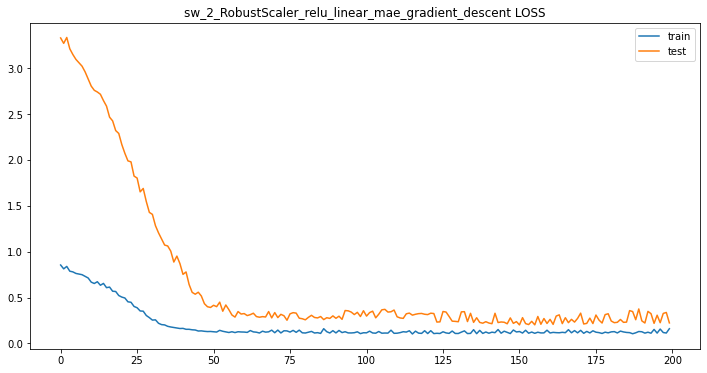


 sw_2_RobustScaler_relu_linear_mae_gradient_descent 데이터 비교


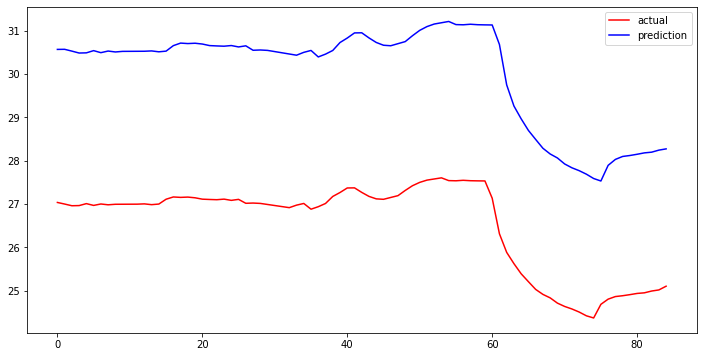

sw_2_RobustScaler_relu_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_RobustScaler_relu_linear_mae_gradient_descent metrics
mean_squared_error : 3.4960794288725534
r2_score : -10.726093026407861
sw_2_RobustScaler_relu_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_632"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_632 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_632 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 1.1297 - acc: 0.0021 - val_loss: 9.6865 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.0535 - acc: 0.0021 - val_loss:

Epoch 69/200
32/32 - 0s - loss: 0.0180 - acc: 0.0021 - val_loss: 0.0410 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0167 - acc: 0.0021 - val_loss: 0.0152 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0184 - acc: 0.0021 - val_loss: 0.0429 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0158 - acc: 0.0021 - val_loss: 0.0124 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0177 - acc: 0.0021 - val_loss: 0.0129 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0198 - acc: 0.0021 - val_loss: 0.0324 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0199 - acc: 0.0021 - val_loss: 0.0434 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0174 - acc: 0.0021 - val_loss: 0.0104 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0185 - acc: 0.0021 - val_loss: 0.0106 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0179 - acc: 0.0021 - val_loss: 0.0124 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0179 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0140 - acc: 0.0021 - val_loss: 0.0139 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0177 - acc: 0.0021 - val_loss: 0.0123 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0181 - acc: 0.0021 - val_loss: 0.0388 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0163 - acc: 0.0021 - val_loss: 0.0154 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0150 - acc: 0.0021 - val_loss: 0.0058 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0135 - acc: 0.0021 - val_loss: 0.0314 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0157 - acc: 0.0021 - val_loss: 0.0262 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0199 - acc: 0.0021 - val_loss: 0.0121 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0188 - acc: 0.0021 - val_loss: 0.0149 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0157 - acc: 0.0021 - val_loss: 0.0331 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0181 - acc: 0.0

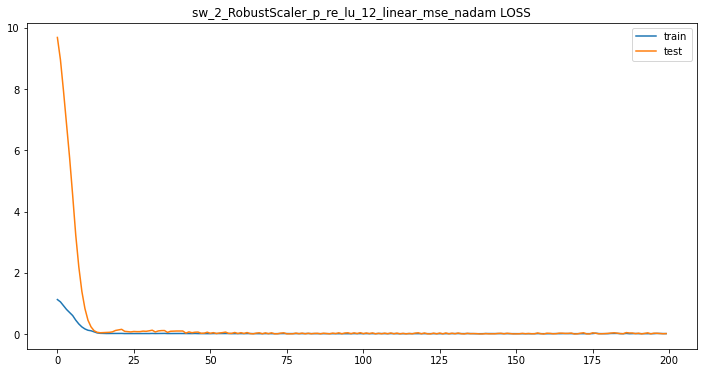


 sw_2_RobustScaler_p_re_lu_12_linear_mse_nadam 데이터 비교


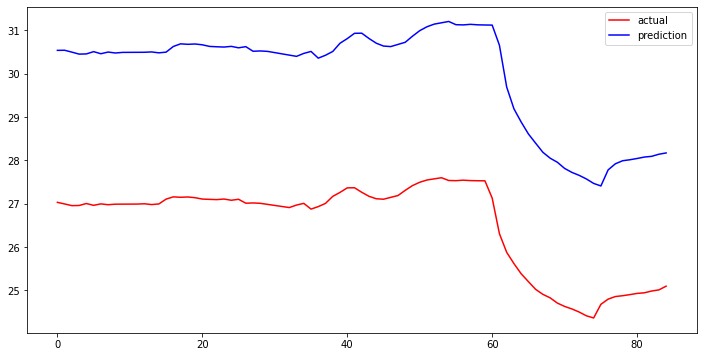

sw_2_RobustScaler_p_re_lu_12_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mse_nadam metrics
mean_squared_error : 3.4545659299636085
r2_score : -10.449267627514674
sw_2_RobustScaler_p_re_lu_12_linear_mse_nadam이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_633"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_633 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_633 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 1.2694 - acc: 0.0021 - val_loss: 11.6141 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.1543 - acc: 0.0021 - val_loss: 11.5778 - val

Epoch 69/200
32/32 - 0s - loss: 0.0179 - acc: 0.0021 - val_loss: 0.1099 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0178 - acc: 0.0021 - val_loss: 0.0969 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0163 - acc: 0.0021 - val_loss: 0.0798 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0164 - acc: 0.0021 - val_loss: 0.0691 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0160 - acc: 0.0021 - val_loss: 0.0597 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0159 - acc: 0.0021 - val_loss: 0.0530 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0160 - acc: 0.0021 - val_loss: 0.0480 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0158 - acc: 0.0021 - val_loss: 0.0437 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0156 - acc: 0.0021 - val_loss: 0.0400 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0152 - acc: 0.0021 - val_loss: 0.0365 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0136 - acc: 0.0021 - val_loss: 0.0316 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0128 - acc: 0.0021 - val_loss: 0.0291 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0151 - acc: 0.0021 - val_loss: 0.0288 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0175 - acc: 0.0021 - val_loss: 0.0380 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0145 - acc: 0.0021 - val_loss: 0.0353 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0130 - acc: 0.0021 - val_loss: 0.0286 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0121 - acc: 0.0021 - val_loss: 0.0273 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0173 - acc: 0.0021 - val_loss: 0.0272 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0198 - acc: 0.0021 - val_loss: 0.0364 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0150 - acc: 0.0021 - val_loss: 0.0354 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0134 - acc: 0.0

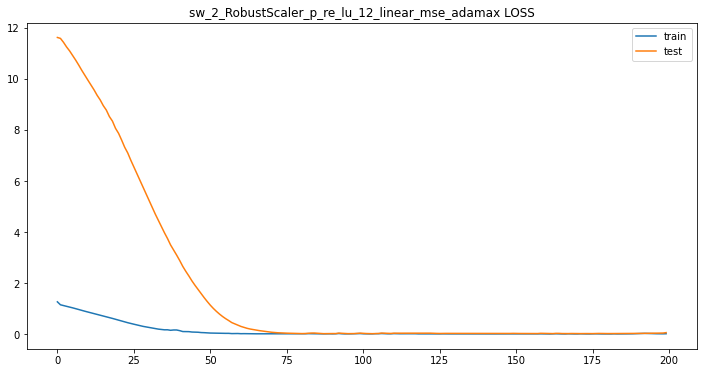


 sw_2_RobustScaler_p_re_lu_12_linear_mse_adamax 데이터 비교


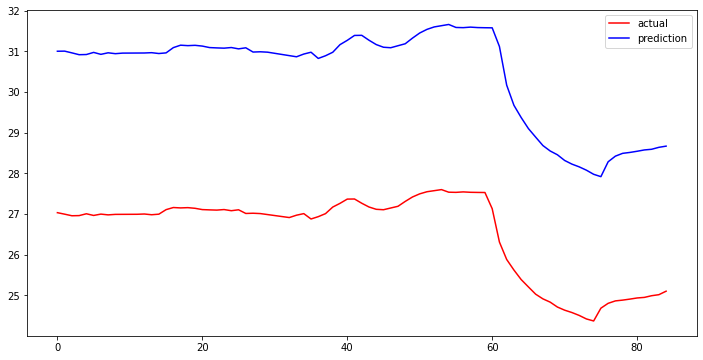

sw_2_RobustScaler_p_re_lu_12_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mse_adamax metrics
mean_squared_error : 3.9293999083226905
r2_score : -13.813008148707649
sw_2_RobustScaler_p_re_lu_12_linear_mse_adamax이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_634"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_634 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_634 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 1.1643 - acc: 0.0021 - val_loss: 10.0544 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.0367 - acc: 0.0021 - val_loss: 9.3209 - va

Epoch 69/200
32/32 - 0s - loss: 0.0200 - acc: 0.0021 - val_loss: 0.0658 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0682 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0295 - acc: 0.0021 - val_loss: 0.0749 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0303 - acc: 0.0021 - val_loss: 0.0846 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0305 - acc: 0.0021 - val_loss: 0.0959 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0265 - acc: 0.0021 - val_loss: 0.0778 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0267 - acc: 0.0021 - val_loss: 0.0728 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0251 - acc: 0.0021 - val_loss: 0.0733 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0599 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0213 - acc: 0.0021 - val_loss: 0.0574 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0205 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0223 - acc: 0.0021 - val_loss: 0.0487 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0227 - acc: 0.0021 - val_loss: 0.0490 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0227 - acc: 0.0021 - val_loss: 0.0492 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0227 - acc: 0.0021 - val_loss: 0.0487 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0481 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0231 - acc: 0.0021 - val_loss: 0.0476 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0496 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0231 - acc: 0.0021 - val_loss: 0.0471 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0509 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0474 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0233 - acc: 0.0

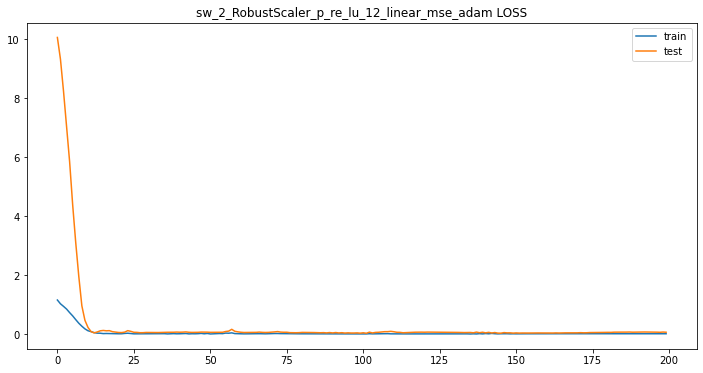


 sw_2_RobustScaler_p_re_lu_12_linear_mse_adam 데이터 비교


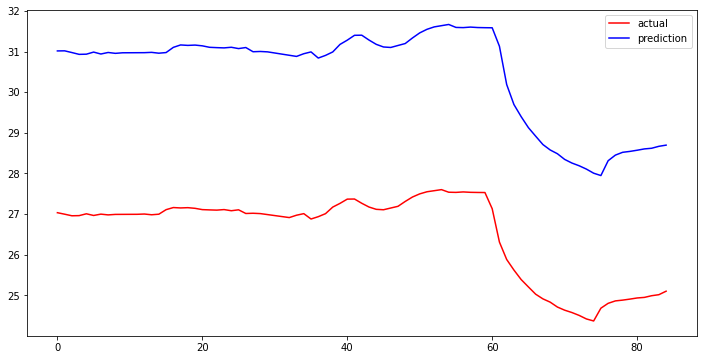

sw_2_RobustScaler_p_re_lu_12_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mse_adam metrics
mean_squared_error : 3.941356042366352
r2_score : -13.9032864584241
sw_2_RobustScaler_p_re_lu_12_linear_mse_adam이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_635"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_635 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_635 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 3.8662 - acc: 0.0021 - val_loss: 16.1635 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 2.9629 - acc: 0.0021 - val_loss: 14.9777 - val_acc

Epoch 68/200
32/32 - 0s - loss: 0.9240 - acc: 0.0021 - val_loss: 9.7854 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.9216 - acc: 0.0021 - val_loss: 9.7667 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.9192 - acc: 0.0021 - val_loss: 9.7484 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.9169 - acc: 0.0021 - val_loss: 9.7302 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.9146 - acc: 0.0021 - val_loss: 9.7125 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.9123 - acc: 0.0021 - val_loss: 9.6951 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.9101 - acc: 0.0021 - val_loss: 9.6781 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.9079 - acc: 0.0021 - val_loss: 9.6614 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.9057 - acc: 0.0021 - val_loss: 9.6449 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.9035 - acc: 0.0021 - val_loss: 9.6285 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.9013 - acc: 0.0021 - val_l

Epoch 155/200
32/32 - 0s - loss: 0.7605 - acc: 0.0021 - val_loss: 8.5404 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.7589 - acc: 0.0021 - val_loss: 8.5280 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.7573 - acc: 0.0021 - val_loss: 8.5157 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.7557 - acc: 0.0021 - val_loss: 8.5033 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.7541 - acc: 0.0021 - val_loss: 8.4910 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.7525 - acc: 0.0021 - val_loss: 8.4788 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.7509 - acc: 0.0021 - val_loss: 8.4665 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.7493 - acc: 0.0021 - val_loss: 8.4543 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.7478 - acc: 0.0021 - val_loss: 8.4422 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.7462 - acc: 0.0021 - val_loss: 8.4300 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.7446 - acc: 0.0

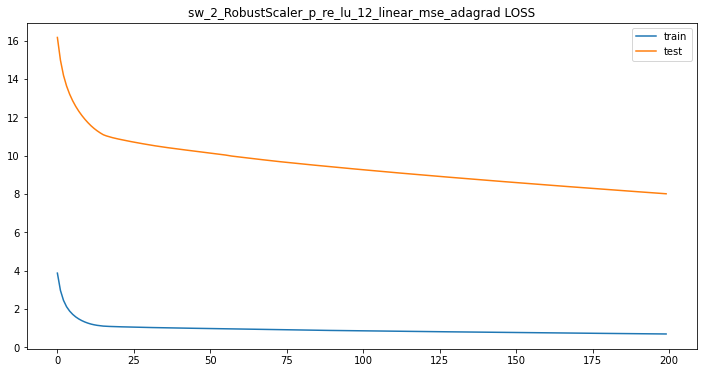


 sw_2_RobustScaler_p_re_lu_12_linear_mse_adagrad 데이터 비교


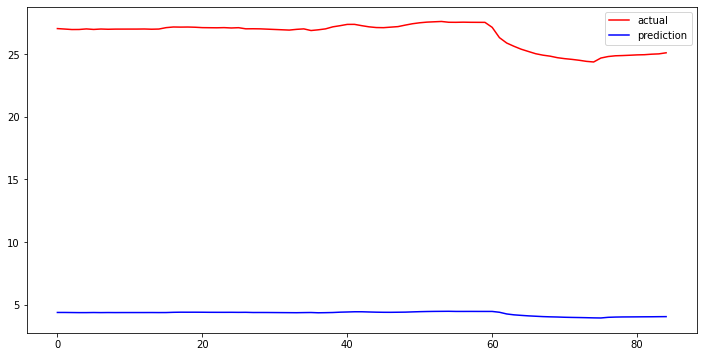

sw_2_RobustScaler_p_re_lu_12_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mse_adagrad metrics
mean_squared_error : 22.257599293687523
r2_score : -474.2776510304688
sw_2_RobustScaler_p_re_lu_12_linear_mse_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_636"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_636 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_636 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 1.2460 - acc: 0.0021 - val_loss: 9.9314 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.0136 - acc: 0.0021 - val_loss: 8.8526 -

Epoch 69/200
32/32 - 0s - loss: 0.0319 - acc: 0.0021 - val_loss: 0.0300 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0264 - acc: 0.0021 - val_loss: 0.0798 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0305 - acc: 0.0021 - val_loss: 0.0667 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0301 - acc: 0.0021 - val_loss: 0.0272 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0326 - acc: 0.0021 - val_loss: 0.0345 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0346 - acc: 0.0021 - val_loss: 0.1184 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0335 - acc: 0.0021 - val_loss: 0.1399 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0281 - acc: 0.0021 - val_loss: 0.0263 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0305 - acc: 0.0021 - val_loss: 0.0379 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0346 - acc: 0.0021 - val_loss: 0.1034 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0332 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0218 - acc: 0.0021 - val_loss: 0.1228 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0206 - acc: 0.0021 - val_loss: 0.0349 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.1258 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0214 - acc: 0.0021 - val_loss: 0.0956 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0200 - acc: 0.0021 - val_loss: 0.1369 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0205 - acc: 0.0021 - val_loss: 0.0344 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0235 - acc: 0.0021 - val_loss: 0.1388 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0208 - acc: 0.0021 - val_loss: 0.0356 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0217 - acc: 0.0021 - val_loss: 0.1433 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0199 - acc: 0.0021 - val_loss: 0.0305 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0201 - acc: 0.0

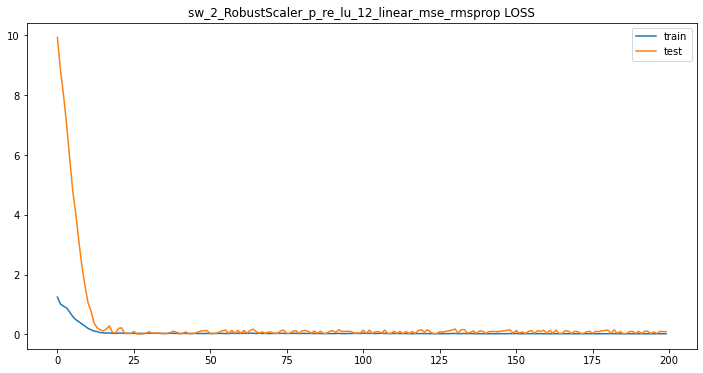


 sw_2_RobustScaler_p_re_lu_12_linear_mse_rmsprop 데이터 비교


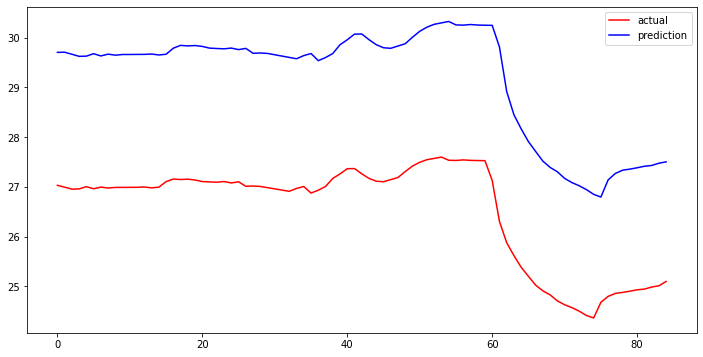

sw_2_RobustScaler_p_re_lu_12_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mse_rmsprop metrics
mean_squared_error : 2.659312648019825
r2_score : -5.784683152693604
sw_2_RobustScaler_p_re_lu_12_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_637"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_637 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_637 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 1.2312 - acc: 0.0021 - val_loss: 11.3146 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.1828 - acc: 0.0021 - val_loss:

Epoch 69/200
32/32 - 0s - loss: 0.0773 - acc: 0.0021 - val_loss: 0.2493 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0867 - acc: 0.0021 - val_loss: 0.2663 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0709 - acc: 0.0021 - val_loss: 0.2922 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0709 - acc: 0.0021 - val_loss: 0.2284 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0480 - acc: 0.0021 - val_loss: 0.2733 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.1095 - acc: 0.0021 - val_loss: 0.3578 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.1057 - acc: 0.0021 - val_loss: 0.2771 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.1016 - acc: 0.0021 - val_loss: 0.3173 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0599 - acc: 0.0021 - val_loss: 0.2486 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0786 - acc: 0.0021 - val_loss: 0.3294 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0594 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0392 - acc: 0.0021 - val_loss: 0.2621 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0505 - acc: 0.0021 - val_loss: 0.1765 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0445 - acc: 0.0021 - val_loss: 0.1727 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0510 - acc: 0.0021 - val_loss: 0.1549 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0410 - acc: 0.0021 - val_loss: 0.1721 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0405 - acc: 0.0021 - val_loss: 0.1639 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0508 - acc: 0.0021 - val_loss: 0.1370 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0465 - acc: 0.0021 - val_loss: 0.1376 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0456 - acc: 0.0021 - val_loss: 0.1386 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0478 - acc: 0.0021 - val_loss: 0.1350 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0457 - acc: 0.0

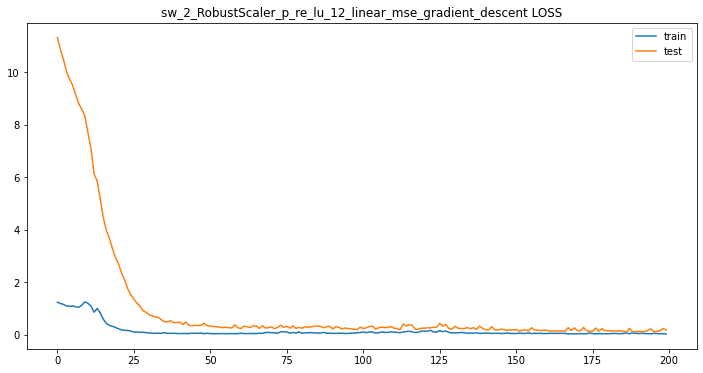


 sw_2_RobustScaler_p_re_lu_12_linear_mse_gradient_descent 데이터 비교


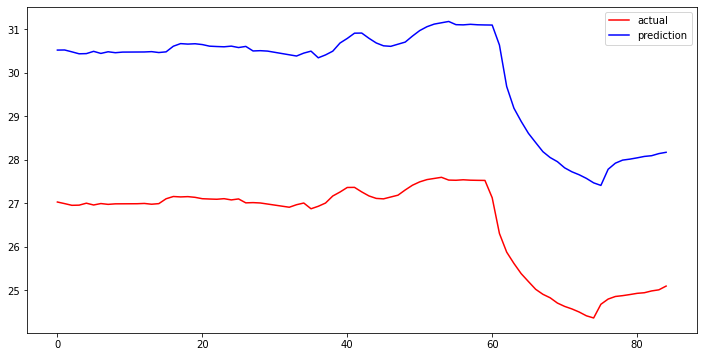

sw_2_RobustScaler_p_re_lu_12_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mse_gradient_descent metrics
mean_squared_error : 3.4451862753238305
r2_score : -10.387180484203405
sw_2_RobustScaler_p_re_lu_12_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_638"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_638 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_638 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.8017 - acc: 0.0021 - val_loss: 3.2091 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7642 - acc: 0

32/32 - 0s - loss: 0.0673 - acc: 0.0021 - val_loss: 0.2202 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0703 - acc: 0.0021 - val_loss: 0.2166 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0682 - acc: 0.0021 - val_loss: 0.2415 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0688 - acc: 0.0021 - val_loss: 0.2058 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0682 - acc: 0.0021 - val_loss: 0.2023 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0685 - acc: 0.0021 - val_loss: 0.1868 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0690 - acc: 0.0021 - val_loss: 0.1876 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0703 - acc: 0.0021 - val_loss: 0.2297 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0692 - acc: 0.0021 - val_loss: 0.1721 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0688 - acc: 0.0021 - val_loss: 0.1778 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0701 - acc: 0.0021 - val_loss: 0.2324 -

Epoch 155/200
32/32 - 0s - loss: 0.0656 - acc: 0.0021 - val_loss: 0.1363 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0653 - acc: 0.0021 - val_loss: 0.1154 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0656 - acc: 0.0021 - val_loss: 0.1024 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0722 - acc: 0.0021 - val_loss: 0.1310 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0691 - acc: 0.0021 - val_loss: 0.1134 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0691 - acc: 0.0021 - val_loss: 0.1306 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0668 - acc: 0.0021 - val_loss: 0.1194 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0695 - acc: 0.0021 - val_loss: 0.1569 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0623 - acc: 0.0021 - val_loss: 0.1151 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0652 - acc: 0.0021 - val_loss: 0.0975 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0679 - acc: 0.0

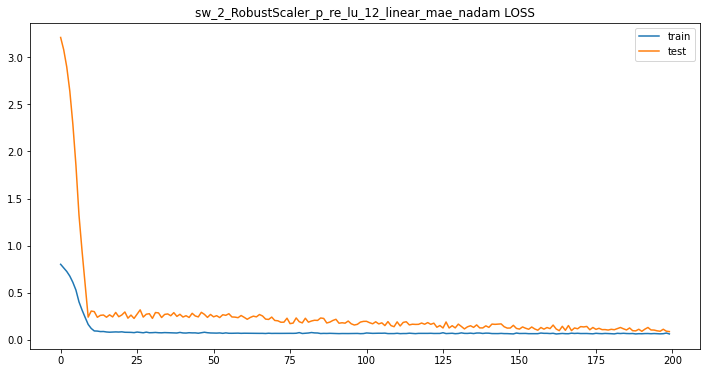


 sw_2_RobustScaler_p_re_lu_12_linear_mae_nadam 데이터 비교


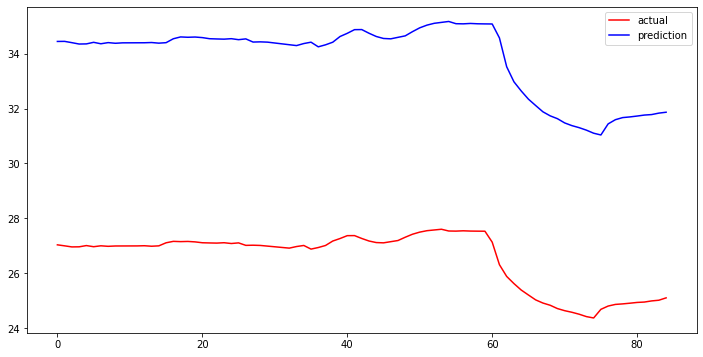

sw_2_RobustScaler_p_re_lu_12_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mae_nadam metrics
mean_squared_error : 7.312999480053562
r2_score : -50.30762439446628
sw_2_RobustScaler_p_re_lu_12_linear_mae_nadam이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_639"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_639 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_639 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 12s - loss: 0.8446 - acc: 0.0021 - val_loss: 3.1136 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7798 - acc: 0.0021 - val_loss: 3.1493 - val_ac

Epoch 69/200
32/32 - 0s - loss: 0.1002 - acc: 0.0021 - val_loss: 0.2589 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.1027 - acc: 0.0021 - val_loss: 0.2721 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.1030 - acc: 0.0021 - val_loss: 0.2740 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.1001 - acc: 0.0021 - val_loss: 0.2738 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0991 - acc: 0.0021 - val_loss: 0.2520 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.1015 - acc: 0.0021 - val_loss: 0.2644 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0967 - acc: 0.0021 - val_loss: 0.2650 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0988 - acc: 0.0021 - val_loss: 0.2706 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0997 - acc: 0.0021 - val_loss: 0.2557 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0921 - acc: 0.0021 - val_loss: 0.2543 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0900 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0764 - acc: 0.0021 - val_loss: 0.1797 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0731 - acc: 0.0021 - val_loss: 0.1833 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0808 - acc: 0.0021 - val_loss: 0.2121 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0774 - acc: 0.0021 - val_loss: 0.2018 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0728 - acc: 0.0021 - val_loss: 0.1813 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0708 - acc: 0.0021 - val_loss: 0.1697 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0753 - acc: 0.0021 - val_loss: 0.1926 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0716 - acc: 0.0021 - val_loss: 0.1705 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0722 - acc: 0.0021 - val_loss: 0.1835 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0712 - acc: 0.0021 - val_loss: 0.1755 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0708 - acc: 0.0

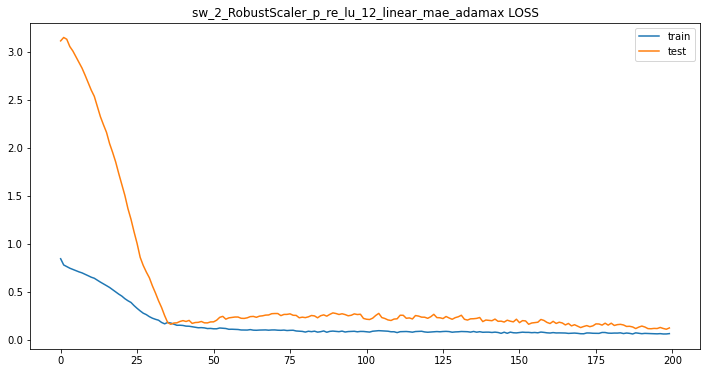


 sw_2_RobustScaler_p_re_lu_12_linear_mae_adamax 데이터 비교


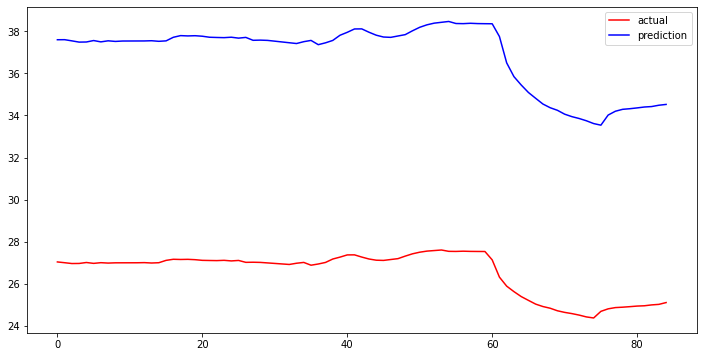

sw_2_RobustScaler_p_re_lu_12_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mae_adamax metrics
mean_squared_error : 10.362472508374458
r2_score : -102.01904576286269
sw_2_RobustScaler_p_re_lu_12_linear_mae_adamax이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_640"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_640 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_640 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 13s - loss: 0.8661 - acc: 0.0021 - val_loss: 3.1684 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7704 - acc: 0.0021 - val_loss: 2.8661 - val

Epoch 69/200
32/32 - 0s - loss: 0.0721 - acc: 0.0021 - val_loss: 0.3200 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0773 - acc: 0.0021 - val_loss: 0.1973 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0856 - acc: 0.0021 - val_loss: 0.3992 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0789 - acc: 0.0021 - val_loss: 0.2030 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0862 - acc: 0.0021 - val_loss: 0.3517 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0790 - acc: 0.0021 - val_loss: 0.2245 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0789 - acc: 0.0021 - val_loss: 0.3961 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0790 - acc: 0.0021 - val_loss: 0.1809 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.1016 - acc: 0.0021 - val_loss: 0.3591 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0762 - acc: 0.0021 - val_loss: 0.2122 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0791 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0655 - acc: 0.0021 - val_loss: 0.1259 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0694 - acc: 0.0021 - val_loss: 0.1737 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0668 - acc: 0.0021 - val_loss: 0.1609 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0704 - acc: 0.0021 - val_loss: 0.1236 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0748 - acc: 0.0021 - val_loss: 0.1481 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0696 - acc: 0.0021 - val_loss: 0.1713 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0688 - acc: 0.0021 - val_loss: 0.1290 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0827 - acc: 0.0021 - val_loss: 0.1862 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0704 - acc: 0.0021 - val_loss: 0.1514 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0669 - acc: 0.0021 - val_loss: 0.1333 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0672 - acc: 0.0

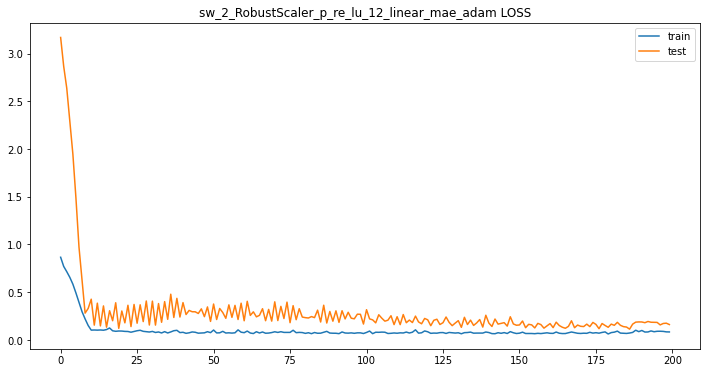


 sw_2_RobustScaler_p_re_lu_12_linear_mae_adam 데이터 비교


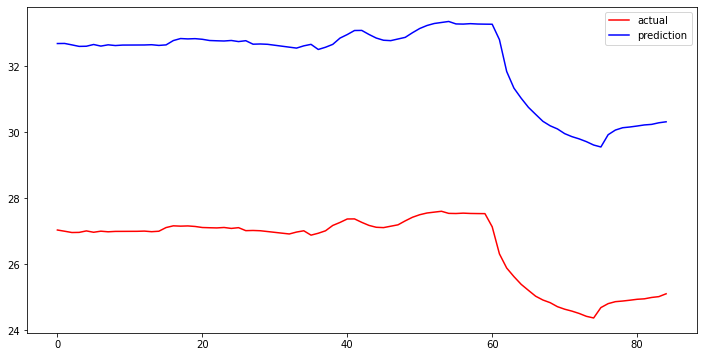

sw_2_RobustScaler_p_re_lu_12_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mae_adam metrics
mean_squared_error : 5.59767567217932
r2_score : -29.061192011059024
sw_2_RobustScaler_p_re_lu_12_linear_mae_adam이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_641"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_641 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_641 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.8156 - acc: 0.0021 - val_loss: 3.3423 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8062 - acc: 0.0021 - val_loss: 3.3307 - val_acc:

Epoch 69/200
32/32 - 0s - loss: 0.7319 - acc: 0.0021 - val_loss: 3.0851 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.7313 - acc: 0.0021 - val_loss: 3.0827 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.7303 - acc: 0.0021 - val_loss: 3.0796 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.7299 - acc: 0.0021 - val_loss: 3.0772 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.7292 - acc: 0.0021 - val_loss: 3.0748 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.7283 - acc: 0.0021 - val_loss: 3.0718 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.7278 - acc: 0.0021 - val_loss: 3.0694 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.7272 - acc: 0.0021 - val_loss: 3.0671 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.7266 - acc: 0.0021 - val_loss: 3.0647 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.7257 - acc: 0.0021 - val_loss: 3.0617 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.7252 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.6767 - acc: 0.0021 - val_loss: 2.8533 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.6752 - acc: 0.0021 - val_loss: 2.8475 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.6735 - acc: 0.0021 - val_loss: 2.8424 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.6716 - acc: 0.0021 - val_loss: 2.8374 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.6706 - acc: 0.0021 - val_loss: 2.8339 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.6697 - acc: 0.0021 - val_loss: 2.8305 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.6689 - acc: 0.0021 - val_loss: 2.8273 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.6681 - acc: 0.0021 - val_loss: 2.8242 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.6674 - acc: 0.0021 - val_loss: 2.8213 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.6667 - acc: 0.0021 - val_loss: 2.8184 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.6660 - acc: 0.0

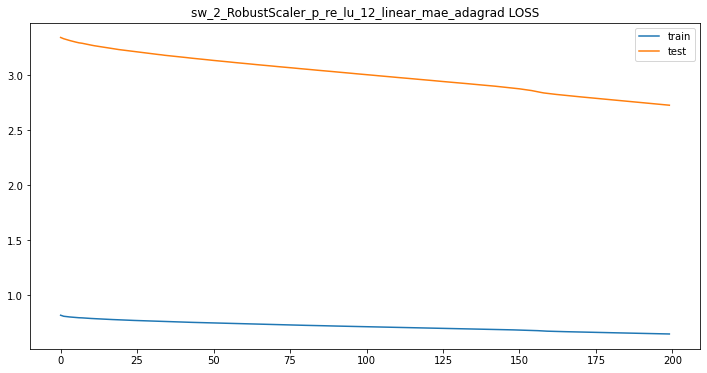


 sw_2_RobustScaler_p_re_lu_12_linear_mae_adagrad 데이터 비교


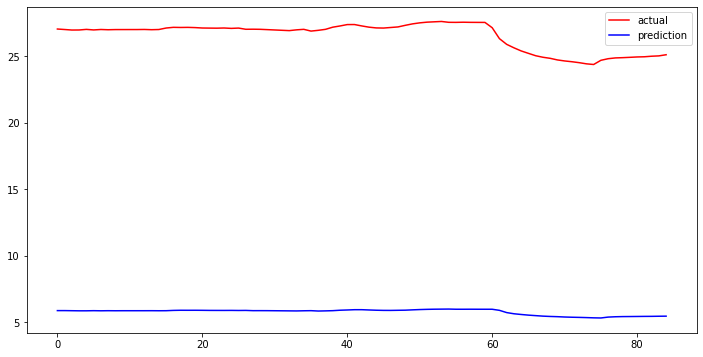

sw_2_RobustScaler_p_re_lu_12_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mae_adagrad metrics
mean_squared_error : 20.78147321308694
r2_score : -413.32711498116913
sw_2_RobustScaler_p_re_lu_12_linear_mae_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_642"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_642 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_642 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.8794 - acc: 0.0021 - val_loss: 3.4017 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7670 - acc: 0.0021 - val_loss: 3.2370 

Epoch 69/200
32/32 - 0s - loss: 0.0839 - acc: 0.0021 - val_loss: 0.1255 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0852 - acc: 0.0021 - val_loss: 0.1459 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0909 - acc: 0.0021 - val_loss: 0.1893 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0810 - acc: 0.0021 - val_loss: 0.1638 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0801 - acc: 0.0021 - val_loss: 0.1829 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0804 - acc: 0.0021 - val_loss: 0.1639 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0938 - acc: 0.0021 - val_loss: 0.1844 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0818 - acc: 0.0021 - val_loss: 0.1881 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0800 - acc: 0.0021 - val_loss: 0.1844 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0831 - acc: 0.0021 - val_loss: 0.1844 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0803 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0834 - acc: 0.0021 - val_loss: 0.2171 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0800 - acc: 0.0021 - val_loss: 0.2324 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0824 - acc: 0.0021 - val_loss: 0.2316 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0818 - acc: 0.0021 - val_loss: 0.2402 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0804 - acc: 0.0021 - val_loss: 0.2471 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0818 - acc: 0.0021 - val_loss: 0.2984 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0798 - acc: 0.0021 - val_loss: 0.2468 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0823 - acc: 0.0021 - val_loss: 0.2398 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0921 - acc: 0.0021 - val_loss: 0.1978 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0788 - acc: 0.0021 - val_loss: 0.2038 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.1038 - acc: 0.0

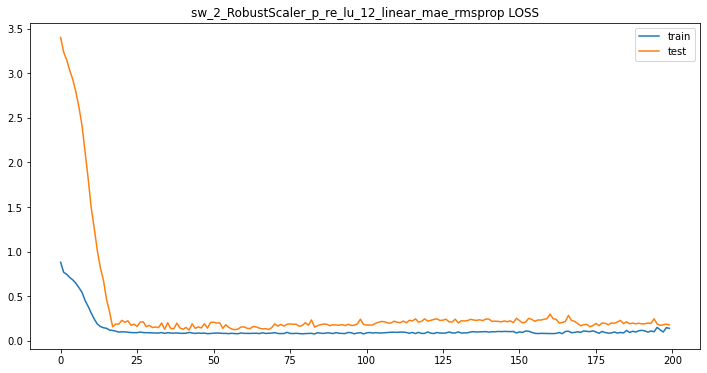


 sw_2_RobustScaler_p_re_lu_12_linear_mae_rmsprop 데이터 비교


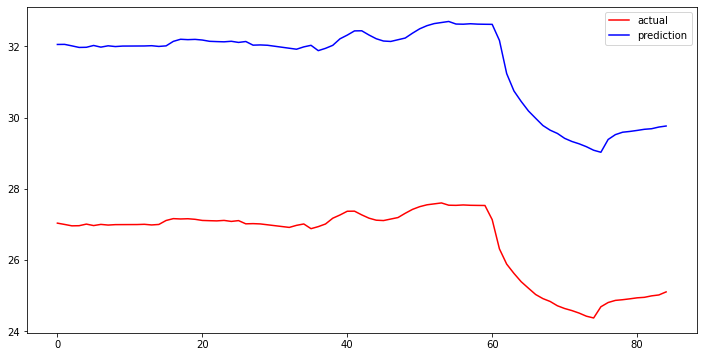

sw_2_RobustScaler_p_re_lu_12_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mae_rmsprop metrics
mean_squared_error : 4.986487057727101
r2_score : -22.855039931988106
sw_2_RobustScaler_p_re_lu_12_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_12
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_643"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_643 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_643 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.8790 - acc: 0.0021 - val_loss: 3.3411 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8025 - acc: 0.0021 - val_loss:

Epoch 69/200
32/32 - 0s - loss: 0.1351 - acc: 0.0021 - val_loss: 0.3931 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.1319 - acc: 0.0021 - val_loss: 0.3884 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.1193 - acc: 0.0021 - val_loss: 0.3721 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.1357 - acc: 0.0021 - val_loss: 0.3913 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.1106 - acc: 0.0021 - val_loss: 0.4306 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.1240 - acc: 0.0021 - val_loss: 0.3939 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.1064 - acc: 0.0021 - val_loss: 0.4213 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.1047 - acc: 0.0021 - val_loss: 0.3934 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.1287 - acc: 0.0021 - val_loss: 0.4567 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.1136 - acc: 0.0021 - val_loss: 0.4572 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.1053 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.1320 - acc: 0.0021 - val_loss: 0.3983 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1194 - acc: 0.0021 - val_loss: 0.3830 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1280 - acc: 0.0021 - val_loss: 0.4246 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1131 - acc: 0.0021 - val_loss: 0.4674 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.1180 - acc: 0.0021 - val_loss: 0.3725 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0971 - acc: 0.0021 - val_loss: 0.3562 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.1037 - acc: 0.0021 - val_loss: 0.3587 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0943 - acc: 0.0021 - val_loss: 0.3608 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.1115 - acc: 0.0021 - val_loss: 0.3667 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.1058 - acc: 0.0021 - val_loss: 0.3829 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0988 - acc: 0.0

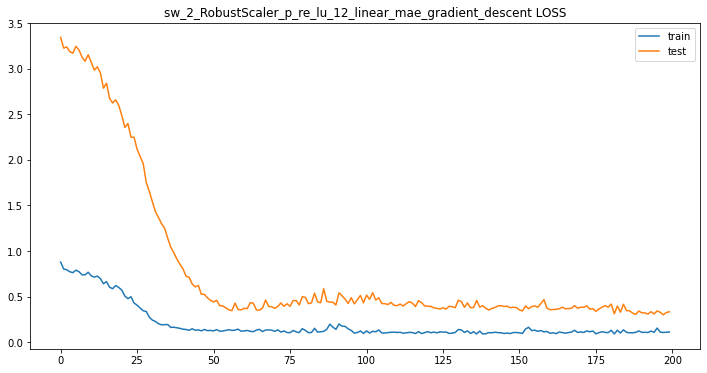


 sw_2_RobustScaler_p_re_lu_12_linear_mae_gradient_descent 데이터 비교


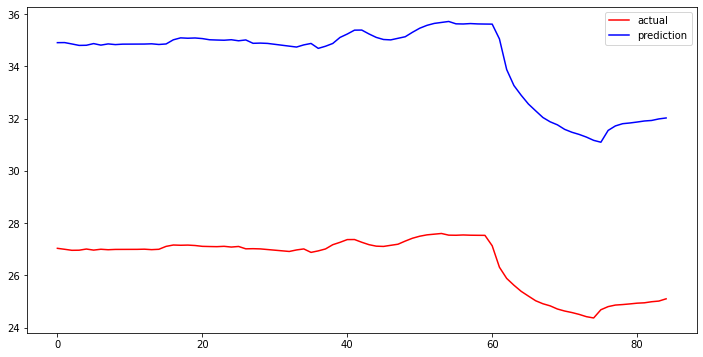

sw_2_RobustScaler_p_re_lu_12_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_RobustScaler_p_re_lu_12_linear_mae_gradient_descent metrics
mean_squared_error : 7.707035952149478
r2_score : -55.985651546750496
sw_2_RobustScaler_p_re_lu_12_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_644"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_644 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_644 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 1.3359 - acc: 0.0021 - val_loss: 10.2895 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.1278 - ac

32/32 - 0s - loss: 0.0166 - acc: 0.0021 - val_loss: 0.0188 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0166 - acc: 0.0021 - val_loss: 0.0235 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0163 - acc: 0.0021 - val_loss: 0.0180 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0174 - acc: 0.0021 - val_loss: 0.0166 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0155 - acc: 0.0021 - val_loss: 0.0231 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0162 - acc: 0.0021 - val_loss: 0.0217 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0157 - acc: 0.0021 - val_loss: 0.0155 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0161 - acc: 0.0021 - val_loss: 0.0136 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0148 - acc: 0.0021 - val_loss: 0.0208 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0150 - acc: 0.0021 - val_loss: 0.0194 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0148 - acc: 0.0021 - val_loss: 0.0283 -

Epoch 155/200
32/32 - 0s - loss: 0.0144 - acc: 0.0021 - val_loss: 0.0719 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0148 - acc: 0.0021 - val_loss: 0.0794 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0148 - acc: 0.0021 - val_loss: 0.0849 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0142 - acc: 0.0021 - val_loss: 0.0820 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0135 - acc: 0.0021 - val_loss: 0.0780 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0151 - acc: 0.0021 - val_loss: 0.0794 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0142 - acc: 0.0021 - val_loss: 0.0777 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0133 - acc: 0.0021 - val_loss: 0.0764 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_loss: 0.0782 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0135 - acc: 0.0021 - val_loss: 0.0777 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0130 - acc: 0.0

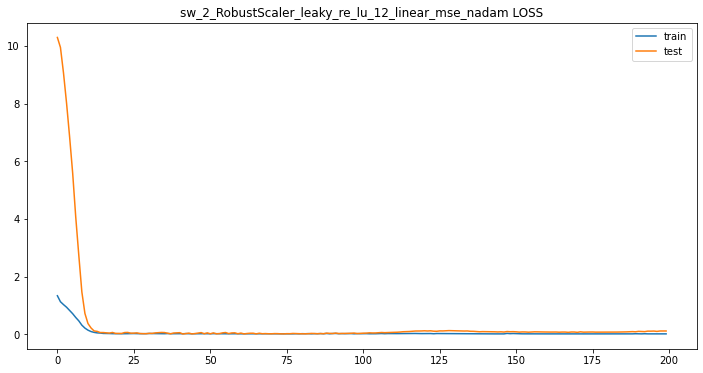


 sw_2_RobustScaler_leaky_re_lu_12_linear_mse_nadam 데이터 비교


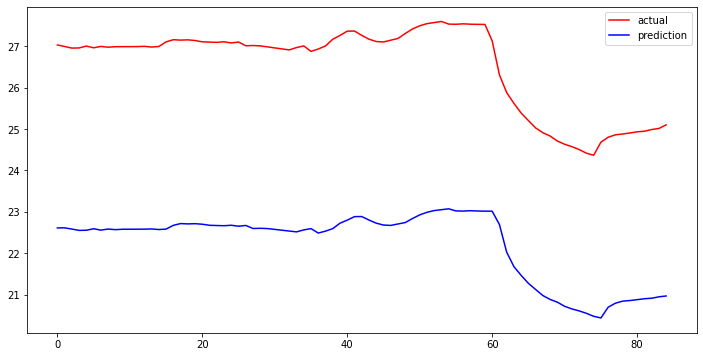

sw_2_RobustScaler_leaky_re_lu_12_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_nadam metrics
mean_squared_error : 4.317864661000028
r2_score : -16.88664189495497
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_645"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_645 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_645 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 1.2601 - acc: 0.0021 - val_loss: 11.3606 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.2061 - acc: 0.0021 - val_loss

Epoch 69/200
32/32 - 0s - loss: 0.0200 - acc: 0.0021 - val_loss: 0.0437 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0211 - acc: 0.0021 - val_loss: 0.0436 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0167 - acc: 0.0021 - val_loss: 0.0442 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0160 - acc: 0.0021 - val_loss: 0.0401 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0157 - acc: 0.0021 - val_loss: 0.0376 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0171 - acc: 0.0021 - val_loss: 0.0410 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0173 - acc: 0.0021 - val_loss: 0.0425 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0213 - acc: 0.0021 - val_loss: 0.0375 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0197 - acc: 0.0021 - val_loss: 0.0334 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0225 - acc: 0.0021 - val_loss: 0.0323 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0251 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0218 - acc: 0.0021 - val_loss: 0.0361 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0216 - acc: 0.0021 - val_loss: 0.0359 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0205 - acc: 0.0021 - val_loss: 0.0343 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0195 - acc: 0.0021 - val_loss: 0.0332 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0184 - acc: 0.0021 - val_loss: 0.0319 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0186 - acc: 0.0021 - val_loss: 0.0318 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0181 - acc: 0.0021 - val_loss: 0.0303 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0192 - acc: 0.0021 - val_loss: 0.0310 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0202 - acc: 0.0021 - val_loss: 0.0316 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0206 - acc: 0.0021 - val_loss: 0.0329 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0181 - acc: 0.0

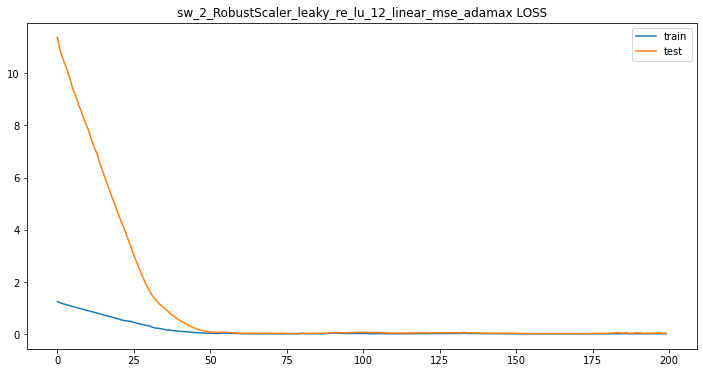


 sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adamax 데이터 비교


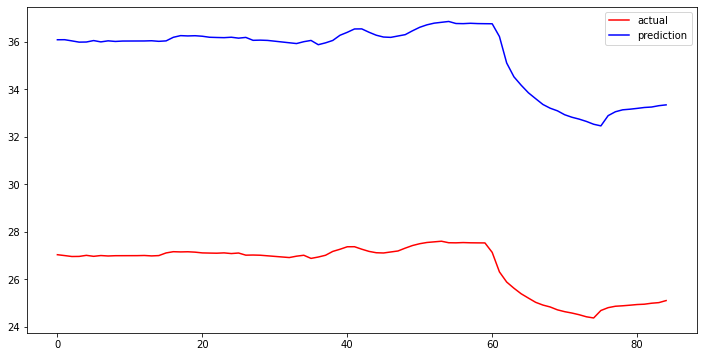

sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adamax metrics
mean_squared_error : 8.919332325670021
r2_score : -75.32301026600972
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_646"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_646 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_646 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 1.3739 - acc: 0.0021 - val_loss: 11.5064 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.1319 - acc: 0.0021 - val_loss

Epoch 69/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0461 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0243 - acc: 0.0021 - val_loss: 0.0475 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0220 - acc: 0.0021 - val_loss: 0.0425 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0210 - acc: 0.0021 - val_loss: 0.0410 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0215 - acc: 0.0021 - val_loss: 0.0431 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0235 - acc: 0.0021 - val_loss: 0.0453 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0251 - acc: 0.0021 - val_loss: 0.0478 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0194 - acc: 0.0021 - val_loss: 0.0380 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0197 - acc: 0.0021 - val_loss: 0.0392 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0223 - acc: 0.0021 - val_loss: 0.0427 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0245 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0226 - acc: 0.0021 - val_loss: 0.0422 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0234 - acc: 0.0021 - val_loss: 0.0445 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0226 - acc: 0.0021 - val_loss: 0.0444 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0442 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0479 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0461 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0520 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0229 - acc: 0.0021 - val_loss: 0.0468 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0529 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0490 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0241 - acc: 0.0

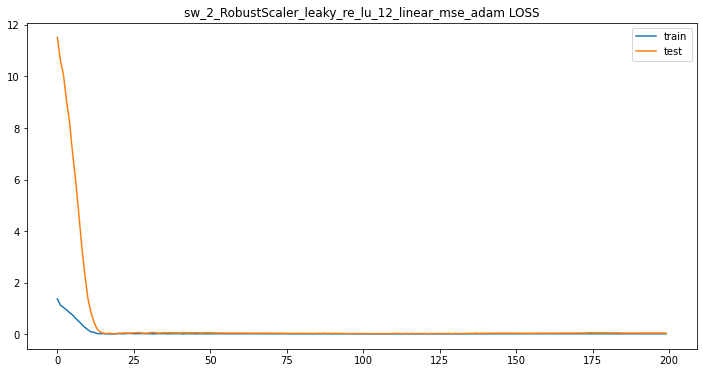


 sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adam 데이터 비교


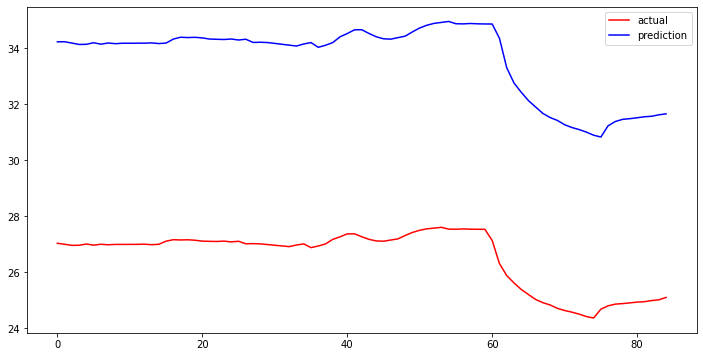

sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adam metrics
mean_squared_error : 7.08861473507375
r2_score : -47.20737806976229
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_647"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_647 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_647 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 1.9474 - acc: 0.0021 - val_loss: 12.1506 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.7401 - acc: 0.0021 - val_loss: 1

32/32 - 0s - loss: 0.9127 - acc: 0.0021 - val_loss: 9.1064 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.9103 - acc: 0.0021 - val_loss: 9.0930 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.9079 - acc: 0.0021 - val_loss: 9.0796 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.9056 - acc: 0.0021 - val_loss: 9.0664 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.9033 - acc: 0.0021 - val_loss: 9.0534 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.9010 - acc: 0.0021 - val_loss: 9.0404 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.8988 - acc: 0.0021 - val_loss: 9.0276 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.8966 - acc: 0.0021 - val_loss: 9.0149 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.8944 - acc: 0.0021 - val_loss: 9.0023 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.8922 - acc: 0.0021 - val_loss: 8.9897 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.8901 - acc: 0.0021 - val_loss: 8.9772 -

Epoch 155/200
32/32 - 0s - loss: 0.7537 - acc: 0.0021 - val_loss: 8.0727 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.7522 - acc: 0.0021 - val_loss: 8.0620 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.7508 - acc: 0.0021 - val_loss: 8.0513 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.7493 - acc: 0.0021 - val_loss: 8.0406 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.7479 - acc: 0.0021 - val_loss: 8.0300 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.7464 - acc: 0.0021 - val_loss: 8.0193 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.7450 - acc: 0.0021 - val_loss: 8.0087 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.7435 - acc: 0.0021 - val_loss: 7.9982 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.7421 - acc: 0.0021 - val_loss: 7.9876 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.7407 - acc: 0.0021 - val_loss: 7.9771 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.7392 - acc: 0.0

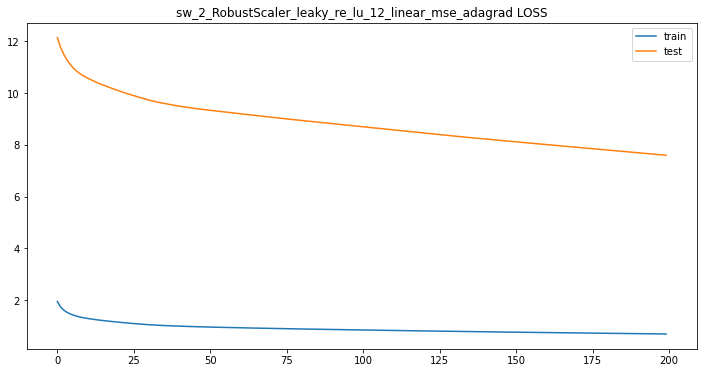


 sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adagrad 데이터 비교


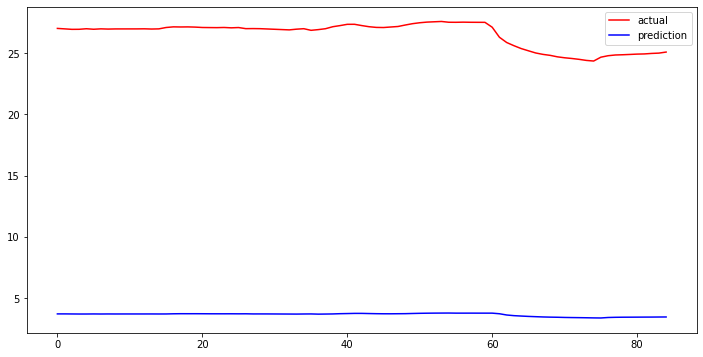

sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adagrad metrics
mean_squared_error : 22.91314485249133
r2_score : -502.68628465005713
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_648"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_648 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_648 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 12s - loss: 1.3511 - acc: 0.0021 - val_loss: 10.4891 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.1462 - acc: 0.0021 - 

32/32 - 0s - loss: 0.0298 - acc: 0.0021 - val_loss: 0.0402 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0313 - acc: 0.0021 - val_loss: 0.1432 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0288 - acc: 0.0021 - val_loss: 0.1472 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0260 - acc: 0.0021 - val_loss: 0.0382 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0339 - acc: 0.0021 - val_loss: 0.1332 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0307 - acc: 0.0021 - val_loss: 0.1452 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0283 - acc: 0.0021 - val_loss: 0.0506 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0313 - acc: 0.0021 - val_loss: 0.0477 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0337 - acc: 0.0021 - val_loss: 0.1464 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0321 - acc: 0.0021 - val_loss: 0.1576 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0266 - acc: 0.0021 - val_loss: 0.0384 -

Epoch 155/200
32/32 - 0s - loss: 0.0383 - acc: 0.0021 - val_loss: 0.2278 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0392 - acc: 0.0021 - val_loss: 0.2317 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0294 - acc: 0.0021 - val_loss: 0.0427 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0379 - acc: 0.0021 - val_loss: 0.2237 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0400 - acc: 0.0021 - val_loss: 0.2400 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0373 - acc: 0.0021 - val_loss: 0.0735 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0260 - acc: 0.0021 - val_loss: 0.1522 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0284 - acc: 0.0021 - val_loss: 0.0630 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0258 - acc: 0.0021 - val_loss: 0.1339 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0297 - acc: 0.0021 - val_loss: 0.0612 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0368 - acc: 0.0

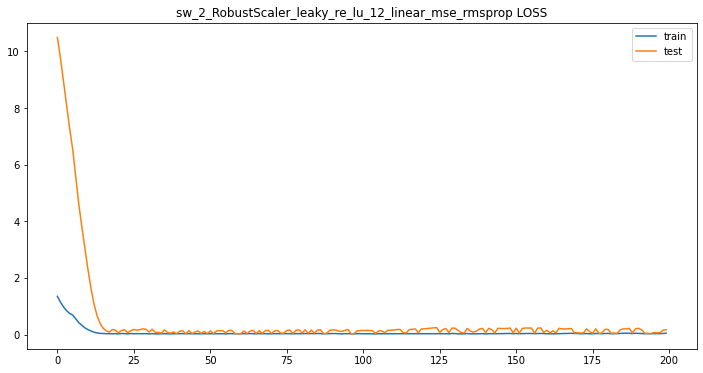


 sw_2_RobustScaler_leaky_re_lu_12_linear_mse_rmsprop 데이터 비교


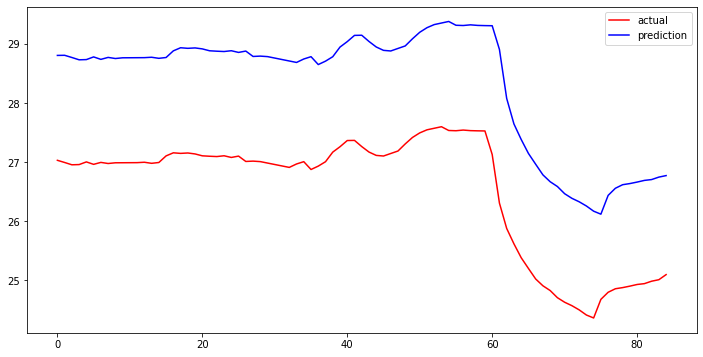

sw_2_RobustScaler_leaky_re_lu_12_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_rmsprop metrics
mean_squared_error : 1.7996210759061761
r2_score : -2.107083454924899
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_649"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_649 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_649 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 1.2406 - acc: 0.0021 - val_loss: 11.7608 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 1.1410 - acc: 

Epoch 68/200
32/32 - 0s - loss: 0.0353 - acc: 0.0021 - val_loss: 0.3677 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0354 - acc: 0.0021 - val_loss: 0.3028 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0344 - acc: 0.0021 - val_loss: 0.3512 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0332 - acc: 0.0021 - val_loss: 0.3924 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0305 - acc: 0.0021 - val_loss: 0.2834 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0297 - acc: 0.0021 - val_loss: 0.2637 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0302 - acc: 0.0021 - val_loss: 0.3128 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0302 - acc: 0.0021 - val_loss: 0.3429 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0347 - acc: 0.0021 - val_loss: 0.2708 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0344 - acc: 0.0021 - val_loss: 0.3034 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0259 - acc: 0.0021 - val_l

Epoch 155/200
32/32 - 0s - loss: 0.0515 - acc: 0.0021 - val_loss: 0.1867 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0382 - acc: 0.0021 - val_loss: 0.1771 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0389 - acc: 0.0021 - val_loss: 0.1978 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0352 - acc: 0.0021 - val_loss: 0.2169 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0526 - acc: 0.0021 - val_loss: 0.2047 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0512 - acc: 0.0021 - val_loss: 0.1988 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0348 - acc: 0.0021 - val_loss: 0.1820 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0422 - acc: 0.0021 - val_loss: 0.1775 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0409 - acc: 0.0021 - val_loss: 0.1780 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0339 - acc: 0.0021 - val_loss: 0.1869 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0359 - acc: 0.0

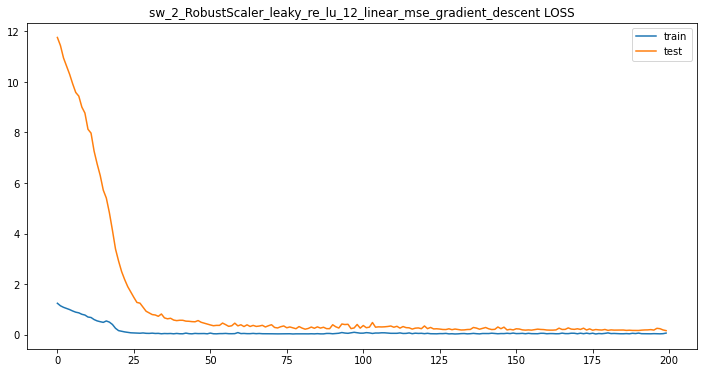


 sw_2_RobustScaler_leaky_re_lu_12_linear_mse_gradient_descent 데이터 비교


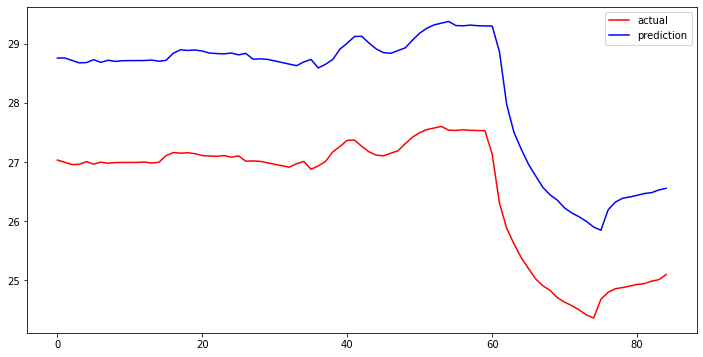

sw_2_RobustScaler_leaky_re_lu_12_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_gradient_descent metrics
mean_squared_error : 1.7110952365573742
r2_score : -1.8089185444603948
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_650"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_650 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_650 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.8185 - acc: 0.0021 - val_loss: 3.1982 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss:

Epoch 68/200
32/32 - 0s - loss: 0.0744 - acc: 0.0021 - val_loss: 0.1249 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0739 - acc: 0.0021 - val_loss: 0.1295 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0739 - acc: 0.0021 - val_loss: 0.1234 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0727 - acc: 0.0021 - val_loss: 0.1249 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0732 - acc: 0.0021 - val_loss: 0.1171 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0710 - acc: 0.0021 - val_loss: 0.1070 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0779 - acc: 0.0021 - val_loss: 0.1196 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0717 - acc: 0.0021 - val_loss: 0.1230 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0917 - acc: 0.0021 - val_loss: 0.1120 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0728 - acc: 0.0021 - val_loss: 0.1051 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0723 - acc: 0.0021 - val_l

Epoch 155/200
32/32 - 0s - loss: 0.0672 - acc: 0.0021 - val_loss: 0.0835 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0714 - acc: 0.0021 - val_loss: 0.0788 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0734 - acc: 0.0021 - val_loss: 0.0893 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0679 - acc: 0.0021 - val_loss: 0.0801 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0779 - acc: 0.0021 - val_loss: 0.0804 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0766 - acc: 0.0021 - val_loss: 0.1025 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0778 - acc: 0.0021 - val_loss: 0.0756 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0704 - acc: 0.0021 - val_loss: 0.0863 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0690 - acc: 0.0021 - val_loss: 0.0788 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0717 - acc: 0.0021 - val_loss: 0.0852 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0712 - acc: 0.0

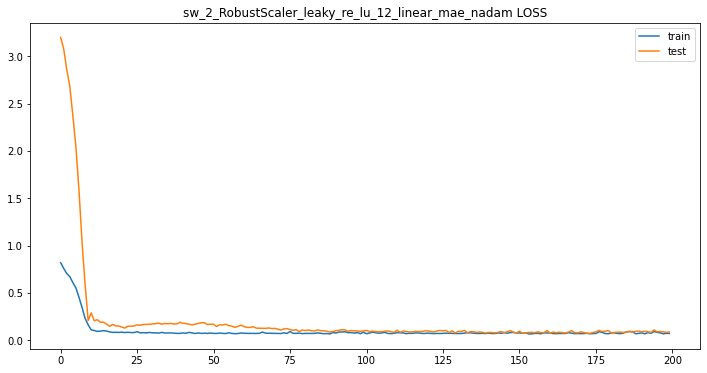


 sw_2_RobustScaler_leaky_re_lu_12_linear_mae_nadam 데이터 비교


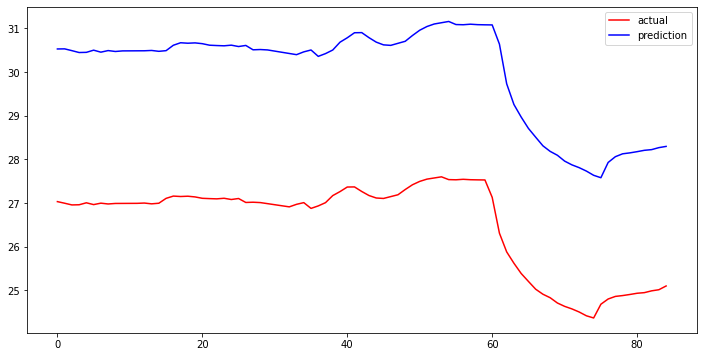

sw_2_RobustScaler_leaky_re_lu_12_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_nadam metrics
mean_squared_error : 3.4758232788096604
r2_score : -10.590604487432556
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_651"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_651 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_651 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.8172 - acc: 0.0021 - val_loss: 3.2286 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7999 - acc: 0.0021 - val_loss

Epoch 69/200
32/32 - 0s - loss: 0.0801 - acc: 0.0021 - val_loss: 0.1454 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0797 - acc: 0.0021 - val_loss: 0.1391 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0793 - acc: 0.0021 - val_loss: 0.1478 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0920 - acc: 0.0021 - val_loss: 0.1383 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0808 - acc: 0.0021 - val_loss: 0.1501 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0867 - acc: 0.0021 - val_loss: 0.1420 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0772 - acc: 0.0021 - val_loss: 0.1596 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0761 - acc: 0.0021 - val_loss: 0.1656 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0828 - acc: 0.0021 - val_loss: 0.1654 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0792 - acc: 0.0021 - val_loss: 0.1593 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0823 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0643 - acc: 0.0021 - val_loss: 0.1398 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0641 - acc: 0.0021 - val_loss: 0.1350 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0641 - acc: 0.0021 - val_loss: 0.1224 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0709 - acc: 0.0021 - val_loss: 0.1369 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0662 - acc: 0.0021 - val_loss: 0.1305 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0699 - acc: 0.0021 - val_loss: 0.1270 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0652 - acc: 0.0021 - val_loss: 0.1437 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0628 - acc: 0.0021 - val_loss: 0.1400 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0674 - acc: 0.0021 - val_loss: 0.1335 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0689 - acc: 0.0021 - val_loss: 0.1402 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0663 - acc: 0.0

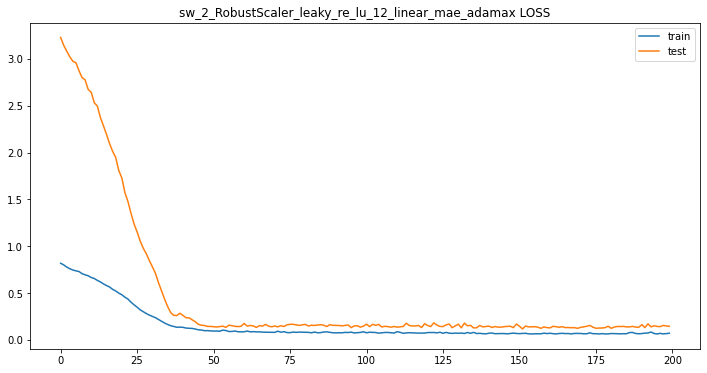


 sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adamax 데이터 비교


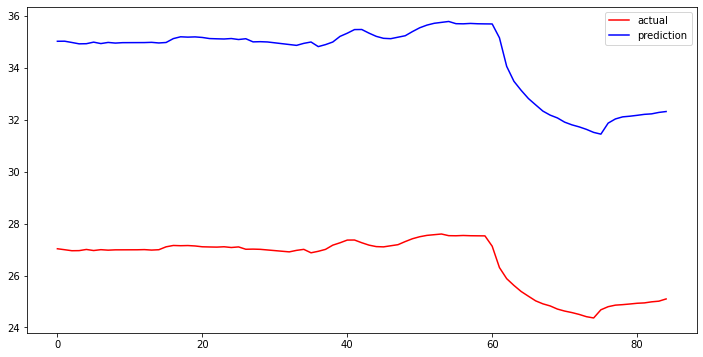

sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adamax metrics
mean_squared_error : 7.863364934120646
r2_score : -58.32088139688617
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_652"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_652 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_652 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.9391 - acc: 0.0021 - val_loss: 2.9714 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7204 - acc: 0.0021 - val_loss:

Epoch 69/200
32/32 - 0s - loss: 0.0779 - acc: 0.0021 - val_loss: 0.2356 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0778 - acc: 0.0021 - val_loss: 0.3903 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0778 - acc: 0.0021 - val_loss: 0.2102 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0741 - acc: 0.0021 - val_loss: 0.3050 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0792 - acc: 0.0021 - val_loss: 0.2284 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0745 - acc: 0.0021 - val_loss: 0.3351 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0745 - acc: 0.0021 - val_loss: 0.2231 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0743 - acc: 0.0021 - val_loss: 0.2988 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0749 - acc: 0.0021 - val_loss: 0.2269 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0687 - acc: 0.0021 - val_loss: 0.2273 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0699 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0699 - acc: 0.0021 - val_loss: 0.1747 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0672 - acc: 0.0021 - val_loss: 0.1429 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0710 - acc: 0.0021 - val_loss: 0.1807 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0690 - acc: 0.0021 - val_loss: 0.1757 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0689 - acc: 0.0021 - val_loss: 0.1444 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0721 - acc: 0.0021 - val_loss: 0.1915 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0717 - acc: 0.0021 - val_loss: 0.1836 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0653 - acc: 0.0021 - val_loss: 0.1165 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0745 - acc: 0.0021 - val_loss: 0.2169 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0718 - acc: 0.0021 - val_loss: 0.1544 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0744 - acc: 0.0

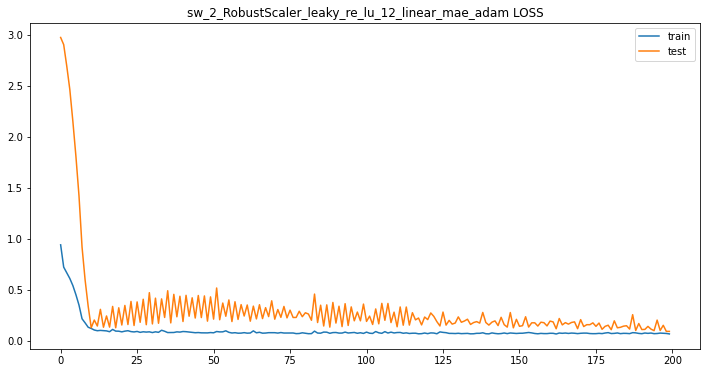


 sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adam 데이터 비교


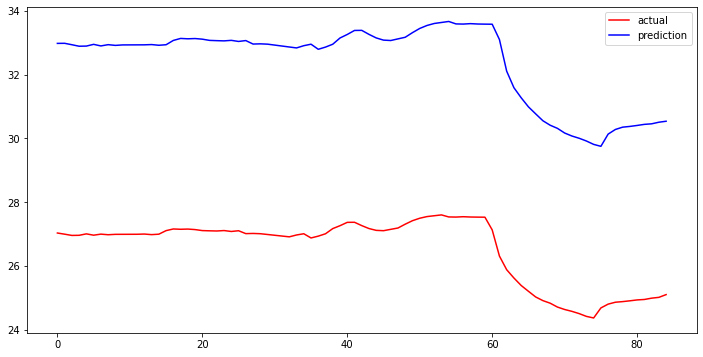

sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adam metrics
mean_squared_error : 5.879641383646877
r2_score : -32.16594823952248
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_653"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_653 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_653 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 1.0212 - acc: 0.0021 - val_loss: 3.5800 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.9148 - acc: 0.0021 - val_loss: 3.

Epoch 69/200
32/32 - 0s - loss: 0.7200 - acc: 0.0021 - val_loss: 3.1210 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.7191 - acc: 0.0021 - val_loss: 3.1185 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.7183 - acc: 0.0021 - val_loss: 3.1161 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.7174 - acc: 0.0021 - val_loss: 3.1136 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.7165 - acc: 0.0021 - val_loss: 3.1112 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.7157 - acc: 0.0021 - val_loss: 3.1088 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.7148 - acc: 0.0021 - val_loss: 3.1064 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.7140 - acc: 0.0021 - val_loss: 3.1040 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.7131 - acc: 0.0021 - val_loss: 3.1016 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.7122 - acc: 0.0021 - val_loss: 3.0992 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.7114 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.6495 - acc: 0.0021 - val_loss: 2.9125 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.6486 - acc: 0.0021 - val_loss: 2.9095 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.6477 - acc: 0.0021 - val_loss: 2.9067 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.6468 - acc: 0.0021 - val_loss: 2.9037 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.6459 - acc: 0.0021 - val_loss: 2.9007 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.6450 - acc: 0.0021 - val_loss: 2.8977 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.6442 - acc: 0.0021 - val_loss: 2.8943 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.6432 - acc: 0.0021 - val_loss: 2.8913 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.6422 - acc: 0.0021 - val_loss: 2.8884 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.6412 - acc: 0.0021 - val_loss: 2.8854 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.6406 - acc: 0.0

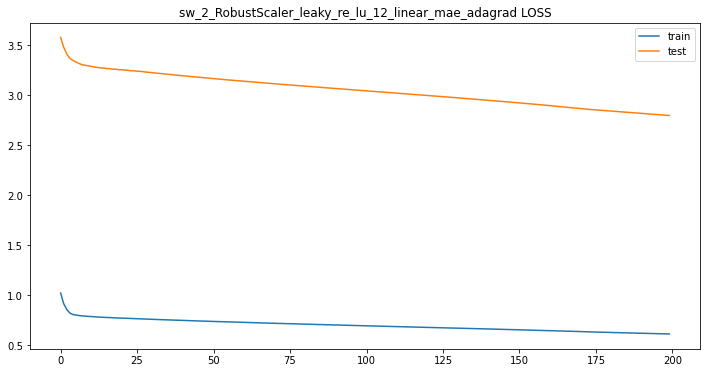


 sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adagrad 데이터 비교


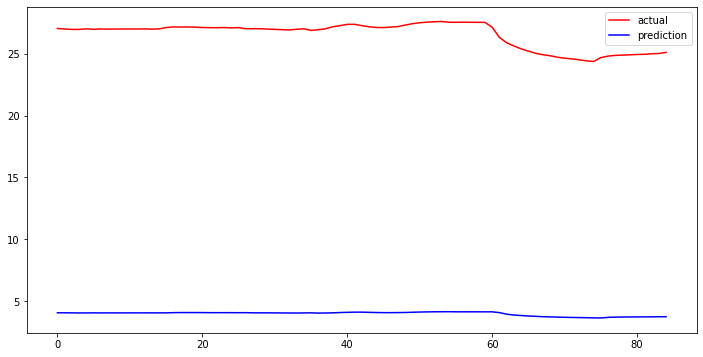

sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adagrad metrics
mean_squared_error : 22.570772213213736
r2_score : -487.7464870578279
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_654"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_654 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_654 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.7814 - acc: 0.0021 - val_loss: 3.0300 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.7348 - acc: 0.0021 - va

Epoch 69/200
32/32 - 0s - loss: 0.0829 - acc: 0.0021 - val_loss: 0.1300 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0848 - acc: 0.0021 - val_loss: 0.1124 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0801 - acc: 0.0021 - val_loss: 0.1323 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0908 - acc: 0.0021 - val_loss: 0.1021 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0844 - acc: 0.0021 - val_loss: 0.1048 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0802 - acc: 0.0021 - val_loss: 0.1244 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0786 - acc: 0.0021 - val_loss: 0.1329 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0797 - acc: 0.0021 - val_loss: 0.1385 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0843 - acc: 0.0021 - val_loss: 0.1442 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0792 - acc: 0.0021 - val_loss: 0.1205 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0807 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0877 - acc: 0.0021 - val_loss: 0.1640 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0907 - acc: 0.0021 - val_loss: 0.1588 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0865 - acc: 0.0021 - val_loss: 0.1548 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0871 - acc: 0.0021 - val_loss: 0.1576 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0826 - acc: 0.0021 - val_loss: 0.1532 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0900 - acc: 0.0021 - val_loss: 0.1526 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0870 - acc: 0.0021 - val_loss: 0.1443 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0804 - acc: 0.0021 - val_loss: 0.1290 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0903 - acc: 0.0021 - val_loss: 0.1500 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0839 - acc: 0.0021 - val_loss: 0.1633 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0803 - acc: 0.0

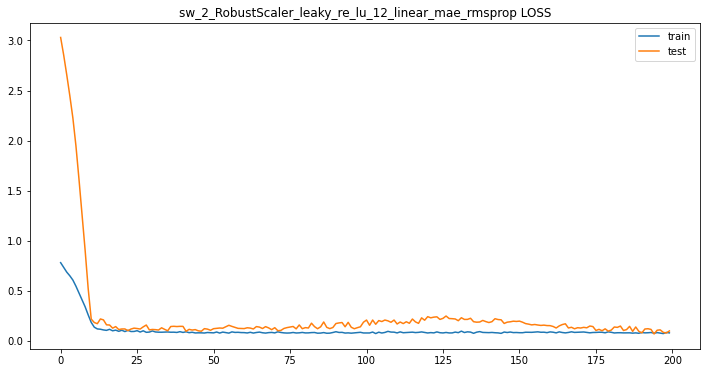


 sw_2_RobustScaler_leaky_re_lu_12_linear_mae_rmsprop 데이터 비교


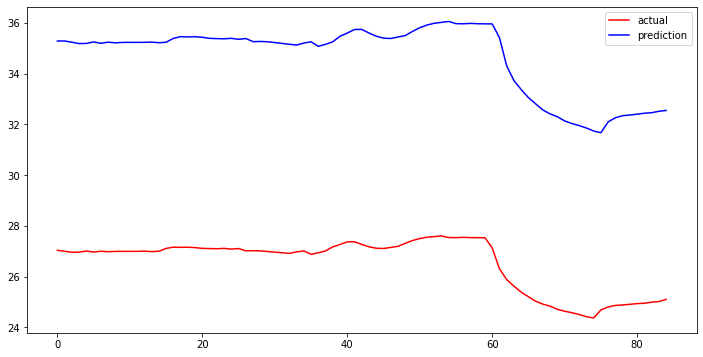

sw_2_RobustScaler_leaky_re_lu_12_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_rmsprop metrics
mean_squared_error : 8.114411952535391
r2_score : -62.169116995754166
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_12
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_655"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_655 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_655 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.7960 - acc: 0.0021 - val_loss: 3.2892 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.8020 - acc: 0.

32/32 - 0s - loss: 0.1163 - acc: 0.0021 - val_loss: 0.4644 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.1395 - acc: 0.0021 - val_loss: 0.5121 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.1285 - acc: 0.0021 - val_loss: 0.4970 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.1451 - acc: 0.0021 - val_loss: 0.5030 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.1227 - acc: 0.0021 - val_loss: 0.5157 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.1430 - acc: 0.0021 - val_loss: 0.5339 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.1433 - acc: 0.0021 - val_loss: 0.4450 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.1787 - acc: 0.0021 - val_loss: 0.4783 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.1647 - acc: 0.0021 - val_loss: 0.5449 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.1578 - acc: 0.0021 - val_loss: 0.4382 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.1796 - acc: 0.0021 - val_loss: 0.4276 -

Epoch 155/200
32/32 - 0s - loss: 0.1364 - acc: 0.0021 - val_loss: 0.4594 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.1053 - acc: 0.0021 - val_loss: 0.4522 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1084 - acc: 0.0021 - val_loss: 0.4239 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1403 - acc: 0.0021 - val_loss: 0.4692 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1139 - acc: 0.0021 - val_loss: 0.4053 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.1159 - acc: 0.0021 - val_loss: 0.4364 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.1089 - acc: 0.0021 - val_loss: 0.4273 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.1103 - acc: 0.0021 - val_loss: 0.4405 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.1124 - acc: 0.0021 - val_loss: 0.4376 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.1069 - acc: 0.0021 - val_loss: 0.3771 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.1287 - acc: 0.0

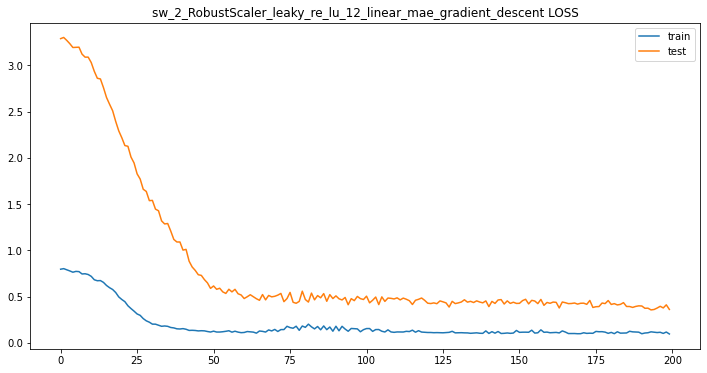


 sw_2_RobustScaler_leaky_re_lu_12_linear_mae_gradient_descent 데이터 비교


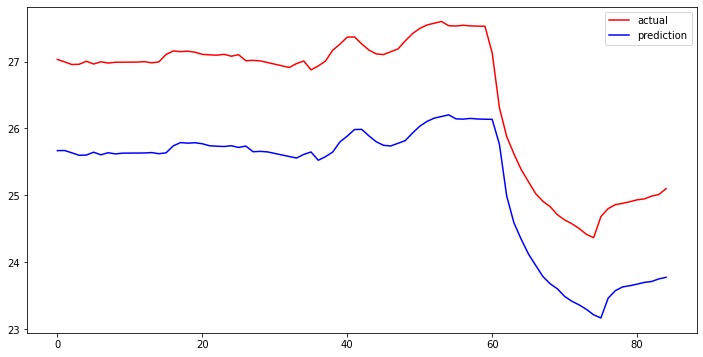

sw_2_RobustScaler_leaky_re_lu_12_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_gradient_descent metrics
mean_squared_error : 1.319146448359176
r2_score : -0.669463087965938
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_gradient_descent이 완료되었습니다.
train_X.shape : (469, 1, 2) 
train_y.shape : (469, 1) 
valid_X.shape :  (118, 1, 2) 
valid_y.shape : (118, 1) 
test_X.shape :  (85, 1, 2)
scaler_data가 완료되었습니다.

Scaler : Normalizer
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_656"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_656 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_656 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
____________________

Epoch 63/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 64/200
32/32 - 0s - loss: 0.0235 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 65/200
32/32 - 0s - loss: 0.0235 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 66/200
32/32 - 0s - loss: 0.0234 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 67/200
32/32 - 0s - loss: 0.0234 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 68/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0231 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0231 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_l

Epoch 150/200
32/32 - 0s - loss: 0.0136 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 151/200
32/32 - 0s - loss: 0.0135 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 152/200
32/32 - 0s - loss: 0.0135 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 153/200
32/32 - 0s - loss: 0.0134 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 154/200
32/32 - 0s - loss: 0.0133 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 155/200
32/32 - 0s - loss: 0.0133 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0132 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0131 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0131 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0130 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0130 - acc: 0.0

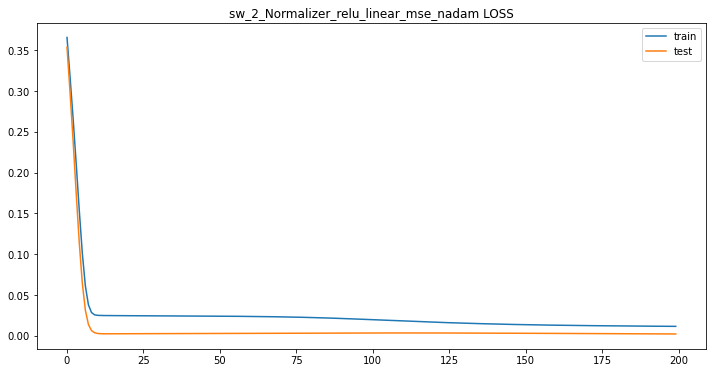


 sw_2_Normalizer_relu_linear_mse_nadam 데이터 비교


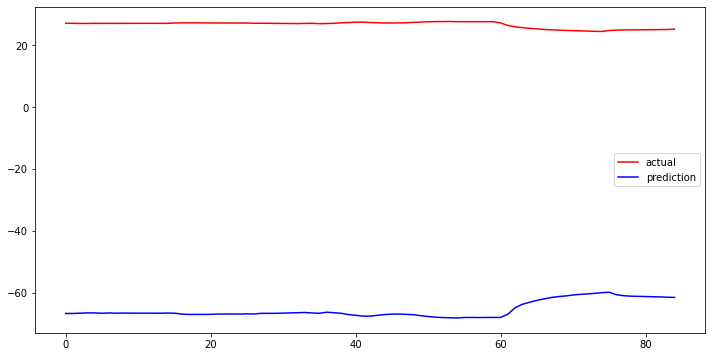

sw_2_Normalizer_relu_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mse_nadam metrics
mean_squared_error : 92.05202439551506
r2_score : -8128.3800360507785
sw_2_Normalizer_relu_linear_mse_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_657"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_657 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_657 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.3679 - acc: 0.0021 - val_loss: 0.4028 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3393 - acc: 0.0021 - val_loss: 0.3711 - val_acc: 0.0000e+00
Epoch 3/200
32/3

Epoch 69/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0225 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0225 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0225 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0225 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0224 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0224 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0224 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0224 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0224 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0223 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0223 - acc: 0.0

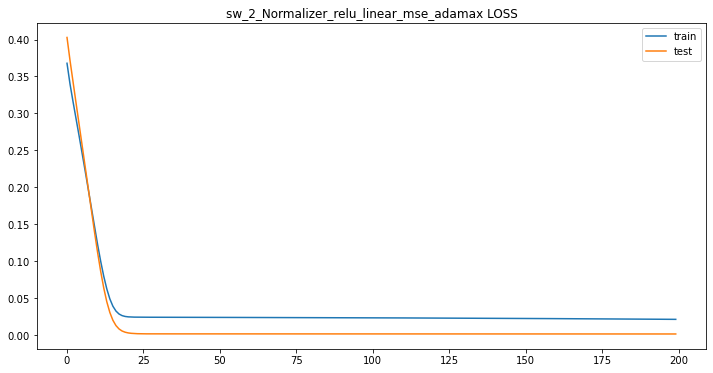


 sw_2_Normalizer_relu_linear_mse_adamax 데이터 비교


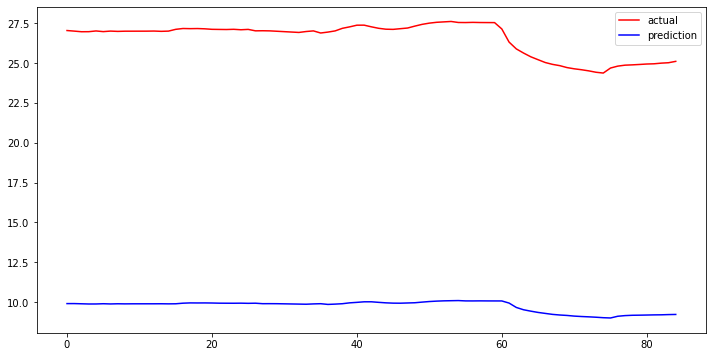

sw_2_Normalizer_relu_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mse_adamax metrics
mean_squared_error : 16.79486815773041
r2_score : -269.6100718334092
sw_2_Normalizer_relu_linear_mse_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_658"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_658 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_658 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.3625 - acc: 0.0021 - val_loss: 0.3692 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3128 - acc: 0.0021 - val_loss: 0.3197 - val_acc: 0.0000e+00
Epoch 3/200
32/3

Epoch 69/200
32/32 - 0s - loss: 0.0234 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0234 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0231 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0229 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0229 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0228 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0227 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0146 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0145 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0144 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0144 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0143 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0142 - acc: 0.0021 - val_loss: 0.0024 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0142 - acc: 0.0021 - val_loss: 0.0024 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0141 - acc: 0.0021 - val_loss: 0.0024 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0140 - acc: 0.0

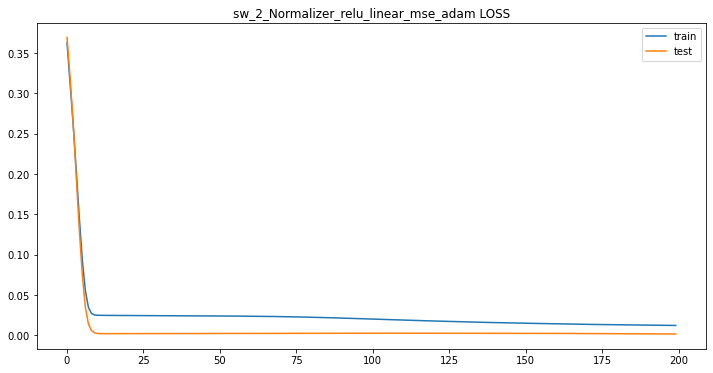


 sw_2_Normalizer_relu_linear_mse_adam 데이터 비교


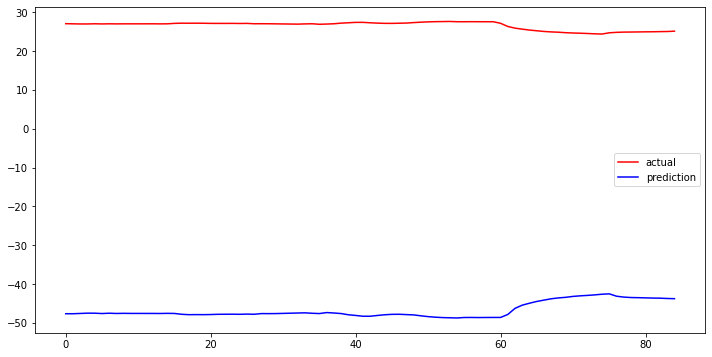

sw_2_Normalizer_relu_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mse_adam metrics
mean_squared_error : 73.3249003792368
r2_score : -5157.147433607243
sw_2_Normalizer_relu_linear_mse_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_659"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_659 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_659 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.3702 - acc: 0.0021 - val_loss: 0.4159 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3659 - acc: 0.0021 - val_loss: 0.4126 - val_acc: 0.0000e+00
Epoch 3/200
32/32 - 

Epoch 69/200
32/32 - 0s - loss: 0.2658 - acc: 0.0021 - val_loss: 0.3219 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.2648 - acc: 0.0021 - val_loss: 0.3211 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.2639 - acc: 0.0021 - val_loss: 0.3202 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.2630 - acc: 0.0021 - val_loss: 0.3193 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.2621 - acc: 0.0021 - val_loss: 0.3185 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.2611 - acc: 0.0021 - val_loss: 0.3177 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.2602 - acc: 0.0021 - val_loss: 0.3168 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.2593 - acc: 0.0021 - val_loss: 0.3160 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.2584 - acc: 0.0021 - val_loss: 0.3152 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.2575 - acc: 0.0021 - val_loss: 0.3144 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.2567 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.1995 - acc: 0.0021 - val_loss: 0.2570 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1988 - acc: 0.0021 - val_loss: 0.2563 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1982 - acc: 0.0021 - val_loss: 0.2556 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1975 - acc: 0.0021 - val_loss: 0.2549 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.1969 - acc: 0.0021 - val_loss: 0.2542 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.1962 - acc: 0.0021 - val_loss: 0.2535 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.1956 - acc: 0.0021 - val_loss: 0.2528 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.1949 - acc: 0.0021 - val_loss: 0.2521 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.1943 - acc: 0.0021 - val_loss: 0.2514 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.1936 - acc: 0.0021 - val_loss: 0.2507 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.1930 - acc: 0.0

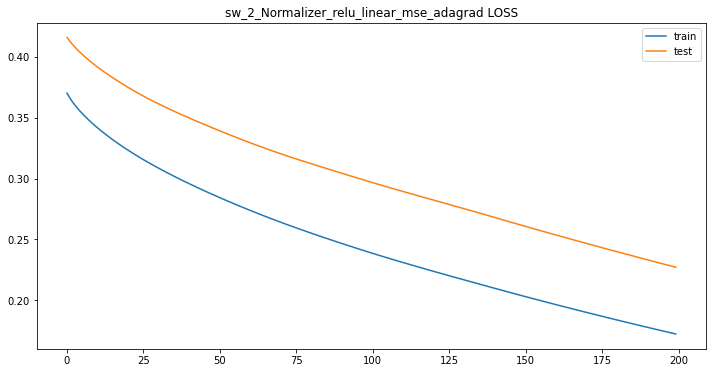


 sw_2_Normalizer_relu_linear_mse_adagrad 데이터 비교


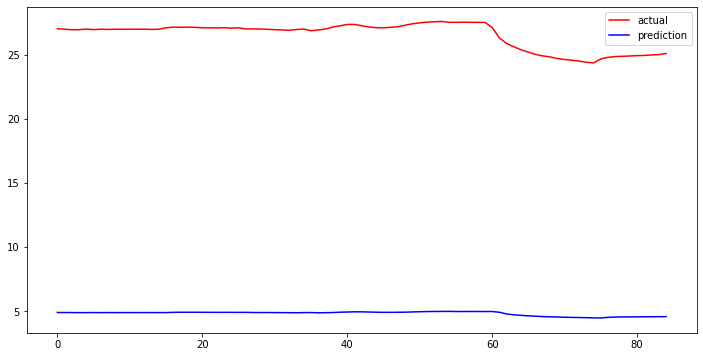

sw_2_Normalizer_relu_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mse_adagrad metrics
mean_squared_error : 21.748730852653722
r2_score : -452.79383499274536
sw_2_Normalizer_relu_linear_mse_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_660"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_660 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_660 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.3293 - acc: 0.0021 - val_loss: 0.3573 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2761 - acc: 0.0021 - val_loss: 0.3072 - val_acc: 0.0000e+00
Epoch 3/

Epoch 69/200
32/32 - 0s - loss: 0.0207 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0206 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0206 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0205 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0204 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0203 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0202 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0201 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0200 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0200 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0199 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0143 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0143 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0142 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0142 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0141 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0141 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0140 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0140 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0140 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0139 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0139 - acc: 0.0

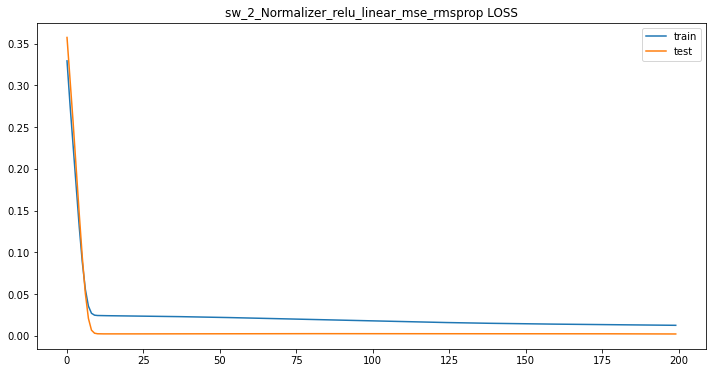


 sw_2_Normalizer_relu_linear_mse_rmsprop 데이터 비교


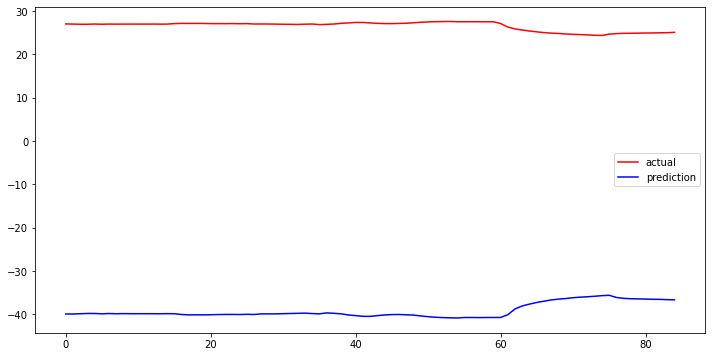

sw_2_Normalizer_relu_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mse_rmsprop metrics
mean_squared_error : 65.73369718274259
r2_score : -4144.40415666312
sw_2_Normalizer_relu_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_661"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_661 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_661 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 4s - loss: 0.3857 - acc: 0.0021 - val_loss: 0.4236 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3687 - acc: 0.0021 - val_loss: 0.4102 - val_acc: 0.0000e+00
Ep

Epoch 69/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0022 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0022 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0232 - acc: 0.0

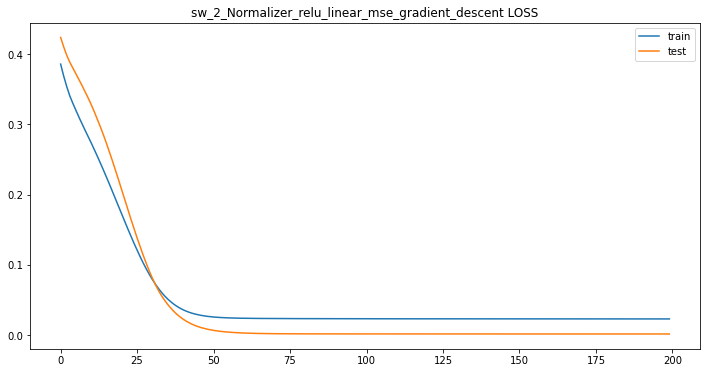


 sw_2_Normalizer_relu_linear_mse_gradient_descent 데이터 비교


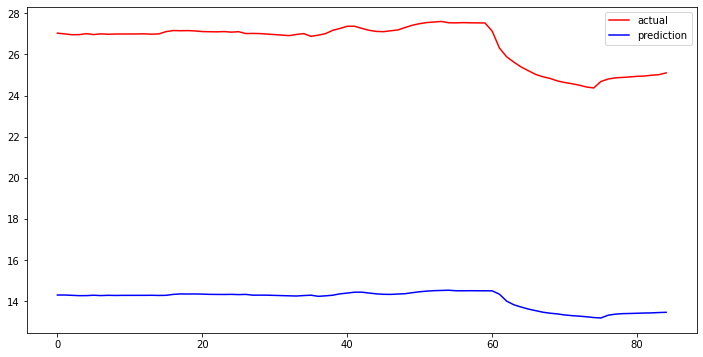

sw_2_Normalizer_relu_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mse_gradient_descent metrics
mean_squared_error : 12.4477938125911
r2_score : -147.6536341652713
sw_2_Normalizer_relu_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_662"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_662 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_662 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.5275 - acc: 0.0021 - val_loss: 0.5467 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4901 - acc: 0.0021 - val_loss: 0.4882 - val_ac

Epoch 69/200
32/32 - 0s - loss: 0.0583 - acc: 0.0021 - val_loss: 0.0305 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0585 - acc: 0.0021 - val_loss: 0.0354 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0585 - acc: 0.0021 - val_loss: 0.0309 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0578 - acc: 0.0021 - val_loss: 0.0347 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0321 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0575 - acc: 0.0021 - val_loss: 0.0335 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0576 - acc: 0.0021 - val_loss: 0.0328 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0574 - acc: 0.0021 - val_loss: 0.0344 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0573 - acc: 0.0021 - val_loss: 0.0326 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0572 - acc: 0.0021 - val_loss: 0.0350 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0572 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0325 - acc: 0.0021 - val_loss: 0.0206 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0319 - acc: 0.0021 - val_loss: 0.0227 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0316 - acc: 0.0021 - val_loss: 0.0225 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0310 - acc: 0.0021 - val_loss: 0.0198 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0306 - acc: 0.0021 - val_loss: 0.0219 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0303 - acc: 0.0021 - val_loss: 0.0212 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0301 - acc: 0.0021 - val_loss: 0.0197 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0298 - acc: 0.0021 - val_loss: 0.0160 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0295 - acc: 0.0021 - val_loss: 0.0162 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0291 - acc: 0.0021 - val_loss: 0.0152 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0281 - acc: 0.0

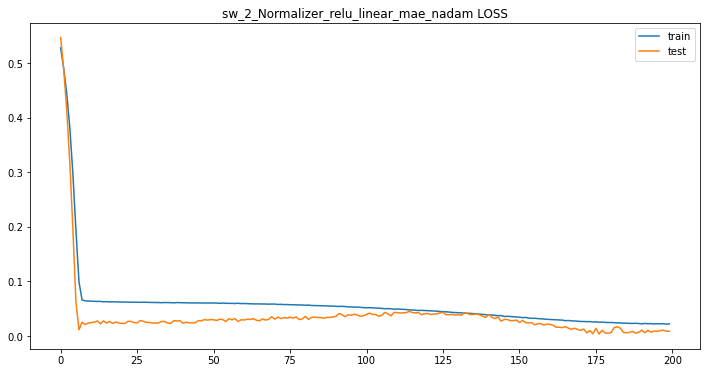


 sw_2_Normalizer_relu_linear_mae_nadam 데이터 비교


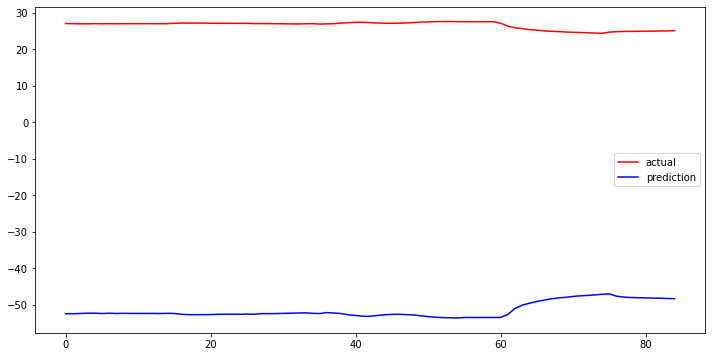

sw_2_Normalizer_relu_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mae_nadam metrics
mean_squared_error : 78.16111665175978
r2_score : -5860.007648556402
sw_2_Normalizer_relu_linear_mae_nadam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_663"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_663 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_663 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.5320 - acc: 0.0021 - val_loss: 0.5769 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5112 - acc: 0.0021 - val_loss: 0.5467 - val_acc: 0.0000e+00
Epoch 3/200
32/32

Epoch 69/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0155 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_loss: 0.0185 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0613 - acc: 0.0021 - val_loss: 0.0172 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0182 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0612 - acc: 0.0021 - val_loss: 0.0166 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_loss: 0.0183 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0612 - acc: 0.0021 - val_loss: 0.0170 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0609 - acc: 0.0021 - val_loss: 0.0175 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_loss: 0.0166 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0609 - acc: 0.0021 - val_loss: 0.0186 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0587 - acc: 0.0021 - val_loss: 0.0175 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0219 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0586 - acc: 0.0021 - val_loss: 0.0183 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0580 - acc: 0.0021 - val_loss: 0.0200 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0582 - acc: 0.0021 - val_loss: 0.0207 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0207 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0583 - acc: 0.0021 - val_loss: 0.0200 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0580 - acc: 0.0021 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0582 - acc: 0.0021 - val_loss: 0.0204 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0582 - acc: 0.0021 - val_loss: 0.0207 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0582 - acc: 0.0

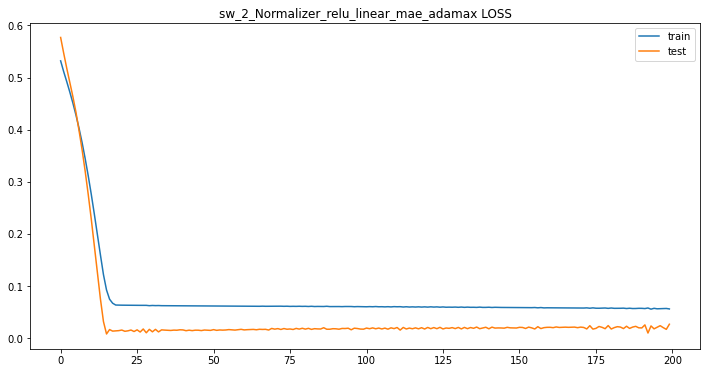


 sw_2_Normalizer_relu_linear_mae_adamax 데이터 비교


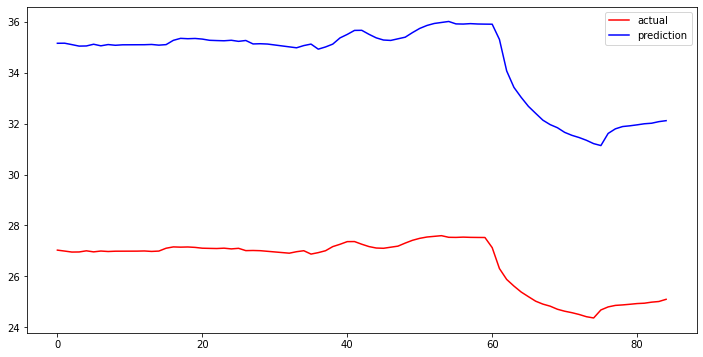

sw_2_Normalizer_relu_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mae_adamax metrics
mean_squared_error : 7.9311822694452125
r2_score : -59.348518373791215
sw_2_Normalizer_relu_linear_mae_adamax이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_664"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_664 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_664 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.5290 - acc: 0.0021 - val_loss: 0.5677 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4907 - acc: 0.0021 - val_loss: 0.5247 - val_acc: 0.0000e+00
Epoch 3/200
32

Epoch 69/200
32/32 - 0s - loss: 0.0632 - acc: 0.0021 - val_loss: 0.0085 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0601 - acc: 0.0021 - val_loss: 0.0326 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0636 - acc: 0.0021 - val_loss: 0.0087 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0592 - acc: 0.0021 - val_loss: 0.0298 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0626 - acc: 0.0021 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0595 - acc: 0.0021 - val_loss: 0.0310 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0624 - acc: 0.0021 - val_loss: 0.0095 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0594 - acc: 0.0021 - val_loss: 0.0315 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0624 - acc: 0.0021 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0321 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0631 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0515 - acc: 0.0021 - val_loss: 0.0293 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0511 - acc: 0.0021 - val_loss: 0.0258 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0496 - acc: 0.0021 - val_loss: 0.0253 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0512 - acc: 0.0021 - val_loss: 0.0330 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0514 - acc: 0.0021 - val_loss: 0.0230 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0490 - acc: 0.0021 - val_loss: 0.0250 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0505 - acc: 0.0021 - val_loss: 0.0305 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0514 - acc: 0.0021 - val_loss: 0.0271 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0491 - acc: 0.0021 - val_loss: 0.0270 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0506 - acc: 0.0021 - val_loss: 0.0321 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0510 - acc: 0.0

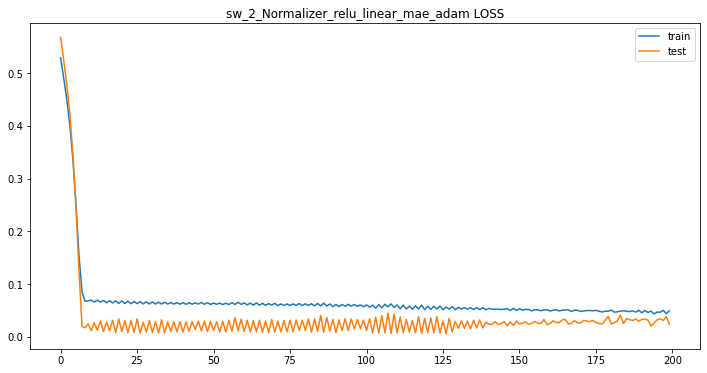


 sw_2_Normalizer_relu_linear_mae_adam 데이터 비교


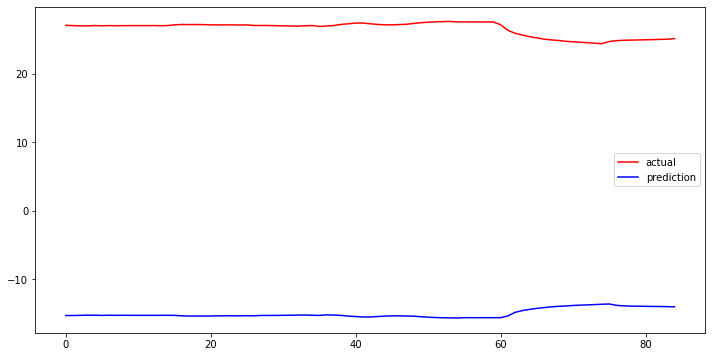

sw_2_Normalizer_relu_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mae_adam metrics
mean_squared_error : 41.54891695339362
r2_score : -1655.1903077664422
sw_2_Normalizer_relu_linear_mae_adam이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_665"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_665 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_665 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 5s - loss: 0.5503 - acc: 0.0021 - val_loss: 0.6222 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5477 - acc: 0.0021 - val_loss: 0.6193 - val_acc: 0.0000e+00
Epoch 3/200
32/32 

Epoch 69/200
32/32 - 0s - loss: 0.4815 - acc: 0.0021 - val_loss: 0.5400 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.4809 - acc: 0.0021 - val_loss: 0.5392 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.4802 - acc: 0.0021 - val_loss: 0.5385 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.4796 - acc: 0.0021 - val_loss: 0.5377 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.4790 - acc: 0.0021 - val_loss: 0.5370 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.4783 - acc: 0.0021 - val_loss: 0.5362 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.4777 - acc: 0.0021 - val_loss: 0.5355 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.4771 - acc: 0.0021 - val_loss: 0.5347 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.4765 - acc: 0.0021 - val_loss: 0.5340 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.4759 - acc: 0.0021 - val_loss: 0.5332 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.4752 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.4296 - acc: 0.0021 - val_loss: 0.4797 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.4290 - acc: 0.0021 - val_loss: 0.4790 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.4284 - acc: 0.0021 - val_loss: 0.4783 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.4278 - acc: 0.0021 - val_loss: 0.4776 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.4272 - acc: 0.0021 - val_loss: 0.4770 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.4267 - acc: 0.0021 - val_loss: 0.4763 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.4261 - acc: 0.0021 - val_loss: 0.4756 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.4255 - acc: 0.0021 - val_loss: 0.4750 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.4249 - acc: 0.0021 - val_loss: 0.4743 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.4243 - acc: 0.0021 - val_loss: 0.4736 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.4237 - acc: 0.0

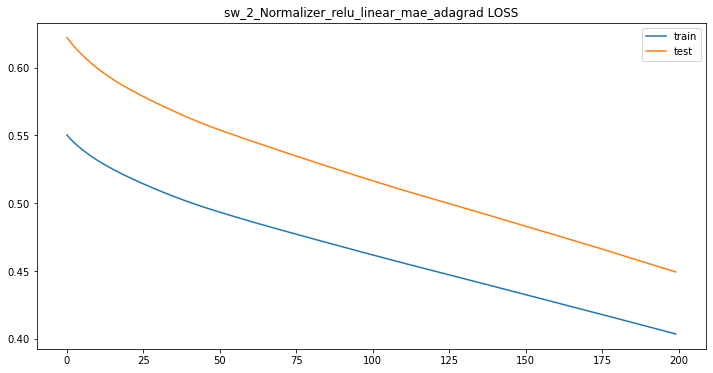


 sw_2_Normalizer_relu_linear_mae_adagrad 데이터 비교


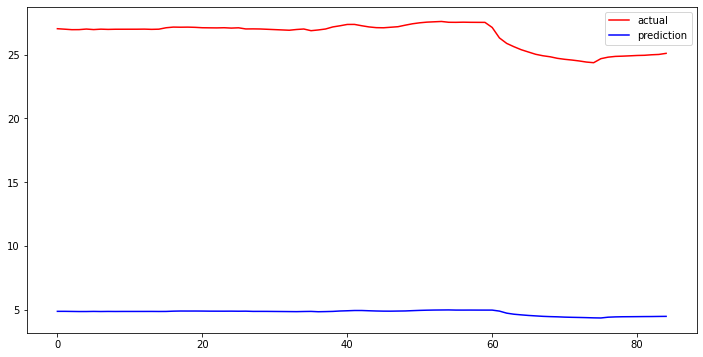

sw_2_Normalizer_relu_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mae_adagrad metrics
mean_squared_error : 21.78009056387744
r2_score : -454.10345502025757
sw_2_Normalizer_relu_linear_mae_adagrad이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_666"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_666 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_666 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 11s - loss: 0.5098 - acc: 0.0021 - val_loss: 0.5570 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4705 - acc: 0.0021 - val_loss: 0.5181 - val_acc: 0.0000e+00
Epoch 3/

Epoch 69/200
32/32 - 0s - loss: 0.0591 - acc: 0.0021 - val_loss: 0.0298 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0589 - acc: 0.0021 - val_loss: 0.0282 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0589 - acc: 0.0021 - val_loss: 0.0325 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0592 - acc: 0.0021 - val_loss: 0.0274 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0588 - acc: 0.0021 - val_loss: 0.0274 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0585 - acc: 0.0021 - val_loss: 0.0292 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0586 - acc: 0.0021 - val_loss: 0.0280 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0585 - acc: 0.0021 - val_loss: 0.0276 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0584 - acc: 0.0021 - val_loss: 0.0306 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0585 - acc: 0.0021 - val_loss: 0.0280 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0584 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0494 - acc: 0.0021 - val_loss: 0.0366 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0494 - acc: 0.0021 - val_loss: 0.0367 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0491 - acc: 0.0021 - val_loss: 0.0376 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0493 - acc: 0.0021 - val_loss: 0.0366 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0490 - acc: 0.0021 - val_loss: 0.0345 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0486 - acc: 0.0021 - val_loss: 0.0364 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0482 - acc: 0.0021 - val_loss: 0.0388 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0490 - acc: 0.0021 - val_loss: 0.0338 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0481 - acc: 0.0021 - val_loss: 0.0380 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0479 - acc: 0.0021 - val_loss: 0.0369 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0477 - acc: 0.0

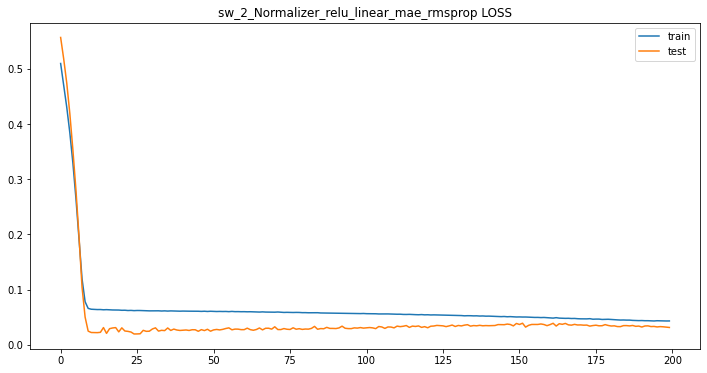


 sw_2_Normalizer_relu_linear_mae_rmsprop 데이터 비교


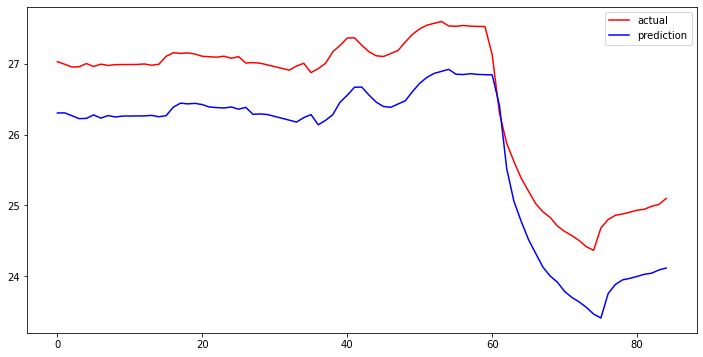

sw_2_Normalizer_relu_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mae_rmsprop metrics
mean_squared_error : 0.7590655948454897
r2_score : 0.44722376079352966
sw_2_Normalizer_relu_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : relu
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_667"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_667 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_667 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.5451 - acc: 0.0021 - val_loss: 0.5957 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5366 - acc: 0.0021 - val_loss: 0.5865 - val_acc: 0.0000e+00

Epoch 69/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0099 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0597 - acc: 0.0021 - val_loss: 0.0096 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0093 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0597 - acc: 0.0021 - val_loss: 0.0089 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0191 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0595 - acc: 0.0021 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0597 - acc: 0.0021 - val_loss: 0.0103 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0100 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0595 - acc: 0.0021 - val_loss: 0.0102 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0097 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0595 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0588 - acc: 0.0021 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0590 - acc: 0.0021 - val_loss: 0.0204 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0589 - acc: 0.0021 - val_loss: 0.0183 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0589 - acc: 0.0021 - val_loss: 0.0211 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0589 - acc: 0.0021 - val_loss: 0.0195 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0590 - acc: 0.0021 - val_loss: 0.0191 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0589 - acc: 0.0021 - val_loss: 0.0189 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0588 - acc: 0.0021 - val_loss: 0.0217 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0588 - acc: 0.0021 - val_loss: 0.0183 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0589 - acc: 0.0021 - val_loss: 0.0209 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0588 - acc: 0.0

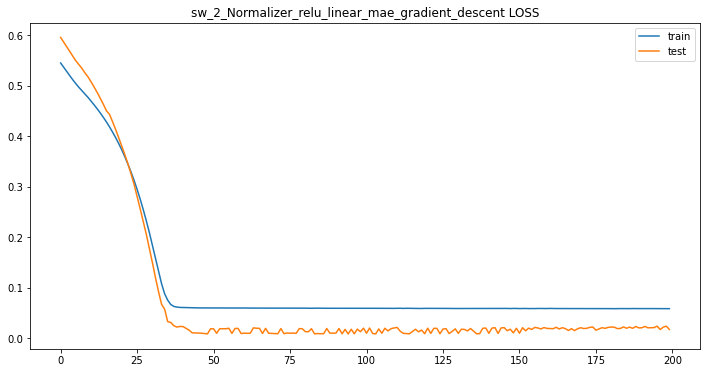


 sw_2_Normalizer_relu_linear_mae_gradient_descent 데이터 비교


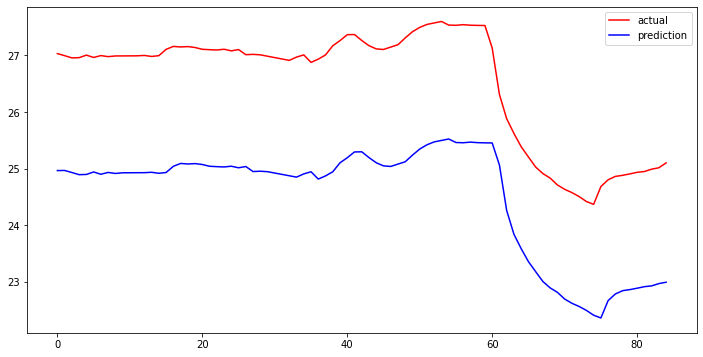

sw_2_Normalizer_relu_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_Normalizer_relu_linear_mae_gradient_descent metrics
mean_squared_error : 2.038326554472977
r2_score : -2.986009231490466
sw_2_Normalizer_relu_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_668"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_668 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_668 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.3484 - acc: 0.0021 - val_loss: 0.3590 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3013 - acc: 0.0021 - val_loss: 0.3067 -

Epoch 69/200
32/32 - 0s - loss: 0.0228 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0227 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0226 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0225 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0224 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0223 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0222 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0221 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0220 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0218 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0217 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0128 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0127 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0127 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0126 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0125 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0125 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0125 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0124 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0124 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0123 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0123 - acc: 0.0

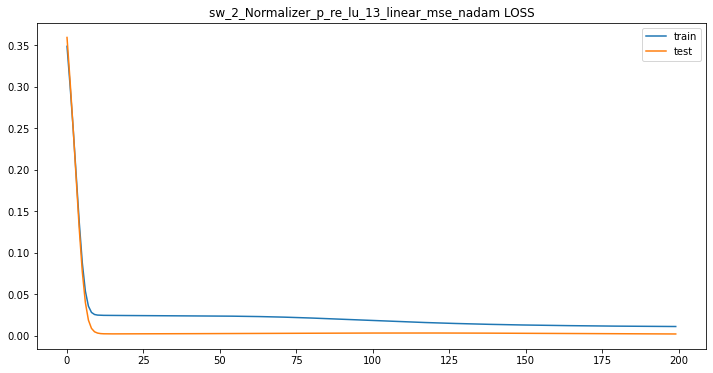


 sw_2_Normalizer_p_re_lu_13_linear_mse_nadam 데이터 비교


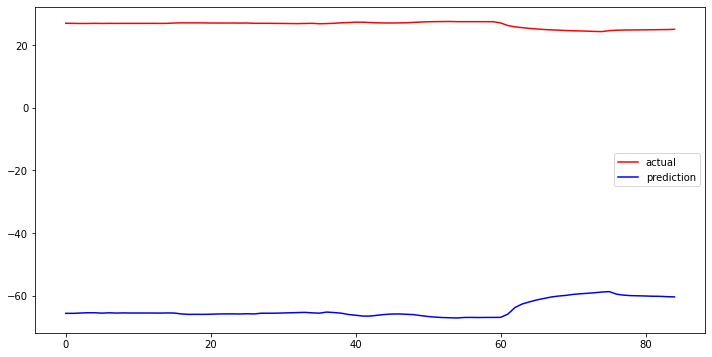

sw_2_Normalizer_p_re_lu_13_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mse_nadam metrics
mean_squared_error : 91.03719299172454
r2_score : -7950.123696721352
sw_2_Normalizer_p_re_lu_13_linear_mse_nadam이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_669"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_669 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_669 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.3873 - acc: 0.0021 - val_loss: 0.4282 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3586 - acc: 0.0021 - val_loss: 0.4047 - val_acc: 0.00

Epoch 69/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0220 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0220 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0219 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0219 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0219 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0218 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0218 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0218 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0217 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0217 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0217 - acc: 0.0

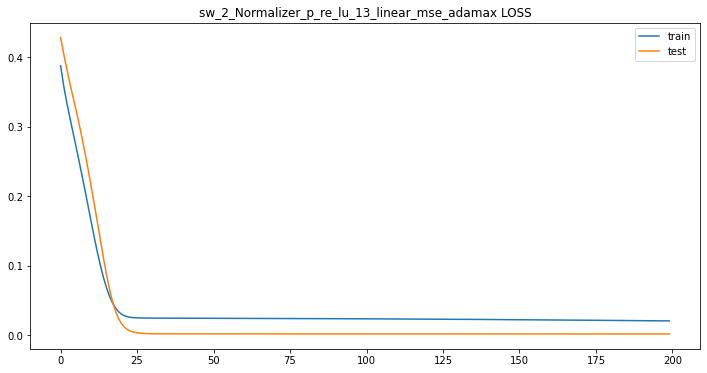


 sw_2_Normalizer_p_re_lu_13_linear_mse_adamax 데이터 비교


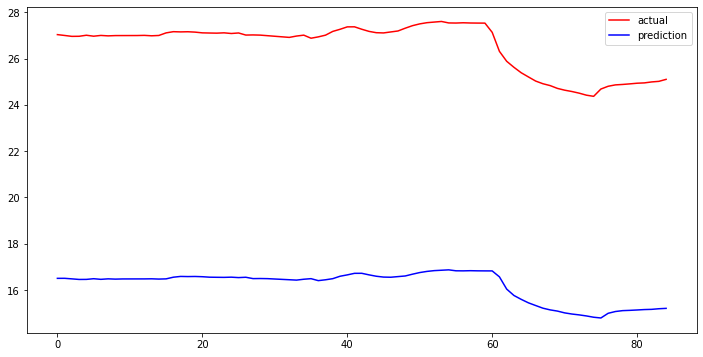

sw_2_Normalizer_p_re_lu_13_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mse_adamax metrics
mean_squared_error : 10.342566477207155
r2_score : -101.62362848552367
sw_2_Normalizer_p_re_lu_13_linear_mse_adamax이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_670"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_670 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_670 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.3573 - acc: 0.0021 - val_loss: 0.3419 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3117 - acc: 0.0021 - val_loss: 0.2849 - val_acc: 0

Epoch 69/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0235 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0235 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0234 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0234 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0232 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0152 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0151 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0150 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0149 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0149 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0148 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0146 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0145 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0145 - acc: 0.0

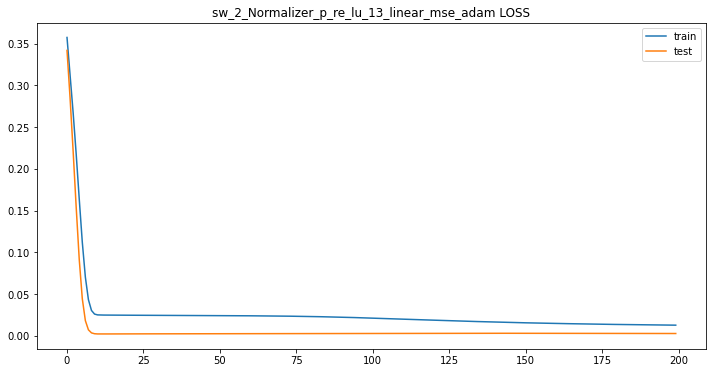


 sw_2_Normalizer_p_re_lu_13_linear_mse_adam 데이터 비교


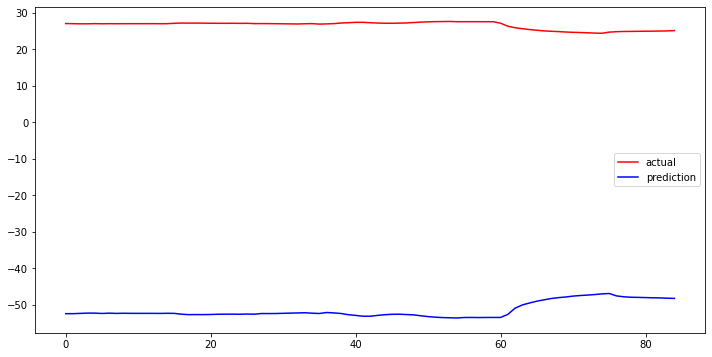

sw_2_Normalizer_p_re_lu_13_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mse_adam metrics
mean_squared_error : 78.02148454612518
r2_score : -5839.085213289915
sw_2_Normalizer_p_re_lu_13_linear_mse_adam이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_671"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_671 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_671 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.3580 - acc: 0.0021 - val_loss: 0.4248 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3533 - acc: 0.0021 - val_loss: 0.4221 - val_acc: 0.0000

Epoch 69/200
32/32 - 0s - loss: 0.2551 - acc: 0.0021 - val_loss: 0.3478 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.2541 - acc: 0.0021 - val_loss: 0.3468 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.2531 - acc: 0.0021 - val_loss: 0.3459 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.2522 - acc: 0.0021 - val_loss: 0.3449 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.2512 - acc: 0.0021 - val_loss: 0.3440 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.2502 - acc: 0.0021 - val_loss: 0.3431 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.2493 - acc: 0.0021 - val_loss: 0.3422 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.2483 - acc: 0.0021 - val_loss: 0.3413 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.2474 - acc: 0.0021 - val_loss: 0.3404 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.2465 - acc: 0.0021 - val_loss: 0.3395 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.2455 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.1877 - acc: 0.0021 - val_loss: 0.2805 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.1871 - acc: 0.0021 - val_loss: 0.2798 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.1865 - acc: 0.0021 - val_loss: 0.2791 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.1858 - acc: 0.0021 - val_loss: 0.2784 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.1852 - acc: 0.0021 - val_loss: 0.2777 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.1846 - acc: 0.0021 - val_loss: 0.2770 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.1839 - acc: 0.0021 - val_loss: 0.2763 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.1833 - acc: 0.0021 - val_loss: 0.2756 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.1827 - acc: 0.0021 - val_loss: 0.2749 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.1821 - acc: 0.0021 - val_loss: 0.2742 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.1814 - acc: 0.0

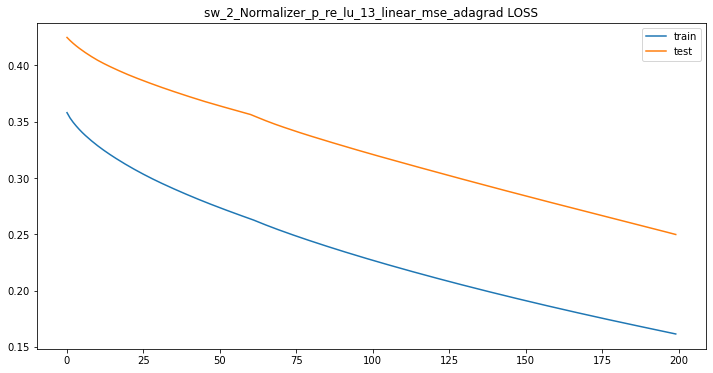


 sw_2_Normalizer_p_re_lu_13_linear_mse_adagrad 데이터 비교


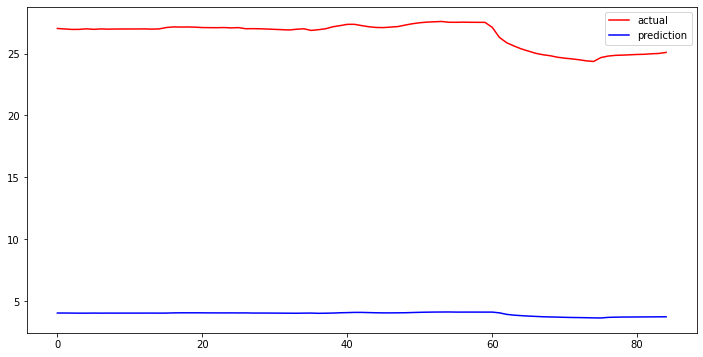

sw_2_Normalizer_p_re_lu_13_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mse_adagrad metrics
mean_squared_error : 22.598038768910275
r2_score : -488.9279581434279
sw_2_Normalizer_p_re_lu_13_linear_mse_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_672"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_672 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_672 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.3313 - acc: 0.0021 - val_loss: 0.3552 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2805 - acc: 0.0021 - val_loss: 0.3067 - val_a

Epoch 69/200
32/32 - 0s - loss: 0.0207 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0206 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0206 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0205 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0204 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0203 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0202 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0202 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0201 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0200 - acc: 0.0021 - val_loss: 0.0026 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0199 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0148 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0148 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0147 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0146 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0146 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0146 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0145 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0145 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0145 - acc: 0.0021 - val_loss: 0.0029 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0144 - acc: 0.0

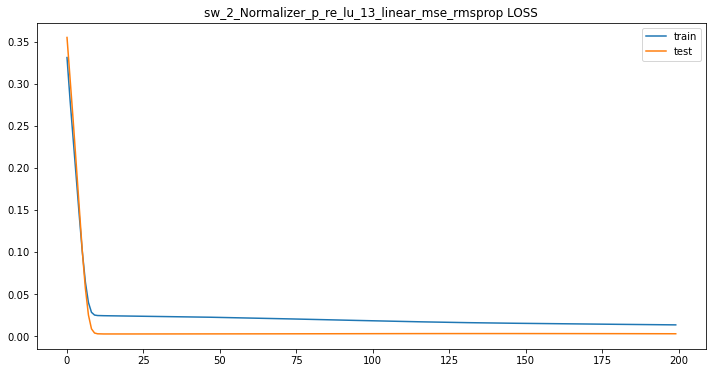


 sw_2_Normalizer_p_re_lu_13_linear_mse_rmsprop 데이터 비교


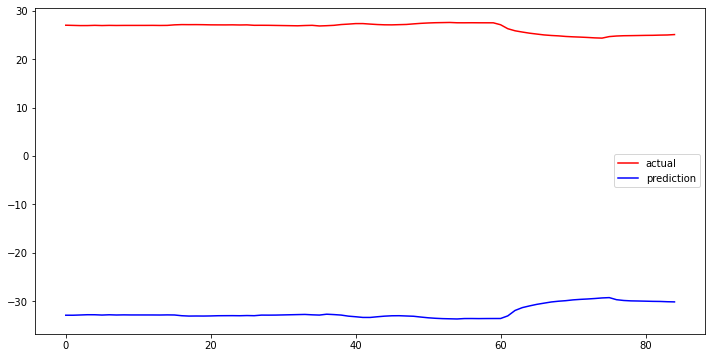

sw_2_Normalizer_p_re_lu_13_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mse_rmsprop metrics
mean_squared_error : 58.82622631398134
r2_score : -3318.9594903404873
sw_2_Normalizer_p_re_lu_13_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_673"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_673 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_673 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.3871 - acc: 0.0021 - val_loss: 0.3996 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3684 - acc: 0.0021 - val_loss: 0.385

Epoch 69/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0022 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0022 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0019 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0233 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0233 - acc: 0.0

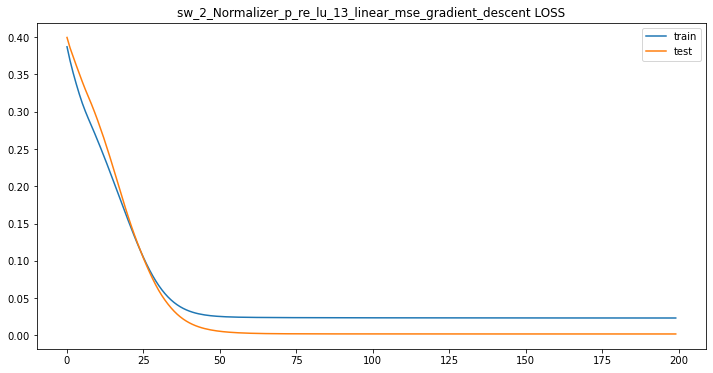


 sw_2_Normalizer_p_re_lu_13_linear_mse_gradient_descent 데이터 비교


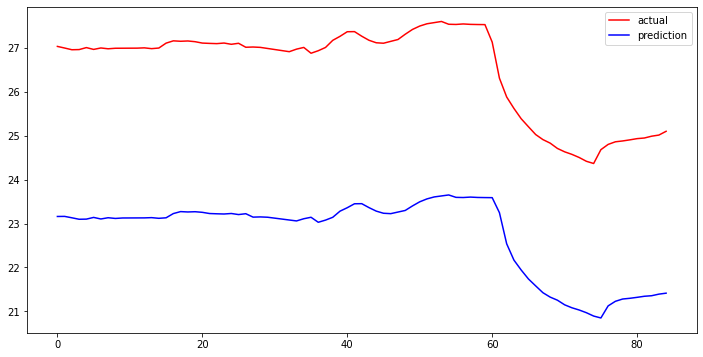

sw_2_Normalizer_p_re_lu_13_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mse_gradient_descent metrics
mean_squared_error : 3.7897114306178983
r2_score : -12.778533648697305
sw_2_Normalizer_p_re_lu_13_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_674"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_674 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_674 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.5249 - acc: 0.0021 - val_loss: 0.5631 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4912 - acc: 0.0021

32/32 - 0s - loss: 0.0576 - acc: 0.0021 - val_loss: 0.0277 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0576 - acc: 0.0021 - val_loss: 0.0297 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0577 - acc: 0.0021 - val_loss: 0.0301 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0575 - acc: 0.0021 - val_loss: 0.0256 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0568 - acc: 0.0021 - val_loss: 0.0288 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0568 - acc: 0.0021 - val_loss: 0.0285 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0563 - acc: 0.0021 - val_loss: 0.0283 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0559 - acc: 0.0021 - val_loss: 0.0312 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0560 - acc: 0.0021 - val_loss: 0.0319 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0559 - acc: 0.0021 - val_loss: 0.0312 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0556 - acc: 0.0021 - val_loss: 0.0301 -

Epoch 155/200
32/32 - 0s - loss: 0.0267 - acc: 0.0021 - val_loss: 0.0204 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0265 - acc: 0.0021 - val_loss: 0.0175 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0259 - acc: 0.0021 - val_loss: 0.0166 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0256 - acc: 0.0021 - val_loss: 0.0166 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0258 - acc: 0.0021 - val_loss: 0.0150 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0262 - acc: 0.0021 - val_loss: 0.0140 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0257 - acc: 0.0021 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0251 - acc: 0.0021 - val_loss: 0.0142 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0253 - acc: 0.0021 - val_loss: 0.0108 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0250 - acc: 0.0021 - val_loss: 0.0114 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0248 - acc: 0.0

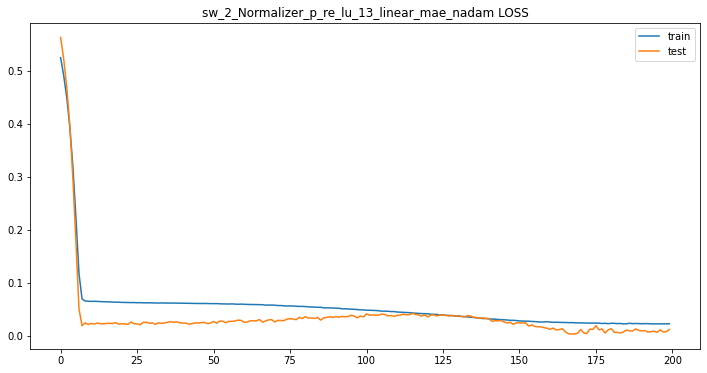


 sw_2_Normalizer_p_re_lu_13_linear_mae_nadam 데이터 비교


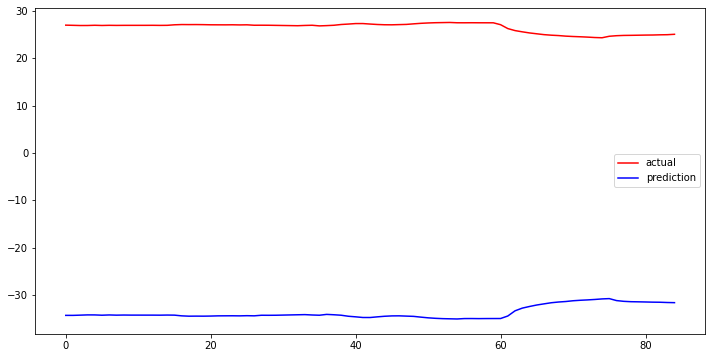

sw_2_Normalizer_p_re_lu_13_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mae_nadam metrics
mean_squared_error : 60.29424513246476
r2_score : -3486.726959864593
sw_2_Normalizer_p_re_lu_13_linear_mae_nadam이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_675"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_675 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_675 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.5488 - acc: 0.0021 - val_loss: 0.5863 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5266 - acc: 0.0021 - val_loss: 0.5683 - val_acc: 0.00

Epoch 69/200
32/32 - 0s - loss: 0.0609 - acc: 0.0021 - val_loss: 0.0156 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0608 - acc: 0.0021 - val_loss: 0.0157 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0608 - acc: 0.0021 - val_loss: 0.0163 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0608 - acc: 0.0021 - val_loss: 0.0155 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0607 - acc: 0.0021 - val_loss: 0.0156 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0607 - acc: 0.0021 - val_loss: 0.0158 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0607 - acc: 0.0021 - val_loss: 0.0152 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0162 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0606 - acc: 0.0021 - val_loss: 0.0157 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0153 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0572 - acc: 0.0021 - val_loss: 0.0200 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0575 - acc: 0.0021 - val_loss: 0.0179 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0572 - acc: 0.0021 - val_loss: 0.0191 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0572 - acc: 0.0021 - val_loss: 0.0176 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0570 - acc: 0.0021 - val_loss: 0.0201 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0574 - acc: 0.0021 - val_loss: 0.0185 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0569 - acc: 0.0021 - val_loss: 0.0199 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0570 - acc: 0.0021 - val_loss: 0.0186 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0570 - acc: 0.0021 - val_loss: 0.0191 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0570 - acc: 0.0021 - val_loss: 0.0185 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0568 - acc: 0.0

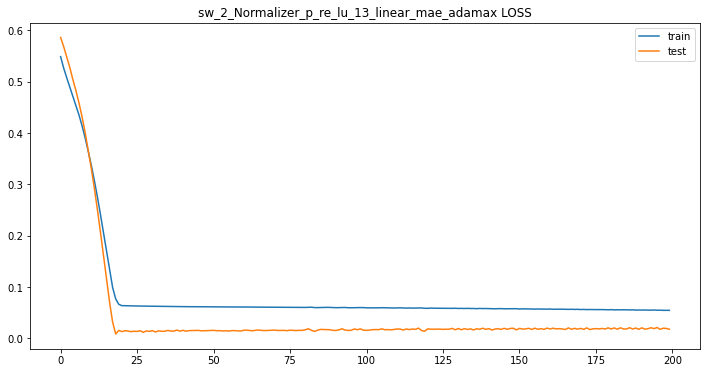


 sw_2_Normalizer_p_re_lu_13_linear_mae_adamax 데이터 비교


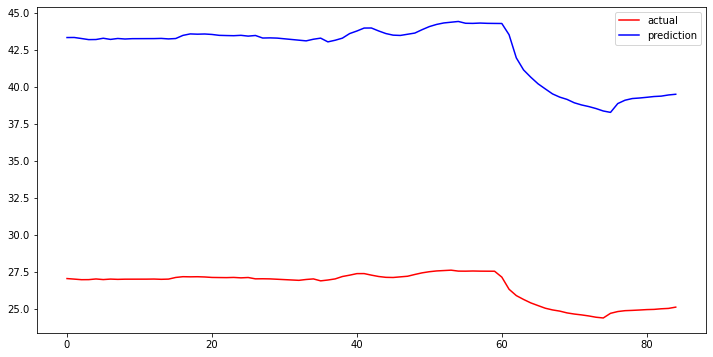

sw_2_Normalizer_p_re_lu_13_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mae_adamax metrics
mean_squared_error : 15.930129557224603
r2_score : -242.4609820797103
sw_2_Normalizer_p_re_lu_13_linear_mae_adamax이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_676"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_676 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_676 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.5225 - acc: 0.0021 - val_loss: 0.5521 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4829 - acc: 0.0021 - val_loss: 0.5045 - val_acc: 0

Epoch 69/200
32/32 - 0s - loss: 0.0603 - acc: 0.0021 - val_loss: 0.0327 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0647 - acc: 0.0021 - val_loss: 0.0106 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0607 - acc: 0.0021 - val_loss: 0.0390 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0653 - acc: 0.0021 - val_loss: 0.0100 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0335 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0635 - acc: 0.0021 - val_loss: 0.0096 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0602 - acc: 0.0021 - val_loss: 0.0316 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0630 - acc: 0.0021 - val_loss: 0.0094 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0599 - acc: 0.0021 - val_loss: 0.0312 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0630 - acc: 0.0021 - val_loss: 0.0105 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0515 - acc: 0.0021 - val_loss: 0.0241 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0515 - acc: 0.0021 - val_loss: 0.0280 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0520 - acc: 0.0021 - val_loss: 0.0284 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0523 - acc: 0.0021 - val_loss: 0.0260 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0515 - acc: 0.0021 - val_loss: 0.0255 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0505 - acc: 0.0021 - val_loss: 0.0262 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0516 - acc: 0.0021 - val_loss: 0.0297 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0521 - acc: 0.0021 - val_loss: 0.0305 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0524 - acc: 0.0021 - val_loss: 0.0242 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0491 - acc: 0.0021 - val_loss: 0.0231 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0499 - acc: 0.0

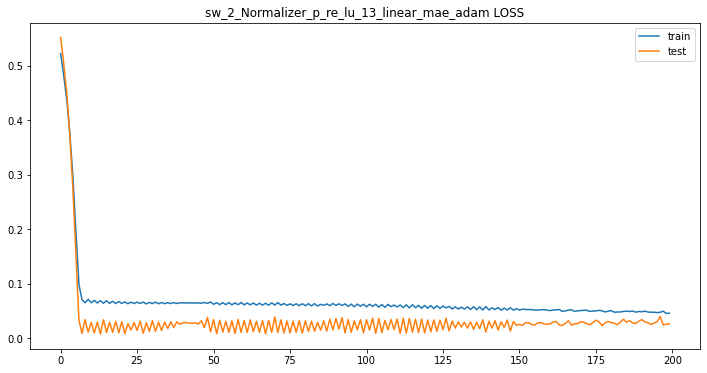


 sw_2_Normalizer_p_re_lu_13_linear_mae_adam 데이터 비교


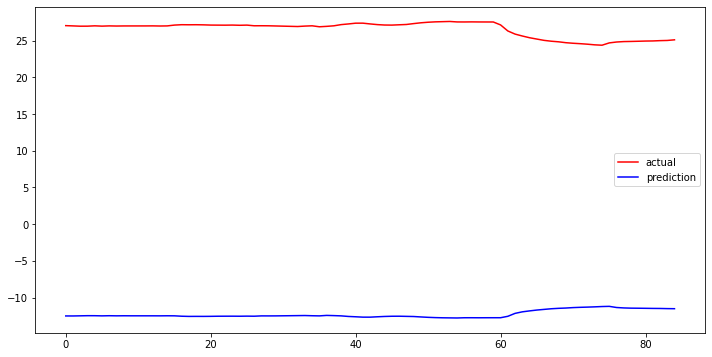

sw_2_Normalizer_p_re_lu_13_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mae_adam metrics
mean_squared_error : 38.84335717319468
r2_score : -1446.5189944097951
sw_2_Normalizer_p_re_lu_13_linear_mae_adam이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_677"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_677 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_677 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 4s - loss: 0.5373 - acc: 0.0021 - val_loss: 0.5778 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5341 - acc: 0.0021 - val_loss: 0.5764 - val_acc: 0.000

Epoch 69/200
32/32 - 0s - loss: 0.4572 - acc: 0.0021 - val_loss: 0.5080 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.4564 - acc: 0.0021 - val_loss: 0.5071 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.4556 - acc: 0.0021 - val_loss: 0.5063 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.4548 - acc: 0.0021 - val_loss: 0.5055 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.4541 - acc: 0.0021 - val_loss: 0.5047 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.4533 - acc: 0.0021 - val_loss: 0.5039 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.4526 - acc: 0.0021 - val_loss: 0.5031 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.4518 - acc: 0.0021 - val_loss: 0.5023 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.4511 - acc: 0.0021 - val_loss: 0.5015 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.4503 - acc: 0.0021 - val_loss: 0.5007 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.4496 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.3942 - acc: 0.0021 - val_loss: 0.4397 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.3935 - acc: 0.0021 - val_loss: 0.4390 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.3927 - acc: 0.0021 - val_loss: 0.4382 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.3920 - acc: 0.0021 - val_loss: 0.4374 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.3913 - acc: 0.0021 - val_loss: 0.4366 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.3906 - acc: 0.0021 - val_loss: 0.4359 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.3899 - acc: 0.0021 - val_loss: 0.4351 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.3892 - acc: 0.0021 - val_loss: 0.4343 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.3885 - acc: 0.0021 - val_loss: 0.4335 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.3877 - acc: 0.0021 - val_loss: 0.4328 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.3870 - acc: 0.0

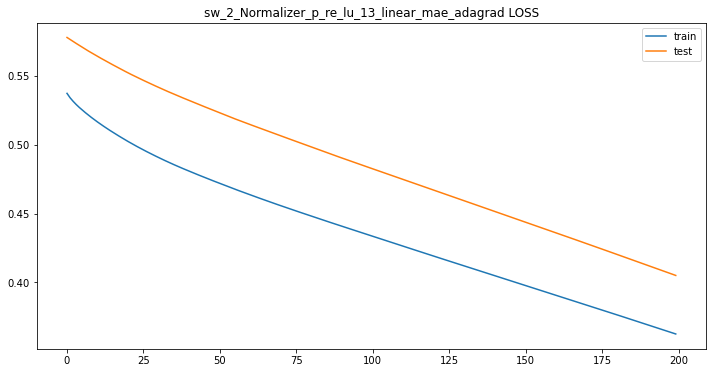


 sw_2_Normalizer_p_re_lu_13_linear_mae_adagrad 데이터 비교


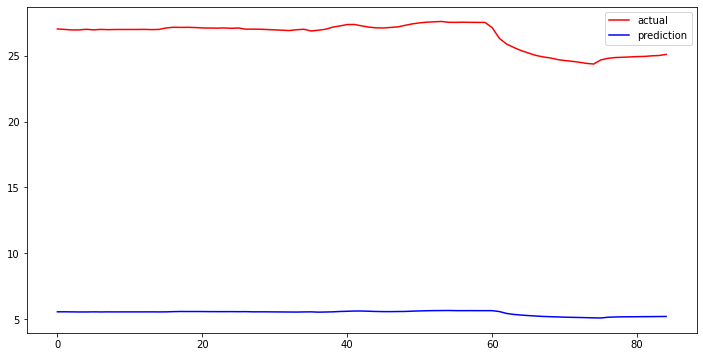

sw_2_Normalizer_p_re_lu_13_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mae_adagrad metrics
mean_squared_error : 21.0922930631109
r2_score : -425.8136971515413
sw_2_Normalizer_p_re_lu_13_linear_mae_adagrad이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_678"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_678 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_678 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.5201 - acc: 0.0021 - val_loss: 0.5530 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4804 - acc: 0.0021 - val_loss: 0.5034 - val_acc

Epoch 69/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0320 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0324 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0316 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0580 - acc: 0.0021 - val_loss: 0.0332 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0317 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0576 - acc: 0.0021 - val_loss: 0.0331 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0284 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0574 - acc: 0.0021 - val_loss: 0.0318 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0577 - acc: 0.0021 - val_loss: 0.0315 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0571 - acc: 0.0021 - val_loss: 0.0333 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0577 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0471 - acc: 0.0021 - val_loss: 0.0308 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0474 - acc: 0.0021 - val_loss: 0.0292 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0468 - acc: 0.0021 - val_loss: 0.0309 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0473 - acc: 0.0021 - val_loss: 0.0283 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0468 - acc: 0.0021 - val_loss: 0.0326 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0468 - acc: 0.0021 - val_loss: 0.0329 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0464 - acc: 0.0021 - val_loss: 0.0319 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0465 - acc: 0.0021 - val_loss: 0.0292 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0462 - acc: 0.0021 - val_loss: 0.0316 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0462 - acc: 0.0021 - val_loss: 0.0321 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0458 - acc: 0.0

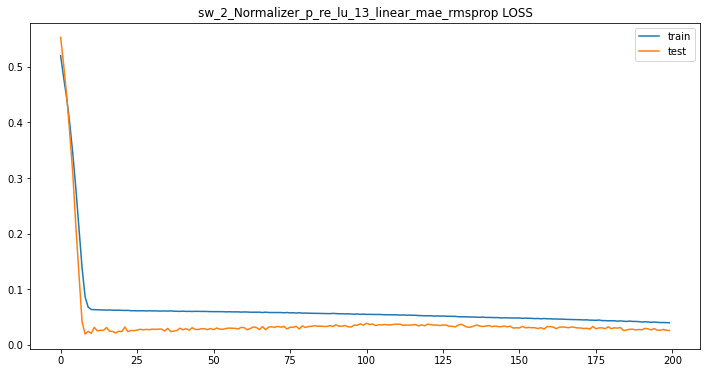


 sw_2_Normalizer_p_re_lu_13_linear_mae_rmsprop 데이터 비교


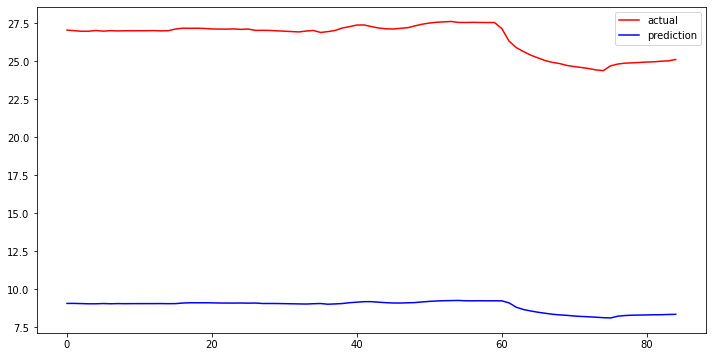

sw_2_Normalizer_p_re_lu_13_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mae_rmsprop metrics
mean_squared_error : 17.65304520140399
r2_score : -297.9716313156119
sw_2_Normalizer_p_re_lu_13_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : p_re_lu_13
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_679"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_679 (LSTM)              (None, 1, 60)             15180     
_________________________________________________________________
dense_679 (Dense)            (None, 1, 1)              61        
Total params: 15,241
Trainable params: 15,241
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 10s - loss: 0.5487 - acc: 0.0021 - val_loss: 0.6158 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5394 - acc: 0.0021 - val_loss: 0.601

Epoch 69/200
32/32 - 0s - loss: 0.0599 - acc: 0.0021 - val_loss: 0.0186 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0599 - acc: 0.0021 - val_loss: 0.0210 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0597 - acc: 0.0021 - val_loss: 0.0207 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0597 - acc: 0.0021 - val_loss: 0.0191 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0598 - acc: 0.0021 - val_loss: 0.0187 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0597 - acc: 0.0021 - val_loss: 0.0203 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0179 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0597 - acc: 0.0021 - val_loss: 0.0215 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0181 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_loss: 0.0208 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0596 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0590 - acc: 0.0021 - val_loss: 0.0251 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0590 - acc: 0.0021 - val_loss: 0.0225 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0590 - acc: 0.0021 - val_loss: 0.0251 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0590 - acc: 0.0021 - val_loss: 0.0260 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0591 - acc: 0.0021 - val_loss: 0.0253 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0590 - acc: 0.0021 - val_loss: 0.0262 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0591 - acc: 0.0021 - val_loss: 0.0235 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0589 - acc: 0.0021 - val_loss: 0.0242 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0588 - acc: 0.0021 - val_loss: 0.0248 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0590 - acc: 0.0021 - val_loss: 0.0254 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0590 - acc: 0.0

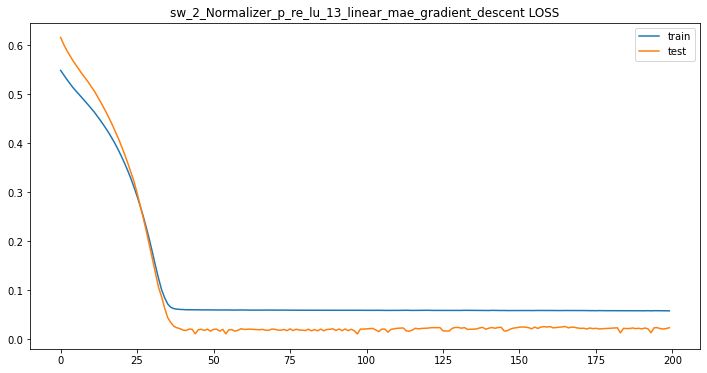


 sw_2_Normalizer_p_re_lu_13_linear_mae_gradient_descent 데이터 비교


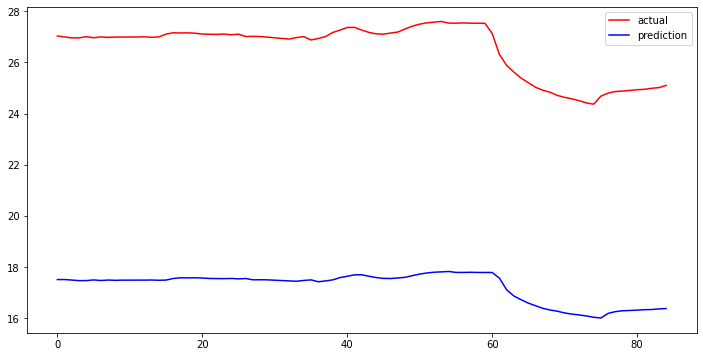

sw_2_Normalizer_p_re_lu_13_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_Normalizer_p_re_lu_13_linear_mae_gradient_descent metrics
mean_squared_error : 9.303575169003203
r2_score : -82.04060615417225
sw_2_Normalizer_p_re_lu_13_linear_mae_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mse
optimizer : nadam
Model: "sequential_680"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_680 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_680 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.3651 - acc: 0.0021 - val_loss: 0.3946 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3196 - acc: 0.002

32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0027 -

Epoch 155/200
32/32 - 0s - loss: 0.0172 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0171 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0170 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0169 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0168 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0167 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0166 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0165 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0164 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0163 - acc: 0.0021 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0162 - acc: 0.0

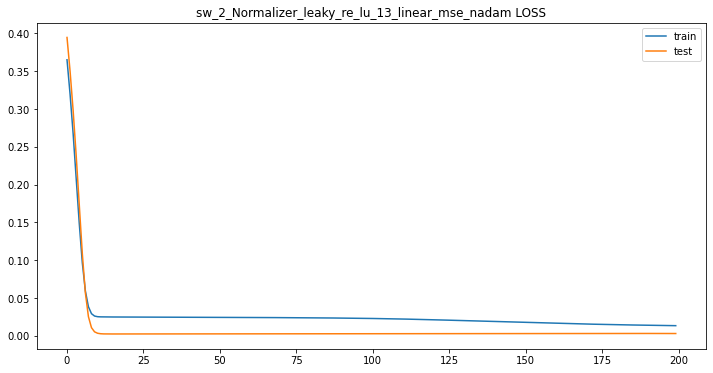


 sw_2_Normalizer_leaky_re_lu_13_linear_mse_nadam 데이터 비교


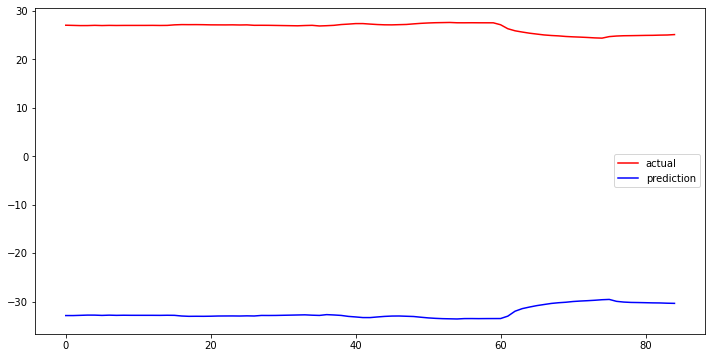

sw_2_Normalizer_leaky_re_lu_13_linear_mse_nadam model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mse_nadam metrics
mean_squared_error : 58.88280990861743
r2_score : -3325.349046191431
sw_2_Normalizer_leaky_re_lu_13_linear_mse_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mse
optimizer : adamax
Model: "sequential_681"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_681 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_681 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 4s - loss: 0.3462 - acc: 0.0021 - val_loss: 0.3639 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3142 - acc: 0.0021 - val_loss: 0.3336

Epoch 69/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0231 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0231 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0230 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0229 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0229 - acc: 0.0021 - val_loss: 0.0017 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0229 - acc: 0.0

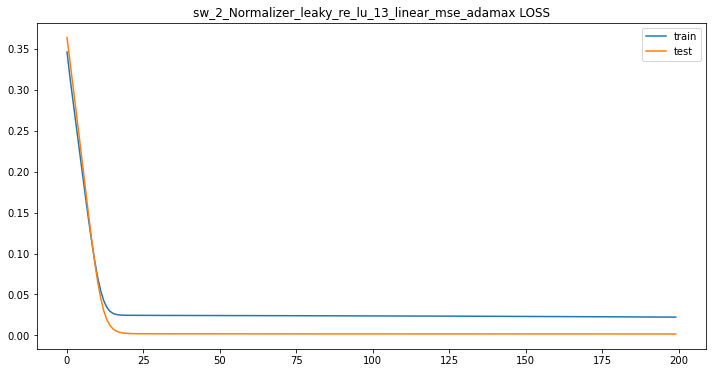


 sw_2_Normalizer_leaky_re_lu_13_linear_mse_adamax 데이터 비교


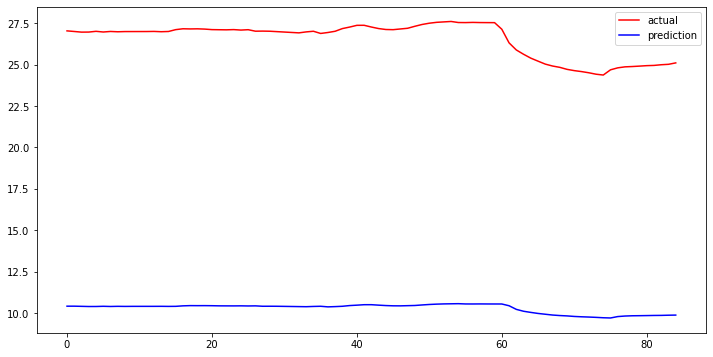

sw_2_Normalizer_leaky_re_lu_13_linear_mse_adamax model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mse_adamax metrics
mean_squared_error : 16.267877223095308
r2_score : -252.89401347644014
sw_2_Normalizer_leaky_re_lu_13_linear_mse_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mse
optimizer : adam
Model: "sequential_682"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_682 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_682 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.3470 - acc: 0.0021 - val_loss: 0.3733 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2958 - acc: 0.0021 - val_loss: 0.3

Epoch 69/200
32/32 - 0s - loss: 0.0242 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0242 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0240 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0186 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0185 - acc: 0.0021 - val_loss: 0.0030 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0184 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0183 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0183 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0182 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0181 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0180 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0179 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0178 - acc: 0.0021 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0177 - acc: 0.0

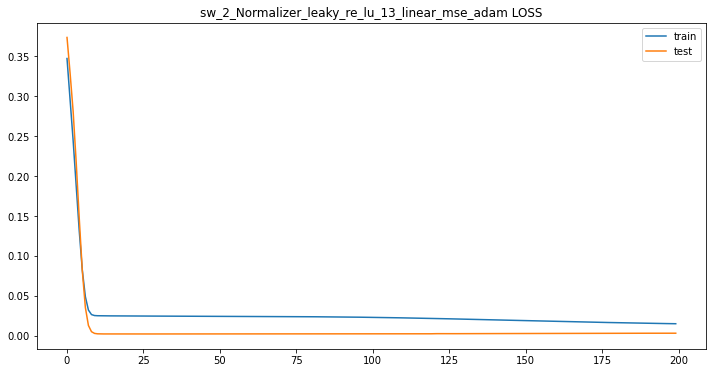


 sw_2_Normalizer_leaky_re_lu_13_linear_mse_adam 데이터 비교


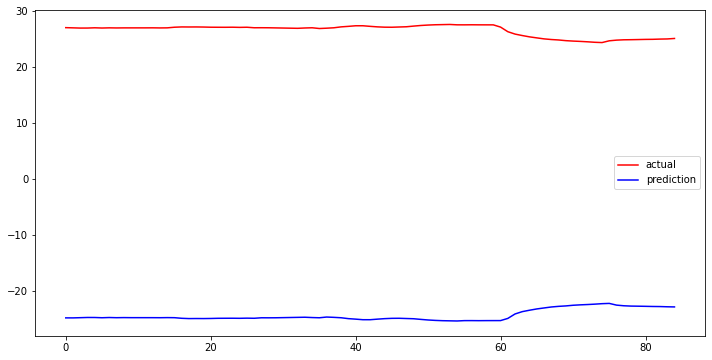

sw_2_Normalizer_leaky_re_lu_13_linear_mse_adam model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mse_adam metrics
mean_squared_error : 50.9333131906626
r2_score : -2487.8264815083226
sw_2_Normalizer_leaky_re_lu_13_linear_mse_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mse
optimizer : adagrad
Model: "sequential_683"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_683 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_683 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 8s - loss: 0.3833 - acc: 0.0021 - val_loss: 0.4355 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3787 - acc: 0.0021 - val_loss: 0.4316 -

Epoch 69/200
32/32 - 0s - loss: 0.2816 - acc: 0.0021 - val_loss: 0.3350 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.2808 - acc: 0.0021 - val_loss: 0.3341 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.2799 - acc: 0.0021 - val_loss: 0.3332 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.2790 - acc: 0.0021 - val_loss: 0.3322 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.2782 - acc: 0.0021 - val_loss: 0.3313 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.2773 - acc: 0.0021 - val_loss: 0.3304 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.2765 - acc: 0.0021 - val_loss: 0.3295 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.2756 - acc: 0.0021 - val_loss: 0.3286 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.2748 - acc: 0.0021 - val_loss: 0.3277 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.2739 - acc: 0.0021 - val_loss: 0.3269 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.2731 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.2166 - acc: 0.0021 - val_loss: 0.2654 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.2160 - acc: 0.0021 - val_loss: 0.2646 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.2153 - acc: 0.0021 - val_loss: 0.2639 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.2146 - acc: 0.0021 - val_loss: 0.2631 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.2140 - acc: 0.0021 - val_loss: 0.2623 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.2133 - acc: 0.0021 - val_loss: 0.2616 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.2126 - acc: 0.0021 - val_loss: 0.2608 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.2120 - acc: 0.0021 - val_loss: 0.2601 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.2113 - acc: 0.0021 - val_loss: 0.2593 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.2106 - acc: 0.0021 - val_loss: 0.2586 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.2100 - acc: 0.0

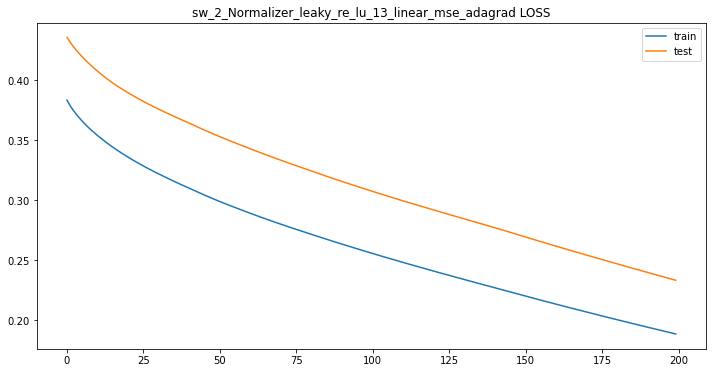


 sw_2_Normalizer_leaky_re_lu_13_linear_mse_adagrad 데이터 비교


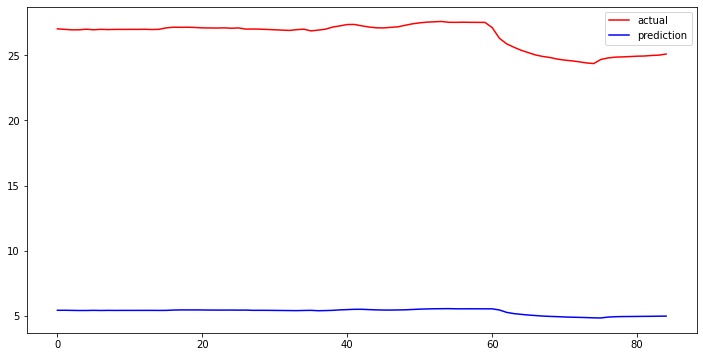

sw_2_Normalizer_leaky_re_lu_13_linear_mse_adagrad model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mse_adagrad metrics
mean_squared_error : 21.237046545979357
r2_score : -431.6921548886003
sw_2_Normalizer_leaky_re_lu_13_linear_mse_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mse
optimizer : rmsprop
Model: "sequential_684"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_684 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_684 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 9s - loss: 0.3417 - acc: 0.0021 - val_loss: 0.3672 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.2909 - acc: 0.0021 - val_loss

Epoch 69/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0238 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0237 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0236 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0217 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0217 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0217 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0216 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0216 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0216 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0216 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0215 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0215 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0215 - acc: 0.0021 - val_loss: 0.0028 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0214 - acc: 0.0

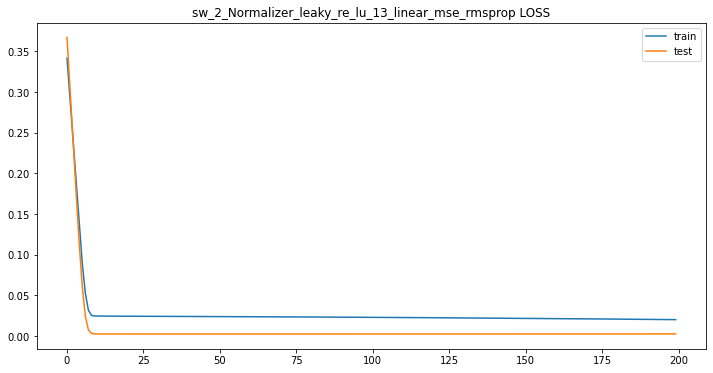


 sw_2_Normalizer_leaky_re_lu_13_linear_mse_rmsprop 데이터 비교


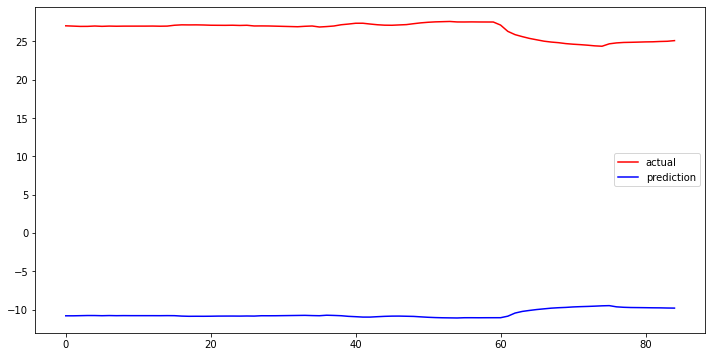

sw_2_Normalizer_leaky_re_lu_13_linear_mse_rmsprop model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mse_rmsprop metrics
mean_squared_error : 37.15640440989783
r2_score : -1323.518822182633
sw_2_Normalizer_leaky_re_lu_13_linear_mse_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mse
optimizer : gradient_descent
Model: "sequential_685"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_685 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_685 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.3602 - acc: 0.0021 - val_loss: 0.3798 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.3446 - acc: 0.0021 - 

Epoch 69/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0022 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0021 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_loss: 0.0020 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0241 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0239 - acc: 0.0021 - val_loss: 0.0018 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0239 - acc: 0.0

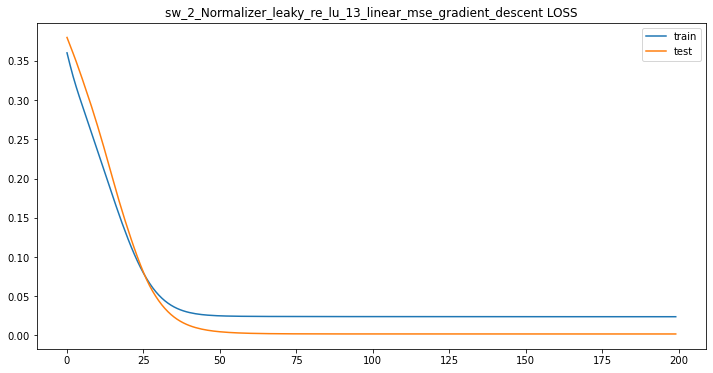


 sw_2_Normalizer_leaky_re_lu_13_linear_mse_gradient_descent 데이터 비교


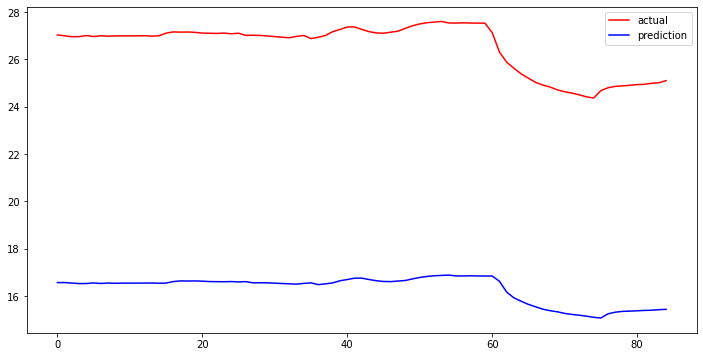

sw_2_Normalizer_leaky_re_lu_13_linear_mse_gradient_descent model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mse_gradient_descent metrics
mean_squared_error : 10.241769975638329
r2_score : -99.63309903739489
sw_2_Normalizer_leaky_re_lu_13_linear_mse_gradient_descent이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mae
optimizer : nadam
Model: "sequential_686"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_686 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_686 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 4s - loss: 0.5098 - acc: 0.0021 - val_loss: 0.5360 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4688

Epoch 68/200
32/32 - 0s - loss: 0.0615 - acc: 0.0021 - val_loss: 0.0293 - val_acc: 0.0000e+00
Epoch 69/200
32/32 - 0s - loss: 0.0616 - acc: 0.0021 - val_loss: 0.0290 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0615 - acc: 0.0021 - val_loss: 0.0261 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0307 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0615 - acc: 0.0021 - val_loss: 0.0247 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0609 - acc: 0.0021 - val_loss: 0.0273 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0295 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0613 - acc: 0.0021 - val_loss: 0.0252 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0608 - acc: 0.0021 - val_loss: 0.0275 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0609 - acc: 0.0021 - val_loss: 0.0261 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0608 - acc: 0.0021 - val_l

Epoch 155/200
32/32 - 0s - loss: 0.0497 - acc: 0.0021 - val_loss: 0.0352 - val_acc: 0.0000e+00
Epoch 156/200
32/32 - 0s - loss: 0.0492 - acc: 0.0021 - val_loss: 0.0348 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0489 - acc: 0.0021 - val_loss: 0.0347 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0491 - acc: 0.0021 - val_loss: 0.0307 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0484 - acc: 0.0021 - val_loss: 0.0309 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0481 - acc: 0.0021 - val_loss: 0.0335 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0478 - acc: 0.0021 - val_loss: 0.0345 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0480 - acc: 0.0021 - val_loss: 0.0345 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0474 - acc: 0.0021 - val_loss: 0.0348 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0473 - acc: 0.0021 - val_loss: 0.0341 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0474 - acc: 0.0

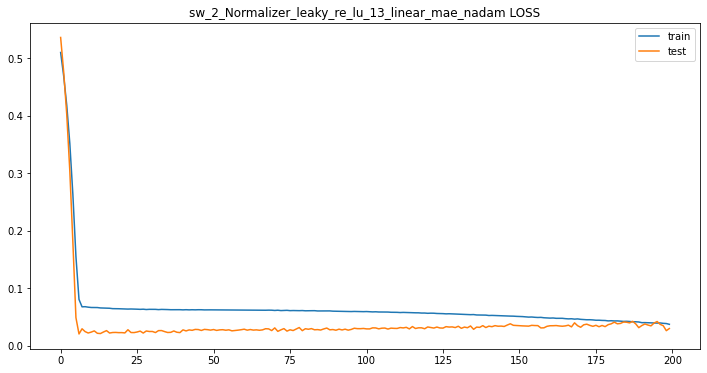


 sw_2_Normalizer_leaky_re_lu_13_linear_mae_nadam 데이터 비교


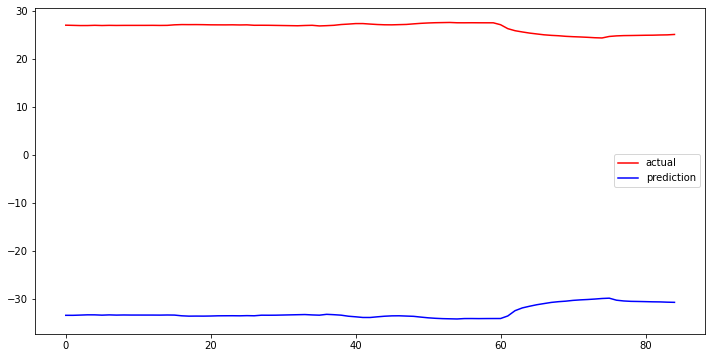

sw_2_Normalizer_leaky_re_lu_13_linear_mae_nadam model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mae_nadam metrics
mean_squared_error : 59.43977141427489
r2_score : -3388.572796075776
sw_2_Normalizer_leaky_re_lu_13_linear_mae_nadam이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mae
optimizer : adamax
Model: "sequential_687"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_687 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_687 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.5416 - acc: 0.0021 - val_loss: 0.5816 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5195 - acc: 0.0021 - val_loss: 0.5617

Epoch 69/200
32/32 - 0s - loss: 0.0624 - acc: 0.0021 - val_loss: 0.0162 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0623 - acc: 0.0021 - val_loss: 0.0156 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0170 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0623 - acc: 0.0021 - val_loss: 0.0154 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0172 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0623 - acc: 0.0021 - val_loss: 0.0158 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0168 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0160 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0621 - acc: 0.0021 - val_loss: 0.0167 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0164 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0190 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0184 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0603 - acc: 0.0021 - val_loss: 0.0198 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0604 - acc: 0.0021 - val_loss: 0.0174 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0601 - acc: 0.0021 - val_loss: 0.0190 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0603 - acc: 0.0021 - val_loss: 0.0177 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0602 - acc: 0.0021 - val_loss: 0.0178 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0601 - acc: 0.0021 - val_loss: 0.0199 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0604 - acc: 0.0021 - val_loss: 0.0191 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0603 - acc: 0.0021 - val_loss: 0.0189 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0602 - acc: 0.0

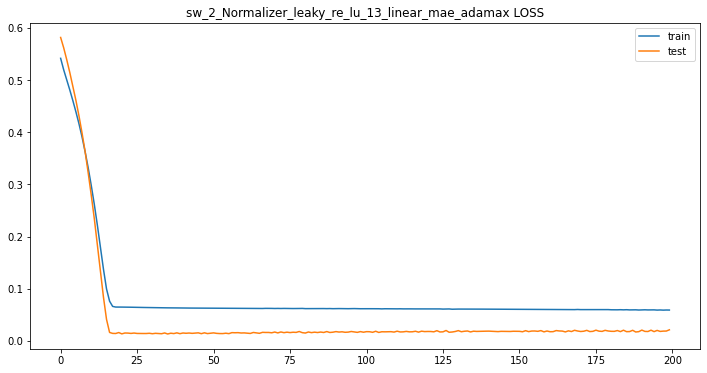


 sw_2_Normalizer_leaky_re_lu_13_linear_mae_adamax 데이터 비교


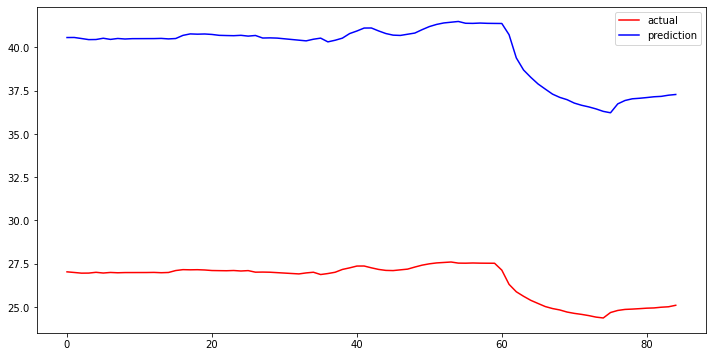

sw_2_Normalizer_leaky_re_lu_13_linear_mae_adamax model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adamax metrics
mean_squared_error : 13.282317856886545
r2_score : -168.25381424581576
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adamax이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mae
optimizer : adam
Model: "sequential_688"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_688 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_688 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.5200 - acc: 0.0021 - val_loss: 0.5459 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4793 - acc: 0.0021 - val_loss: 0.4

Epoch 69/200
32/32 - 0s - loss: 0.0656 - acc: 0.0021 - val_loss: 0.0110 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0620 - acc: 0.0021 - val_loss: 0.0279 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0649 - acc: 0.0021 - val_loss: 0.0154 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0626 - acc: 0.0021 - val_loss: 0.0285 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0647 - acc: 0.0021 - val_loss: 0.0150 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0626 - acc: 0.0021 - val_loss: 0.0301 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0651 - acc: 0.0021 - val_loss: 0.0123 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0623 - acc: 0.0021 - val_loss: 0.0303 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0657 - acc: 0.0021 - val_loss: 0.0131 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0623 - acc: 0.0021 - val_loss: 0.0338 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0657 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0619 - acc: 0.0021 - val_loss: 0.0159 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0579 - acc: 0.0021 - val_loss: 0.0324 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0614 - acc: 0.0021 - val_loss: 0.0136 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0334 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0608 - acc: 0.0021 - val_loss: 0.0157 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0579 - acc: 0.0021 - val_loss: 0.0353 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0614 - acc: 0.0021 - val_loss: 0.0129 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0577 - acc: 0.0021 - val_loss: 0.0357 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0619 - acc: 0.0021 - val_loss: 0.0159 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0585 - acc: 0.0021 - val_loss: 0.0411 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0629 - acc: 0.0

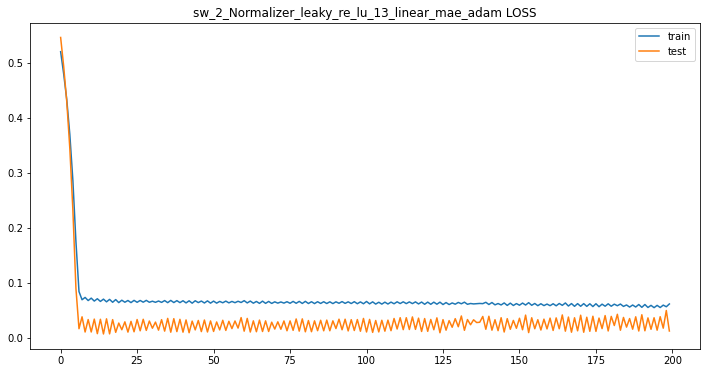


 sw_2_Normalizer_leaky_re_lu_13_linear_mae_adam 데이터 비교


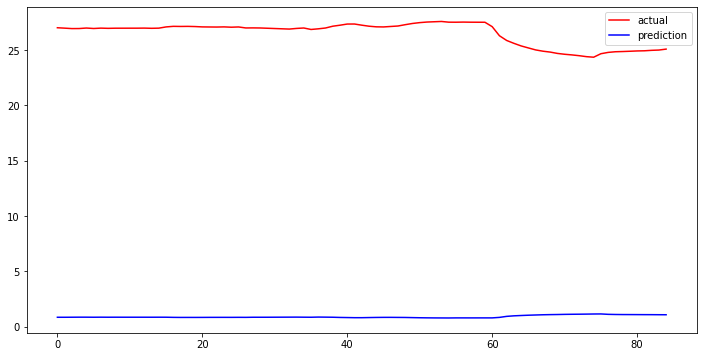

sw_2_Normalizer_leaky_re_lu_13_linear_mae_adam model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adam metrics
mean_squared_error : 25.672544260524585
r2_score : -631.3078713480376
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adam이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mae
optimizer : adagrad
Model: "sequential_689"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_689 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_689 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 6s - loss: 0.5404 - acc: 0.0021 - val_loss: 0.5958 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5379 - acc: 0.0021 - val_loss: 0.5931 

Epoch 69/200
32/32 - 0s - loss: 0.4664 - acc: 0.0021 - val_loss: 0.5039 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.4656 - acc: 0.0021 - val_loss: 0.5029 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.4649 - acc: 0.0021 - val_loss: 0.5019 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.4641 - acc: 0.0021 - val_loss: 0.5008 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.4634 - acc: 0.0021 - val_loss: 0.4998 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.4626 - acc: 0.0021 - val_loss: 0.4988 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.4619 - acc: 0.0021 - val_loss: 0.4978 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.4611 - acc: 0.0021 - val_loss: 0.4968 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.4604 - acc: 0.0021 - val_loss: 0.4958 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.4596 - acc: 0.0021 - val_loss: 0.4948 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.4589 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.4025 - acc: 0.0021 - val_loss: 0.4200 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.4017 - acc: 0.0021 - val_loss: 0.4191 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.4010 - acc: 0.0021 - val_loss: 0.4181 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.4003 - acc: 0.0021 - val_loss: 0.4172 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.3995 - acc: 0.0021 - val_loss: 0.4162 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.3988 - acc: 0.0021 - val_loss: 0.4153 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.3980 - acc: 0.0021 - val_loss: 0.4143 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.3973 - acc: 0.0021 - val_loss: 0.4134 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.3965 - acc: 0.0021 - val_loss: 0.4124 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.3958 - acc: 0.0021 - val_loss: 0.4115 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.3951 - acc: 0.0

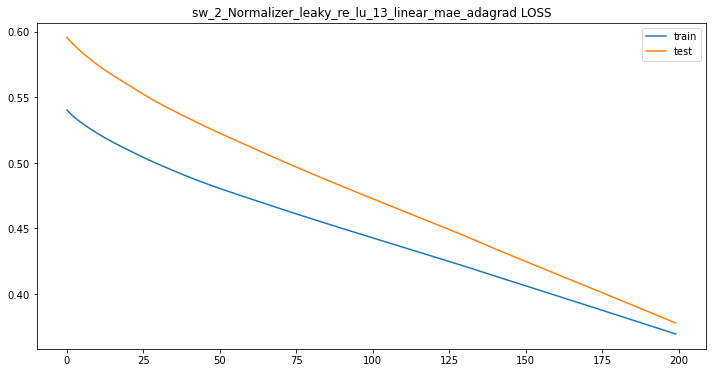


 sw_2_Normalizer_leaky_re_lu_13_linear_mae_adagrad 데이터 비교


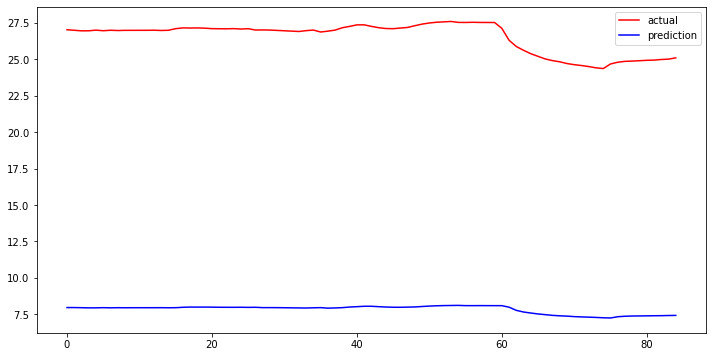

sw_2_Normalizer_leaky_re_lu_13_linear_mae_adagrad model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adagrad metrics
mean_squared_error : 18.725662916440534
r2_score : -335.4070747088239
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adagrad이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mae
optimizer : rmsprop
Model: "sequential_690"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_690 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_690 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 4s - loss: 0.5299 - acc: 0.0021 - val_loss: 0.5504 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.4860 - acc: 0.0021 - val_loss

Epoch 69/200
32/32 - 0s - loss: 0.0623 - acc: 0.0021 - val_loss: 0.0278 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0287 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0284 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0621 - acc: 0.0021 - val_loss: 0.0299 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0625 - acc: 0.0021 - val_loss: 0.0292 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0285 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0621 - acc: 0.0021 - val_loss: 0.0286 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0621 - acc: 0.0021 - val_loss: 0.0314 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0621 - acc: 0.0021 - val_loss: 0.0276 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0622 - acc: 0.0021 - val_loss: 0.0278 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0619 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0582 - acc: 0.0021 - val_loss: 0.0305 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0584 - acc: 0.0021 - val_loss: 0.0305 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0585 - acc: 0.0021 - val_loss: 0.0309 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0582 - acc: 0.0021 - val_loss: 0.0298 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0580 - acc: 0.0021 - val_loss: 0.0319 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0284 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0580 - acc: 0.0021 - val_loss: 0.0300 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0581 - acc: 0.0021 - val_loss: 0.0279 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0576 - acc: 0.0021 - val_loss: 0.0330 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0577 - acc: 0.0021 - val_loss: 0.0301 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0575 - acc: 0.0

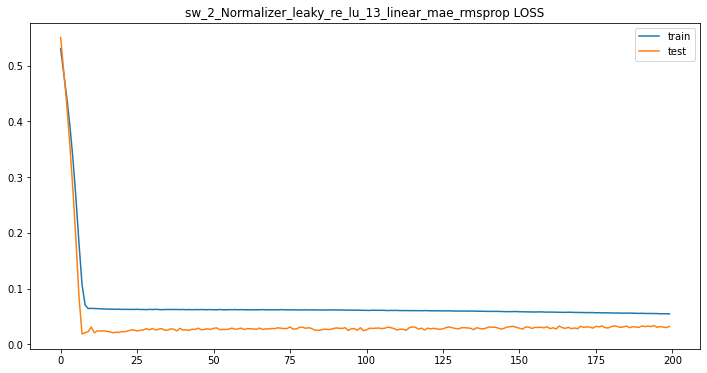


 sw_2_Normalizer_leaky_re_lu_13_linear_mae_rmsprop 데이터 비교


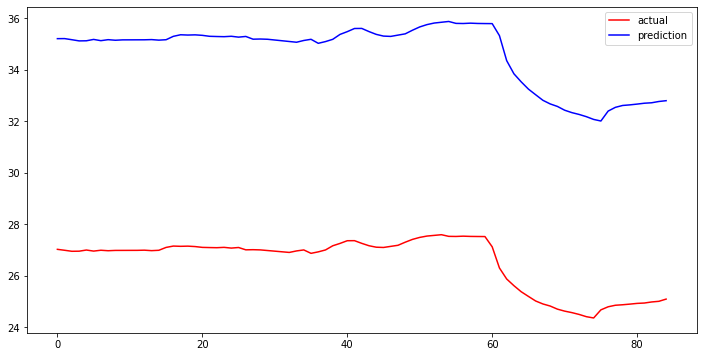

sw_2_Normalizer_leaky_re_lu_13_linear_mae_rmsprop model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mae_rmsprop metrics
mean_squared_error : 8.11587810510928
r2_score : -62.19193972527947
sw_2_Normalizer_leaky_re_lu_13_linear_mae_rmsprop이 완료되었습니다.
LSTM activation : leaky_re_lu_13
Dense activation : linear
loss : mae
optimizer : gradient_descent
Model: "sequential_691"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_691 (LSTM)              (None, 1, 60)             15120     
_________________________________________________________________
dense_691 (Dense)            (None, 1, 1)              61        
Total params: 15,181
Trainable params: 15,181
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
32/32 - 7s - loss: 0.5443 - acc: 0.0021 - val_loss: 0.5956 - val_acc: 0.0000e+00
Epoch 2/200
32/32 - 0s - loss: 0.5359 - acc: 0.0021 - v

Epoch 69/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0212 - val_acc: 0.0000e+00
Epoch 70/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0209 - val_acc: 0.0000e+00
Epoch 71/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_loss: 0.0203 - val_acc: 0.0000e+00
Epoch 72/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0201 - val_acc: 0.0000e+00
Epoch 73/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0194 - val_acc: 0.0000e+00
Epoch 74/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_loss: 0.0201 - val_acc: 0.0000e+00
Epoch 75/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_loss: 0.0204 - val_acc: 0.0000e+00
Epoch 76/200
32/32 - 0s - loss: 0.0611 - acc: 0.0021 - val_loss: 0.0197 - val_acc: 0.0000e+00
Epoch 77/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_loss: 0.0201 - val_acc: 0.0000e+00
Epoch 78/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_loss: 0.0198 - val_acc: 0.0000e+00
Epoch 79/200
32/32 - 0s - loss: 0.0610 - acc: 0.0021 - val_l

Epoch 156/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0231 - val_acc: 0.0000e+00
Epoch 157/200
32/32 - 0s - loss: 0.0606 - acc: 0.0021 - val_loss: 0.0236 - val_acc: 0.0000e+00
Epoch 158/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0225 - val_acc: 0.0000e+00
Epoch 159/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0220 - val_acc: 0.0000e+00
Epoch 160/200
32/32 - 0s - loss: 0.0604 - acc: 0.0021 - val_loss: 0.0214 - val_acc: 0.0000e+00
Epoch 161/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0228 - val_acc: 0.0000e+00
Epoch 162/200
32/32 - 0s - loss: 0.0604 - acc: 0.0021 - val_loss: 0.0218 - val_acc: 0.0000e+00
Epoch 163/200
32/32 - 0s - loss: 0.0604 - acc: 0.0021 - val_loss: 0.0231 - val_acc: 0.0000e+00
Epoch 164/200
32/32 - 0s - loss: 0.0605 - acc: 0.0021 - val_loss: 0.0234 - val_acc: 0.0000e+00
Epoch 165/200
32/32 - 0s - loss: 0.0603 - acc: 0.0021 - val_loss: 0.0238 - val_acc: 0.0000e+00
Epoch 166/200
32/32 - 0s - loss: 0.0605 - acc: 0.0

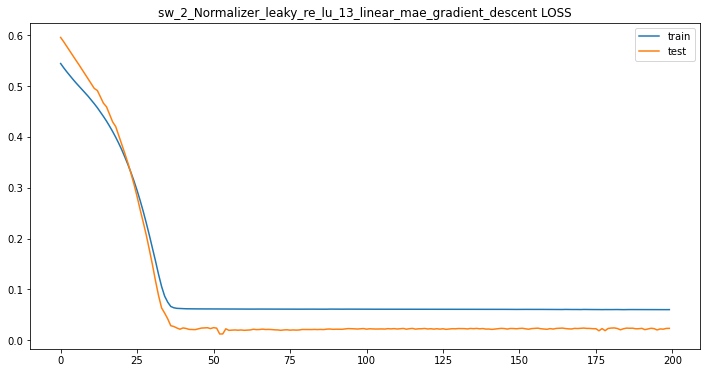


 sw_2_Normalizer_leaky_re_lu_13_linear_mae_gradient_descent 데이터 비교


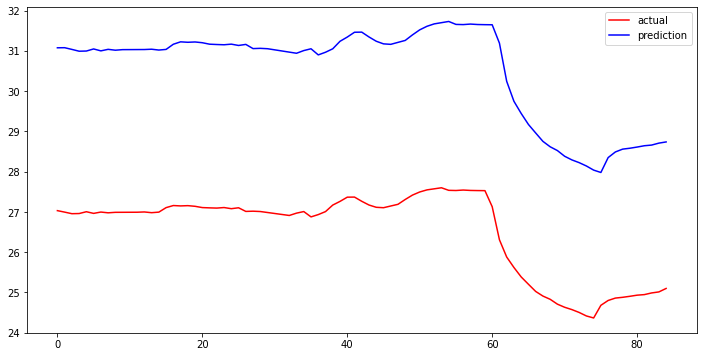

sw_2_Normalizer_leaky_re_lu_13_linear_mae_gradient_descent model_prediction이 완료되었습니다.
sw_2_Normalizer_leaky_re_lu_13_linear_mae_gradient_descent metrics
mean_squared_error : 3.9981948832596848
r2_score : -14.336231385269029
sw_2_Normalizer_leaky_re_lu_13_linear_mae_gradient_descent이 완료되었습니다.


,mean_squared_error,r2_score
sw_2_MinMaxScaler_relu_linear_mse_nadam,26.494490,-672.444618
sw_2_MinMaxScaler_relu_linear_mse_adamax,30.183547,-873.040013
sw_2_MinMaxScaler_relu_linear_mse_adam,18.436819,-325.108936
sw_2_MinMaxScaler_relu_linear_mse_adagrad,16.677455,-265.839623
sw_2_MinMaxScaler_relu_linear_mse_rmsprop,33.445503,-1072.164248
...,...,...
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adamax,13.282318,-168.253814
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adam,25.672544,-631.307871
sw_2_Normalizer_leaky_re_lu_13_linear_mae_adagrad,18.725663,-335.407075
sw_2_Normalizer_leaky_re_lu_13_linear_mae_rmsprop,8.115878,-62.191940


,mean_squared_error,r2_score
sw_2_RobustScaler_relu_linear_mse_gradient_descent,0.434590,0.818804
sw_2_Normalizer_relu_linear_mae_rmsprop,0.759066,0.447224
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_gradient_descent,0.867188,0.278532
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_gradient_descent,1.319146,-0.669463
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_gradient_descent,1.711095,-1.808919
...,...,...
sw_2_Normalizer_relu_linear_mse_adam,73.324900,-5157.147434
sw_2_Normalizer_p_re_lu_13_linear_mse_adam,78.021485,-5839.085213
sw_2_Normalizer_relu_linear_mae_nadam,78.161117,-5860.007649
sw_2_Normalizer_p_re_lu_13_linear_mse_nadam,91.037193,-7950.123697


,mean_squared_error,r2_score
sw_2_RobustScaler_relu_linear_mse_gradient_descent,0.434590,0.818804
sw_2_Normalizer_relu_linear_mae_rmsprop,0.759066,0.447224
sw_2_MinMaxScaler_p_re_lu_9_linear_mse_gradient_descent,0.867188,0.278532
sw_2_RobustScaler_leaky_re_lu_12_linear_mae_gradient_descent,1.319146,-0.669463
sw_2_RobustScaler_leaky_re_lu_12_linear_mse_gradient_descent,1.711095,-1.808919
...,...,...
sw_2_Normalizer_relu_linear_mse_adam,73.324900,-5157.147434
sw_2_Normalizer_p_re_lu_13_linear_mse_adam,78.021485,-5839.085213
sw_2_Normalizer_relu_linear_mae_nadam,78.161117,-5860.007649
sw_2_Normalizer_p_re_lu_13_linear_mse_nadam,91.037193,-7950.123697


In [ ]:
# result_df = pd.DataFrame()
# result_df = pd.concat([result_df, trans_df[['_date']]], axis=1)

i = 'C001'
global spot
spot = i

upper_data = trans_df[['_date', i, 'rain']][(trans_df._date >= pd.Timestamp(date_df.loc[0, f'{i}_start'])) & (trans_df._date <= pd.Timestamp((date_df[f'{i}_finish'][date_df[f'{i}_null'] == date_df[f'{i}_null'].max()]).values[0]))]
lower_data = trans_df[['_date', i, 'rain']][trans_df._date >= pd.Timestamp(date_df.loc[(date_df[f'{i}_finish'][date_df[f'{i}_null'] == date_df[f'{i}_null'].max()].index + 1), f'{i}_start'].values[0])]

upper_data[[i]] = upper_data[[i]].interpolate(method='linear')
lower_data[[i]] = lower_data[[i]].interpolate(method='linear')

if len(upper_data) >= len(lower_data):
    if len(upper_data) >= 365:
        train_df = set_params(upper_data.iloc[:, 1:])
        test_df = set_params(lower_data.iloc[:, 1:])
        split_data(train_df, test_df)

    else:
        print('Data are too short')

elif len(upper_data) < len(lower_data):
    if len(lower_data) >= 365:
        train_df = lower_data.iloc[:, 1:]
        test_df = upper_data.iloc[:, 1:]
        split_data(train_df, test_df)

    else:
        print('Data are too short')

##################################################

In [ ]:
def start_shift():
  # 개인 설정 모델 이름, shift 횟수, 원본 데이터는 global 변수 설정
  global modelname, n_shift, model_data

  # 파일 이름(경로 입력)
  filename = '/content/drive/MyDrive/soda/지하수수위.csv' # input("학습 데이터 경로 :")

  # 개인 설정 모델 이름 입력
  modelname = 'sw' # input("저장할 모델 이름 : ")

  # shift 횟수 입력(1번을 해도 함수에는 2로 입력되기 때문에 + 1)
  n_shift = int(input("데이터 이동 횟수 :")) + 1

  # 파일 불러오기(날짜 데이터 형식에 맞춤)
  model_data = pd.read_csv(filename, encoding = 'euc-kr', parse_dates=["date"])

  # 파일 정보 출력
  display(model_data.info())

  trans = trans_dates(model_data)

  # shift된 데이터 출력
  display(trans)

  split_data(trans)